In [1]:
import os
import pandas as pd
import numpy as np
import datetime
import time
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from my_ipca import InstrumentedPCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
from sklearn.preprocessing import RobustScaler
import copy
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
import sys
from collections import defaultdict
from IPython.display import display, Latex
from cvxopt import matrix, solvers, blas
import pickle
from pmdarima import auto_arima
from statsmodels.stats.diagnostic import acorr_ljungbox
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.svm import SVR

In [2]:
# 1673 coins with OHLC and volume
directory_path = 'C:/Users/86152/Desktop/jupyter code/Dissertation/TokenDataFilteredNew'  # 你的csv文件的路径
file_names = os.listdir(directory_path)
csv_files = [f for f in file_names if f.endswith('.csv')]  # 只保留csv文件

dataframes = []  # 用来储存每个csv文件的DataFrame
for csv_file in csv_files:
    df = pd.read_csv(os.path.join(directory_path, csv_file))
    df['Currency'] = csv_file[:-4]  # 添加一个新列来表示加密货币的名字
    dataframes.append(df)

combined_df = pd.concat(dataframes)  # 将所有的DataFrame合并为一个

combined_df.set_index(['Currency', 'time'], inplace=True) 

In [3]:
# change to pandas timestamp
combined_df.reset_index(level='time', inplace=True)  # 重置 'time' 索引
combined_df['time'] = pd.to_datetime(combined_df['time'], unit='s')  # 转换 Unix 时间戳为可读日期时间
combined_df.set_index('time', append=True, inplace=True)  # 将 'time' 列重新设为索引

combined_df.sort_index(inplace=True)

In [4]:
rf_df = pd.read_csv('^TNX.csv')

# 将'Date'列转换为日期类型并设置为索引
rf_df['Date'] = pd.to_datetime(rf_df['Date'])
# 将Date设为索引
rf_df.set_index('Date', inplace=True)

# 使日期索引连续
rf_df = rf_df.asfreq('D')

# 使用线性插值填充缺失的数据
rf_df['Close'] = rf_df['Close'].interpolate(method='linear')
rf_df['daily_return'] = rf_df['Close'].pct_change()

In [5]:
# 1. Extract unique dates from combined_df
unique_dates = combined_df.index.get_level_values('time').unique()

# 2. Use these dates to filter rf_df
rf_df = rf_df[rf_df.index.isin(unique_dates)]

----
### Data pre-processing

In [6]:
'''columns_to_check = ['open', 'close', 'high', 'low', 'volumeto', 'volumefrom', 'current_supply']

def find_consecutive_zeros(data):
    """Function to identify columns with three consecutive zeros after the first non-zero 'close'."""
    # Find the index for the first non-zero 'close'
    first_non_zero_idx = data['close'].ne(0).idxmax()
    data = data.loc[first_non_zero_idx:]
    
    consecutive_zero_columns = []
    for column in columns_to_check:
        mask = (data[column] == 0) | (data[column].isna())
        consecutive_mask = mask & mask.shift(-1) & mask.shift(-2)
        if consecutive_mask.any():
            consecutive_zero_columns.append(column)
    return consecutive_zero_columns

# Apply the function to each currency group
currencies_with_consecutive_zeros = combined_df.groupby(level='Currency').apply(find_consecutive_zeros)

# Identify currencies to remove
currencies_to_remove = currencies_with_consecutive_zeros[currencies_with_consecutive_zeros.apply(len) > 0].index.tolist()

# Drop these currencies from the original DataFrame
combined_df = combined_df.drop(currencies_to_remove, level='Currency')'''

'columns_to_check = [\'open\', \'close\', \'high\', \'low\', \'volumeto\', \'volumefrom\', \'current_supply\']\n\ndef find_consecutive_zeros(data):\n    """Function to identify columns with three consecutive zeros after the first non-zero \'close\'."""\n    # Find the index for the first non-zero \'close\'\n    first_non_zero_idx = data[\'close\'].ne(0).idxmax()\n    data = data.loc[first_non_zero_idx:]\n    \n    consecutive_zero_columns = []\n    for column in columns_to_check:\n        mask = (data[column] == 0) | (data[column].isna())\n        consecutive_mask = mask & mask.shift(-1) & mask.shift(-2)\n        if consecutive_mask.any():\n            consecutive_zero_columns.append(column)\n    return consecutive_zero_columns\n\n# Apply the function to each currency group\ncurrencies_with_consecutive_zeros = combined_df.groupby(level=\'Currency\').apply(find_consecutive_zeros)\n\n# Identify currencies to remove\ncurrencies_to_remove = currencies_with_consecutive_zeros[currencies_with

In [7]:
columns_to_check = ['high', 'low', 'open', 'volumefrom', 'volumeto', 'close', 'new_addresses', 'active_addresses', 'current_supply']

In [8]:
def trim_dataframe(df1):
    df = df1.copy()
    
    # 初始化时间点为None
    first_valid_date = None
    
    # 遍历每一列
    for col in columns_to_check:
        # 找到第一个非NaN非0的时间点
        first_valid = df.loc[(~df[col].isna()) & (df[col] != 0), col].index[0] if not df.loc[(~df[col].isna()) & (df[col] != 0), col].empty else None

        if first_valid_date is None or (first_valid and first_valid > first_valid_date):
            first_valid_date = first_valid

    # 使用找到的时间点裁剪DataFrame
    if first_valid_date:
        # 获取DataFrame的第一个时间点
        first_date = df.index.min()

        # 找到first_valid_date之前的时间点
        previous_date = df.loc[:first_valid_date].index[-2] if first_valid_date != first_date else None

        if previous_date:
            df.loc[:previous_date] = np.nan

    return df

combined_df = combined_df.groupby(level='Currency', group_keys=False).apply(trim_dataframe)

In [9]:
num_currencies = combined_df.index.get_level_values('Currency').nunique()
print(num_currencies)

127


In [10]:
# 定义一个函数，用于检查每个组中的缺失值
def filter_func(group):
    volumefrom_zero_count = (group['volumefrom'] == 0).sum()
    return  volumefrom_zero_count < 1000

# 应用过滤器
combined_df = combined_df.groupby('Currency').filter(filter_func)

In [11]:
num_currencies = combined_df.index.get_level_values('Currency').nunique()
print(num_currencies)

95


In [12]:
def trim_dataframe(df1):
    df = df1.copy()
    
    # 初始化时间点为None
    last_zero_date = None
    
    # 找到'close'列中最后一个0值的时间点
    last_zero_date = df.loc[df['close'] == 0, 'close'].index[-1] if not df.loc[df['close'] == 0, 'close'].empty else None

    # 使用找到的时间点裁剪DataFrame
    if last_zero_date is not None:
        df.loc[:last_zero_date] = np.nan

    return df

# 假设combined_df是一个具有多层索引（MultiIndex）的DataFrame，其中第一层是货币名称（'Currency'）
combined_df = combined_df.groupby(level='Currency', group_keys=False).apply(trim_dataframe)

In [13]:
def replace_30_consecutive_zeros_with_nan(df):
    for col in ['active_addresses',  'new_addresses']:
        series = df[col]
        first_valid_index = series.first_valid_index()
        last_valid_index = series.last_valid_index()

        if first_valid_index is None or last_valid_index is None:
            continue

        series1 = series.loc[first_valid_index:last_valid_index].copy()
        zero_count = 0
        zero_start_index = None
        next_index = None

        for idx, val in series1.iteritems():
            if val == 0:
                zero_count += 1
                if zero_start_index is None:
                    zero_start_index = idx
            else:
                next_index = idx
                if zero_count >= 7 and df.loc[next_index, col]<10:
                    df.loc[zero_start_index:next_index, col] = np.nan
                    
                zero_count = 0
                zero_start_index = None
                
        if zero_count:
            df.loc[zero_start_index:last_valid_index, col] = np.nan
            
    return df

# 假设 combined_df 是你的双索引DataFrame
combined_df = combined_df.groupby('Currency', group_keys=False).apply(replace_30_consecutive_zeros_with_nan)

C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2128563175.py:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2128563175.py:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2128563175.py:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2128563175.py:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2128563175.py:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  fo

In [14]:
def replace_30_consecutive_zeros_with_nan(df):
    for col in ['volumefrom']:
        series = df[col]
        first_valid_index = series.first_valid_index()
        last_valid_index = series.last_valid_index()

        if first_valid_index is None or last_valid_index is None:
            continue

        series1 = series.loc[first_valid_index:last_valid_index].copy()
        zero_count = 0
        zero_start_index = None

        for idx, val in series1.iteritems():
            if val == 0:
                zero_count += 1
                if zero_start_index is None:
                    zero_start_index = idx
            else:
                if zero_count >= 30:
                    df.loc[zero_start_index:, :] = np.nan
                    break  # No need to continue for this column
                zero_count = 0
                zero_start_index = None

        if zero_count:
            df.loc[zero_start_index:last_valid_index, :] = np.nan
            
    return df

# 假设 combined_df 是你的双索引DataFrame
combined_df = combined_df.groupby('Currency', group_keys=False).apply(replace_30_consecutive_zeros_with_nan)

C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2204625595.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2204625595.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2204625595.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2204625595.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, val in series1.iteritems():
C:\Users\86152\AppData\Local\Temp\ipykernel_10664\2204625595.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  fo

In [15]:
num_currencies = combined_df.index.get_level_values('Currency').nunique()
print(num_currencies)

95


In [16]:
def check_time_overlap(df):
    last_non_nan_current_supply = df.loc[~df['current_supply'].isna(), 'current_supply'].index.get_level_values('time').max()
    first_non_nan_volumetotal = df.loc[~df['volumefrom'].isna(), 'volumefrom'].index.get_level_values('time').min()

    if last_non_nan_current_supply is None or first_non_nan_volumetotal is None:
        return False

    return last_non_nan_current_supply >= first_non_nan_volumetotal

# 假设combined_df是您的DataFrame，其中包含多层索引，第一层是'Currency'
valid_currencies = combined_df.groupby(level='Currency', group_keys=False).apply(check_time_overlap)

# 仅保留那些时间有交叉的货币
valid_currencies = valid_currencies[valid_currencies].index.tolist()
combined_df = combined_df.loc[combined_df.index.get_level_values('Currency').isin(valid_currencies)]

In [17]:
num_currencies = combined_df.index.get_level_values('Currency').nunique()
print(num_currencies)

94


In [18]:
def interpolate_zeros(series):
    # Find the last valid index which is not 0 and not NaN
    first_valid_index = series[series != 0].first_valid_index()
    
    # If there's no such index, return the series as is
    if first_valid_index is None:
        return series

    # Get the integer location of this index
    first_index = series.index.get_loc(first_valid_index)
    
    # Create a new series limited to this index
    limited_series = series.iloc[first_index:]
    
    limited_series[limited_series.index[limited_series == 0]] = np.nan

    # Interpolate the new series
    interpolated_series = limited_series.interpolate()
    interpolated_series.fillna(method='bfill', inplace=True)
    interpolated_series.fillna(method='ffill', inplace=True)
    
    # Update the original series
    series.iloc[first_index:] = interpolated_series

    return series

# 对每个货币和每一列进行处理
for col in ['current_supply']:
    combined_df[col] = combined_df.groupby('Currency', group_keys=False)[col].apply(interpolate_zeros)

In [19]:
top_50_currencies_df = combined_df
top_50_currencies_df = top_50_currencies_df.sort_index()
top_50_currencies_df.index.get_level_values('Currency').unique()
top_50_currencies_df['mark_cap'] = top_50_currencies_df['close'] * top_50_currencies_df['current_supply']

In [20]:
def compute_weight(x):
    result = pd.Series(0, index=x.index)
    valid_data = x.dropna()
    result.loc[valid_data.index] = valid_data / valid_data.sum()
    return result

top_50_currencies_df['weight'] = top_50_currencies_df.groupby(level='time', group_keys=False)['mark_cap'].transform(compute_weight)

In [21]:
num_currencies = top_50_currencies_df.index.get_level_values('Currency').nunique()
print(num_currencies)

94


In [22]:
# 创建一个新列"volume_market_cap_ratio"，包含交易量(volume)和市值(market capitalization)的比率
top_50_currencies_df['volume_market_cap_ratio'] = top_50_currencies_df['volumefrom'] / top_50_currencies_df['current_supply']

# 筛选出volume_market_cap_ratio大于1的货币
filtered_df = top_50_currencies_df[top_50_currencies_df['volume_market_cap_ratio'] > 1]

# 对货币进行分组，并统计每种货币大于1的volume_market_cap_ratio出现的次数
grouped = filtered_df.groupby('Currency', group_keys=False).size()

# 筛选出出现次数大于1的货币
invalid_currencies = grouped[grouped > 1].index.tolist()

In [23]:
top_50_currencies_df.loc[top_50_currencies_df['volume_market_cap_ratio'] > 1, 'volumeto'] = 1e-10

In [24]:
top_50_currencies_df.loc[top_50_currencies_df['volume_market_cap_ratio'] > 1, 'volumefrom'] = 1e-10

In [25]:
def fill_zero_volumefrom(group):
    
    group = group.copy()  # 复制数据以防止修改原始数据

    zero_volume_indices = group[(group['volumefrom'] == 0)|(group['volumefrom'] == 1e-10)].index
    zero_dates = group.loc[zero_volume_indices].index.get_level_values('time')
    
    if len(zero_volume_indices) == 0:
        return group
    currency = group.loc[zero_volume_indices].index.get_level_values('Currency')[0]  # Assuming all rows in the group have the same currency
    
    # 如果有连续为0的日期，找出这些连续的序列
    continuous_zero_sequences = []
    current_sequence = []
    
    for i, current_date in enumerate(zero_dates):
        if i == 0 or (zero_dates[i] - zero_dates[i-1]).days == 1:
            current_sequence.append(current_date)
        else:
            continuous_zero_sequences.append(current_sequence)
            current_sequence = [current_date]
            
    if current_sequence:
        continuous_zero_sequences.append(current_sequence)
    
    # 使用开始连续为0的前一天，和不在连续为0的第一天来填充
    for sequence in continuous_zero_sequences:
        if not sequence:
            continue  # Skip empty sequences

        start_date = sequence[0] - pd.Timedelta(days=1)
        end_date = sequence[-1] + pd.Timedelta(days=1)
        
        # Check if start_date and end_date actually exist in the index
        if (currency, start_date) in group.index and (currency, end_date) in group.index:
            start_close = group.loc[(currency, start_date), 'close']
            end_open = group.loc[(currency, end_date), 'open']

            for zero_date in sequence:
                group.loc[(currency, zero_date), 'open'] = start_close
                group.loc[(currency, zero_date), 'close'] = end_open
                group.loc[(currency, zero_date), 'high'] = max(start_close, end_open)
                group.loc[(currency, zero_date), 'low'] = min(start_close, end_open)
        else:
            print(f"Skipping sequence from {start_date} to {end_date} as they are not in the index.")
    
    return group

# 使用groupby和apply方法
top_50_currencies_df = top_50_currencies_df.groupby('Currency', group_keys=False).apply(fill_zero_volumefrom)

Skipping sequence from 2023-08-15 00:00:00 to 2023-08-20 00:00:00 as they are not in the index.


In [26]:
top_50_currencies_df.loc[top_50_currencies_df['volumefrom'] == 1e-10, 'volumefrom'] = np.nan
top_50_currencies_df.loc[top_50_currencies_df['volumeto'] == 1e-10, 'volumeto'] = np.nan

In [27]:
def interpolate_zeros(series):
    # Find the last valid index which is not 0 and not NaN
    last_valid_index = series[series != 0].last_valid_index()
    first_valid_index = series[series != 0].first_valid_index()
    
    # If there's no such index, return the series as is
    if last_valid_index is None:
        return series

    # Get the integer location of this index
    last_index = series.index.get_loc(last_valid_index) + 1
    first_index = series.index.get_loc(first_valid_index)
    
    # Create a new series limited to this index
    limited_series = series.iloc[first_index:last_index]

    # Interpolate the new series
    interpolated_series = limited_series.interpolate()
    interpolated_series.fillna(method='bfill', inplace=True)
    
    # Update the original series
    series.iloc[first_index:last_index] = interpolated_series

    return series

# 对每个货币和每一列进行处理
for col in ['active_addresses', 'new_addresses', 'volumefrom', 'volumeto']:
    combined_df[col] = combined_df.groupby('Currency', group_keys=False)[col].apply(interpolate_zeros)

In [28]:
top_50_currencies_df['volumeTotal'] = top_50_currencies_df['close'] * top_50_currencies_df['volumefrom'] + top_50_currencies_df['volumeto']

In [29]:
num_currencies = top_50_currencies_df.index.get_level_values('Currency').nunique()
print(num_currencies)

94


In [30]:
top_50_currencies_df.drop('conversionType', axis=1, inplace=True)

In [31]:
top_50_currencies_df.drop('conversionSymbol', axis=1, inplace=True)

In [32]:
def handle_outliers(group1):
    group = group1.copy()
    non_nan_ind = ~np.any(np.isnan(group), axis=1)
    group = group[non_nan_ind]
    
    for column in ['volumefrom', 'volumeto']:
        index = group[group[column] != 0].index
        group2 = group.loc[index].copy()  # 创建一个副本以避免SettingWithCopyWarning
        Q1 = group2[column].quantile(0.005)
        Q3 = group2[column].quantile(0.995)
        
        lower_bound = Q1
        upper_bound = Q3
        
        group2[column] = np.where((group2[column] < lower_bound), lower_bound, group2[column])
        group2[column] = np.where((group2[column] > upper_bound), upper_bound, group2[column])
        
        group.loc[index, column] = group2[column]  # 使用.loc一次设置行和列
    
    group1.loc[non_nan_ind] = group
    return group1

top_50_currencies_df = top_50_currencies_df.groupby(level=0, group_keys=False).apply(handle_outliers)

-----

In [33]:
def calculate_returns(group1):
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = group.loc[(~group['close'].isna()) & (group['close'] != 0), 'close'].index[0]
    
    # 根据start_index裁剪数据框架
    group = group.loc[start_index:]
    
    group['return'] = group['close'].pct_change()
    
    # Replace inf with NaN
    group['return'].replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Back fill NaN values
    group['return'].fillna(method='bfill', inplace=True)
    
    # Update the original df with the calculations from valid_df
    group1.loc[start_index:, 'return'] = group['return']
    
    return group1

top_50_currencies_df = top_50_currencies_df.groupby(level=0, group_keys=False).apply(calculate_returns)

In [34]:
def handle_outliers(group1):
    group = group1.copy()
    non_nan_ind = ~np.any(np.isnan(group), axis=1)
    group = group[non_nan_ind]
    
    for column in ['return']:
        index = group[group[column] != 0].index
        group2 = group.loc[index].copy()  # 创建一个副本以避免SettingWithCopyWarning
        Q3 = group2[column].quantile(0.99)

        upper_bound = Q3
        
        group2[column] = np.where((group2[column] > upper_bound), upper_bound, group2[column])
        
        group.loc[index, column] = group2[column]  # 使用.loc一次设置行和列
    
    group1.loc[non_nan_ind] = group
    
    return group1

top_50_currencies_df = top_50_currencies_df.groupby(level=0, group_keys=False).apply(handle_outliers)

In [35]:
def calculate_excess_returns(group1):
    
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 查找首个非NaN和非零的'close'值的索引
    start_time = group.loc[(~group['close'].isna()) & (group['close'] != 0), 'close'].index.get_level_values('time')[0]
    
    # 根据start_time裁剪数据框架
    group = group.loc[pd.IndexSlice[:, start_time:], :]
    
    # 从rf_df中取出相应的日回报数据
    group_rf = rf_df.loc[start_time:]
    
    # 确保 group 和 group_rf 的索引对齐
    group_rf = group_rf.reindex(group.index.get_level_values('time'))
    
    group['excess_return'] = group['return'] - group_rf['daily_return']
    
    # Update the original df with the calculations from valid_df
    group1.loc[pd.IndexSlice[:, start_time:], 'excess_return'] = group['excess_return']
    
    return group1

In [36]:
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_excess_returns)

In [37]:
# Then, calculate the weighted return for each asset
top_50_currencies_df['weighted_return'] = top_50_currencies_df['return'] * top_50_currencies_df['weight']

# Calculate the return of the market portfolio for each day
market_return = top_50_currencies_df.groupby(level='time', group_keys=False)['weighted_return'].sum()

# Calculate the excess return, i.e., the market return minus the risk-free rate
excess_mkt_return = market_return - rf_df['daily_return']

In [38]:
# 创建保存CSV文件的文件夹，如果不存在的话
folder_name = "variable_csvs"
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# 按照Currency分组并保存每个组为一个CSV文件
for name, group in top_50_currencies_df.groupby(level='Currency', group_keys=False):
    file_path = os.path.join(folder_name, f"{name}.csv")
    group.to_csv(file_path)

------
### Construct characteristics

#### 1. new_add

In [39]:
# 创建一个新的DataFrame，只包含 volumeTotal 列
depend_variable_df = top_50_currencies_df[['new_addresses']].copy()

# 确保新的DataFrame有 double index
depend_variable_df = depend_variable_df.reset_index()
depend_variable_df.set_index(['Currency', 'time'], inplace=True)

#### 2. active_add

In [40]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['active_addresses']])

#### 3. bm

In [41]:
def calculate_network_to_market_value(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:]
    
    # Calculate cumulative unique addresses
    valid_df['cumulative_unique_addresses'] = valid_df['new_addresses'].cumsum()
    
    # Calculate network-to-market value
    valid_df['network_to_market_value'] = valid_df['cumulative_unique_addresses'] / (valid_df['current_supply']*valid_df['close'])

    # Update the original dataframe with the calculated values
    df1.loc[start_index:, 'cumulative_unique_addresses'] = valid_df['cumulative_unique_addresses']
    df1.loc[start_index:, 'network_to_market_value'] = valid_df['network_to_market_value']

    return df1

# Apply the function to each group of cryptocurrencies
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_network_to_market_value)

In [42]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['network_to_market_value']])

#### 4. volume

In [43]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['volumeTotal']])

#### 5. size

In [44]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['mark_cap']])
depend_variable_df.rename(columns={'mark_cap': 'size'}, inplace=True)

#### 6. rvol

In [45]:
def compute_volatility(df1, N=2):
    df = df1.copy()
    
    # Find the index of the first non-NaN and non-zero 'close' value
    first_valid_idx = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    valid_df = df.loc[first_valid_idx:]
    
    # Compute the desired metrics only on valid data
    valid_df['log_co'] = np.log(valid_df['close'] / valid_df['open'])
    valid_df['log_oc'] = np.log(valid_df['open'] / valid_df['close'].shift(1))
    valid_df['log_ho'] = np.log(valid_df['high'] / valid_df['open'])
    valid_df['log_lo'] = np.log(valid_df['low'] / valid_df['open'])
    valid_df['log_hc'] = np.log(valid_df['high'] / valid_df['close'])
    valid_df['log_lc'] = np.log(valid_df['low'] / valid_df['close'])

    # Applying the modifications
    valid_df['log_ho'] = valid_df['log_ho'].apply(lambda x: 0 if x < 0 else x)
    valid_df['log_lo'] = valid_df['log_lo'].apply(lambda x: 0 if x > 0 else x)

    # open to close volatility
    valid_df['vol_oc'] = valid_df['log_oc'].rolling(N).std()

    # overnight volatility
    valid_df['vol_co'] = valid_df['log_co'].rolling(N).std()

    # Rogers-Satchell volatility
    valid_df['vol_rs'] = np.sqrt(valid_df[['log_ho', 'log_lo', 'log_hc', 'log_lc']].apply(lambda x: x[0]*x[2] + x[1]*x[3], axis=1).rolling(N).mean())

    # Yang-Zhang
    k = 0.34 / (1.34 + (N+1) / (N-1))
    valid_df['vol_yz'] = np.sqrt(valid_df['vol_co']**2 + k * valid_df['vol_oc']**2 + (1-k) * valid_df['vol_rs']**2)

    # Update the original df with the calculations from valid_df
    df1.loc[first_valid_idx:, 'vol_yz'] = valid_df['vol_yz']

    return df1

N = 2
volatility_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(compute_volatility, N)

In [46]:
# 在 volatility_df 中选择 vol_yz 列，并创建一个新的 DataFrame
vol_yz = volatility_df[['vol_yz']]

# 将 vol_yz_df 添加到 depend_variable_df 中
depend_variable_df = depend_variable_df.join(vol_yz)

#### 7. bid-ask 

##### 7.1 Abdi and Ranaldo

In [47]:
def calculate_spread(df1):
    # 创建一个新的数据框架的副本以防止对原始数据进行更改
    df = df1.copy()
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]

    # 根据start_index裁剪数据框架
    valid_df = df.loc[start_index:]

    valid_df['log_close'] = np.log(valid_df['close'])  # 计算收盘价格的对数
    valid_df['log_mid'] = np.log((valid_df['high'] + valid_df['low']) / 2)  # 计算中间价格的对数

    # 使用滞后的mid和close来计算spread
    valid_df['log_mid_lag'] = valid_df['log_mid'].shift(1)

    # 计算两天的log price差值的乘积
    valid_df['prod_diff'] = (valid_df['log_close'] - valid_df['log_mid']) * (valid_df['log_close'] - valid_df['log_mid_lag'])

    # 检查prod_diff是否大于0，如果不是则设为0
    valid_df['prod_diff'] = valid_df['prod_diff'].apply(lambda x: max(4*x, 0))

    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'bid-ask_Abdi'] = np.sqrt(valid_df['prod_diff'])

    return df1

bidask_df1 = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_spread)


In [48]:
# 将 vol_yz_df 添加到 depend_variable_df 中
depend_variable_df = depend_variable_df.join(bidask_df1[['bid-ask_Abdi']])

##### 7.2 Corwin and Schultz

In [49]:
def calculate_spread(df1):
    # 创建一个新的数据框架的副本以防止对原始数据进行更改
    df = df1.copy()
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # 根据start_index裁剪数据框架
    valid_df = df.loc[start_index:]
    
    # calculate two day high and low
    valid_df['H_t_t+1'] = valid_df['high'].rolling(2).max()
    valid_df['L_t_t+1'] = valid_df['low'].rolling(2).min()

    # calculate beta and gamma
    valid_df['beta'] = ((np.log(valid_df['high'] / valid_df['low']))**2).rolling(2).sum()
    valid_df['gamma'] = np.log(valid_df['H_t_t+1'] / valid_df['L_t_t+1'])**2

    # calculate alpha and Spread
    valid_df['alpha'] = (np.sqrt(2 * valid_df['beta']) - np.sqrt(valid_df['beta'])) / (3 - 2 * np.sqrt(2)) - np.sqrt(valid_df['gamma'] / (3 - 2 * np.sqrt(2)))
    valid_df['Spread'] = (2 * (np.exp(valid_df['alpha']) - 1)) / (1 + np.exp(valid_df['alpha']))

    # 检查prod_diff是否大于0，如果不是则设为0
    valid_df['Spread'] = valid_df['Spread'].apply(lambda x: max(x, 0))
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'bid-ask_Corwin'] = valid_df['Spread']
    
    return df1

bidask_df2 = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_spread)

In [50]:
# 将 vol_yz_df 添加到 depend_variable_df 中
depend_variable_df = depend_variable_df.join(bidask_df2[['bid-ask_Corwin']])

##### 8.1 Zeros

In [51]:
def calculate_illiq(df1):
    # 创建一个新的数据框架的副本以防止对原始数据进行更改
    df = df1.copy()
    
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # 根据start_index裁剪数据框架
    valid_df = df.loc[start_index:]
    
    # 计算过去30天内'return'为0的天数
    valid_df['Zeros'] = valid_df['return'].rolling(window=30).apply(lambda x: (x == 0).sum())/30
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'Zeros'] = valid_df['Zeros']
    
    return df1

# 使用你的原始DataFrame
illiq_zeros = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_illiq)

depend_variable_df = depend_variable_df.join(illiq_zeros[['Zeros']])

#### 8. illiq 

In [52]:
def calculate_illiq(df1):
    df = df1.copy()  # 复制数据以防止修改原始数据
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # 根据start_index裁剪数据框架
    df = df.loc[start_index:]
    
    df['intraday_return'] = df['close'] / df['open'] - 1  # 计算日内收益
    df['illiq'] = abs(df['intraday_return']) / df['volumeTotal']  # 计算Illiquidity Ratio
    if np.any(df['volumeTotal']) == 0:
        print(df)
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'illiq'] = df['illiq']
    
    return df1

illiq_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_illiq)

In [53]:
illiq_df = illiq_df[['illiq']]

depend_variable_df = depend_variable_df.join(illiq_df)

In [54]:
depend_variable_df['illiq'] = depend_variable_df.groupby('Currency')['illiq'].transform(lambda x: x.replace(np.inf, 1))

#### 9. capm  beta

In [55]:
# 将 Series 转换为 DataFrame，并将新列命名为 'excess_return'
excess_mkt_return_df = excess_mkt_return.to_frame(name='excess_return')

# 确保索引是日期类型
excess_mkt_return_df.index = pd.to_datetime(excess_mkt_return_df.index)

excess_mkt_return_df['lagged_excess_return'] = excess_mkt_return.shift(1)

excess_mkt_return_df['lagged_excess_return'].fillna(method='bfill', inplace=True)

# 删除可能的NaN值
#excess_return.dropna(inplace=True)

In [56]:
#top_50_currencies_df[top_50_currencies_df['close']==0]

In [57]:
def calculate_beta(group1):
    
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = group.loc[(~group['close'].isna()) & (group['close'] != 0), 'close'].index[0]
    end_index = group.loc[(~group['close'].isna()), 'close'].index[-1]
    
    # 根据start_index裁剪数据框架
    group = group.loc[start_index:end_index]
    
    if len(group)<30:
        group1.loc[start_index:end_index, 'beta'] = np.nan
        group1.loc[start_index:end_index, 'alpha'] = np.nan
        group1.loc[start_index:end_index, 'ivol'] = np.nan
        print(group1)
        return group1
        
    
    # 使用滚动窗口计算Beta
    for i in range(30, len(group)):
        window = group[i-30:i]  # 30-day rolling window
        window2 = excess_mkt_return_df.loc[window.index.get_level_values('time')]  # ensure the index of window2 is the same as window

        Y = window['return']  # dependent variable
        Y.index = Y.index.get_level_values('time')  # Only keep 'time' level of the index
        
        X = window2[['excess_return', 'lagged_excess_return']]  # independent variables
        X = sm.add_constant(X)  # add a constant term to the independent variables
        
        '''
        # Check for NaNs and infs in X and print them
        if X.isnull().values.any() or np.isinf(X.values).any():
            print(f"NaNs or infs detected at index {i} for Currency {group.index.get_level_values('Currency')[0]}:")
            print(X)
        '''
        
        model = sm.OLS(Y, X)
        results = model.fit()
        
        group.loc[group.index[i], 'beta'] = results.params['excess_return']+results.params['lagged_excess_return']  # get the coefficient of market excess return
        group.loc[group.index[i], 'alpha'] = results.params['const']
        group.loc[group.index[i], 'ivol'] = np.std(results.resid)  # get the standard deviation of residuals (ivol)
        
    idx_position_in_group1 = group1.index.get_loc(group.index[30])

    # Update the original df with the calculations from valid_df
    group1.loc[start_index:end_index, 'beta'] = group['beta']
    group1.loc[start_index:end_index, 'alpha'] = group['alpha']
    group1.loc[start_index:end_index, 'ivol'] = group['ivol']
        
    return group1

# 对每个货币计算Beta
capm_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_beta)

In [58]:
beta_df = capm_df[['beta']]

depend_variable_df = depend_variable_df.join(beta_df)

#### 10. capm  alpha

In [59]:
alpha_df = capm_df[['alpha']]

depend_variable_df = depend_variable_df.join(alpha_df)

#### 11. ivol

In [60]:
ivol_df = capm_df[['ivol']]

depend_variable_df = depend_variable_df.join(ivol_df)

#### 12. turnover

In [61]:
# 创建一个函数来计算每个组的换手率
def calculate_turnover(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:]
    
    valid_df['past'] = valid_df['volumeTotal'].shift(1)
    valid_df['past'].fillna(method='bfill', inplace=True)
    
    valid_df['turnover'] = valid_df['past'] / (valid_df['current_supply']*valid_df['close'])
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'turnover'] = valid_df['turnover']
    
    return df1

# 对每个货币计算换手率
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_turnover)

In [62]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['turnover']])

#### 12.1. Turnover-Adjusted Number of Zero Daily Trading Volume

In [63]:
def calculate_LM(turnover_sum):
    if turnover_sum == 0:
        return 1
    else:
        return 1 / (turnover_sum * 4800000)

In [64]:
# 创建一个函数来计算每个组的换手率
def calculate_turnover_adjusted(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:]
    
    valid_df['zeros'] = valid_df['volumeTotal'].rolling(window=30).apply(lambda x: (x == 0).sum())
    
    valid_df['turnover_30day_sum'] = valid_df['turnover'].rolling(window=30).sum()
    valid_df['LM'] = valid_df['turnover_30day_sum'].apply(calculate_LM)
    
    valid_df['turnover_adjusted'] = (valid_df['zeros'] + valid_df['LM'])*30/30
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:, 'turnover_adjusted'] = valid_df['turnover_adjusted']
    
    return df1

In [65]:
# 对每个货币计算换手率
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_turnover_adjusted)

In [66]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['turnover_adjusted']])

#### 13. dto    180 days Q!

In [67]:
# 计算每天的市场换手率
top_50_currencies_df['weighted_turnover'] = top_50_currencies_df['turnover'] * top_50_currencies_df['weight']
daily_market_turnover = top_50_currencies_df.groupby(level='time', group_keys=False)['weighted_turnover'].sum() 
daily_market_turnover.name = 'market_turnover'

# 合并每天的市场换手率到原始数据框中
top_50_currencies_df = top_50_currencies_df.join(daily_market_turnover)

In [68]:
# 计算去趋势化的换手率
def de_trend_turnover(group1):
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 查找首个非NaN和非零的'close'值的索引
    start_index = group.loc[(~group['close'].isna()) & (group['close'] != 0), 'close'].index[0]
    
    # 根据start_index裁剪数据框架
    group = group.loc[start_index:]
    
    group['dto'] = group['turnover'] - group['market_turnover']
    group['dto'] = group['dto'] - group['dto'].rolling(180).median() 
    
    # Update the original df with the calculations from valid_df
    group1.loc[start_index:, 'dto'] = group['dto']
    
    return group1

top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(de_trend_turnover)

In [69]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['dto']])

#### 14. std_to

In [70]:
top_50_currencies_df =  top_50_currencies_df.join(depend_variable_df[['alpha']])

In [71]:
def calculate_std_residuals(group1):
    
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 根据currency_name从depend_variable_df_copy选择相应的条目
    start_index = group.loc[(~group['turnover'].isna()) & (group['turnover'] != 0), 'turnover'].index[0]
    end_index = group.loc[(~group['turnover'].isna()) & (group['turnover'] != 0), 'turnover'].index[-1]
    
    # 根据start_index裁剪数据框架
    group = group.loc[start_index:end_index]
    
    if len(group)<30:
        group1['std_to'] = np.nan
        print(group1)
        return group1

    for i in range(30, len(group)):
        window = group.iloc[i-30:i]  # 30-day rolling window
        Y = window['turnover']
        X = np.ones((len(window), 1))

        # 检查X中的NaN数量
        num_nans = Y.isna().sum()

        if num_nans == 0:
            model = sm.OLS(Y, X)
            results = model.fit()
            group.loc[group.index[i], 'std_to'] = results.resid.std()
            i += 1  # 移动到下一个窗口
        else:
            i += num_nans  # 跳过包含NaN的窗口

    group1.loc[start_index:end_index, 'std_to'] = group['std_to']

    return group1

# 对每个货币计算std_residuals
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_std_residuals)

In [72]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['std_to']])

#### 15. std_vol

In [73]:
def calculate_std_vol(group1):
    
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 根据currency_name从depend_variable_df_copy选择相应的条目
    start_index = group.loc[(~group['volumeTotal'].isna()) & (group['volumeTotal'] != 0), 'volumeTotal'].index[0]
    end_index = group.loc[(~group['volumeTotal'].isna()) & (group['volumeTotal'] != 0), 'volumeTotal'].index[-1]
    
    # 根据start_index裁剪数据框架
    group = group.loc[start_index:end_index]
    
    if len(group)<30:
        group1['std_vol'] = np.nan
        return gourp1

    for i in range(30, len(group)):
        window = group.iloc[i-30:i]  # 30-day rolling window
        Y = window['volumeTotal']
        X = np.ones((len(window), 1))

        # 检查X中的NaN数量
        num_nans = Y.isna().sum()

        if num_nans == 0:
            model = sm.OLS(Y, X)
            results = model.fit()
            group.loc[group.index[i], 'std_vol'] = results.resid.std()
            i += 1  # 移动到下一个窗口
        else:
            i += num_nans  # 跳过包含NaN的窗口

    group1.loc[start_index:end_index, 'std_vol'] = group['std_vol']    
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    return group1

# 对每个货币计算std_residuals
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_std_vol)

In [74]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['std_vol']])

#### 16. rel_to_high Q!

In [75]:
def calculate_closeness_to_high(df1):
    
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # Create a rolling window of size 90 on 'close' column and compute the max
    valid_df['rolling_90_day_high'] = valid_df['close'].rolling(window=90).max()

    # Calculate closeness to 90-day high as ratio of closing price to the rolling 90-day high
    valid_df['past'] = valid_df['close'].shift(1)
    valid_df['past'].fillna(method='bfill', inplace=True)
    
    valid_df['rel_to_high'] = valid_df['past'] / valid_df['rolling_90_day_high']
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'rel_to_high'] = valid_df['rel_to_high']

    return df1

# Apply the function to your DataFrame
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_closeness_to_high)

In [76]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['rel_to_high']])

#### 17. max

In [77]:
def calculate_max_return(df1):
    
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # Create a rolling window of size 30 on 'daily_return' column and compute the max
    valid_df['max.'] = valid_df['return'].rolling(window=30).max()
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'max.'] = valid_df['max.']
    
    return df1

# Apply the function to your DataFrame
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_max_return)

In [78]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['max.']])

#### 18. vol_shock

In [79]:
def calculate_volume_shock(df1, window):
    
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['volumeTotal'].isna()) & (df['volumeTotal'] != 0), 'volumeTotal'].index[0]
    end_index = df.loc[(~df['volumeTotal'].isna()) & (df['volumeTotal'] != 0), 'volumeTotal'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # Calculate log of volume
    valid_df['log_volume'] = np.log(valid_df['volumeTotal']+1)

    # Calculate rolling mean and standard deviation
    valid_df[f'rolling_mean_{window}'] = valid_df['log_volume'].rolling(window=window).mean()
    valid_df[f'rolling_std_{window}'] = valid_df['log_volume'].rolling(window=window).std()

    # Calculate log deviation from trend
    valid_df[f'log_dev_{window}'] = valid_df['log_volume'] - valid_df[f'rolling_mean_{window}']

    # Standardize log deviation
    valid_df[f'vol_shock_{window}d'] = valid_df[f'log_dev_{window}'] / valid_df[f'rolling_std_{window}']

    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, f'vol_shock_{window}d'] = valid_df[f'vol_shock_{window}d']
    
    return df1

# Apply the function to your DataFrame for l=30,60 days
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_volume_shock, window=30)
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_volume_shock, window=60)

In [80]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['vol_shock_60d']])
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['vol_shock_30d']])

#### 19. r2_1

In [81]:
def calculate_r2_1(df1):
    
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # Calculate cumulative return from 2 days ago to 1 day ago
    valid_df['r2_1'] = valid_df['return'].shift(1).rolling(window=2).apply(lambda x: (1 + x).prod() - 1)
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'r2_1'] = valid_df['r2_1']

    return df1

# Apply the function to your DataFrame
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_r2_1)

'''
# Rank cryptocurrencies into quintiles based on 'r2_1' at each point in time
r2_1_df['quintile'] = r2_1_df.groupby(level='time')['r2_1'].transform(
    lambda x: pd.qcut(x, 5, labels=False, duplicates='drop'))

# Create the short and long portfolios
short_portfolio = r2_1_df[r2_1_df['quintile'] == 4]  # The highest past returns
long_portfolio = r2_1_df[r2_1_df['quintile'] == 0]  # The lowest past returns


# Calculate the zero investment strategy return
zero_investment = long_portfolio.groupby(level='time')['r2_1'].mean() - short_portfolio.groupby(level='time')['r2_1'].mean()

# Create a DataFrame to hold the results
r2_1_factor = pd.DataFrame(zero_investment, columns=['r2_1'])

# Set the DataFrame to have multi-index (time, factor)
r2_1_factor.index = pd.MultiIndex.from_product([r2_1_factor.index, ['r2_1']], names=['time', 'factor'])
'''
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r2_1']])

#### 20.rl_2

In [82]:
def calculate_cumulative_return(df1, l_values):
    
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    for l in l_values:
        valid_df[f'r{l}_2'] = valid_df['return'].shift(2).rolling(l-2).apply(lambda x: (1 + x).prod() - 1)
        
        # Update the original df with the calculations from valid_df
        df1.loc[start_index:end_index, f'r{l}_2'] = valid_df[f'r{l}_2']

    return df1

# Apply the function to your DataFrame
l_values = [7, 13, 22, 31]
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_cumulative_return, l_values=l_values)


In [83]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r7_2']])
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r13_2']])
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r22_2']])
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r31_2']])

#### 21. r30_14

In [84]:
def calculate_intermediate_momentum(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # 计算连续收益率，从30天前到14天前
    valid_df['r30_14'] = valid_df['return'].shift(14).rolling(16).apply(lambda x: (1 + x).prod() - 1)
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'r30_14'] = valid_df['r30_14']

    return df1

# 将函数应用到数据框中
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_intermediate_momentum)

depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r30_14']])

#### 21. r180_60

In [85]:
def calculate_long_term_reversal(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    # 计算连续收益率，从60天前到180天前
    valid_df['r180_60'] = valid_df['return'].shift(60).rolling(120).apply(lambda x: (1 + x).prod() - 1)
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'r180_60'] = valid_df['r180_60']

    return df1

# 将函数应用到数据框中
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_long_term_reversal)

depend_variable_df = depend_variable_df.join(top_50_currencies_df[['r180_60']])

#### 22. VaR

In [86]:
def calculate_historical_var(df1):
    df = df1.copy()
    
    # Find the first non-NaN new_addresses value
    start_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[0]
    end_index = df.loc[(~df['close'].isna()) & (df['close'] != 0), 'close'].index[-1]
    
    # Slice the dataframe from the start_index
    valid_df = df.loc[start_index:end_index]
    
    valid_df['VaR_5%'] = valid_df['return'].rolling(window=90).apply(lambda x: np.percentile(x, 5))
    
    # Update the original df with the calculations from valid_df
    df1.loc[start_index:end_index, 'VaR_5%'] = valid_df['VaR_5%']

    return df1

# Apply the function to the DataFrame
top_50_currencies_df = top_50_currencies_df.groupby(level='Currency', group_keys=False).apply(calculate_historical_var)

In [87]:
depend_variable_df = depend_variable_df.join(top_50_currencies_df[['VaR_5%']])

In [88]:
# 创建保存CSV文件的文件夹，如果不存在的话
folder_name = "currency_csvs"
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# 按照Currency分组并保存每个组为一个CSV文件
for name, group in depend_variable_df.groupby(level='Currency', group_keys=False):
    file_path = os.path.join(folder_name, f"{name}.csv")
    group.to_csv(file_path)

In [89]:
depend_variable_df.describe().to_csv("chara_describe.csv")

In [90]:
non_nan_ind = ~np.any(np.isnan(depend_variable_df), axis=1)
depend_variable_df.loc[non_nan_ind].describe().to_csv("chara_describe.csv")

In [91]:
def handle_outliers(group1):
    group = group1.copy()
    non_nan_ind = ~np.any(np.isnan(group), axis=1)
    group = group[non_nan_ind]
    
    for column in ['illiq']:
        index = group[group[column] != 0].index
        group2 = group.loc[index].copy()  # 创建一个副本以避免SettingWithCopyWarning
        Q3 = group2[column].quantile(0.995)

        upper_bound = Q3
        
        group2[column] = np.where((group2[column] > upper_bound), upper_bound, group2[column])
        
        group.loc[index, column] = group2[column]  # 使用.loc一次设置行和列
    
    group1.loc[non_nan_ind] = group
    
    return group1

depend_variable_df = depend_variable_df.groupby(level=0, group_keys=False).apply(handle_outliers)

-----

# monthly returns and excess returns

In [92]:
def compute_rolling_30day_return(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    # 计算每日的累积回报
    df_currency['Cumulative Periodic Return'] = (1 + df_currency['return']).cumprod()
    
    rolling_return = df_currency['Cumulative Periodic Return'].rolling(window=30).apply(lambda x: x[-1]/x[0] - 1)
    
    # 创建一个新的DataFrame来存储这些回报
    df_rolling_return = pd.DataFrame({
        'monthly Return': rolling_return
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_rolling_return.index.name = 'Date'
    
    return df_rolling_return

# 应用上述函数到每一个货币
all_monthly_returns = top_50_currencies_df.groupby(level='Currency').apply(compute_rolling_30day_return)


In [93]:
# exclude first month
all_monthly_returns = all_monthly_returns.groupby(level='Currency').apply(lambda x: x.iloc[6:])
all_monthly_returns = all_monthly_returns.reset_index(level=1, drop=True)

In [94]:
def handle_outliers(group1):
    group = group1.copy()
    non_nan_ind = ~np.any(np.isnan(group), axis=1)
    group = group[non_nan_ind]
    
    for column in ['monthly Return']:
        index = group[group[column] != 0].index
        group2 = group.loc[index].copy()  # 创建一个副本以避免SettingWithCopyWarning
        Q3 = group2[column].quantile(0.99)

        upper_bound = Q3
        
        group2[column] = np.where((group2[column] > upper_bound), upper_bound, group2[column])
        
        group.loc[index, column] = group2[column]  # 使用.loc一次设置行和列
    
    group1.loc[non_nan_ind] = group
    
    return group1

all_monthly_returns = all_monthly_returns.groupby(level=0, group_keys=False).apply(handle_outliers)

In [95]:
def compute_monthly_rf(df_currency1):
    
    df_currency = df_currency1.copy()
    
    # 计算每日的累积回报
    df_currency['Cumulative Periodic Return'] = (1 + df_currency['daily_return']).cumprod()
    
    rolling_return = df_currency['Cumulative Periodic Return'].rolling(window=30).apply(lambda x: x[-1]/x[0] - 1)
    
    # 创建一个新的DataFrame来存储这些回报
    df_monthly_return = pd.DataFrame({
        'monthly Return': rolling_return
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_return.index.name = 'Date'
    
    return df_monthly_return

# 应用上述函数到每一个货币
all_monthly_rf = compute_monthly_rf(rf_df)

all_monthly_rf = all_monthly_rf.iloc[6:]

In [96]:
all_monthly_returns['excess_return'] = all_monthly_returns - all_monthly_rf.loc[pd.IndexSlice[all_monthly_returns.index.get_level_values('Date').unique()]]

-----
### monthly characteristics

### 5. size

In [97]:
def compute_monthly_size(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    #monthly_size = np.log(df_currency['size'].rolling(window=30).apply(lambda x: x[-1])+1)
    monthly_size = df_currency['size'].rolling(window=30).apply(lambda x: x[-1])
    
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_size = pd.DataFrame({
        'size': monthly_size
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_size.index.name = 'Date'
    
    return df_monthly_size

# 应用上述函数到每一个货币
monthly_independ_variable_df = depend_variable_df.groupby(level='Currency').apply(compute_monthly_size)

In [98]:
monthly_independ_variable_df = monthly_independ_variable_df.groupby(level='Currency').apply(lambda x: x.iloc[6:])
monthly_independ_variable_df = monthly_independ_variable_df.reset_index(level=1, drop=True)

### 1. new_add

In [99]:
def compute_monthly_new_add(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    # 计算每周的new_addresses的平均值
    #monthly_new_add = np.log(df_currency['new_addresses'].rolling(window=30).mean()+1)
    monthly_new_add = df_currency['new_addresses'].rolling(window=30).sum()
    
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_new_add = pd.DataFrame({
        'new_addresses': monthly_new_add
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_new_add.index.name = 'Date'
    
    return df_monthly_new_add

# 应用上述函数到每一个货币
all_monthly_new_add = depend_variable_df.groupby(level='Currency').apply(compute_monthly_new_add)

In [100]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_new_add[['new_addresses']])

### 2. active_add

In [101]:
def compute_monthly_act_add(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    # 计算每周的new_addresses的平均值
    #monthly_act_add = np.log(df_currency['active_addresses'].rolling(window=30).apply(lambda x: x[-1])+1)
    monthly_act_add = df_currency['active_addresses'].rolling(window=30).sum()
    
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_act_add = pd.DataFrame({
        'active_addresses': monthly_act_add
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_act_add.index.name = 'Date'
    
    return df_monthly_act_add

# 应用上述函数到每一个货币
all_monthly_act_add = depend_variable_df.groupby(level='Currency').apply(compute_monthly_act_add)

In [102]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_act_add[['active_addresses']])

In [103]:
def compute_monthly_variable(group1, variable_name):
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    # 重置日期索引
    group = group.reset_index(level='Currency', drop=True)
    
    monthly_variable = group[variable_name].rolling(window=30).apply(lambda x: x[-1])
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_variable = pd.DataFrame({
        variable_name: monthly_variable
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_variable.index.name = 'Date'
    
    return df_monthly_variable

def join_monthly_variable(main_df, group_df, variable_name):
    all_monthly_variable = group_df.groupby(level='Currency').apply(lambda group: compute_monthly_variable(group, variable_name))
    return main_df.join(all_monthly_variable[variable_name])

### 3. bm

In [104]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, top_50_currencies_df, 'network_to_market_value')

### 4. volume

In [105]:
def compute_monthly_volume(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    #monthly_volume = np.log(df_currency['volumeTotal'].rolling(window=30).mean()+1)
    monthly_volume = df_currency['volumeTotal'].rolling(window=30).sum()
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_volume = pd.DataFrame({
        'volume': monthly_volume
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_volume.index.name = 'Date'
    
    return df_monthly_volume

# 应用上述函数到每一个货币
all_monthly_volume = depend_variable_df.groupby(level='Currency').apply(compute_monthly_volume)

In [106]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_volume[['volume']])

### 6. rvol

In [107]:
def first(x):
    return x.iloc[0]

def last(x):
    return x.iloc[-1]

In [108]:
def compute_monthly_volatility(df1, N=2):
    df_currency = df1.copy() 

    df_currency = df_currency.reset_index(level='Currency', drop=True)

    # Resampling data to get monthly values
    monthly = df_currency.rolling(window=30).agg({
        'high': 'max',
        'low': 'min',
        'open': first,
        'close': last
    })
        
    monthly['log_co'] = np.log(monthly['close'] / monthly['open'])
    monthly['log_oc'] = np.log(monthly['open'] / monthly['close'].shift(1))
    monthly['log_ho'] = np.log(monthly['high'] / monthly['open'])
    monthly['log_lo'] = np.log(monthly['low'] / monthly['open'])
    monthly['log_hc'] = np.log(monthly['high'] / monthly['close'])
    monthly['log_lc'] = np.log(monthly['low'] / monthly['close'])

    monthly['log_ho'] = monthly['log_ho'].apply(lambda x: 0 if x < 0 else x)
    monthly['log_lo'] = monthly['log_lo'].apply(lambda x: 0 if x > 0 else x)

    monthly['vol_oc'] = monthly['log_oc'].rolling(N).std()
    monthly['vol_co'] = monthly['log_co'].rolling(N).std()

    monthly['vol_rs'] = np.sqrt(monthly[['log_ho', 'log_lo', 'log_hc', 'log_lc']].apply(lambda x: x[0]*x[2] + x[1]*x[3], axis=1).rolling(N).mean())
    
    k = 0.34 / (1.34 + (N+1) / (N-1))
    monthly['vol_yz'] = np.sqrt(monthly['vol_co']**2 + k * monthly['vol_oc']**2 + (1-k) * monthly['vol_rs']**2)
    
     # 创建一个新的DataFrame来存储这些值
    df_monthly_rvol = pd.DataFrame({
        'rvol': monthly['vol_yz']
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_rvol.index.name = 'Date'
    
    return df_monthly_rvol

N = 2

volatility_monthly_df = top_50_currencies_df.groupby(level='Currency').apply(compute_monthly_volatility, N)

In [109]:
monthly_independ_variable_df = monthly_independ_variable_df.join(volatility_monthly_df[['rvol']])

### 7. bid-ask 

#### 7.1 Abdi and Ranaldo

In [110]:
def calculate_monthly_spread(df1):
    df_currency = df1.copy() 

    df_currency = df_currency.reset_index(level='Currency', drop=True)

    # Resampling data to get monthly values
    monthly = df_currency.rolling(window=30).agg({
        'high': 'max',
        'low': 'min',
        'open': first,
        'close': last
    })

    monthly['log_close'] = np.log(monthly['close'])
    monthly['log_mid'] = np.log((monthly['high'] + monthly['low']) / 2)
    
    # Using lagged mid and close to calculate spread
    monthly['log_mid_lag'] = monthly['log_mid'].shift(1)
    monthly['prod_diff'] = (monthly['log_close'] - monthly['log_mid']) * (monthly['log_close'] - monthly['log_mid_lag'])

    # Checking if prod_diff is positive, if not set it to 0
    monthly['prod_diff'] = monthly['prod_diff'].apply(lambda x: max(4*x, 0))
    monthly['Spread_abdi'] = np.sqrt(monthly['prod_diff'])

    # Creating a new DataFrame to store Spread values
    df_monthly_spread = pd.DataFrame({
        'Spread_abdi': monthly['Spread_abdi']
    })
    
    # Only indexing by date, no longer indexing by currency
    df_monthly_spread.index.name = 'Date'
    
    return df_monthly_spread

bidask_monthly_df1 = top_50_currencies_df.groupby(level='Currency').apply(calculate_monthly_spread)

#### 7.2 Corwin and Schultz

In [111]:
def calculate_monthly_spread(df1):
    # 创建一个新的数据框架的副本以防止对原始数据进行更改
    df = df1.copy()
    
    # 重置货币索引以便于重新采样
    df = df.reset_index(level='Currency', drop=True)
    
    # Resampling data to get monthly values
    monthly = df.rolling(window=30).agg({
        'high': 'max',
        'low': 'min',
        'open': first,
        'close': last
    })
    
    # 计算两天的最高和最低价
    monthly['H_t_t+1'] = monthly['high'].rolling(2).max()
    monthly['L_t_t+1'] = monthly['low'].rolling(2).min()

    # 计算beta和gamma
    monthly['beta'] = ((np.log(monthly['high'] / monthly['low']))**2).rolling(2).sum()
    monthly['gamma'] = np.log(monthly['H_t_t+1'] / monthly['L_t_t+1'])**2

    # 计算alpha和Spread
    monthly['alpha'] = (np.sqrt(2 * monthly['beta']) - np.sqrt(monthly['beta'])) / (3 - 2 * np.sqrt(2)) - np.sqrt(monthly['gamma'] / (3 - 2 * np.sqrt(2)))
    monthly['Spread_corwin'] = (2 * (np.exp(monthly['alpha']) - 1)) / (1 + np.exp(monthly['alpha']))
    
    monthly['Spread_corwin'] = monthly['Spread_corwin'].apply(lambda x: max(x, 0))

    # 创建一个新的DataFrame来存储这些值
    df_monthly_spread = pd.DataFrame({
        'Spread_corwin': monthly['Spread_corwin']
    })
    
    # 只为日期设置索引
    df_monthly_spread.index.name = 'Date'
    
    return df_monthly_spread

bidask_monthly_df2 = top_50_currencies_df.groupby(level='Currency').apply(calculate_monthly_spread)

In [112]:
monthly_independ_variable_df = monthly_independ_variable_df.join(bidask_monthly_df2[['Spread_corwin']])
monthly_independ_variable_df = monthly_independ_variable_df.join(bidask_monthly_df1[['Spread_abdi']])

### 8. illiq 

In [113]:
result_series = abs(all_monthly_returns['monthly Return'].squeeze()) / monthly_independ_variable_df['volume']
result_series.name = 'illiq' 

monthly_independ_variable_df = monthly_independ_variable_df.join(result_series)

In [114]:
monthly_independ_variable_df['illiq'] = monthly_independ_variable_df.groupby('Currency')['illiq'].transform(lambda x: x.replace(np.inf, 1))

#### 8.2 Zeros

In [115]:
def compute_monthly_zeros(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    monthly_zeros = df_currency['Zeros'].rolling(window=30).apply(lambda x: x[-1])
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_zeros = pd.DataFrame({
        'Zeros': monthly_zeros
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_zeros.index.name = 'Date'
    
    return df_monthly_zeros

# 应用上述函数到每一个货币
all_monthly_zeros = depend_variable_df.groupby(level='Currency').apply(compute_monthly_zeros)

In [116]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_zeros[['Zeros']])

### 9. capm  beta

In [117]:
def compute_monthly_capm(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    monthly_beta = df_currency['beta'].rolling(window=30).apply(lambda x: x[-1])
    monthly_alpha = df_currency['alpha'].rolling(window=30).apply(lambda x: x[-1])
    monthly_ivol = df_currency['ivol'].rolling(window=30).apply(lambda x: x[-1])
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_capm = pd.DataFrame({
        'beta': monthly_beta,
        'alpha': monthly_alpha,
        'ivol': monthly_ivol
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_capm.index.name = 'Date'
    
    return df_monthly_capm

# 应用上述函数到每一个货币
all_monthly_capm = depend_variable_df.groupby(level='Currency').apply(compute_monthly_capm)

In [118]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_capm[['beta']])
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_capm[['alpha']])
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_capm[['ivol']])

### 12. turnover

In [119]:
def compute_monthly_turnover(df_currency1):
    
    df_currency = df_currency1.copy()

    # 重置日期索引
    df_currency = df_currency.reset_index(level='Currency', drop=True)
    
    monthly_turnover = df_currency['turnover'].rolling(window=30).mean()
    
    
    # 创建一个新的DataFrame来存储这些值
    df_monthly_turnover = pd.DataFrame({
        'turnover': monthly_turnover
    })
    
    # 只为日期设置索引，不再为货币设置索引
    df_monthly_turnover.index.name = 'Date'
    
    return df_monthly_turnover

# 应用上述函数到每一个货币
all_monthly_turnover = depend_variable_df.groupby(level='Currency').apply(compute_monthly_turnover)

In [120]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_turnover['turnover'])

### 12.1. Turnover-Adjusted Number of Zero Daily Trading Volume

In [121]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'turnover_adjusted')

### 13. dto    180 days Q!

In [122]:
all_monthly_weight_turnover = pd.DataFrame(top_50_currencies_df['weight']*all_monthly_turnover['turnover'])
monthly_market_turnover = all_monthly_weight_turnover.groupby(level='time', group_keys=False)[0].sum()
monthly_market_turnover.name = 'market_turnover'
monthly_market_turnover = monthly_market_turnover.rename_axis(index={'time': 'Date'})

all_monthly_turnover = all_monthly_turnover.join(monthly_market_turnover)

In [123]:
# 计算去趋势化的换手率
def monthly_detrend_turnover(group1):
    group = group1.copy()  # 复制数据以防止修改原始数据
    
    group['dto'] = group['turnover'] - group['market_turnover']
    group['dto'] = group['dto'] - group['dto'].rolling(120).mean() 
    
    return group

all_monthly_dto = all_monthly_turnover.groupby(level='Currency', group_keys=False).apply(monthly_detrend_turnover)

In [124]:
monthly_independ_variable_df = monthly_independ_variable_df.join(all_monthly_dto[['dto']])

### 14. std_to

In [125]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'std_to')

### 15. std_vol

In [126]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'std_vol')

### 16. rel_to_high Q!

In [127]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'rel_to_high')

### 17. max

In [128]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'max.')

### 18. vol_shock

In [129]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'vol_shock_30d')

In [130]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'vol_shock_60d')

### 19. rl,0

In [131]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r2_1')
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r7_2')
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r13_2')

monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r22_2')
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r31_2')
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r30_14')
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'r180_60')

### 26. VaR

In [132]:
monthly_independ_variable_df = join_monthly_variable(monthly_independ_variable_df, depend_variable_df, 'VaR_5%')

# in sample 

In [228]:
def latex_table_from_df(df):
    header = r"""
\begin{table}
\centering
\caption{Non-overlapping monthly characteristics from Feb 2018 to Aug 2023}
\begin{tabular}{|c|c|c|c|c|c|c|c|c|c|c|}
\hline & \multirow[b]{2}{*}{\text { Obs. }} & \multirow[b]{2}{*}{\text { Mean }} & \multirow[b]{2}{*}{\text { Median }} & \multirow[b]{2}{*}{\text { Std }} & \multicolumn{6}{|c|}{\text { Percentiles }} \\
\hline & & & & & 1 & 5 & 25 & 75 & 95 & 99 \\
\hline"""

    rows = []

    for col in df.columns:
        # Handle math symbols in column names
        col_name = col.replace('_', '\_')
        col_name = col_name.replace('%', '\%')
        if any(symbol in col for symbol in ['^', '_', '{', '}', '%']):
            col_name = r'$' + col_name + r'$'

        obs = df[col].count()
        mean_val = df[col].mean()
        median_val = df[col].median()
        std_val = df[col].std()
        percentiles = np.percentile(df[col].dropna(), [1, 5, 25, 75, 95, 99])

        row = f"{col_name} & {obs} & {mean_val:.2f} & {median_val:.2f} & {std_val:.2f}"
        row += " & " + " & ".join([f"{p:.2f}" for p in percentiles]) + r" \\ \hline"
        rows.append(row)

    footer = r"\end{tabular} \end{table}"

    table = header + "\n" + "\n".join(rows) + "\n" + footer
    return table


# 假设 sliced_df_scaled1.loc[non_nan_ind] 是您的数据
df = sliced_df_scaled1.loc[non_nan_ind]

print(latex_table_from_df(df))



\begin{table}
\centering
\caption{Non-overlapping monthly characteristics from Feb 2018 to Aug 2023}
\begin{tabular}{|c|c|c|c|c|c|c|c|c|c|c|}
\hline & \multirow[b]{2}{*}{\text { Obs. }} & \multirow[b]{2}{*}{\text { Mean }} & \multirow[b]{2}{*}{\text { Median }} & \multirow[b]{2}{*}{\text { Std }} & \multicolumn{6}{|c|}{\text { Percentiles }} \\
\hline & & & & & 1 & 5 & 25 & 75 & 95 & 99 \\
\hline
size & 4166 & 18.03 & 17.64 & 2.62 & 13.18 & 14.50 & 16.25 & 19.42 & 22.98 & 26.51 \\ \hline
$new\_addresses$ & 4166 & 6.91 & 6.28 & 3.14 & 0.00 & 3.30 & 4.85 & 7.86 & 14.34 & 16.28 \\ \hline
$active\_addresses$ & 4166 & 8.19 & 7.67 & 2.97 & 0.00 & 4.85 & 6.35 & 9.08 & 14.79 & 16.98 \\ \hline
$network\_to\_market\_value$ & 4166 & 0.01 & 0.00 & 0.02 & 0.00 & 0.00 & 0.00 & 0.00 & 0.02 & 0.07 \\ \hline
volume & 4166 & 15.82 & 15.58 & 3.66 & 7.71 & 10.29 & 13.41 & 17.94 & 22.46 & 24.78 \\ \hline
rvol & 4166 & 0.47 & 0.38 & 0.42 & 0.10 & 0.15 & 0.26 & 0.56 & 1.08 & 1.85 \\ \hline
$Spread\_corwin$ 

In [305]:
sliced_returns = all_monthly_returns['excess_return'].copy()
sliced_df_scaled1 = monthly_independ_variable_df.copy()

In [224]:
def sample_every_6_days(group):
    return group.iloc[::30]

sliced_returns = all_monthly_returns.groupby(level='Currency').apply(sample_every_6_days).reset_index(level=0, drop=True)['excess_return']
sliced_df_scaled1 = monthly_independ_variable_df.groupby(level='Currency').apply(sample_every_6_days).reset_index(level=0, drop=True)

In [169]:
def cross_sectional_normalization(df1):
    df = df1.copy()
    """
    Cross-sectionally normalize a DataFrame with multi-index (Currency, time).
    The function will rank the values, then divide ranks by the number of non-missing observations 
    and subtract 0.5, mapping values to the interval [-0.5, +0.5].
    
    Parameters:
    - df: DataFrame with multi-index (Currency, time)

    Returns:
    - DataFrame with the same indices but transformed values.
    """
    
    # This function will be applied to each period to perform the transformation
    def period_normalization(group):
        non_missing_count = group.count()
        
        # We will use a temporary DataFrame to maintain the original structure
        temp_df = pd.DataFrame(index=group.index)
        temp_df['rank'] = group.rank()
        
        # Normalize ranks
        temp_df['rank'] = temp_df['rank'] / non_missing_count - 0.5
        
        # Fill in the ranks; if NaN in original, it will remain NaN in the result
        group[:] = temp_df['rank']
        return group

    non_nan_ind = ~np.any(np.isnan(df), axis=1)
    df1 = df.loc[non_nan_ind]
    # Group by 'time' level of the index and apply the transformation
    df.loc[non_nan_ind] = df1.groupby(level='Date').transform(period_normalization)
    
    return df

df_scaled  = cross_sectional_normalization(sliced_df_scaled1)

sliced_df_scaled1 = df_scaled.copy()

In [225]:
sliced_df_scaled1[['size', 'new_addresses', 'active_addresses', 'volume', 'illiq', 'std_to', 'std_vol', 'turnover_adjusted']] = np.log1p(sliced_df_scaled1[['size', 'new_addresses', 'active_addresses', 'volume', 'illiq', 'std_to', 'std_vol', 'turnover_adjusted']])

In [308]:
minmax_scaler = MinMaxScaler(feature_range=(-0.5, 0.5))
non_nan_ind = ~np.any(np.isnan(sliced_df_scaled1), axis=1)
sliced_df_scaled1.loc[non_nan_ind] = minmax_scaler.fit_transform(sliced_df_scaled1[non_nan_ind])

In [226]:
non_nan_ind = ~np.any(np.isnan(sliced_df_scaled1), axis=1)
sliced_df_scaled1[non_nan_ind].describe()

,size,new_addresses,active_addresses,network_to_market_value,volume,rvol,Spread_corwin,Spread_abdi,illiq,Zeros,...,vol_shock_30d,vol_shock_60d,r2_1,r7_2,r13_2,r22_2,r31_2,r30_14,r180_60,VaR_5%
count,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4.166000e+03,4166.000000,...,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000
mean,18.025068,6.910962,8.192523,0.005102,15.819857,0.472452,0.627113,0.396133,4.541808e-05,0.022588,...,-0.027054,-0.034171,-0.006195,0.004976,0.018451,0.047457,0.033707,0.009873,0.133830,-0.117554
std,2.616951,3.138201,2.969789,0.020404,3.661561,0.415419,0.341546,0.559475,2.036764e-03,0.083619,...,1.103001,1.149246,0.116480,0.175967,0.296040,0.399230,0.453624,0.296087,1.516671,0.066234
min,11.578934,0.000000,0.000000,0.000004,0.980579,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,-5.034628,-5.837723,-0.769689,-0.774612,-0.921903,-0.913046,-0.990131,-0.951417,-0.998740,-0.592572
25%,16.252057,4.852030,6.349139,0.000374,13.406579,0.256959,0.379026,0.130270,2.298961e-09,0.000000,...,-0.797832,-0.826126,-0.056495,-0.080578,-0.112758,-0.143488,-0.202597,-0.150254,-0.524292,-0.134738
50%,17.641618,6.275699,7.667860,0.000910,15.577813,0.376642,0.545225,0.271018,3.109460e-08,0.000000,...,-0.001178,-0.005808,-0.011307,-0.007325,-0.001838,-0.001895,-0.040331,-0.029852,-0.229764,-0.100491
75%,19.415730,7.860474,9.076552,0.002438,17.939170,0.563738,0.797538,0.503921,2.686087e-07,0.000000,...,0.698801,0.729959,0.032780,0.063710,0.100319,0.155467,0.166488,0.117649,0.212922,-0.077839
max,27.826232,16.642867,17.357228,0.604152,26.004388,8.674894,1.999606,13.966928,1.295803e-01,1.000000,...,4.109569,4.767417,1.333727,3.527666,9.520922,11.096282,8.950915,4.864051,30.802686,-0.000275


### trainning

In [488]:
import my_ipca

importlib.reload(my_ipca)

from my_ipca import InstrumentedPCA

In [140]:
def calculate_metric(X, y, pred, n):
    
    non_nan_ind = ~np.any(np.isnan(X), axis=1)
    df = y.loc[non_nan_ind]
    
    # 重置索引以确保"Currency"和"time"是列
    df_reset = df.reset_index()
    
    # 用 pivot 方法重塑数据
    pivot_df = df_reset.pivot(index='Date', columns='Currency')
    
    # 现在，pivot_df 的每一行都应该代表一个时间点，列代表不同的资产。
    # 没有数据的地方将会是 NaN
    list_of_lists = pivot_df.values.tolist()
    y_array = np.array(list_of_lists) # return listed by date
    
    diff = 0
    sum1 = 0

    #print(pred[n-1])
    for i in range(n, len(list_of_lists)):
        diff += np.nansum((y_array[i] - pred[i]) ** 2)
        sum1 += np.nansum(y_array[i] ** 2)
    
    return 1 - diff / sum1

In [136]:
def predFactor(regr, X, y):
    Gamma, Factors = regr.get_factors(label_ind=True)
    models = {}
    lambda_t_dict = {}
    df = Factors.T
    
    # 计算 lambda_t
    for col in df.columns:
        print(f"Fitting {col}...")
        model = auto_arima(df[col],
                           start_p=0, start_q=0,
                           max_p=30, max_q=30,
                           seasonal=False,
                           trace=True,
                           error_action='ignore',
                           suppress_warnings=True)
        models[col] = model
        forecast = model.predict_in_sample()
        lambda_t_dict[col] = forecast
    
    lambda_t = pd.DataFrame(lambda_t_dict)
    
    # 为每个货币进行计算
    est_ret_dict = {}
    y_dict = {}
    
    for currency in X.index.levels[0]:
        print(f"Processing {currency}...")
        
        # 基于 BTC 的 non_nan_ind 截取当前货币的 DataFrame
        non_nan_ind = ~np.any(np.isnan(X.loc['BTC']), axis=1)
        X_trimmed = X.loc[currency][non_nan_ind]
        y_trimmed = y.loc[currency][non_nan_ind]
        
        # 计算预测回报
        est_ret_list = []  # 初始化一个空列表来存储每一个时间点的预测回报
        for t in X_trimmed.index:
            x_t = X_trimmed.loc[t]  # 1xN
            lambda_t_t = lambda_t.loc[t]  # Kx1
            est_ret_t = x_t.dot(Gamma).dot(lambda_t_t)  # 1xN * NxK * Kx1 = 1x1
            est_ret_list.append(est_ret_t)
        
        est_ret_series = pd.Series(est_ret_list, index=X_trimmed.index)  # 转换为 Series
        est_ret_dict[currency] = est_ret_series
        y_dict[currency] = y_trimmed
    
    # 合并所有货币的预测回报到一个 DataFrame
    est_ret_df = pd.concat(est_ret_dict, axis=1)
    y_trimmed = pd.concat(y_dict, axis=1)
    
    non_nan_ind = ~np.isnan(est_ret_df.T)
    
    result = 1-np.nansum((est_ret_df.T-y_trimmed.T)**2)/np.nansum((y_trimmed.T[non_nan_ind])**2)
    
    return result

In [310]:
# 为每个n_factors值创建一个字典来保存整个regr对象
results_in_monthly_30_minmax_full = {}

for i in range(1, 7):  # for n_factors from 1 to 6
    
    X = sliced_df_scaled1
    y = sliced_returns
    
    regr = InstrumentedPCA(n_factors=i, intercept=False, max_iter=2000, n_jobs=-1, iter_tol=10e-4)
    regr = regr.fit(X=X, y=y)
    
    r2_pred = predFactor(regr, X, y)
    
    pred = regr.predict(X=X)
    pred_m = regr.predict(X=X, mean_factor=True)
      
    non_nan_ind = ~np.any(np.isnan(X), axis=1)
    
    y = y[non_nan_ind].values
    r2_total =  1-(np.sum((y - pred)**2)/ np.sum(y**2))
    r2_pred_m = 1-(np.sum((y - pred_m)**2)/ np.sum(y**2))

    # 执行 Ljung-Box 检验
    ljung_box_results_list = []
    for j in range(i):  # 因为你有 i 个因子
        Gamma, Factors = regr.get_factors(label_ind=True)
        ljung_box_results = acorr_ljungbox(Factors.loc[j], lags=[10])
        ljung_box_results_list.append(ljung_box_results)
    
    # 存储结果
    results_in_monthly_30_minmax_full[i] = {'model': regr}
    results_in_monthly_30_minmax_full[i]['r2_total'] = r2_total
    results_in_monthly_30_minmax_full[i]['r2_pred'] = r2_pred
    results_in_monthly_30_minmax_full[i]['r2_predm'] = r2_pred_m
    results_in_monthly_30_minmax_full[i]['ljung_box_results'] = ljung_box_results_list

[===                                                                     ]   5%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 10.556949185497771
Step 2 - Aggregate Update: 6.121014898626157
Step 3 - Aggregate Update: 4.170336763688808
Step 4 - Aggregate Update: 4.290168750129563
Step 5 - Aggregate Update: 3.133631618158674
Step 6 - Aggregate Update: 2.0097801687987156
Step 7 - Aggregate Update: 1.5319031857701013
Step 8 - Aggregate Update: 1.0991459450705685
Step 9 - Aggregate Update: 0.7663771905616996
Step 10 - Aggregate Update: 0.5320761331399677
Step 11 - Aggregate Update: 0.37395055357702905
Step 12 - Aggregate Update: 0.26857109139101265
Step 13 - Aggregate Update: 0.19917018447646484
Step 14 - Aggregate Update: 0.16253671352508903
Step 15 - Aggregate Update: 0.13299852672169976
Step 16 - Aggregate Update: 0.11032827335550266
Step 17 - Aggregate Update: 0.09474905039007098
Step 18 - Aggregate Update: 0.08140853279043014
Step 19 - Aggregate Update: 0.06994832800278239
Step 20 - Aggregate Update: 0.06008364642057451
Step 21 - Aggregate Update: 0.051584155915882945
Step 22 - Aggr

[===                                                                     ]   5%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 8.287261721829848
Step 2 - Aggregate Update: 5.834267719211046
Step 3 - Aggregate Update: 2.2592390135478353
Step 4 - Aggregate Update: 1.6688251568513435
Step 5 - Aggregate Update: 1.1090612207421264
Step 6 - Aggregate Update: 0.6948013895506424
Step 7 - Aggregate Update: 0.5626997493356649
Step 8 - Aggregate Update: 0.45715418968150345
Step 9 - Aggregate Update: 0.3601289456599517
Step 10 - Aggregate Update: 0.2732299140305967
Step 11 - Aggregate Update: 0.19844675597155703
Step 12 - Aggregate Update: 0.1355948128630411
Step 13 - Aggregate Update: 0.13707500817493123
Step 14 - Aggregate Update: 0.17109681507561625
Step 15 - Aggregate Update: 0.20144509574311087
Step 16 - Aggregate Update: 0.22907734066868812
Step 17 - Aggregate Update: 0.25416233323505777
Step 18 - Aggregate Update: 0.27596175795229216
Step 19 - Aggregate Update: 0.296077349191461
Step 20 - Aggregate Update: 0.3225497800177619
Step 21 - Aggregate Update: 0.33656105654962865
Step 22 - Aggreg

[==                                                                      ]   3%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 8.064654954836547
Step 2 - Aggregate Update: 5.051441334574476
Step 3 - Aggregate Update: 4.291185401607827
Step 4 - Aggregate Update: 3.699869346698864
Step 5 - Aggregate Update: 4.587805043463368
Step 6 - Aggregate Update: 3.377998348209208
Step 7 - Aggregate Update: 6.39419165933548
Step 8 - Aggregate Update: 3.963540543558697
Step 9 - Aggregate Update: 2.7852780290943073
Step 10 - Aggregate Update: 2.3899720731584324
Step 11 - Aggregate Update: 2.1366703845489745
Step 12 - Aggregate Update: 2.4444934654946104
Step 13 - Aggregate Update: 2.572385880094867
Step 14 - Aggregate Update: 2.3023185613411474
Step 15 - Aggregate Update: 1.8001320536639334
Step 16 - Aggregate Update: 1.436798855320891
Step 17 - Aggregate Update: 1.2955695823557392
Step 18 - Aggregate Update: 1.1058712785670437
Step 19 - Aggregate Update: 0.9110317227640294
Step 20 - Aggregate Update: 0.7342315943214857
Step 21 - Aggregate Update: 0.6103562569568695
Step 22 - Aggregate Update: 0.550

[===                                                                     ]   5%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 7.783004010583046
Step 2 - Aggregate Update: 4.48672099982484
Step 3 - Aggregate Update: 3.843978648746963
Step 4 - Aggregate Update: 5.53859917536912
Step 5 - Aggregate Update: 8.10364853972282
Step 6 - Aggregate Update: 3.1220596300646886
Step 7 - Aggregate Update: 3.3541756406090153
Step 8 - Aggregate Update: 3.3410070438586836
Step 9 - Aggregate Update: 3.5641353982246424
Step 10 - Aggregate Update: 4.160831728310429
Step 11 - Aggregate Update: 3.766753190774363
Step 12 - Aggregate Update: 2.8810821716052173
Step 13 - Aggregate Update: 2.6105358710954185
Step 14 - Aggregate Update: 2.444911068525755
Step 15 - Aggregate Update: 2.8822651671176187
Step 16 - Aggregate Update: 3.3159214110168667
Step 17 - Aggregate Update: 3.3435475487567516
Step 18 - Aggregate Update: 29.310327494941582
Step 19 - Aggregate Update: 2.6309456869817742
Step 20 - Aggregate Update: 2.70849023484315
Step 21 - Aggregate Update: 2.7089958503860516
Step 22 - Aggregate Update: 2.56474

[==                                                                      ]   3%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 7.460783379996414
Step 2 - Aggregate Update: 9.789897602755762
Step 3 - Aggregate Update: 11.012142730410691
Step 4 - Aggregate Update: 7.667306733737606
Step 5 - Aggregate Update: 5.525987385915219
Step 6 - Aggregate Update: 3.3643098784867673
Step 7 - Aggregate Update: 3.2217730761050856
Step 8 - Aggregate Update: 2.4726552444394816
Step 9 - Aggregate Update: 1.9637702555958878
Step 10 - Aggregate Update: 2.303975642511382
Step 11 - Aggregate Update: 2.4123774526112167
Step 12 - Aggregate Update: 2.4726100054846816
Step 13 - Aggregate Update: 2.3655898971592864
Step 14 - Aggregate Update: 2.2553777015492753
Step 15 - Aggregate Update: 2.3846245425269235
Step 16 - Aggregate Update: 2.3940689204292287
Step 17 - Aggregate Update: 2.502514463968284
Step 18 - Aggregate Update: 2.6876852767480184
Step 19 - Aggregate Update: 2.7462537510460425
Step 20 - Aggregate Update: 2.694987014110648
Step 21 - Aggregate Update: 2.5595653962115605
Step 22 - Aggregate Update: 2

[==                                                                      ]   3%

The panel dimensions are:
n_samples: 39 , L: 30 , T: 1793


[========================================================================] 100%


Step 1 - Aggregate Update: 6.801867494023151
Step 2 - Aggregate Update: 8.224328159158203
Step 3 - Aggregate Update: 8.067817620236617
Step 4 - Aggregate Update: 34.53670223083702
Step 5 - Aggregate Update: 7.551596923065493
Step 6 - Aggregate Update: 9.687293211718767
Step 7 - Aggregate Update: 4.987476646536596
Step 8 - Aggregate Update: 4.264417805118093
Step 9 - Aggregate Update: 3.5480589403612575
Step 10 - Aggregate Update: 2.763100256376834
Step 11 - Aggregate Update: 18.27744601174472
Step 12 - Aggregate Update: 20.052800623183565
Step 13 - Aggregate Update: 5.225834959034859
Step 14 - Aggregate Update: 4.837524813664461
Step 15 - Aggregate Update: 1.5316907442448393
Step 16 - Aggregate Update: 1.4563320812792515
Step 17 - Aggregate Update: 1.4386161400076372
Step 18 - Aggregate Update: 1.444284117020139
Step 19 - Aggregate Update: 2.0350094792065345
Step 20 - Aggregate Update: 2.65112351812117
Step 21 - Aggregate Update: 3.1088319243910316
Step 22 - Aggregate Update: 3.1719917

In [164]:
results_in_monthly_minmax_slice[3]['r2_total']

0.928057428037381

In [165]:
results_in_monthly_minmax_slice[5]['r2_predm']

0.6651089394592795

In [312]:
# 保存词典到文件
with open('month_in_30_minmax_full.pickle', 'wb') as handle:
    pickle.dump(results_in_monthly_30_minmax_full, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [307]:
from statsmodels.stats.diagnostic import acorr_ljungbox
ljung_box_results = acorr_ljungbox(Factors.loc[0], lags=[10])
ljung_box_results

,lb_stat,lb_pvalue
10,258.358829,9.466871e-50


# OOS

In [253]:
sliced_returns = all_monthly_returns['excess_return'].copy()
sliced_df = monthly_independ_variable_df.copy()

In [254]:
def sample_every_6_days(group):
    return group.iloc[::30]

sliced_returns_df = all_monthly_returns.groupby(level='Currency').apply(sample_every_6_days).reset_index(level=0, drop=True)
sliced_returns = sliced_returns_df['excess_return'].copy()
sliced_df = monthly_independ_variable_df.groupby(level='Currency').apply(sample_every_6_days).reset_index(level=0, drop=True)

In [255]:
def cross_sectional_normalization(df1):
    df = df1.copy()
    """
    Cross-sectionally normalize a DataFrame with multi-index (Currency, time).
    The function will rank the values, then divide ranks by the number of non-missing observations 
    and subtract 0.5, mapping values to the interval [-0.5, +0.5].
    
    Parameters:
    - df: DataFrame with multi-index (Currency, time)

    Returns:
    - DataFrame with the same indices but transformed values.
    """
    
    # This function will be applied to each period to perform the transformation
    def period_normalization(group):
        non_missing_count = group.count()
        
        # We will use a temporary DataFrame to maintain the original structure
        temp_df = pd.DataFrame(index=group.index)
        temp_df['rank'] = group.rank()
        
        # Normalize ranks
        temp_df['rank'] = temp_df['rank'] / non_missing_count - 0.5
        
        # Fill in the ranks; if NaN in original, it will remain NaN in the result
        group[:] = temp_df['rank']
        return group

    non_nan_ind = ~np.any(np.isnan(df), axis=1)
    df1 = df.loc[non_nan_ind]
    # Group by 'time' level of the index and apply the transformation
    df.loc[non_nan_ind] = df1.groupby(level='Date').transform(period_normalization)
    
    return df

sliced_df  = cross_sectional_normalization(sliced_df).copy()

In [233]:
sliced_df[['size', 'new_addresses', 'active_addresses', 'volume', 'illiq', 'std_vol', 'turnover_adjusted']] = np.log1p(sliced_df[['size', 'new_addresses', 'active_addresses', 'volume', 'illiq', 'std_vol', 'turnover_adjusted']])

In [256]:
non_nan_ind = ~np.any(np.isnan(sliced_df), axis=1)
sliced_df.loc[non_nan_ind].describe()

,size,new_addresses,active_addresses,network_to_market_value,volume,rvol,Spread_corwin,Spread_abdi,illiq,Zeros,...,vol_shock_30d,vol_shock_60d,r2_1,r7_2,r13_2,r22_2,r31_2,r30_14,r180_60,VaR_5%
count,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,...,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000,4166.000000
mean,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,...,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201,0.007201
std,0.288681,0.288675,0.288679,0.288681,0.288681,0.288681,0.288681,0.288678,0.288681,0.203112,...,0.288681,0.288681,0.288680,0.288681,0.288681,0.288681,0.288681,0.288681,0.288681,0.288681
min,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.228814,...,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805,-0.487805
25%,-0.243038,-0.243243,-0.242424,-0.243038,-0.243038,-0.243038,-0.243038,-0.243038,-0.243038,-0.112500,...,-0.243038,-0.243038,-0.243243,-0.243038,-0.243038,-0.243038,-0.243038,-0.243038,-0.243038,-0.243038
50%,0.006849,0.007048,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,-0.083333,...,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849,0.006849
75%,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,-0.044872,...,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757,0.256757
max,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,...,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000


In [257]:
# Step 1: Filter for rows corresponding to 'BTC' the longest coin
valid_df = sliced_df.loc['BTC'].copy()

# Step 2: Determine the first time a non-NaN value appears for each column
first_valid_indices = valid_df.apply(lambda col: col.first_valid_index())

idx = max(first_valid_indices)

first_valid_idx = idx

window_size = 30*33
step_size = 1*30
#valid_date = 60

# Initialize the scaler
minmax_scaler = MinMaxScaler(feature_range=(-0.5, 0.5))

In [138]:
def forecastFactor(regr, X_t, n):
    Gamma, Factors = regr.get_factors(label_ind=True)
    models = {}  # 用于存储每个时间序列的最佳模型
    lambda_t = []
    df = Factors.T
    
    for col in df.columns:
        print(f"Fitting {col}...")
        model = auto_arima(df[col],
                           start_p=0, start_q=0,
                           max_p=30, max_q=30,
                           seasonal=False,
                           trace=True,
                           error_action='ignore',
                           suppress_warnings=True)
        models[col] = model
        
        n_periods = n  # 单步预测
        forecast, conf_int = model.predict(n_periods=n_periods, return_conf_int=True)
        lambda_t.append(forecast)
    
    values = [s.iloc[0] for s in lambda_t]
    
    est_ret = X_t.dot(Gamma).dot(pd.DataFrame(values)).iloc[:, 0].tolist()
        
    return est_ret, values

In [139]:
def forecastreturn(regr, X_t, n):
    Gamma, Factors = regr.get_factors(label_ind=True)
    lambda_t = []
    df = Factors.T
    k = 3
    
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(k*n, 1), return_sequences=True))
    model.add(LSTM(25, activation='relu'))  # Additional LSTM layer
    model.add(Dense(1))
    model.compile('adam', loss='mae')
    
    early_stop = EarlyStopping(monitor='val_loss', patience=10)  # Early stopping
        
    for col in df.columns:
        print(f"Fitting {col}...")
        factor = np.array(df[col]).reshape(-1, 1)
        X, y = [], []
        for i in range(k*n, len(factor) - n + 1):
            X.append(factor[i-k*n:i])
            y.append(factor[i+n-1])
        X = np.array(X)
        y = np.array(y)
            
        model.fit(X, y, epochs=200, batch_size=32, verbose=0, callbacks=[early_stop], validation_split=0.2)
        
        x_input = np.array(factor[-k*n:]).reshape((1, k*n, 1))
        yhat = model.predict(x_input)
        lambda_t.append(yhat[0][0])
    print(Factors.iloc[:,-1])
        
    est_ret = X_t.dot(Gamma).dot(pd.DataFrame(lambda_t)).iloc[:, 0].tolist()
    
    return est_ret, pd.DataFrame(lambda_t)

In [140]:
def train_svr_for_factor(factor_data, kernel='rbf', C=100, epsilon=0.1):
    # 使用前n个值作为输入，预测第n+1个值
    n = 1
    k = 2
    X = [factor_data[i-k*n:i] for i in range(k*n, len(factor_data)-n+1)]
    y = factor_data[k*n:]

    # 训练SVR模型
    svr = SVR(kernel=kernel, C=C, epsilon=epsilon)
    svr.fit(X, y)
    
    X_pred = [factor_data[-k*n:]]
    y_pred = svr.predict(X_pred)

    return y_pred[0]


def forecastSVM(regr, X_t, n):
    Gamma, Factors = regr.get_factors(label_ind=True)
    lambda_t = []
    df = Factors.T
    
    for col in df.columns:
        print(f"Fitting {col}...")
        yhat = train_svr_for_factor(df[col].values, kernel='rbf', C=1, epsilon=0.1)
        lambda_t.append(yhat)
    est_ret = X_t.dot(Gamma).dot(pd.DataFrame(lambda_t)).iloc[:, 0].tolist()
    
    return est_ret, pd.DataFrame(lambda_t)

In [141]:
def optimize_portfolio_sharpe(expected_excess_return, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2):
    n = len(expected_excess_return)

    N = 50
    qs = [10**(-5.0 * t/N + 1.0) for t in range(N)]
    
    # 设置目标函数参数（-Sharpe ratio，cvxopt是求最小值，因此加负号）
    P = matrix(cov_matrix)
    pbar = matrix(expected_excess_return)
    
    # 设置不等式约束（Gx <= h）
    # 包括权重界限约束：min_weight <= w <= max_weight
    G = matrix(np.concatenate([np.identity(n), -np.identity(n)], axis=0))
    h_values = np.concatenate([np.ones(n) * max_weight, np.ones(n) * -min_weight])
    h = matrix(h_values)
    
    # 设置等式约束（Ax = b）
    # 权重之和为1
    A = matrix(np.ones((1, n)).astype(float))
    b = matrix(1.0)
    
    # 解优化问题
    weights = [solvers.qp(P, -q*pbar, G, h, A, b)['x'] for q in qs]
    
    returns = [blas.dot(pbar, x) for x in weights]
    risks = [np.sqrt(blas.dot(x, P * x)) for x in weights]
    
    sharpe_ratio = [r/risk for r, risk in zip(returns, risks)]
    
    index = max((val, idx) for idx, val in enumerate(sharpe_ratio))[1]
    
    optimal_weights = weights[index]

    return optimal_weights, sharpe_ratio[index]


In [210]:
def calculate_cov(regr, X_t, window_size):
    Gamma, Factors = regr.get_factors(label_ind=True)
    
    cov_factor = (Factors.iloc[:, -window_size:].T).cov() # using last 90 day to calculate covariance
    beta_t = X_t.dot(Gamma)
    
    cov_array = beta_t.dot(cov_factor).dot(beta_t.T).values
    
    return cov_array    

In [262]:
results_oos_month_rank_slice_svm = {}

In [271]:
for i in range(1,7):  # for n_factors from 1 to 6
    sum_diff = 0
    sum_diff_pre = 0
    sum_r2 = 0
    k = 1
    
    start_date = first_valid_idx
    next_date = pd.Timedelta(days=window_size) + start_date
    end_date = monthly_independ_variable_df.index.get_level_values('Date').max()
    next_date1 = pd.Timedelta(days=30) + next_date
    
    predicted_values_df = pd.DataFrame(index=sliced_df.index, columns=['predicted_value'])
    portfolio_sharpe_ratio_df = pd.DataFrame(index=all_monthly_rf.index, columns=['sharpe_ratio'])

    while next_date <= end_date and (pd.Timedelta(days=30) + next_date) <= end_date:
        
        print("###################:", next_date)
        print('loop:',i)
        unique_currencies1 = (sliced_df.loc[pd.IndexSlice[:, next_date], :].dropna()).index.get_level_values('Currency').unique()
        next_date1 = pd.Timedelta(days=30) + next_date
        unique_currencies2 = (sliced_df.loc[pd.IndexSlice[:, next_date1], :].dropna()).index.get_level_values('Currency').unique()
        
        # 将两个 unique_currencies Pandas Index 对象转换为 set
        set_unique_currencies1 = set(unique_currencies1)
        set_unique_currencies2 = set(unique_currencies2)
        
        # 找到两个集合中的共有元素
        common_currencies = set_unique_currencies1.intersection(set_unique_currencies2)
        
        unique_currencies = pd.Index(list(common_currencies)).sort_values()
        
        # Slice and clean data
        
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date]].sort_index().copy()
        
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        #sliced_df_scaled2[non_nan_ind] = minmax_scaler.fit_transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        regr = InstrumentedPCA(n_factors=i, intercept=False, max_iter=5000,n_jobs=-1,iter_tol=0.0005)
        regr = regr.fit(X=X, y=y)
        
        # data for prediction next day
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date1], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date1]].sort_index().copy()

        # scale X
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        #sliced_df_scaled2[non_nan_ind] = minmax_scaler.transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        y_returns = regr.predictOOS(X=X, y=y, mean_factor=False,n=k) # predict next periods
        y_pred = y_returns[-1] # last prediction
        
        X_t = sliced_df_scaled2.loc[pd.IndexSlice[unique_currencies, next_date],:].sort_index()
        
        #y_predm, e_ft1 = forecastreturn(regr, X_t, n=k)
        y_predm = regr.predictOOS(X=X, y=y, mean_factor=True,n=k)[-1]
        #y_predm, e_ft1 = forecastFactor(regr, X_t, n=k)
 

        #non_nan_ind = ~np.any(np.isnan(X), axis=1)
        y = sliced_returns.loc[pd.IndexSlice[unique_currencies, next_date1]].sort_index().values
        
        #non_nan_count = np.sum(~np.isnan(y_returns), axis=0)
        #indices = np.where(non_nan_count > 20)[0]
        #portfolio_currencies = [unique_currencies[i] for i in indices]

        portfolio_return = np.nan
        
        if len(unique_currencies) < 20:
            # Handle the special case when portfolio_currencies is empty
            print("No suitable currencies found for portfolio for date:", next_date1)
        else:         
            cov_matrix = calculate_cov(regr, X_t, window_size=15)
            #expected_returns = [y_pred[i] for i in indices]
            expected_returns = y_predm
            
            optimal_weights, sharpe_ratio = optimize_portfolio_sharpe(expected_returns, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2)
            predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'] = optimal_weights
            portfolio_sharpe_ratio_df.loc[next_date1, 'sharpe_ratio'] = sharpe_ratio
            portfolio_return = np.sum(y*predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'])
            
        print(portfolio_return)
        
        predicted_values_df.loc[(unique_currencies, next_date1), 'predicted_value'] = y_pred
        predicted_values_df.loc[(unique_currencies, next_date1), 'predicted_mean_value'] = y_predm
        predicted_values_df.loc[(unique_currencies, next_date1), 'portfolio_return'] = portfolio_return
    
        
        sum_diff += np.sum((y - y_pred)**2)
        sum_diff_pre += np.sum((y - y_predm)**2)
        sum_r2 += np.sum(y ** 2)
        
        print(1 - (sum_diff/sum_r2))
        print(1 - (sum_diff_pre/sum_r2))
        print("###################")
          
        next_date += pd.Timedelta(days=step_size)
    
                           
    results_oos_month_rank_slice_svm[i] = {'model': regr}
    results_oos_month_rank_slice_svm[i]['r2_total'] = 1 - (sum_diff/sum_r2)
    results_oos_month_rank_slice_svm[i]['r2_pred'] = 1 - (sum_diff_pre/sum_r2)
    results_oos_month_rank_slice_svm[i]['pred'] = predicted_values_df
    results_oos_month_rank_slice_svm[i]['sharpe'] = portfolio_sharpe_ratio_df

[========================================================================] 100%


###################: 2021-06-16 00:00:00
loop: 1
The panel dimensions are:
n_samples: 74 , L: 30 , T: 34
Step 1 - Aggregate Update: 5.316504296380588
Step 2 - Aggregate Update: 3.8755193169989726
Step 3 - Aggregate Update: 3.0319793422202075
Step 4 - Aggregate Update: 2.283003992418603
Step 5 - Aggregate Update: 1.6561826819260457
Step 6 - Aggregate Update: 1.1727697645771507
Step 7 - Aggregate Update: 0.8184955827392635
Step 8 - Aggregate Update: 0.5663008359574704
Step 9 - Aggregate Update: 0.3897529374849107
Step 10 - Aggregate Update: 0.26737502295863536
Step 11 - Aggregate Update: 0.18304938049134023
Step 12 - Aggregate Update: 0.12515633765315215
Step 13 - Aggregate Update: 0.08550150949170643
Step 14 - Aggregate Update: 0.05837901573172033
Step 15 - Aggregate Update: 0.039845787720619086
Step 16 - Aggregate Update: 0.02718962173594619
Step 17 - Aggregate Update: 0.0185504108728054
Step 18 - Aggregate Update: 0.012654834123583925
Step 19 - Aggregate Update: 0.0086323151804244
Ste

[========================================================================] 100%


 2:  8.2324e-04 -2.6424e-01  3e-01  5e-04  1e-15
 3:  7.6922e-04 -8.2761e-03  9e-03  2e-05  2e-15
 4:  8.1746e-05 -1.7027e-03  2e-03  1e-16  7e-17
 5:  4.8994e-07 -1.2370e-04  1e-04  2e-16  3e-17
 6: -1.3240e-07 -1.4622e-06  1e-06  2e-16  2e-17
 7: -1.3248e-07 -1.4577e-07  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4344e-04 -1.4171e+01  2e+02  7e+00  1e-15
 1:  4.8198e-04 -1.0196e+01  1e+01  6e-02  2e-15
 2:  8.2721e-04 -2.6432e-01  3e-01  5e-04  1e-15
 3:  7.7295e-04 -8.2875e-03  9e-03  2e-05  2e-15
 4:  8.2377e-05 -1.7102e-03  2e-03  3e-16  6e-17
 5:  5.5164e-07 -1.2408e-04  1e-04  2e-16  3e-17
 6: -8.3505e-08 -1.4189e-06  1e-06  2e-16  1e-17
 7: -8.3587e-08 -9.6939e-08  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4400e-04 -1.4171e+01  2e+02  7e+00  8e-16
 1:  4.8379e-04 -1.0196e+01  1e+01  6e-02  2e-15
 2:  8.3037e-04 -2.6438e-01  3e-01  5e-04  1e-15
 3:  7.7592e-04 -8.2966

[========================================================================] 100%


 2:  8.4792e-04 -2.5429e-01  3e-01  5e-04  1e-15
 3:  7.8007e-04 -8.3457e-03  9e-03  2e-05  2e-15
 4:  7.7915e-05 -1.7091e-03  2e-03  1e-16  5e-17
 5: -2.1725e-07 -1.3099e-04  1e-04  1e-16  2e-17
 6: -8.5110e-07 -2.2565e-06  1e-06  2e-16  9e-18
 7: -8.5118e-07 -8.6523e-07  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5639e-04 -1.3785e+01  2e+02  7e+00  9e-16
 1:  5.2157e-04 -9.9279e+00  1e+01  6e-02  2e-15
 2:  8.5821e-04 -2.5448e-01  3e-01  5e-04  1e-15
 3:  7.8965e-04 -8.3738e-03  9e-03  2e-05  2e-15
 4:  7.9711e-05 -1.7275e-03  2e-03  2e-16  7e-17
 5:  1.2999e-07 -1.3191e-04  1e-04  2e-16  2e-17
 6: -5.3697e-07 -1.9570e-06  1e-06  2e-16  1e-17
 7: -5.3706e-07 -5.5126e-07  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5802e-04 -1.3785e+01  2e+02  7e+00  8e-16
 1:  5.2652e-04 -9.9282e+00  1e+01  6e-02  2e-15
 2:  8.6638e-04 -2.5462e-01  3e-01  5e-04  1e-15
 3:  7.9724e-04 -8.3961

[========================================================================] 100%


The panel dimensions are:
n_samples: 73 , L: 30 , T: 37
Step 1 - Aggregate Update: 6.218924030243707
Step 2 - Aggregate Update: 2.8291206174593135
Step 3 - Aggregate Update: 1.5433465834894555
Step 4 - Aggregate Update: 0.8654631925401794
Step 5 - Aggregate Update: 0.49220609499383805
Step 6 - Aggregate Update: 0.2821036355521258
Step 7 - Aggregate Update: 0.1624933017958199
Step 8 - Aggregate Update: 0.0939052520214041
Step 9 - Aggregate Update: 0.05438399545224293
Step 10 - Aggregate Update: 0.03153860774413175
Step 11 - Aggregate Update: 0.0183056043974279
Step 12 - Aggregate Update: 0.0106305394138424
Step 13 - Aggregate Update: 0.006175441381621738
Step 14 - Aggregate Update: 0.0035881237440609226
Step 15 - Aggregate Update: 0.002085065853977497
Step 16 - Aggregate Update: 0.0012117259249109225
Step 17 - Aggregate Update: 0.0007042204584344347
Step 18 - Aggregate Update: 0.0004092840142035925
-- Convergence Reached --
     pcost       dcost       gap    pres   dres
 0: -4.6312e+01

[========================================================================] 100%


 3:  6.0633e-04 -8.3861e-03  9e-03  2e-05  2e-15
 4:  9.5286e-05 -2.0519e-03  2e-03  1e-06  2e-16
 5:  2.4658e-06 -6.0443e-04  6e-04  2e-16  2e-17
 6: -1.2582e-07 -8.5468e-06  8e-06  2e-16  2e-17
 7: -1.2673e-07 -2.1093e-07  8e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5759e-05 -1.3984e+01  2e+02  7e+00  8e-16
 1:  3.0070e-04 -1.0070e+01  1e+01  6e-02  2e-15
 2:  6.7088e-04 -2.6782e-01  3e-01  6e-04  2e-15
 3:  6.0947e-04 -8.3988e-03  9e-03  2e-05  2e-15
 4:  9.5837e-05 -2.0556e-03  2e-03  1e-06  2e-16
 5:  2.5373e-06 -6.0535e-04  6e-04  1e-16  3e-17
 6: -7.9035e-08 -8.5233e-06  8e-06  2e-16  1e-17
 7: -7.9964e-08 -1.6439e-07  8e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6080e-05 -1.3984e+01  2e+02  7e+00  8e-16
 1:  3.0189e-04 -1.0071e+01  1e+01  6e-02  2e-15
 2:  6.7358e-04 -2.6789e-01  3e-01  6e-04  1e-15
 3:  6.1196e-04 -8.4089e-03  9e-03  2e-05  2e-15
 4:  9.6266e-05 -2.0585

[========================================================================] 100%


 6: -5.0485e-07 -3.0001e-06  2e-06  2e-16  9e-18
 7: -5.0489e-07 -5.2984e-07  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8593e-05 -1.3798e+01  2e+02  7e+00  8e-16
 1:  2.9448e-04 -9.9431e+00  1e+01  6e-02  2e-15
 2:  5.8015e-04 -2.6426e-01  3e-01  5e-04  1e-15
 3:  5.2735e-04 -8.2882e-03  9e-03  2e-05  2e-15
 4:  4.4696e-05 -1.4767e-03  2e-03  2e-16  6e-17
 5:  1.5034e-08 -2.3093e-04  2e-04  2e-16  1e-17
 6: -3.1852e-07 -2.7432e-06  2e-06  2e-16  9e-18
 7: -3.1856e-07 -3.4281e-07  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9369e-05 -1.3798e+01  2e+02  7e+00  8e-16
 1:  2.9706e-04 -9.9434e+00  1e+01  6e-02  2e-15
 2:  5.8526e-04 -2.6443e-01  3e-01  5e-04  1e-15
 3:  5.3206e-04 -8.3100e-03  9e-03  2e-05  2e-15
 4:  4.5429e-05 -1.4895e-03  2e-03  2e-16  5e-17
 5:  1.1801e-07 -2.2632e-04  2e-04  2e-16  1e-17
 6: -2.0096e-07 -2.5757e-06  2e-06  2e-16  1e-17
 7: -2.0100e-07 -2.2475

[========================================================================] 100%


 4: -3.5452e-06 -8.3412e-06  5e-06  2e-16  1e-17
 5: -3.5454e-06 -3.5933e-06  5e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6743e-05 -1.3962e+01  1e+01  2e-15  7e-16
 1:  5.4447e-05 -1.8017e-01  2e-01  2e-16  2e-15
 2:  8.4458e-06 -8.5126e-03  9e-03  2e-16  8e-17
 3: -1.2700e-06 -4.1471e-04  4e-04  2e-16  2e-17
 4: -2.2367e-06 -7.5674e-06  5e-06  2e-16  2e-17
 5: -2.2370e-06 -2.2903e-06  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8991e-05 -1.3963e+01  1e+01  3e-15  9e-16
 1:  5.6657e-05 -1.8052e-01  2e-01  2e-16  2e-15
 2:  9.7650e-06 -8.5256e-03  9e-03  2e-16  1e-16
 3: -3.0505e-07 -4.3855e-04  4e-04  2e-16  2e-17
 4: -1.4111e-06 -7.2083e-06  6e-06  2e-16  2e-17
 5: -1.4114e-06 -1.4694e-06  6e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0654e-05 -1.3963e+01  1e+01  2e-15  8e-16
 1:  5.8289e-05 -1.8080e-01  2e-01  2e-16  2e-15


[========================================================================] 100%


 3:  6.7607e-04 -8.9423e-03  1e-02  2e-05  2e-15
 4:  7.2452e-05 -2.2114e-03  2e-03  2e-16  5e-17
 5: -4.4813e-07 -1.7541e-04  2e-04  2e-16  3e-17
 6: -8.9104e-07 -2.7241e-06  2e-06  3e-16  8e-18
 7: -8.9110e-07 -9.0943e-07  2e-08  4e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5364e-04 -1.3793e+01  2e+02  7e+00  8e-16
 1:  4.8019e-04 -9.9352e+00  1e+01  6e-02  2e-15
 2:  7.3692e-04 -2.5648e-01  3e-01  5e-04  1e-15
 3:  6.8539e-04 -8.9790e-03  1e-02  2e-05  2e-15
 4:  7.4212e-05 -2.2383e-03  2e-03  2e-16  6e-17
 5: -9.5527e-08 -1.7630e-04  2e-04  2e-16  2e-17
 6: -5.6219e-07 -2.4083e-06  2e-06  1e-16  7e-18
 7: -5.6224e-07 -5.8071e-07  2e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5542e-04 -1.3793e+01  2e+02  7e+00  8e-16
 1:  4.8530e-04 -9.9355e+00  1e+01  6e-02  2e-15
 2:  7.4479e-04 -2.5666e-01  3e-01  5e-04  1e-15
 3:  6.9279e-04 -9.0082e-03  1e-02  2e-05  2e-15
 4:  7.5569e-05 -2.2598

[========================================================================] 100%


The panel dimensions are:
n_samples: 64 , L: 30 , T: 42
Step 1 - Aggregate Update: 7.5684318672009425
Step 2 - Aggregate Update: 3.849687961415963
Step 3 - Aggregate Update: 2.7488566675347474
Step 4 - Aggregate Update: 2.1050184346345446
Step 5 - Aggregate Update: 1.6840429198175961
Step 6 - Aggregate Update: 1.3800714069743272
Step 7 - Aggregate Update: 1.1439175582934702
Step 8 - Aggregate Update: 0.9518022719961685
Step 9 - Aggregate Update: 0.7917380305877693
Step 10 - Aggregate Update: 0.6571289487642638
Step 11 - Aggregate Update: 0.5437899391706651
Step 12 - Aggregate Update: 0.44861862799159624
Step 13 - Aggregate Update: 0.36904262914968555
Step 14 - Aggregate Update: 0.30281062723687313
Step 15 - Aggregate Update: 0.24792303056066345
Step 16 - Aggregate Update: 0.2026110559902179
Step 17 - Aggregate Update: 0.16532708937672425
Step 18 - Aggregate Update: 0.1347335141868342
Step 19 - Aggregate Update: 0.1096873010354642
Step 20 - Aggregate Update: 0.08922124936190556
Step 21 

[========================================================================] 100%


0.021353858954053506
-0.3261003513952785
###################
###################: 2022-03-13 00:00:00
loop: 1
The panel dimensions are:
n_samples: 66 , L: 30 , T: 43
Step 1 - Aggregate Update: 7.147921843963023
Step 2 - Aggregate Update: 3.856955532154603
Step 3 - Aggregate Update: 2.7131284833588882
Step 4 - Aggregate Update: 2.048685012640343
Step 5 - Aggregate Update: 1.6251210219003056
Step 6 - Aggregate Update: 1.3357231435201768
Step 7 - Aggregate Update: 1.1251201575596639
Step 8 - Aggregate Update: 0.9631538544670093
Step 9 - Aggregate Update: 0.8329913792424577
Step 10 - Aggregate Update: 0.7249690755472713
Step 11 - Aggregate Update: 0.633321235544571
Step 12 - Aggregate Update: 0.5544334557512904
Step 13 - Aggregate Update: 0.48590551759406964
Step 14 - Aggregate Update: 0.42604372479327424
Step 15 - Aggregate Update: 0.3735817939808932
Step 16 - Aggregate Update: 0.3275244424274213
Step 17 - Aggregate Update: 0.28705770702979905
Step 18 - Aggregate Update: 0.251496118276875

[========================================================================] 100%


 3:  2.5572e-03 -1.8805e-02  2e-02  3e-05  2e-15
 4:  1.7075e-04 -7.6034e-03  8e-03  2e-16  1e-16
 5:  5.2063e-06 -5.2258e-04  5e-04  2e-16  9e-17
 6: -7.0739e-08 -5.8729e-06  6e-06  2e-16  3e-17
 7: -7.1456e-08 -1.2947e-07  6e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0093e-04 -1.2822e+01  2e+02  7e+00  8e-16
 1:  5.2120e-04 -9.3494e+00  1e+01  1e-01  3e-15
 2:  3.0054e-03 -3.6254e-01  4e-01  6e-04  2e-15
 3:  2.5621e-03 -1.8818e-02  2e-02  3e-05  2e-15
 4:  1.7131e-04 -7.6157e-03  8e-03  1e-16  2e-16
 5:  5.2718e-06 -5.2408e-04  5e-04  2e-16  6e-17
 6: -4.4361e-08 -5.8683e-06  6e-06  2e-16  7e-17
 7: -4.5086e-08 -1.0331e-07  6e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0107e-04 -1.2822e+01  2e+02  7e+00  8e-16
 1:  5.2189e-04 -9.3495e+00  1e+01  1e-01  2e-15
 2:  3.0097e-03 -3.6262e-01  4e-01  6e-04  1e-15
 3:  2.5659e-03 -1.8827e-02  2e-02  3e-05  2e-15
 4:  1.7175e-04 -7.6254

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0:  7.3184e-05 -1.2079e+01  1e+01  4e-17  9e-16
 1:  6.3584e-05 -2.5428e-01  3e-01  2e-16  2e-15
 2:  3.4400e-06 -4.1395e-03  4e-03  1e-16  3e-17
 3: -2.7412e-08 -4.2406e-05  4e-05  2e-16  3e-17
 4: -2.7746e-08 -4.5153e-07  4e-07  2e-16  2e-17
 5: -2.7746e-08 -3.1984e-08  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3335e-05 -1.2079e+01  1e+01  2e-15  8e-16
 1:  6.3716e-05 -2.5439e-01  3e-01  2e-16  2e-15
 2:  3.4657e-06 -4.1445e-03  4e-03  2e-16  3e-17
 3: -1.7171e-08 -4.2452e-05  4e-05  2e-16  3e-17
 4: -1.7507e-08 -4.4184e-07  4e-07  2e-16  2e-17
 5: -1.7507e-08 -2.1750e-08  4e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3454e-05 -1.2079e+01  1e+01  2e-15  7e-16
 1:  6.3820e-05 -2.5448e-01  3e-01  2e-16  1e-15
 2:  3.4844e-06 -4.1485e-03  4e-03  2e-16  3e-17
 3: -1.0709e-08 -4.2489e-05  4e-05  6e-16  2e-17
 4: -1.1046e-08 -4.3583e

[========================================================================] 100%


 4: -6.9144e-03 -1.9894e-02  1e-02  2e-16  7e-17
 5: -6.9456e-03 -7.3291e-03  4e-04  2e-16  6e-17
 6: -6.9497e-03 -6.9579e-03  8e-06  3e-16  2e-17
 7: -6.9497e-03 -6.9498e-03  8e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.8880e-03 -1.1541e+01  1e+01  1e-15  7e-16
 1: -3.9034e-03 -2.1313e-01  2e-01  2e-16  1e-15
 2: -4.1456e-03 -1.1559e-02  7e-03  2e-16  4e-17
 3: -4.3730e-03 -5.2533e-03  9e-04  2e-16  4e-17
 4: -4.3850e-03 -4.3959e-03  1e-05  3e-16  3e-17
 5: -4.3850e-03 -4.3851e-03  1e-07  2e-16  2e-17
 6: -4.3850e-03 -4.3850e-03  1e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5398e-03 -1.1519e+01  1e+01  1e-15  7e-16
 1: -2.5476e-03 -1.8600e-01  2e-01  1e-16  2e-15
 2: -2.7082e-03 -6.3288e-03  4e-03  1e-16  3e-17
 3: -2.7665e-03 -3.0758e-03  3e-04  2e-16  3e-17
 4: -2.7667e-03 -2.7700e-03  3e-06  2e-16  2e-17
 5: -2.7667e-03 -2.7668e-03  3e-08  2e-16  2e-17
Optimal solution found.

[========================================================================] 100%


 4:  2.0980e-07 -1.2198e-04  1e-04  2e-16  9e-18
 5: -6.7439e-08 -1.3000e-06  1e-06  2e-16  5e-18
 6: -6.7468e-08 -7.9792e-08  1e-08  2e-16  3e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3769e-04 -1.0944e+01  1e+01  1e-15  8e-16
 1:  2.3286e-04 -1.5466e-01  2e-01  2e-16  2e-15
 2:  8.8427e-05 -1.0009e-02  1e-02  2e-16  9e-17
 3:  1.9890e-05 -2.5828e-03  3e-03  2e-16  8e-18
 4:  2.3481e-07 -1.2180e-04  1e-04  2e-16  8e-18
 5: -4.2540e-08 -1.2735e-06  1e-06  2e-16  3e-18
 6: -4.2569e-08 -5.4879e-08  1e-08  2e-16  3e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3858e-04 -1.0944e+01  1e+01  2e-15  8e-16
 1:  2.3373e-04 -1.5473e-01  2e-01  2e-16  1e-15
 2:  8.8850e-05 -9.9812e-03  1e-02  1e-16  8e-17
 3:  1.9937e-05 -2.5819e-03  3e-03  1e-16  6e-18
 4:  2.5056e-07 -1.2165e-04  1e-04  2e-16  9e-18
 5: -2.6830e-08 -1.2565e-06  1e-06  2e-16  4e-18
 6: -2.6859e-08 -3.9156e-08  1e-08  2e-16  3e-18
Optimal solution found.

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0: -1.4678e-03 -1.0921e+01  1e+01  7e-16  7e-16
 1: -1.4691e-03 -1.3704e-01  1e-01  2e-16  1e-15
 2: -1.5046e-03 -1.0583e-02  9e-03  1e-16  9e-17
 3: -1.5125e-03 -1.6812e-03  2e-04  2e-16  2e-17
 4: -1.5125e-03 -1.5142e-03  2e-06  2e-16  2e-17
 5: -1.5125e-03 -1.5125e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.5159e-04 -1.0910e+01  1e+01  6e-16  7e-16
 1: -9.5167e-04 -1.1680e-01  1e-01  2e-16  2e-15
 2: -9.5396e-04 -4.4351e-03  3e-03  2e-16  5e-17
 3: -9.5432e-04 -9.8946e-04  4e-05  2e-16  1e-17
 4: -9.5432e-04 -9.5467e-04  4e-07  2e-16  1e-17
 5: -9.5432e-04 -9.5432e-04  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.9664e-04 -1.0912e+01  1e+01  9e-16  7e-16
 1: -5.9679e-04 -1.1777e-01  1e-01  2e-16  1e-15
 2: -6.0136e-04 -4.6047e-03  4e-03  1e-16  5e-17
 3: -6.0213e-04 -6.4332e-04  4e-05  2e-16  1e-17
 4: -6.0213e-04 -6.0255e

[========================================================================] 100%


 1: -6.5249e-04 -1.4242e-01  1e-01  2e-16  2e-15
 2: -6.9630e-04 -9.2422e-03  9e-03  1e-16  1e-16
 3: -7.0298e-04 -8.6004e-04  2e-04  2e-16  1e-17
 4: -7.0299e-04 -7.0458e-04  2e-06  2e-16  1e-17
 5: -7.0299e-04 -7.0301e-04  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.3844e-04 -1.0940e+01  1e+01  2e-15  8e-16
 1: -3.4243e-04 -1.5449e-01  2e-01  2e-16  1e-15
 2: -4.2767e-04 -8.6087e-03  8e-03  1e-16  7e-17
 3: -4.4339e-04 -8.0928e-04  4e-04  3e-16  1e-17
 4: -4.4356e-04 -4.4739e-04  4e-06  2e-16  1e-17
 5: -4.4356e-04 -4.4360e-04  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2010e-04 -1.0948e+01  1e+01  2e-15  7e-16
 1: -1.2608e-04 -1.6363e-01  2e-01  2e-16  1e-15
 2: -2.5292e-04 -5.8151e-03  6e-03  2e-16  4e-17
 3: -2.7956e-04 -7.0989e-04  4e-04  2e-16  9e-18
 4: -2.7987e-04 -2.8444e-04  5e-06  1e-16  7e-18
 5: -2.7987e-04 -2.7991e-04  5e-08  4e-16  8e-18
Optimal solution found.

[========================================================================] 100%


The panel dimensions are:
n_samples: 58 , L: 30 , T: 50
Step 1 - Aggregate Update: 4.778995690682033
Step 2 - Aggregate Update: 2.914833240798295
Step 3 - Aggregate Update: 2.2129170350988314
Step 4 - Aggregate Update: 1.805961917743005
Step 5 - Aggregate Update: 1.5221326024283144
Step 6 - Aggregate Update: 1.3197605916260606
Step 7 - Aggregate Update: 1.1752119962076737
Step 8 - Aggregate Update: 1.0719399838939694
Step 9 - Aggregate Update: 0.9987930467625965
Step 10 - Aggregate Update: 0.9486713156010609
Step 11 - Aggregate Update: 0.9173573461475897
Step 12 - Aggregate Update: 0.9027339915652277
Step 13 - Aggregate Update: 0.9043872417288732
Step 14 - Aggregate Update: 0.923548521327703
Step 15 - Aggregate Update: 0.9633835647256888
Step 16 - Aggregate Update: 1.0297262417877384
Step 17 - Aggregate Update: 1.1324643518396513
Step 18 - Aggregate Update: 1.2877852145712865
Step 19 - Aggregate Update: 1.7462047933670668
Step 20 - Aggregate Update: 2.7318253759914537
Step 21 - Aggrega

[========================================================================] 100%


 7:  8.1695e-03 -2.3517e-03  1e-02  2e-06  5e-16
 8:  5.5319e-03  3.0472e-03  2e-03  4e-07  1e-16
 9:  5.2391e-03  3.3233e-03  2e-03  2e-07  1e-16
10:  5.1508e-03  3.5704e-03  2e-03  1e-07  8e-17
11:  5.0249e-03  4.0661e-03  1e-03  1e-16  7e-17
12:  4.6536e-03  4.5613e-03  9e-05  2e-16  1e-16
13:  4.6108e-03  4.6099e-03  9e-07  3e-16  1e-16
14:  4.6104e-03  4.6104e-03  9e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9897e-03 -1.1319e+01  1e+02  7e+00  7e-16
 1:  2.3126e-02 -8.2885e+00  9e+00  7e-02  2e-15
 2:  2.7294e-02 -2.4810e-01  3e-01  7e-04  1e-15
 3:  2.5084e-02 -3.0749e-02  6e-02  1e-04  9e-16
 4:  1.4673e-02 -3.7328e-02  5e-02  1e-04  6e-16
 5:  1.9253e-02 -2.8853e-02  5e-02  7e-05  5e-16
 6:  1.7150e-02 -3.0875e-02  5e-02  6e-05  4e-16
 7:  8.1753e-03 -2.3517e-03  1e-02  2e-06  8e-16
 8:  5.5365e-03  3.0506e-03  2e-03  4e-07  2e-16
 9:  5.2439e-03  3.3263e-03  2e-03  2e-07  2e-16
10:  5.1556e-03  3.5740e-03  2e-03  1e-07  1e-

[========================================================================] 100%


 7:  4.6685e-03 -5.1596e-03  1e-02  9e-07  2e-16
 8:  1.5905e-03  2.9634e-04  1e-03  2e-16  9e-17
 9:  1.3094e-03  2.8227e-04  1e-03  2e-16  9e-17
10:  1.1788e-03  4.2018e-04  8e-04  1e-16  5e-17
11:  1.0463e-03  6.8770e-04  4e-04  2e-16  4e-17
12:  9.0701e-04  8.8741e-04  2e-05  1e-16  6e-17
13:  8.9746e-04  8.9726e-04  2e-07  2e-16  5e-17
14:  8.9736e-04  8.9736e-04  2e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2397e-03 -1.1707e+01  2e+02  7e+00  8e-16
 1:  1.0903e-02 -8.7177e+00  1e+01  2e-01  2e-15
 2:  2.0052e-02 -5.0689e-01  5e-01  2e-04  2e-15
 3:  1.8996e-02 -4.6450e-02  7e-02  2e-05  1e-15
 4:  6.7445e-03 -5.4125e-02  6e-02  1e-05  8e-16
 5:  1.3469e-02 -4.3951e-02  6e-02  8e-06  4e-16
 6:  9.9860e-03 -4.6052e-02  6e-02  7e-06  4e-16
 7:  4.6707e-03 -5.1625e-03  1e-02  9e-07  2e-16
 8:  1.5916e-03  2.9685e-04  1e-03  2e-16  1e-16
 9:  1.3103e-03  2.8289e-04  1e-03  2e-16  9e-17
10:  1.1798e-03  4.2070e-04  8e-04  2e-16  4e-

[========================================================================] 100%


 3:  2.6399e-07 -2.7034e-04  3e-04  2e-16  3e-18
 4: -1.0389e-07 -3.2410e-06  3e-06  2e-16  2e-18
 5: -1.0398e-07 -1.3536e-07  3e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0157e-04 -1.1304e+01  1e+01  1e-15  7e-16
 1:  9.9683e-05 -1.3288e-01  1e-01  3e-16  2e-15
 2:  3.1445e-05 -9.2060e-03  9e-03  2e-16  1e-16
 3:  3.1451e-07 -2.7395e-04  3e-04  2e-16  4e-18
 4: -6.5505e-08 -3.2579e-06  3e-06  2e-16  3e-18
 5: -6.5610e-08 -9.7533e-08  3e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0233e-04 -1.1304e+01  1e+01  2e-16  8e-16
 1:  1.0043e-04 -1.3295e-01  1e-01  2e-16  2e-15
 2:  3.1738e-05 -9.2247e-03  9e-03  1e-16  1e-16
 3:  3.4860e-07 -2.7685e-04  3e-04  2e-16  3e-18
 4: -4.1288e-08 -3.2781e-06  3e-06  2e-16  2e-18
 5: -4.1397e-08 -7.3765e-08  3e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0294e-04 -1.1304e+01  1e+01  7e-16  7e-16


[========================================================================] 100%


 4:  1.2607e-04 -1.1552e-02  1e-02  4e-16  9e-17
 5: -1.4511e-06 -6.1398e-04  6e-04  2e-16  7e-17
 6: -6.1947e-06 -1.3182e-05  7e-06  2e-16  3e-17
 7: -6.1955e-06 -6.2653e-06  7e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5650e-04 -1.1115e+01  1e+02  7e+00  7e-16
 1:  1.1870e-03 -8.1658e+00  1e+01  1e-01  2e-15
 2:  3.5757e-03 -3.2913e-01  3e-01  6e-04  1e-15
 3:  2.9979e-03 -2.1209e-02  2e-02  5e-05  1e-15
 4:  1.3176e-04 -1.1702e-02  1e-02  1e-16  1e-16
 5:  1.1141e-06 -6.2434e-04  6e-04  2e-16  7e-17
 6: -3.9083e-06 -1.1144e-05  7e-06  2e-16  2e-17
 7: -3.9091e-06 -3.9814e-06  7e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6074e-04 -1.1116e+01  1e+02  7e+00  7e-16
 1:  1.2012e-03 -8.1670e+00  1e+01  1e-01  2e-15
 2:  3.6210e-03 -3.3001e-01  3e-01  6e-04  1e-15
 3:  3.0386e-03 -2.1304e-02  2e-02  5e-05  1e-15
 4:  1.3594e-04 -1.1822e-02  1e-02  2e-16  1e-16
 5:  2.7876e-06 -6.3298

[========================================================================] 100%


 7: -1.6680e-05 -1.6814e-05  1e-07  2e-16  6e-17
 8: -1.6680e-05 -1.6681e-05  1e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9133e-03 -1.0852e+01  1e+02  7e+00  8e-16
 1:  6.2316e-03 -7.9425e+00  9e+00  6e-02  2e-15
 2:  8.6293e-03 -2.2041e-01  2e-01  6e-04  9e-16
 3:  6.3759e-03 -5.6894e-02  6e-02  1e-04  6e-16
 4:  1.9077e-04 -3.0480e-02  3e-02  4e-16  2e-16
 5: -6.2725e-06 -1.0685e-03  1e-03  2e-16  1e-16
 6: -1.0523e-05 -2.4820e-05  1e-05  2e-16  8e-17
 7: -1.0524e-05 -1.0667e-05  1e-07  2e-16  5e-17
 8: -1.0524e-05 -1.0526e-05  1e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9399e-03 -1.0853e+01  1e+02  7e+00  7e-16
 1:  6.3088e-03 -7.9433e+00  9e+00  6e-02  2e-15
 2:  8.7414e-03 -2.2118e-01  2e-01  6e-04  1e-15
 3:  6.4663e-03 -5.7184e-02  6e-02  1e-04  7e-16
 4:  2.0083e-04 -3.0699e-02  3e-02  2e-16  2e-16
 5: -2.1207e-06 -1.0799e-03  1e-03  2e-16  1e-16
 6: -6.6388e-06 -2.1714

[========================================================================] 100%


0.19834948199390018
0.061332486993609714
-0.3080926764436702
###################
###################: 2023-04-07 00:00:00
loop: 1
The panel dimensions are:
n_samples: 50 , L: 30 , T: 56
Step 1 - Aggregate Update: 5.957426526646669
Step 2 - Aggregate Update: 3.3488202574182306
Step 3 - Aggregate Update: 2.980715445237429
Step 4 - Aggregate Update: 2.8121316975546957
Step 5 - Aggregate Update: 2.7671108130263615
Step 6 - Aggregate Update: 2.8478424363894135
Step 7 - Aggregate Update: 3.0651403627899967
Step 8 - Aggregate Update: 3.9491236207315694
Step 9 - Aggregate Update: 6.537020994364587
Step 10 - Aggregate Update: 8.881545373235731
Step 11 - Aggregate Update: 6.9269510628008035
Step 12 - Aggregate Update: 2.942758539941167
Step 13 - Aggregate Update: 1.0420624667681935
Step 14 - Aggregate Update: 0.5335736875079533
Step 15 - Aggregate Update: 0.25722110446777435
Step 16 - Aggregate Update: 0.12026401592212466
Step 17 - Aggregate Update: 0.055553428133677585
Step 18 - Aggregate Updat

[========================================================================] 100%


 4:  2.0737e-04 -1.5809e-02  2e-02  2e-16  3e-16
 5: -3.5644e-07 -7.0908e-04  7e-04  2e-16  1e-16
 6: -1.7838e-06 -9.0422e-06  7e-06  1e-16  7e-17
 7: -1.7839e-06 -1.8565e-06  7e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5977e-03 -9.7567e+00  1e+02  7e+00  7e-16
 1:  9.5617e-03 -7.2033e+00  8e+00  8e-02  2e-15
 2:  1.4254e-02 -2.2611e-01  2e-01  6e-04  1e-15
 3:  6.5123e-03 -7.4217e-02  8e-02  2e-04  6e-16
 4:  2.0989e-04 -1.5851e-02  2e-02  2e-16  3e-16
 5:  3.6045e-07 -7.2106e-04  7e-04  2e-16  1e-16
 6: -1.1254e-06 -8.5325e-06  7e-06  4e-16  6e-17
 7: -1.1256e-06 -1.1996e-06  7e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6052e-03 -9.7569e+00  1e+02  7e+00  6e-16
 1:  9.5880e-03 -7.2035e+00  8e+00  8e-02  1e-15
 2:  1.4298e-02 -2.2635e-01  2e-01  6e-04  9e-16
 3:  6.5360e-03 -7.4317e-02  8e-02  2e-04  6e-16
 4:  2.1180e-04 -1.5885e-02  2e-02  2e-16  4e-16
 5:  8.2410e-07 -7.3086

[========================================================================] 100%


 4:  5.0381e-03 -4.7503e-02  5e-02  2e-16  4e-16
 5:  4.8965e-03 -2.4113e-02  3e-02  2e-16  2e-16
 6:  1.4621e-03 -6.0469e-03  8e-03  2e-16  8e-17
 7:  5.1677e-04 -1.7492e-03  2e-03  2e-16  8e-17
 8:  1.3757e-04 -5.0711e-04  6e-04  1e-16  4e-17
 9:  2.5662e-05 -4.7488e-05  7e-05  2e-16  1e-16
10:  3.7815e-06 -4.0983e-06  8e-06  2e-16  3e-17
11:  5.5015e-07 -5.6397e-07  1e-06  2e-16  3e-17
12:  6.0634e-08 -9.6604e-08  2e-07  2e-16  3e-17
13: -1.8691e-08 -3.9953e-08  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1628e-03 -9.9229e+00  1e+02  7e+00  6e-16
 1:  5.3294e-03 -7.4817e+00  1e+01  3e-01  2e-15
 2:  1.9060e-02 -6.1998e-01  6e-01  2e-16  2e-15
 3:  1.7072e-02 -5.1540e-02  7e-02  2e-16  1e-15
 4:  5.0447e-03 -4.7524e-02  5e-02  2e-16  5e-16
 5:  4.9023e-03 -2.4123e-02  3e-02  2e-16  2e-16
 6:  1.4653e-03 -6.0531e-03  8e-03  2e-16  9e-17
 7:  5.1847e-04 -1.7511e-03  2e-03  2e-16  1e-16
 8:  1.3832e-04 -5.0748e-04  6e-04  2e-16  5e-

[========================================================================] 100%


 4:  3.4826e-03 -3.7992e-02  4e-02  4e-05  2e-16
 5:  2.8696e-03 -2.3413e-02  3e-02  1e-05  1e-16
 6:  2.7577e-04 -3.6269e-03  4e-03  2e-07  9e-17
 7:  8.8521e-06 -3.7423e-04  4e-04  1e-08  4e-17
 8: -7.4812e-07 -2.6151e-05  3e-05  2e-16  3e-17
 9: -7.6671e-07 -1.0219e-06  3e-07  2e-16  3e-17
10: -7.6671e-07 -7.6927e-07  3e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0051e-03 -9.6576e+00  1e+02  7e+00  7e-16
 1:  1.4318e-02 -7.1633e+00  8e+00  9e-02  2e-15
 2:  1.8195e-02 -2.3879e-01  3e-01  6e-04  1e-15
 3:  1.4285e-02 -4.8928e-02  6e-02  1e-04  6e-16
 4:  3.5045e-03 -3.8047e-02  4e-02  4e-05  2e-16
 5:  2.8901e-03 -2.3480e-02  3e-02  1e-05  1e-16
 6:  2.7989e-04 -3.6453e-03  4e-03  2e-07  1e-16
 7:  9.5428e-06 -3.8123e-04  4e-04  1e-08  3e-17
 8: -4.6264e-07 -2.7469e-05  3e-05  2e-16  3e-17
 9: -4.8376e-07 -7.5531e-07  3e-07  2e-16  3e-17
10: -4.8376e-07 -4.8648e-07  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


 8:  2.2146e-04 -7.3641e-04  1e-03  2e-08  3e-17
 9:  7.7647e-05 -2.7191e-04  3e-04  2e-16  2e-17
10:  1.9635e-05 -1.5799e-05  4e-05  1e-16  2e-17
11:  5.4608e-06  2.2227e-06  3e-06  2e-16  2e-17
12:  3.0005e-06  2.8698e-06  1e-07  2e-16  2e-17
13:  2.8778e-06  2.8765e-06  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2752e-03 -9.2156e+00  1e+02  7e+00  7e-16
 1:  1.0958e-02 -6.8298e+00  7e+00  4e-02  2e-15
 2:  1.1455e-02 -1.2722e-01  1e-01  4e-04  1e-15
 3:  8.7903e-03 -3.3828e-02  4e-02  1e-04  4e-16
 4:  3.6604e-03 -2.9449e-02  3e-02  5e-05  2e-16
 5:  2.9917e-03 -1.2069e-02  2e-02  5e-06  6e-17
 6:  9.7428e-04 -7.0056e-03  8e-03  3e-07  5e-17
 7:  4.8319e-04 -3.0044e-03  3e-03  1e-07  3e-17
 8:  2.2376e-04 -7.0887e-04  9e-04  2e-08  2e-17
 9:  7.9111e-05 -2.5826e-04  3e-04  2e-16  2e-17
10:  2.1172e-05 -1.2509e-05  3e-05  2e-16  2e-17
11:  7.0166e-06  4.0665e-06  3e-06  2e-16  2e-17
12:  4.6948e-06  4.6073e-06  9e-08  2e-16  2e-

[========================================================================] 100%


 6:  1.1476e-03 -3.0401e-03  4e-03  5e-06  3e-16
 7:  9.0810e-04 -3.0021e-03  4e-03  4e-06  2e-16
 8:  1.0763e-03 -2.5956e-03  4e-03  3e-06  2e-16
 9:  3.0561e-04 -5.0777e-04  8e-04  2e-16  2e-16
10:  9.5803e-05  2.3608e-05  7e-05  2e-16  7e-17
11:  5.5685e-05  4.8783e-05  7e-06  2e-16  7e-17
12:  4.9877e-05  4.9700e-05  2e-07  2e-16  5e-17
13:  4.9708e-05  4.9706e-05  2e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1704e-03 -1.4580e+01  2e+02  7e+00  8e-16
 1:  4.9221e-03 -1.0654e+01  1e+01  2e-01  2e-15
 2:  1.5849e-02 -5.1963e-01  6e-01  2e-03  2e-15
 3:  1.5184e-02 -5.5214e-02  7e-02  2e-04  2e-15
 4:  3.9098e-03 -6.0496e-02  6e-02  1e-04  1e-15
 5:  1.7370e-03 -4.9407e-03  7e-03  1e-05  4e-16
 6:  1.1489e-03 -3.0490e-03  4e-03  5e-06  2e-16
 7:  9.0402e-04 -2.9843e-03  4e-03  4e-06  2e-16
 8:  1.0525e-03 -2.5463e-03  4e-03  3e-06  1e-16
 9:  3.0156e-04 -4.9182e-04  8e-04  2e-16  9e-17
10:  9.6792e-05  2.6741e-05  7e-05  2e-16  1e-

[========================================================================] 100%

 8:  3.9525e-03  3.9111e-03  4e-05  6e-10  2e-16
 9:  3.9260e-03  3.9256e-03  4e-07  6e-12  1e-16
10:  3.9258e-03  3.9258e-03  4e-09  6e-14  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2985e-03 -1.4255e+01  2e+02  7e+00  8e-16
 1:  8.4558e-03 -1.0445e+01  1e+01  2e-01  2e-15
 2:  2.3287e-02 -4.9826e-01  5e-01  1e-03  2e-15
 3:  2.2183e-02 -3.5156e-02  6e-02  1e-04  2e-15
 4:  7.5388e-03 -3.8516e-02  5e-02  2e-05  5e-16
 5:  1.0490e-02 -2.4623e-02  4e-02  7e-06  3e-16
 6:  8.4931e-03 -1.0041e-02  2e-02  2e-06  2e-16
 7:  4.8096e-03  3.1546e-03  2e-03  5e-08  2e-16
 8:  3.9580e-03  3.9159e-03  4e-05  6e-10  2e-16
 9:  3.9309e-03  3.9304e-03  4e-07  6e-12  1e-16
10:  3.9306e-03  3.9306e-03  4e-09  6e-14  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3146e-03 -1.4256e+01  2e+02  7e+00  7e-16
 1:  8.4753e-03 -1.0446e+01  1e+01  2e-01  2e-15
 2:  2.3300e-02 -4.9834e-01  5e-01  1e-03  2e-15
 3:  2.2197e-02 -3.5191

Step 1 - Aggregate Update: 13.864289166361225
Step 2 - Aggregate Update: 39.102319223033206
Step 3 - Aggregate Update: 22.215797199453476
Step 4 - Aggregate Update: 5.009575014446867
Step 5 - Aggregate Update: 1.151060918113913
Step 6 - Aggregate Update: 0.7555222786418092
Step 7 - Aggregate Update: 0.43962564421493155
Step 8 - Aggregate Update: 0.24808114777469115
Step 9 - Aggregate Update: 0.138884326361012
Step 10 - Aggregate Update: 0.07769112511494569
Step 11 - Aggregate Update: 0.043535918827132036
Step 12 - Aggregate Update: 0.024460334208821877
Step 13 - Aggregate Update: 0.013781582634081246
Step 14 - Aggregate Update: 0.007785911844592874
Step 15 - Aggregate Update: 0.004409480882316075
Step 16 - Aggregate Update: 0.0025026846856341933
Step 17 - Aggregate Update: 0.0014231045371708717
Step 18 - Aggregate Update: 0.0008105103263993385
Step 19 - Aggregate Update: 0.0004622347816933825
-- Convergence Reached --
     pcost       dcost       gap    pres   dres
 0: -9.7225e+01 -5.3

[========================================================================] 100%


 7:  2.8121e-03  2.7202e-03  9e-05  2e-16  3e-16
 8:  2.7703e-03  2.7694e-03  1e-06  2e-16  4e-16
 9:  2.7699e-03  2.7699e-03  1e-08  2e-16  6e-16
Optimal solution found.
-0.015009426846965044
0.21669822345545853
-0.11390497283404888
###################
###################: 2021-09-14 00:00:00
loop: 2
The panel dimensions are:
n_samples: 73 , L: 30 , T: 37
Step 1 - Aggregate Update: 12.471855106549194
Step 2 - Aggregate Update: 37.1914606213061
Step 3 - Aggregate Update: 22.251099930388072
Step 4 - Aggregate Update: 5.557117793678998
Step 5 - Aggregate Update: 1.4365106223060309
Step 6 - Aggregate Update: 0.6729661488353464
Step 7 - Aggregate Update: 0.44753602111893187
Step 8 - Aggregate Update: 0.2857237654483846
Step 9 - Aggregate Update: 0.1786473324375919
Step 10 - Aggregate Update: 0.11070766278837851
Step 11 - Aggregate Update: 0.06832703652627714
Step 12 - Aggregate Update: 0.0420935146915582
Step 13 - Aggregate Update: 0.025913703026390067
Step 14 - Aggregate Update: 0.0159506

[========================================================================] 100%


 6:  1.6827e-03 -4.4358e-03  6e-03  1e-05  3e-16
 7:  1.5518e-03 -3.4442e-03  5e-03  6e-06  2e-16
 8:  5.7750e-04 -1.4833e-03  2e-03  2e-16  1e-16
 9:  1.7980e-04 -9.6038e-05  3e-04  2e-16  8e-17
10:  7.1436e-05  5.1179e-05  2e-05  2e-16  1e-16
11:  5.4875e-05  5.4320e-05  6e-07  2e-16  9e-17
12:  5.4351e-05  5.4345e-05  6e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1252e-03 -1.4224e+01  2e+02  7e+00  8e-16
 1:  4.7979e-03 -1.0339e+01  1e+01  2e-01  2e-15
 2:  1.8720e-02 -4.8093e-01  5e-01  2e-03  2e-15
 3:  1.7540e-02 -6.1222e-02  8e-02  4e-04  2e-15
 4:  7.6856e-03 -6.4046e-02  7e-02  2e-04  1e-15
 5:  2.8948e-03 -7.7263e-03  1e-02  3e-05  4e-16
 6:  1.6831e-03 -4.4412e-03  6e-03  1e-05  2e-16
 7:  1.5569e-03 -3.4554e-03  5e-03  6e-06  2e-16
 8:  5.8166e-04 -1.5078e-03  2e-03  2e-16  1e-16
 9:  1.8219e-04 -1.0449e-04  3e-04  2e-16  1e-16
10:  7.1337e-05  5.0462e-05  2e-05  4e-16  1e-16
11:  5.4304e-05  5.3723e-05  6e-07  2e-16  9e-

[========================================================================] 100%


 4:  2.9993e-03 -7.6237e-02  8e-02  2e-16  4e-16
 5:  1.9140e-03 -2.6938e-02  3e-02  2e-16  4e-16
 6:  1.5866e-03 -1.6536e-02  2e-02  2e-16  3e-16
 7:  2.2344e-03 -1.0502e-02  1e-02  1e-16  1e-16
 8:  7.7294e-04 -1.9389e-03  3e-03  2e-16  2e-16
 9:  2.6761e-04 -1.0125e-04  4e-04  2e-16  1e-16
10:  1.6392e-04  1.0449e-04  6e-05  2e-16  2e-16
11:  1.5312e-04  9.6034e-05  6e-05  2e-16  8e-17
12:  1.2921e-04  1.2156e-04  8e-06  2e-16  2e-16
13:  1.2433e-04  1.2424e-04  8e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3629e-05 -1.4148e+01  2e+02  7e+00  9e-16
 1:  3.2936e-04 -1.0371e+01  2e+01  2e-01  2e-15
 2:  2.2485e-02 -9.5221e-01  1e+00  3e-16  3e-15
 3:  1.7741e-02 -9.7676e-02  1e-01  2e-16  4e-15
 4:  3.0013e-03 -7.6235e-02  8e-02  2e-16  7e-16
 5:  1.9159e-03 -2.6935e-02  3e-02  2e-16  4e-16
 6:  1.5884e-03 -1.6534e-02  2e-02  2e-16  4e-16
 7:  2.2362e-03 -1.0501e-02  1e-02  2e-16  2e-16
 8:  7.7481e-04 -1.9375e-03  3e-03  3e-16  1e-

[========================================================================] 100%


-0.18560454287533099
0.177224657219468
-0.2681018539683091
###################
###################: 2021-12-13 00:00:00
loop: 2
The panel dimensions are:
n_samples: 72 , L: 30 , T: 40
Step 1 - Aggregate Update: 16.74034138181263
Step 2 - Aggregate Update: 41.264733113065446
Step 3 - Aggregate Update: 18.918214179360774
Step 4 - Aggregate Update: 3.514820934360131
Step 5 - Aggregate Update: 0.8273023088772877
Step 6 - Aggregate Update: 0.5358847232603487
Step 7 - Aggregate Update: 0.32601411782898637
Step 8 - Aggregate Update: 0.19223340037574488
Step 9 - Aggregate Update: 0.11239372346128818
Step 10 - Aggregate Update: 0.06561471926767481
Step 11 - Aggregate Update: 0.03833840317244608
Step 12 - Aggregate Update: 0.022437449069339976
Step 13 - Aggregate Update: 0.013154704433677722
Step 14 - Aggregate Update: 0.007725168507210611
Step 15 - Aggregate Update: 0.004543225588605537
Step 16 - Aggregate Update: 0.0026751685394650337
Step 17 - Aggregate Update: 0.0015767929466790065
Step 18 -

[========================================================================] 100%


 8:  3.5037e-04 -1.2650e-03  2e-03  2e-16  4e-16
 9:  2.4689e-04 -2.5987e-04  5e-04  2e-16  1e-16
10:  1.1194e-04  7.6097e-05  4e-05  2e-16  1e-16
11:  8.9239e-05  8.6352e-05  3e-06  2e-16  9e-17
12:  8.6842e-05  8.6728e-05  1e-07  2e-16  1e-16
13:  8.6734e-05  8.6733e-05  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2213e-03 -1.4110e+01  2e+02  7e+00  8e-16
 1:  5.4527e-03 -1.0296e+01  1e+01  2e-01  2e-15
 2:  2.1474e-02 -5.5602e-01  6e-01  3e-03  2e-15
 3:  2.0229e-02 -8.9973e-02  1e-01  5e-04  2e-15
 4:  4.7745e-03 -9.3616e-02  1e-01  3e-04  9e-16
 5:  1.9183e-03 -8.0679e-03  1e-02  2e-05  6e-16
 6:  1.3418e-03 -3.5362e-03  5e-03  6e-06  2e-16
 7:  1.1648e-03 -3.7006e-03  5e-03  6e-06  2e-16
 8:  3.5524e-04 -1.2518e-03  2e-03  2e-16  2e-16
 9:  2.4578e-04 -2.4149e-04  5e-04  1e-16  1e-16
10:  1.1462e-04  8.0318e-05  3e-05  2e-16  1e-16
11:  9.2682e-05  8.9983e-05  3e-06  2e-16  1e-16
12:  9.0435e-05  9.0330e-05  1e-07  2e-16  1e-

[========================================================================] 100%


11:  1.4899e-04  1.1117e-04  4e-05  2e-16  3e-17
12:  1.3771e-04  1.2676e-04  1e-05  3e-16  4e-17
13:  1.3711e-04  1.3014e-04  7e-06  2e-16  4e-17
14:  1.3358e-04  1.3349e-04  9e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1312e-03 -1.3303e+01  2e+02  7e+00  9e-16
 1:  4.5003e-03 -9.7119e+00  1e+01  1e-01  2e-15
 2:  1.2029e-02 -4.3651e-01  5e-01  1e-03  2e-15
 3:  1.1137e-02 -4.0982e-02  5e-02  2e-04  2e-15
 4:  1.5898e-03 -4.2516e-02  4e-02  4e-05  5e-16
 5:  3.7205e-03 -2.5882e-02  3e-02  7e-06  2e-16
 6:  2.1572e-03 -2.3387e-02  3e-02  4e-06  2e-16
 7:  8.3573e-04 -1.4994e-03  2e-03  3e-07  1e-16
 8:  6.2848e-04 -9.7360e-04  2e-03  1e-07  1e-16
 9:  4.2442e-04 -8.0903e-04  1e-03  6e-08  5e-17
10:  2.2735e-04  1.1035e-05  2e-04  7e-09  5e-17
11:  1.4643e-04  1.0951e-04  4e-05  2e-16  6e-17
12:  1.3513e-04  1.2509e-04  1e-05  2e-16  4e-17
13:  1.3461e-04  1.2819e-04  6e-06  2e-16  3e-17
14:  1.3130e-04  1.3123e-04  7e-08  2e-16  3e-

[========================================================================] 100%


0.18690947465335273
-0.33869799582590554
###################
###################: 2022-03-13 00:00:00
loop: 2
The panel dimensions are:
n_samples: 66 , L: 30 , T: 43
Step 1 - Aggregate Update: 14.798653155457025
Step 2 - Aggregate Update: 46.7806390304388
Step 3 - Aggregate Update: 25.246422613794444
Step 4 - Aggregate Update: 5.675239507212723
Step 5 - Aggregate Update: 2.787208501830431
Step 6 - Aggregate Update: 1.3000954893370071
Step 7 - Aggregate Update: 0.6349590765914588
Step 8 - Aggregate Update: 0.38045726313346684
Step 9 - Aggregate Update: 0.22879302845101535
Step 10 - Aggregate Update: 0.13793860050122575
Step 11 - Aggregate Update: 0.08336549259299453
Step 12 - Aggregate Update: 0.05049017283607782
Step 13 - Aggregate Update: 0.030630369436023486
Step 14 - Aggregate Update: 0.018605104796707295
Step 15 - Aggregate Update: 0.011310704822340867
Step 16 - Aggregate Update: 0.006880287944794006
Step 17 - Aggregate Update: 0.004186955155816463
Step 18 - Aggregate Update: 0.002

[========================================================================] 100%


 7:  1.9239e-03  1.8364e-03  9e-05  2e-16  1e-16
 8:  1.8747e-03  1.8734e-03  1e-06  1e-16  3e-16
 9:  1.8740e-03  1.8740e-03  1e-08  4e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8784e-05 -1.2946e+01  2e+02  7e+00  7e-16
 1:  1.0590e-04 -9.5127e+00  1e+01  2e-01  2e-15
 2:  3.5268e-02 -1.5274e+00  2e+00  6e-03  3e-15
 3:  2.6238e-02 -1.1227e-01  1e-01  5e-04  4e-15
 4:  7.8453e-03 -6.8253e-02  8e-02  2e-16  4e-16
 5:  4.4912e-03 -1.9376e-03  6e-03  2e-16  5e-16
 6:  2.2932e-03  1.5162e-03  8e-04  2e-16  7e-16
 7:  1.9241e-03  1.8409e-03  8e-05  2e-16  3e-16
 8:  1.8775e-03  1.8763e-03  1e-06  2e-16  2e-16
 9:  1.8768e-03  1.8768e-03  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9093e-05 -1.2946e+01  2e+02  7e+00  9e-16
 1:  1.0633e-04 -9.5127e+00  1e+01  2e-01  2e-15
 2:  3.5270e-02 -1.5276e+00  2e+00  6e-03  7e-15
 3:  2.6240e-02 -1.1226e-01  1e-01  5e-04  3e-15
 4:  7.8472e-03 -6.8238

[========================================================================] 100%


 7: -3.3974e-05 -5.7592e-05  2e-05  4e-16  3e-17
 8: -3.3975e-05 -3.4211e-05  2e-07  4e-16  3e-17
 9: -3.3975e-05 -3.3977e-05  2e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3213e-04 -1.2114e+01  2e+02  7e+00  8e-16
 1:  1.2769e-03 -8.7932e+00  1e+01  6e-02  2e-15
 2:  2.8608e-03 -2.6131e-01  3e-01  6e-04  1e-15
 3:  2.0298e-03 -4.1087e-02  4e-02  1e-04  8e-16
 4:  2.2176e-04 -1.5806e-02  2e-02  3e-16  2e-16
 5:  1.4024e-04 -3.0843e-03  3e-03  2e-16  7e-17
 6: -1.9366e-05 -1.7844e-03  2e-03  2e-16  4e-17
 7: -2.1434e-05 -4.6635e-05  3e-05  1e-16  3e-17
 8: -2.1437e-05 -2.1689e-05  3e-07  2e-16  3e-17
 9: -2.1437e-05 -2.1439e-05  3e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2792e-04 -1.2114e+01  2e+02  7e+00  8e-16
 1:  1.2720e-03 -8.7937e+00  1e+01  6e-02  2e-15
 2:  2.8652e-03 -2.6173e-01  3e-01  6e-04  1e-15
 3:  2.0304e-03 -4.1318e-02  4e-02  1e-04  9e-16
 4:  2.0577e-04 -1.6008

[========================================================================] 100%


 7:  5.4958e-03 -5.3816e-03  1e-02  2e-16  2e-16
 8:  2.3225e-03  1.1582e-03  1e-03  2e-16  1e-16
 9:  1.7903e-03  1.3254e-03  5e-04  1e-16  6e-17
10:  1.6220e-03  1.5813e-03  4e-05  2e-16  7e-17
11:  1.6019e-03  1.6014e-03  6e-07  2e-16  1e-16
12:  1.6016e-03  1.6016e-03  6e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2073e-03 -1.2185e+01  2e+02  7e+00  8e-16
 1:  5.6839e-03 -9.1262e+00  1e+01  3e-01  2e-15
 2:  2.5883e-02 -8.4729e-01  9e-01  2e-16  2e-15
 3:  2.4279e-02 -8.7461e-02  1e-01  2e-16  2e-15
 4:  8.5857e-03 -9.2347e-02  1e-01  2e-16  1e-15
 5:  1.5331e-02 -5.4849e-02  7e-02  1e-16  3e-16
 6:  1.0966e-02 -5.6834e-02  7e-02  2e-16  3e-16
 7:  5.4927e-03 -5.3829e-03  1e-02  2e-16  2e-16
 8:  2.3197e-03  1.1552e-03  1e-03  2e-16  2e-16
 9:  1.7771e-03  1.3322e-03  4e-04  2e-16  6e-17
10:  1.6185e-03  1.5794e-03  4e-05  2e-16  8e-17
11:  1.5996e-03  1.5990e-03  5e-07  2e-16  6e-17
12:  1.5993e-03  1.5993e-03  5e-09  2e-16  1e-

[========================================================================] 100%


 5:  2.5832e-05 -7.2506e-04  8e-04  2e-16  3e-17
 6: -2.9002e-07 -1.1203e-04  1e-04  2e-16  2e-17
 7: -4.9461e-07 -1.7181e-06  1e-06  1e-16  3e-17
 8: -4.9464e-07 -5.0688e-07  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0339e-04 -1.1135e+01  1e+02  7e+00  7e-16
 1:  8.0071e-04 -8.1912e+00  1e+01  1e-01  2e-15
 2:  2.7147e-03 -3.4159e-01  3e-01  4e-04  1e-15
 3:  2.2970e-03 -1.4024e-02  2e-02  2e-05  1e-15
 4:  2.4263e-04 -4.3714e-03  5e-03  1e-16  1e-16
 5:  2.6727e-05 -7.3295e-04  8e-04  2e-16  6e-17
 6: -9.4373e-08 -1.1447e-04  1e-04  2e-16  3e-17
 7: -3.1207e-07 -1.5724e-06  1e-06  2e-16  1e-17
 8: -3.1210e-07 -3.2470e-07  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0489e-04 -1.1135e+01  1e+02  7e+00  7e-16
 1:  8.0257e-04 -8.1912e+00  1e+01  1e-01  2e-15
 2:  2.7165e-03 -3.4158e-01  3e-01  4e-04  1e-15
 3:  2.2987e-03 -1.4022e-02  2e-02  2e-05  1e-15
 4:  2.4380e-04 -4.3696

[                                                                        ]   0%

 7:  3.2783e-04 -8.5978e-03  9e-03  2e-16  2e-16
 8:  1.9256e-04 -1.6340e-03  2e-03  2e-16  1e-16
 9:  1.1888e-05 -1.5863e-03  2e-03  1e-16  6e-17
10: -9.8600e-05 -3.0575e-04  2e-04  2e-16  4e-17
11: -1.1685e-04 -2.1952e-04  1e-04  2e-16  5e-17
12: -1.2242e-04 -2.0249e-04  8e-05  2e-16  6e-17
13: -1.3118e-04 -1.4058e-04  9e-06  1e-16  9e-17
14: -1.3159e-04 -1.3192e-04  3e-07  2e-16  8e-17
15: -1.3159e-04 -1.3159e-04  3e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0466e-04 -1.1375e+01  1e+02  7e+00  8e-16
 1:  1.9258e-03 -8.4729e+00  1e+01  3e-01  2e-15
 2:  1.6421e-02 -6.6632e-01  7e-01  1e-16  3e-15
 3:  1.3785e-02 -1.0207e-01  1e-01  2e-16  1e-15
 4:  1.1976e-03 -8.7300e-02  9e-02  2e-16  5e-16
 5:  6.3389e-04 -3.0679e-02  3e-02  2e-16  4e-16
 6:  4.8881e-04 -8.8724e-03  9e-03  2e-16  3e-16
 7:  2.9624e-04 -8.6147e-03  9e-03  2e-16  1e-16
 8:  1.7263e-04 -1.4738e-03  2e-03  2e-16  1e-16
 9:  4.8488e-06 -1.3879e-03  1e-03  2e-16  9e-

[========================================================================] 100%


Step 1 - Aggregate Update: 25.849716333344556
Step 2 - Aggregate Update: 27.116228448180102
Step 3 - Aggregate Update: 14.794448123360187
Step 4 - Aggregate Update: 5.489239160963109
Step 5 - Aggregate Update: 5.026020274275773
Step 6 - Aggregate Update: 3.2415260399482477
Step 7 - Aggregate Update: 1.9206653955392596
Step 8 - Aggregate Update: 1.1019213086670803
Step 9 - Aggregate Update: 0.6228818023790623
Step 10 - Aggregate Update: 0.3494852161602111
Step 11 - Aggregate Update: 0.19532630108452054
Step 12 - Aggregate Update: 0.10893989971902585
Step 13 - Aggregate Update: 0.060690628966682425
Step 14 - Aggregate Update: 0.03378992577608386
Step 15 - Aggregate Update: 0.01880635890083937
Step 16 - Aggregate Update: 0.010465025696007046
Step 17 - Aggregate Update: 0.0058227800190664425
Step 18 - Aggregate Update: 0.0032396271781180985
Step 19 - Aggregate Update: 0.0018023758123675293
Step 20 - Aggregate Update: 0.0010027379888697396
Step 21 - Aggregate Update: 0.0005578593520780828
S

[========================================================================] 100%


 3:  2.9896e-02 -2.5204e-02  6e-02  1e-04  1e-15
 4:  1.6066e-02 -3.2754e-02  5e-02  8e-05  6e-16
 5:  1.7024e-02 -2.0625e-02  4e-02  3e-05  3e-16
 6:  1.2165e-02 -5.4023e-03  2e-02  1e-05  1e-16
 7:  9.4681e-03  3.1336e-03  6e-03  1e-16  1e-16
 8:  8.3601e-03  5.8339e-03  3e-03  2e-16  1e-16
 9:  8.1575e-03  6.0956e-03  2e-03  2e-16  8e-17
10:  7.4351e-03  7.1478e-03  3e-04  2e-16  9e-17
11:  7.3513e-03  7.3453e-03  6e-06  2e-16  9e-17
12:  7.3489e-03  7.3489e-03  6e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4507e-02 -1.1299e+01  1e+02  7e+00  8e-16
 1:  2.7887e-02 -8.3250e+00  1e+01  9e-02  2e-15
 2:  3.1737e-02 -2.8048e-01  3e-01  8e-04  1e-15
 3:  2.9892e-02 -2.5240e-02  6e-02  1e-04  9e-16
 4:  1.6117e-02 -3.2760e-02  5e-02  8e-05  5e-16
 5:  1.7127e-02 -2.0846e-02  4e-02  3e-05  3e-16
 6:  1.2170e-02 -5.4221e-03  2e-02  1e-05  1e-16
 7:  9.4727e-03  3.0660e-03  6e-03  1e-16  1e-16
 8:  8.3417e-03  5.8261e-03  3e-03  1e-16  9e-

[========================================================================] 100%


16:  4.3181e-04  4.3181e-04  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6221e-03 -1.1821e+01  2e+02  7e+00  6e-16
 1:  7.1350e-03 -8.8785e+00  1e+01  3e-01  2e-15
 2:  3.0818e-02 -8.6537e-01  9e-01  4e-16  3e-15
 3:  2.8244e-02 -1.4213e-01  2e-01  2e-16  2e-15
 4:  6.7940e-03 -1.3999e-01  1e-01  2e-16  8e-16
 5:  1.6016e-02 -7.0786e-02  9e-02  1e-16  4e-16
 6:  6.8518e-03 -7.1930e-02  8e-02  2e-16  2e-16
 7:  2.9216e-03 -1.0005e-02  1e-02  2e-16  3e-16
 8:  8.5934e-04 -1.3359e-04  1e-03  2e-16  1e-16
 9:  7.1240e-04  1.7100e-04  5e-04  2e-16  1e-16
10:  6.4037e-04  1.2731e-04  5e-04  2e-16  2e-16
11:  5.2145e-04  3.6901e-04  2e-04  2e-16  8e-17
12:  4.9805e-04  3.3695e-04  2e-04  2e-16  2e-16
13:  4.8024e-04  3.7188e-04  1e-04  2e-16  1e-16
14:  4.5857e-04  4.0698e-04  5e-05  1e-16  2e-16
15:  4.3850e-04  4.3778e-04  7e-07  2e-16  6e-17
16:  4.3820e-04  4.3820e-04  7e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


0.19413676831839977
-0.349452829936423
###################
###################: 2022-11-08 00:00:00
loop: 2
The panel dimensions are:
n_samples: 58 , L: 30 , T: 51
Step 1 - Aggregate Update: 21.199023876157362
Step 2 - Aggregate Update: 73.22558567635845
Step 3 - Aggregate Update: 16.618359805018464
Step 4 - Aggregate Update: 6.575864617522576
Step 5 - Aggregate Update: 6.141302189884414
Step 6 - Aggregate Update: 4.042477803354757
Step 7 - Aggregate Update: 2.4386394097953854
Step 8 - Aggregate Update: 1.416343874619237
Step 9 - Aggregate Update: 0.806767900210815
Step 10 - Aggregate Update: 0.45480467728653196
Step 11 - Aggregate Update: 0.25496505007262016
Step 12 - Aggregate Update: 0.14250879129743765
Step 13 - Aggregate Update: 0.07952824236409839
Step 14 - Aggregate Update: 0.04434610497306579
Step 15 - Aggregate Update: 0.02471882759436994
Step 16 - Aggregate Update: 0.013776507812487182
Step 17 - Aggregate Update: 0.007677926344996422
Step 18 - Aggregate Update: 0.004279287724

[========================================================================] 100%


 7:  9.1684e-03 -5.3654e-03  1e-02  3e-07  2e-16
 8:  4.2323e-03  2.0086e-03  2e-03  3e-16  1e-16
 9:  4.0721e-03  2.3482e-03  2e-03  2e-16  1e-16
10:  3.5020e-03  2.9604e-03  5e-04  2e-16  7e-17
11:  3.2882e-03  3.2727e-03  2e-05  2e-16  6e-17
12:  3.2800e-03  3.2798e-03  2e-07  2e-16  7e-17
13:  3.2799e-03  3.2799e-03  2e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0785e-03 -1.1830e+01  2e+02  7e+00  8e-16
 1:  1.4892e-02 -8.8367e+00  1e+01  2e-01  2e-15
 2:  2.3340e-02 -5.1960e-01  5e-01  5e-05  2e-15
 3:  2.2574e-02 -4.6703e-02  7e-02  6e-06  1e-15
 4:  9.0050e-03 -5.7230e-02  7e-02  4e-06  9e-16
 5:  1.8427e-02 -4.4954e-02  6e-02  2e-06  6e-16
 6:  1.5193e-02 -4.6929e-02  6e-02  2e-06  5e-16
 7:  9.1721e-03 -5.3812e-03  1e-02  3e-07  2e-16
 8:  4.2343e-03  2.0073e-03  2e-03  2e-16  1e-16
 9:  4.0761e-03  2.3479e-03  2e-03  2e-16  2e-16
10:  3.5093e-03  2.9562e-03  6e-04  2e-16  9e-17
11:  3.2921e-03  3.2758e-03  2e-05  2e-16  1e-

[========================================================================] 100%


 3:  9.3537e-03 -2.1445e-02  3e-02  7e-05  1e-15
 4:  8.0260e-04 -2.2467e-02  2e-02  2e-16  2e-16
 5:  3.6909e-04 -1.0882e-03  1e-03  2e-16  1e-16
 6:  1.7218e-05 -1.6685e-04  2e-04  2e-16  3e-17
 7: -9.7716e-06 -1.2196e-04  1e-04  1e-16  2e-17
 8: -3.0790e-05 -6.3617e-05  3e-05  2e-16  2e-17
 9: -3.8950e-05 -6.3311e-05  2e-05  2e-16  1e-17
10: -4.5316e-05 -4.6745e-05  1e-06  2e-16  2e-17
11: -4.6027e-05 -4.6041e-05  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6566e-03 -1.1644e+01  1e+02  7e+00  7e-16
 1:  8.1531e-03 -8.5606e+00  1e+01  1e-01  2e-15
 2:  9.9188e-03 -3.1383e-01  3e-01  7e-04  1e-15
 3:  9.3533e-03 -2.1410e-02  3e-02  7e-05  1e-15
 4:  8.1716e-04 -2.2318e-02  2e-02  1e-16  1e-16
 5:  3.7637e-04 -1.0255e-03  1e-03  2e-16  1e-16
 6:  3.3487e-05 -1.4712e-04  2e-04  2e-16  3e-17
 7:  2.2788e-07 -1.0029e-04  1e-04  2e-16  2e-17
 8: -1.3404e-05 -6.2778e-05  5e-05  2e-16  2e-17
 9: -2.4772e-05 -3.8541e-05  1e-05  2e-16  2e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 56 , L: 30 , T: 54
Step 1 - Aggregate Update: 19.466306783705026
Step 2 - Aggregate Update: 23.939077238517854
Step 3 - Aggregate Update: 14.999095043551442
Step 4 - Aggregate Update: 5.65710800992921
Step 5 - Aggregate Update: 2.0012852396271654
Step 6 - Aggregate Update: 1.8785417462985308
Step 7 - Aggregate Update: 1.4281265756149182
Step 8 - Aggregate Update: 0.9721997217428822
Step 9 - Aggregate Update: 0.6358174255946523
Step 10 - Aggregate Update: 0.40868362745130327
Step 11 - Aggregate Update: 0.2604512150591276
Step 12 - Aggregate Update: 0.16518772509643753
Step 13 - Aggregate Update: 0.10444920611242026
Step 14 - Aggregate Update: 0.06590293216961385
Step 15 - Aggregate Update: 0.041515102153894645
Step 16 - Aggregate Update: 0.02611905522465463
Step 17 - Aggregate Update: 0.016415858546977802
Step 18 - Aggregate Update: 0.010308695583887584
Step 19 - Aggregate Update: 0.006469046764529196
Step 20 - Aggregate Update: 0.004057176801374851


[========================================================================] 100%


 6:  3.4187e-03 -1.9789e-02  2e-02  1e-05  2e-16
 7:  6.0354e-03 -1.7475e-02  2e-02  1e-05  2e-16
 8:  4.4656e-03 -8.0526e-03  1e-02  2e-06  8e-17
 9:  2.5695e-03 -1.4773e-03  4e-03  5e-07  6e-17
10:  2.9104e-03 -1.1765e-03  4e-03  4e-07  6e-17
11:  1.9680e-03  1.3605e-03  6e-04  4e-08  4e-17
12:  1.9301e-03  1.3667e-03  6e-04  3e-08  3e-17
13:  1.7093e-03  1.6304e-03  8e-05  3e-10  3e-17
14:  1.6904e-03  1.6718e-03  2e-05  7e-11  3e-17
15:  1.6843e-03  1.6827e-03  2e-06  3e-13  4e-17
16:  1.6836e-03  1.6836e-03  2e-08  3e-15  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5443e-03 -1.1149e+01  1e+02  7e+00  7e-16
 1:  1.6517e-02 -8.2334e+00  1e+01  8e-02  2e-15
 2:  1.7770e-02 -2.7081e-01  3e-01  7e-04  9e-16
 3:  1.6987e-02 -3.3987e-02  5e-02  1e-04  8e-16
 4:  7.5661e-03 -4.1404e-02  5e-02  8e-05  6e-16
 5:  6.4908e-03 -1.5706e-02  2e-02  1e-05  3e-16
 6:  3.4134e-03 -1.9811e-02  2e-02  1e-05  3e-16
 7:  6.0031e-03 -1.7575e-02  2e-02  1e-05  3e-

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0:  5.6496e-03 -1.1053e+01  1e+02  7e+00  7e-16
 1:  1.3465e-02 -8.2119e+00  1e+01  1e-01  2e-15
 2:  1.6804e-02 -3.7739e-01  4e-01  9e-04  1e-15
 3:  1.5984e-02 -3.7747e-02  5e-02  1e-04  1e-15
 4:  5.6779e-03 -4.4184e-02  5e-02  7e-05  8e-16
 5:  9.8243e-03 -3.6845e-02  5e-02  4e-05  6e-16
 6:  3.7925e-03 -3.7471e-02  4e-02  2e-05  3e-16
 7:  2.9574e-03 -1.2193e-02  2e-02  2e-06  1e-16
 8:  1.1112e-03 -2.6275e-03  4e-03  3e-07  7e-17
 9:  6.4338e-04 -2.8273e-04  9e-04  8e-08  4e-17
10:  4.8640e-04 -2.5812e-04  7e-04  3e-08  2e-17
11:  4.0391e-04  2.0607e-04  2e-04  3e-09  3e-17
12:  3.7498e-04  2.3270e-04  1e-04  1e-09  2e-17
13:  3.2149e-04  3.1900e-04  2e-06  1e-11  3e-17
14:  3.2007e-04  3.2005e-04  3e-08  1e-13  3e-17
Optimal solution found.
0.26317884650363305
0.19593771180301223
-0.37170108299920557
###################
###################: 2023-04-07 00:00:00
loop: 2
The panel dimensions are:
n_samples: 50 , L: 30 , T: 56
Step 1 

[========================================================================] 100%


The panel dimensions are:
n_samples: 49 , L: 30 , T: 57
Step 1 - Aggregate Update: 24.122959806266117
Step 2 - Aggregate Update: 74.53134840234738
Step 3 - Aggregate Update: 10.883376453902901
Step 4 - Aggregate Update: 4.381934727135473
Step 5 - Aggregate Update: 1.7366309312075998
Step 6 - Aggregate Update: 1.1805125136175718
Step 7 - Aggregate Update: 0.7250571021257954
Step 8 - Aggregate Update: 0.41606375243894433
Step 9 - Aggregate Update: 0.23314064171130156
Step 10 - Aggregate Update: 0.12944842227391007
Step 11 - Aggregate Update: 0.07160353813373632
Step 12 - Aggregate Update: 0.03954060858136188
Step 13 - Aggregate Update: 0.021816954825517598
Step 14 - Aggregate Update: 0.012032153130682843
Step 15 - Aggregate Update: 0.006633765307938688
Step 16 - Aggregate Update: 0.0036565953471949797
Step 17 - Aggregate Update: 0.0020151650860356085
Step 18 - Aggregate Update: 0.0011103790762234667
Step 19 - Aggregate Update: 0.0006117384267838588
Step 20 - Aggregate Update: 0.000336976

[========================================================================] 100%


13:  7.1176e-04  7.0434e-04  7e-06  2e-16  1e-16
14:  7.0556e-04  7.0549e-04  7e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9689e-04 -9.9871e+00  1e+02  7e+00  7e-16
 1:  4.5723e-03 -7.5647e+00  1e+01  3e-01  2e-15
 2:  2.7281e-02 -8.3943e-01  9e-01  2e-16  3e-15
 3:  2.4708e-02 -8.3087e-02  1e-01  2e-16  2e-15
 4:  1.0953e-02 -8.3634e-02  9e-02  2e-16  8e-16
 5:  1.3540e-02 -4.3858e-02  6e-02  1e-16  3e-16
 6:  6.6513e-03 -3.4643e-02  4e-02  2e-16  3e-16
 7:  2.9536e-03 -7.9189e-03  1e-02  2e-16  2e-16
 8:  2.8687e-03 -5.2230e-03  8e-03  2e-16  1e-16
 9:  2.0579e-03 -4.3339e-03  6e-03  2e-16  2e-16
10:  1.7431e-03 -3.1165e-03  5e-03  2e-16  1e-16
11:  1.8610e-03 -1.5723e-03  3e-03  1e-16  5e-17
12:  8.8331e-04  5.9382e-04  3e-04  2e-16  1e-16
13:  7.0478e-04  6.9787e-04  7e-06  2e-16  2e-16
14:  6.9901e-04  6.9895e-04  7e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0026e-04 -9.9870

[========================================================================] 100%


 2:  2.7939e-02 -2.0806e-01  2e-01  6e-04  9e-16
 3:  2.4083e-02 -5.1189e-02  8e-02  2e-04  5e-16
 4:  1.1765e-02 -4.9114e-02  6e-02  9e-05  3e-16
 5:  1.4738e-02 -3.9541e-02  5e-02  5e-05  2e-16
 6:  6.1914e-03 -3.4390e-02  4e-02  1e-05  1e-16
 7:  2.9646e-03 -1.5108e-02  2e-02  5e-06  1e-16
 8:  3.1417e-03 -1.4609e-02  2e-02  5e-06  1e-16
 9:  4.0987e-03 -8.0355e-03  1e-02  2e-06  3e-16
10:  3.2344e-03 -7.7398e-03  1e-02  1e-06  2e-16
11:  1.5910e-03 -3.1913e-04  2e-03  2e-07  8e-17
12:  9.5910e-04  8.4578e-04  1e-04  2e-09  6e-17
13:  8.9149e-04  8.9021e-04  1e-06  2e-11  4e-17
14:  8.9068e-04  8.9067e-04  1e-08  2e-13  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2429e-02 -9.7436e+00  1e+02  7e+00  7e-16
 1:  2.5525e-02 -7.2425e+00  8e+00  8e-02  2e-15
 2:  2.7940e-02 -2.0807e-01  2e-01  6e-04  1e-15
 3:  2.4084e-02 -5.1186e-02  8e-02  2e-04  5e-16
 4:  1.1766e-02 -4.9113e-02  6e-02  9e-05  3e-16
 5:  1.4739e-02 -3.9540e-02  5e-02  5e-05  2e-

[========================================================================] 100%


 5:  5.7635e-03  5.2733e-04  5e-03  2e-16  6e-17
 6:  5.6226e-03  2.5923e-03  3e-03  1e-16  5e-17
 7:  4.6310e-03  4.0804e-03  6e-04  2e-16  4e-17
 8:  4.4005e-03  4.3910e-03  1e-05  2e-16  7e-17
 9:  4.3966e-03  4.3965e-03  1e-07  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3087e-02 -9.1986e+00  1e+02  7e+00  7e-16
 1:  1.8244e-02 -6.8079e+00  7e+00  2e-02  2e-15
 2:  1.8217e-02 -8.3365e-02  1e-01  2e-04  1e-15
 3:  1.1555e-02 -1.5078e-02  3e-02  2e-16  1e-16
 4:  7.9862e-03 -4.7448e-03  1e-02  2e-16  5e-17
 5:  5.7671e-03  5.1789e-04  5e-03  2e-16  7e-17
 6:  5.6245e-03  2.5897e-03  3e-03  2e-16  5e-17
 7:  4.6312e-03  4.0807e-03  6e-04  2e-16  6e-17
 8:  4.4008e-03  4.3912e-03  1e-05  2e-16  3e-17
 9:  4.3968e-03  4.3967e-03  1e-07  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3087e-02 -9.1986e+00  1e+02  7e+00  7e-16
 1:  1.8246e-02 -6.8079e+00  7e+00  2e-02  2e-15
 2:  1.8219e-02 -8.3363

[========================================================================] 100%


 2:  1.4866e-02 -4.8474e-01  5e-01  1e-03  3e-15
 3:  1.4143e-02 -4.2583e-02  6e-02  2e-04  2e-15
 4:  2.1791e-03 -4.6196e-02  5e-02  1e-05  4e-16
 5:  3.0792e-03 -1.6427e-02  2e-02  9e-07  3e-16
 6:  2.5836e-03 -1.3414e-02  2e-02  6e-07  2e-16
 7:  1.0968e-03 -1.2605e-03  2e-03  5e-08  2e-16
 8:  4.7761e-04  2.9078e-04  2e-04  1e-09  1e-16
 9:  3.6735e-04  3.6025e-04  7e-06  1e-11  8e-17
10:  3.6329e-04  3.6318e-04  1e-07  1e-13  1e-16
11:  3.6324e-04  3.6324e-04  1e-09  1e-15  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1798e-03 -1.4564e+01  2e+02  7e+00  1e-15
 1:  4.5793e-03 -1.0635e+01  1e+01  2e-01  3e-15
 2:  1.4867e-02 -4.8475e-01  5e-01  1e-03  2e-15
 3:  1.4145e-02 -4.2585e-02  6e-02  2e-04  2e-15
 4:  2.1808e-03 -4.6203e-02  5e-02  1e-05  4e-16
 5:  3.0843e-03 -1.6451e-02  2e-02  9e-07  3e-16
 6:  2.5886e-03 -1.3443e-02  2e-02  6e-07  2e-16
 7:  1.0990e-03 -1.2607e-03  2e-03  5e-08  2e-16
 8:  4.7884e-04  2.9159e-04  2e-04  1e-09  1e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 73 , L: 30 , T: 36
Step 1 - Aggregate Update: 25.717405416778636
Step 2 - Aggregate Update: 35.95461867098323
Step 3 - Aggregate Update: 14.614849435521549
Step 4 - Aggregate Update: 5.9797228869162495
Step 5 - Aggregate Update: 4.027242844625569
Step 6 - Aggregate Update: 2.239229730045608
Step 7 - Aggregate Update: 1.2160324186674387
Step 8 - Aggregate Update: 0.7346033485249279
Step 9 - Aggregate Update: 0.510667040343705
Step 10 - Aggregate Update: 0.3526267109257475
Step 11 - Aggregate Update: 0.24313494968507143
Step 12 - Aggregate Update: 0.16771943868769768
Step 13 - Aggregate Update: 0.11584458536721343
Step 14 - Aggregate Update: 0.0801420691311705
Step 15 - Aggregate Update: 0.05553553721090054
Step 16 - Aggregate Update: 0.03854721133819794
Step 17 - Aggregate Update: 0.02679745891715868
Step 18 - Aggregate Update: 0.018656695600128614
Step 19 - Aggregate Update: 0.013007042132755942
Step 20 - Aggregate Update: 0.009321457945606682
Step 

[                                                                        ]   0%

 8:  3.5811e-03  3.5809e-03  2e-07  2e-16  3e-16
 9:  3.5810e-03  3.5810e-03  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2567e-04 -1.4159e+01  2e+02  7e+00  9e-16
 1:  4.0777e-04 -1.0292e+01  1e+01  2e-01  2e-15
 2:  1.6730e-02 -9.4613e-01  1e+00  4e-16  4e-15
 3:  1.4536e-02 -4.0455e-02  5e-02  2e-16  4e-15
 4:  7.4585e-03 -1.3667e-02  2e-02  2e-16  7e-16
 5:  5.5190e-03  1.4799e-03  4e-03  2e-16  5e-16
 6:  3.8841e-03  3.1029e-03  8e-04  2e-16  7e-16
 7:  3.5902e-03  3.5765e-03  1e-05  2e-16  1e-16
 8:  3.5847e-03  3.5846e-03  2e-07  2e-16  3e-16
 9:  3.5847e-03  3.5847e-03  2e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2673e-04 -1.4158e+01  2e+02  7e+00  8e-16
 1:  4.1237e-04 -1.0292e+01  1e+01  2e-01  2e-15
 2:  1.6752e-02 -9.4648e-01  1e+00  2e-16  3e-15
 3:  1.4556e-02 -4.0557e-02  6e-02  2e-16  3e-15
 4:  7.4727e-03 -1.3767e-02  2e-02  2e-16  3e-16
 5:  5.5320e-03  1.4454

[========================================================================] 100%


Step 1 - Aggregate Update: 23.53135947513095
Step 2 - Aggregate Update: 36.62186647068825
Step 3 - Aggregate Update: 15.384816901477244
Step 4 - Aggregate Update: 4.968030003792013
Step 5 - Aggregate Update: 4.143354602682738
Step 6 - Aggregate Update: 2.826559049186315
Step 7 - Aggregate Update: 1.7163858968575383
Step 8 - Aggregate Update: 1.033387367225302
Step 9 - Aggregate Update: 0.6466739486003412
Step 10 - Aggregate Update: 0.42657325655945044
Step 11 - Aggregate Update: 0.2989334929693399
Step 12 - Aggregate Update: 0.20926557556549596
Step 13 - Aggregate Update: 0.14658254922717617
Step 14 - Aggregate Update: 0.10279791799850102
Step 15 - Aggregate Update: 0.07382927164168152
Step 16 - Aggregate Update: 0.053316851756036954
Step 17 - Aggregate Update: 0.038532457352474125
Step 18 - Aggregate Update: 0.02784242656856506
Step 19 - Aggregate Update: 0.020103806047242045
Step 20 - Aggregate Update: 0.014501815137929697
Step 21 - Aggregate Update: 0.010449300922275029
Step 22 - Ag

[                                                                        ]   0%

 8:  6.6725e-04 -1.2213e-04  8e-04  2e-16  1e-16
 9:  7.0048e-04  1.0938e-04  6e-04  1e-16  8e-17
10:  4.6815e-04  4.4573e-04  2e-05  2e-16  1e-16
11:  4.5196e-04  4.5172e-04  2e-07  2e-16  1e-16
12:  4.5179e-04  4.5178e-04  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6197e-03 -1.4267e+01  2e+02  7e+00  9e-16
 1:  5.5081e-03 -1.0380e+01  1e+01  2e-01  2e-15
 2:  1.8236e-02 -4.6325e-01  5e-01  2e-03  2e-15
 3:  1.6893e-02 -5.7925e-02  8e-02  3e-04  2e-15
 4:  6.6133e-03 -4.6202e-02  5e-02  2e-05  5e-16
 5:  5.0319e-03 -8.8385e-03  1e-02  5e-06  3e-16
 6:  2.2284e-03 -5.8543e-03  8e-03  2e-16  1e-16
 7:  1.0095e-03 -7.2787e-04  2e-03  2e-16  2e-16
 8:  6.7553e-04 -1.1539e-04  8e-04  2e-16  1e-16
 9:  7.0818e-04  1.1732e-04  6e-04  2e-16  8e-17
10:  4.7589e-04  4.5350e-04  2e-05  2e-16  9e-17
11:  4.5973e-04  4.5949e-04  2e-07  2e-16  1e-16
12:  4.5955e-04  4.5955e-04  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


Step 1 - Aggregate Update: 24.03068281559505
Step 2 - Aggregate Update: 37.382596806012714
Step 3 - Aggregate Update: 14.399447843400026
Step 4 - Aggregate Update: 5.80883277151832
Step 5 - Aggregate Update: 4.314380946903462
Step 6 - Aggregate Update: 2.5637068336430993
Step 7 - Aggregate Update: 1.4213193855158082
Step 8 - Aggregate Update: 0.8114554248984085
Step 9 - Aggregate Update: 0.5290589013586668
Step 10 - Aggregate Update: 0.3643275082232975
Step 11 - Aggregate Update: 0.25133838290872745
Step 12 - Aggregate Update: 0.1740698928499711
Step 13 - Aggregate Update: 0.12115660880850498
Step 14 - Aggregate Update: 0.08479231586782987
Step 15 - Aggregate Update: 0.059680393817174604
Step 16 - Aggregate Update: 0.042397708899230224
Step 17 - Aggregate Update: 0.03130388873947609
Step 18 - Aggregate Update: 0.023177075681900305
Step 19 - Aggregate Update: 0.01719497898847777
Step 20 - Aggregate Update: 0.0127763022700087
Step 21 - Aggregate Update: 0.009504090050597824
Step 22 - Agg

[========================================================================] 100%


 7:  1.6211e-03 -1.8519e-03  3e-03  2e-16  4e-16
 8:  1.2164e-03 -8.5207e-04  2e-03  2e-16  2e-16
 9:  8.2556e-04 -4.4620e-04  1e-03  2e-16  8e-17
10:  8.2150e-04  5.4278e-05  8e-04  1e-16  8e-17
11:  5.3277e-04  5.0078e-04  3e-05  2e-16  1e-16
12:  5.0909e-04  5.0873e-04  4e-07  2e-16  1e-16
13:  5.0881e-04  5.0881e-04  4e-09  4e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0103e-05 -1.4133e+01  2e+02  7e+00  1e-15
 1:  3.8807e-04 -1.0354e+01  2e+01  2e-01  2e-15
 2:  2.1620e-02 -9.0890e-01  9e-01  7e-16  3e-15
 3:  1.7156e-02 -1.1720e-01  1e-01  2e-16  3e-15
 4:  8.4788e-03 -8.3157e-02  9e-02  2e-16  9e-16
 5:  6.9881e-03 -1.8955e-02  3e-02  2e-16  4e-16
 6:  4.2345e-03 -1.9061e-02  2e-02  2e-16  3e-16
 7:  1.6228e-03 -1.8497e-03  3e-03  2e-16  2e-16
 8:  1.2181e-03 -8.4999e-04  2e-03  2e-16  1e-16
 9:  8.2588e-04 -4.4841e-04  1e-03  2e-16  9e-17
10:  8.3302e-04  4.1245e-05  8e-04  2e-16  1e-16
11:  5.3565e-04  5.0187e-04  3e-05  2e-16  2e-

[========================================================================] 100%


 5:  1.2049e-03 -3.2372e-03  4e-03  4e-06  3e-16
 6:  4.1872e-04 -8.1177e-04  1e-03  2e-16  2e-16
 7:  2.4147e-04 -8.2015e-05  3e-04  2e-16  1e-16
 8:  2.1472e-04 -1.0345e-04  3e-04  2e-16  1e-16
 9:  1.4003e-04  7.3102e-05  7e-05  2e-16  1e-16
10:  1.0955e-04  1.0738e-04  2e-06  2e-16  7e-17
11:  1.0819e-04  1.0817e-04  2e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1251e-03 -1.4190e+01  2e+02  7e+00  9e-16
 1:  3.4582e-03 -1.0298e+01  1e+01  1e-01  2e-15
 2:  1.6408e-02 -4.2155e-01  5e-01  2e-03  2e-15
 3:  1.4573e-02 -4.4578e-02  6e-02  2e-04  2e-15
 4:  3.1801e-03 -4.2858e-02  5e-02  5e-05  5e-16
 5:  1.2065e-03 -3.2876e-03  4e-03  4e-06  5e-16
 6:  4.2367e-04 -8.4602e-04  1e-03  2e-16  2e-16
 7:  2.4316e-04 -8.6930e-05  3e-04  1e-16  1e-16
 8:  2.1572e-04 -1.0833e-04  3e-04  2e-16  9e-17
 9:  1.3994e-04  7.2821e-05  7e-05  2e-16  7e-17
10:  1.0934e-04  1.0718e-04  2e-06  2e-16  1e-16
11:  1.0798e-04  1.0796e-04  2e-08  2e-16  7e-

[========================================================================] 100%


 3:  1.6675e-02 -8.0715e-02  1e-01  5e-04  2e-15
 4:  4.8944e-03 -8.1118e-02  9e-02  3e-04  9e-16
 5:  1.7043e-03 -8.6216e-03  1e-02  3e-05  5e-16
 6:  7.9706e-04 -3.8224e-03  5e-03  1e-05  2e-16
 7:  6.9780e-04 -3.9190e-03  5e-03  1e-05  2e-16
 8:  4.1411e-04 -2.0211e-03  2e-03  4e-06  1e-16
 9:  2.9246e-04 -7.6311e-04  1e-03  5e-08  1e-16
10:  2.0824e-04 -6.3519e-04  8e-04  2e-08  8e-17
11:  1.5322e-04 -2.4040e-05  2e-04  4e-09  1e-16
12:  1.0357e-04  7.4003e-05  3e-05  2e-16  1e-16
13:  9.5875e-05  8.8382e-05  7e-06  2e-16  7e-17
14:  9.5403e-05  8.8333e-05  7e-06  2e-16  1e-16
15:  9.3521e-05  9.1861e-05  2e-06  2e-16  8e-17
16:  9.2755e-05  9.2735e-05  2e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3224e-03 -1.4065e+01  2e+02  7e+00  8e-16
 1:  5.0211e-03 -1.0245e+01  1e+01  2e-01  2e-15
 2:  1.7963e-02 -5.2180e-01  6e-01  3e-03  2e-15
 3:  1.6680e-02 -8.0718e-02  1e-01  5e-04  1e-15
 4:  4.8982e-03 -8.1122e-02  9e-02  3e-04  8e-

[========================================================================] 100%


10:  2.9553e-04  2.8768e-04  8e-06  2e-16  6e-17
11:  2.9199e-04  2.9097e-04  1e-06  2e-16  8e-17
12:  2.9149e-04  2.9148e-04  1e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1555e-03 -1.3288e+01  2e+02  7e+00  8e-16
 1:  3.8726e-03 -9.6896e+00  1e+01  1e-01  3e-15
 2:  1.1137e-02 -4.1688e-01  4e-01  1e-03  1e-15
 3:  1.0052e-02 -4.1976e-02  5e-02  2e-04  2e-15
 4:  1.6290e-03 -3.9521e-02  4e-02  2e-05  2e-16
 5:  1.4151e-03 -1.1106e-02  1e-02  5e-06  2e-16
 6:  1.1576e-03 -3.0193e-03  4e-03  1e-06  9e-17
 7:  9.3982e-04 -2.3702e-03  3e-03  7e-07  8e-17
 8:  5.8635e-04 -4.2164e-04  1e-03  1e-07  7e-17
 9:  3.7792e-04  1.4059e-04  2e-04  1e-16  8e-17
10:  2.9483e-04  2.8539e-04  9e-06  2e-16  7e-17
11:  2.9055e-04  2.8923e-04  1e-06  2e-16  7e-17
12:  2.8989e-04  2.8988e-04  2e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1556e-03 -1.3288e+01  2e+02  7e+00  8e-16
 1:  3.8728e-03 -9.6896

[========================================================================] 100%


 6:  1.7564e-02 -6.1481e-02  8e-02  6e-05  7e-16
 7:  1.1493e-02  6.2634e-04  1e-02  7e-06  5e-16
 8:  7.6205e-03  6.0583e-03  2e-03  7e-07  2e-16
 9:  6.9366e-03  6.8061e-03  1e-04  2e-16  1e-16
10:  6.8780e-03  6.8767e-03  1e-06  2e-16  2e-16
11:  6.8774e-03  6.8774e-03  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8400e-03 -1.2850e+01  2e+02  7e+00  7e-16
 1:  1.6943e-02 -9.5137e+00  1e+01  2e-01  2e-15
 2:  3.8144e-02 -5.6668e-01  6e-01  1e-03  2e-15
 3:  3.6238e-02 -5.3795e-02  9e-02  2e-04  2e-15
 4:  1.8837e-02 -6.3981e-02  8e-02  1e-04  1e-15
 5:  2.6034e-02 -5.4332e-02  8e-02  7e-05  9e-16
 6:  1.7524e-02 -6.1411e-02  8e-02  6e-05  8e-16
 7:  1.1481e-02  6.0489e-04  1e-02  7e-06  4e-16
 8:  7.5974e-03  6.0891e-03  2e-03  6e-07  2e-16
 9:  6.9384e-03  6.8099e-03  1e-04  2e-16  2e-16
10:  6.8809e-03  6.8796e-03  1e-06  2e-16  2e-16
11:  6.8803e-03  6.8803e-03  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


 8:  2.0633e-03  1.1164e-03  9e-04  1e-16  5e-16
 9:  1.6898e-03  1.6694e-03  2e-05  2e-16  1e-16
10:  1.6771e-03  1.6769e-03  2e-07  2e-16  1e-16
11:  1.6769e-03  1.6769e-03  2e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3356e-04 -1.2931e+01  2e+02  7e+00  1e-15
 1:  9.2913e-04 -9.4958e+00  1e+01  2e-01  2e-15
 2:  3.4902e-02 -1.4194e+00  2e+00  4e-03  4e-15
 3:  2.6126e-02 -1.4330e-01  2e-01  5e-04  3e-15
 4:  1.2265e-02 -8.6830e-02  1e-01  1e-16  1e-15
 5:  9.1583e-03 -2.1774e-02  3e-02  2e-16  6e-16
 6:  4.5238e-03 -8.4492e-03  1e-02  2e-16  7e-16
 7:  2.4025e-03  3.0104e-04  2e-03  2e-16  9e-16
 8:  2.0670e-03  1.1138e-03  1e-03  1e-16  3e-16
 9:  1.6914e-03  1.6707e-03  2e-05  4e-16  2e-16
10:  1.6785e-03  1.6783e-03  2e-07  6e-16  2e-16
11:  1.6784e-03  1.6784e-03  2e-09  2e-16  2e-16
Optimal solution found.
-0.2298957765905381
0.19966064690765195
-0.3515481367768849
###################
###################: 2022-04-12 00:00:00

[========================================================================] 100%


 7: -1.7160e-06 -7.0985e-05  7e-05  2e-16  6e-17
 8: -1.7471e-06 -2.4527e-06  7e-07  2e-16  4e-17
 9: -1.7471e-06 -1.7542e-06  7e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6873e-04 -1.2146e+01  2e+02  7e+00  1e-15
 1:  1.4229e-03 -8.8196e+00  1e+01  5e-02  2e-15
 2:  2.6808e-03 -2.3484e-01  2e-01  5e-04  1e-15
 3:  1.6912e-03 -3.8588e-02  4e-02  8e-05  7e-16
 4:  8.4136e-04 -1.3632e-02  1e-02  3e-05  2e-16
 5:  5.2056e-05 -5.3383e-03  5e-03  1e-16  7e-17
 6:  5.2782e-06 -6.2099e-04  6e-04  2e-16  7e-17
 7: -1.0772e-06 -6.3731e-05  6e-05  2e-16  1e-16
 8: -1.1024e-06 -1.7381e-06  6e-07  2e-16  9e-17
 9: -1.1024e-06 -1.1087e-06  6e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6865e-04 -1.2146e+01  2e+02  7e+00  8e-16
 1:  1.4229e-03 -8.8195e+00  1e+01  5e-02  2e-15
 2:  2.6822e-03 -2.3491e-01  2e-01  5e-04  1e-15
 3:  1.6914e-03 -3.8626e-02  4e-02  8e-05  7e-16
 4:  8.4174e-04 -1.3647

[========================================================================] 100%


 1:  5.5027e-03 -9.1790e+00  2e+01  4e-01  2e-15
 2:  4.0387e-02 -1.0673e+00  1e+00  7e-16  2e-15
 3:  3.5584e-02 -1.7709e-01  2e-01  2e-16  2e-15
 4:  1.4588e-02 -1.5779e-01  2e-01  2e-16  9e-16
 5:  1.1994e-02 -6.6889e-02  8e-02  2e-16  6e-16
 6:  1.0780e-02 -1.5628e-02  3e-02  2e-16  4e-16
 7:  9.5899e-03 -1.6535e-02  3e-02  2e-16  3e-16
 8:  7.9984e-03  3.8956e-05  8e-03  2e-16  2e-16
 9:  7.6147e-03  1.0006e-04  8e-03  2e-16  2e-16
10:  5.9351e-03  4.5615e-03  1e-03  2e-16  2e-16
11:  5.5580e-03  5.5000e-03  6e-05  2e-16  1e-16
12:  5.5269e-03  5.5262e-03  7e-07  2e-16  2e-16
13:  5.5265e-03  5.5265e-03  7e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1439e-03 -1.2220e+01  2e+02  7e+00  8e-16
 1:  5.5068e-03 -9.1791e+00  2e+01  4e-01  2e-15
 2:  4.0391e-02 -1.0673e+00  1e+00  2e-16  3e-15
 3:  3.5588e-02 -1.7711e-01  2e-01  2e-16  2e-15
 4:  1.4589e-02 -1.5782e-01  2e-01  2e-16  1e-15
 5:  1.1996e-02 -6.6931e-02  8e-02  2e-16  6e-

[========================================================================] 100%


 4:  3.3073e-04 -7.6760e-03  8e-03  2e-16  1e-16
 5: -2.2692e-04 -2.3674e-03  2e-03  4e-16  4e-17
 6: -2.9439e-04 -6.3197e-04  3e-04  2e-16  3e-17
 7: -3.0302e-04 -3.2219e-04  2e-05  2e-16  3e-17
 8: -3.0305e-04 -3.0324e-04  2e-07  2e-16  3e-17
 9: -3.0305e-04 -3.0305e-04  2e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.7345e-05 -1.1135e+01  1e+02  7e+00  7e-16
 1:  4.9938e-04 -8.1957e+00  1e+01  1e-01  2e-15
 2:  3.5387e-03 -3.6357e-01  4e-01  4e-04  1e-15
 3:  2.6926e-03 -2.4387e-02  3e-02  3e-05  2e-15
 4:  4.2812e-04 -7.8684e-03  8e-03  4e-16  1e-16
 5: -8.1385e-05 -1.7698e-03  2e-03  4e-16  5e-17
 6: -1.8385e-04 -4.5152e-04  3e-04  2e-16  4e-17
 7: -1.9120e-04 -2.0110e-04  1e-05  2e-16  5e-17
 8: -1.9121e-04 -1.9131e-04  1e-07  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2591e-05 -1.1135e+01  1e+02  7e+00  8e-16
 1:  5.6802e-04 -8.1953e+00  1e+01  1e-01  2e-15
 2:  3.5997e-03 -3.6344

[========================================================================] 100%


 8:  4.9454e-06 -2.2912e-04  2e-04  2e-16  1e-16
 9: -1.1812e-07 -1.3237e-05  1e-05  2e-16  1e-16
10: -1.6651e-07 -3.0019e-07  1e-07  2e-16  2e-16
11: -1.6651e-07 -1.6785e-07  1e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1142e-04 -1.1364e+01  1e+02  7e+00  8e-16
 1:  1.6888e-03 -8.4654e+00  1e+01  3e-01  2e-15
 2:  2.0419e-02 -7.3298e-01  8e-01  2e-16  2e-15
 3:  1.5477e-02 -1.4826e-01  2e-01  2e-16  2e-15
 4:  1.1211e-03 -8.7827e-02  9e-02  1e-16  6e-16
 5:  7.1752e-04 -1.0539e-02  1e-02  2e-16  3e-16
 6:  3.2592e-04 -8.8851e-03  9e-03  2e-16  2e-16
 7:  6.9961e-05 -1.0323e-03  1e-03  2e-16  1e-16
 8:  5.0255e-06 -2.2187e-04  2e-04  2e-16  2e-16
 9: -6.6563e-08 -1.1653e-05  1e-05  2e-16  2e-16
10: -1.0506e-07 -2.2211e-07  1e-07  2e-16  2e-16
11: -1.0506e-07 -1.0623e-07  1e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1192e-04 -1.1364e+01  1e+02  7e+00  8e-16
 1:  1.6895e-03 -8.4653

[========================================================================] 100%


The panel dimensions are:
n_samples: 58 , L: 30 , T: 49
Step 1 - Aggregate Update: 23.7957761224158
Step 2 - Aggregate Update: 26.75715905820062
Step 3 - Aggregate Update: 17.600093665086952
Step 4 - Aggregate Update: 125.65133861417463
Step 5 - Aggregate Update: 5.6375354944166745
Step 6 - Aggregate Update: 2.7442413050797967
Step 7 - Aggregate Update: 2.168549396056463
Step 8 - Aggregate Update: 6.748325373853397
Step 9 - Aggregate Update: 1.554948634519647
Step 10 - Aggregate Update: 1.2942527545191354
Step 11 - Aggregate Update: 1.084482899446506
Step 12 - Aggregate Update: 0.9041519564448812
Step 13 - Aggregate Update: 0.7070649424312379
Step 14 - Aggregate Update: 0.6493376107373869
Step 15 - Aggregate Update: 0.5781196267444937
Step 16 - Aggregate Update: 0.4814300069835227
Step 17 - Aggregate Update: 0.3833893346535131
Step 18 - Aggregate Update: 0.2979298893580662
Step 19 - Aggregate Update: 0.22941342130072506
Step 20 - Aggregate Update: 0.17688263384491876
Step 21 - Aggregat

[========================================================================] 100%


 9:  3.3284e-04  8.9222e-05  2e-04  1e-16  1e-16
10:  2.8043e-04  5.5899e-05  2e-04  2e-16  8e-17
11:  2.3431e-04  1.3485e-04  1e-04  2e-16  2e-16
12:  1.9637e-04  1.6916e-04  3e-05  1e-16  1e-16
13:  1.8518e-04  1.8488e-04  3e-07  1e-16  2e-16
14:  1.8505e-04  1.8505e-04  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3197e-03 -1.1802e+01  2e+02  7e+00  8e-16
 1:  5.9085e-03 -8.8650e+00  1e+01  4e-01  2e-15
 2:  3.6573e-02 -9.3475e-01  1e+00  2e-16  2e-15
 3:  3.1330e-02 -1.6882e-01  2e-01  3e-16  2e-15
 4:  9.2116e-03 -1.4629e-01  2e-01  1e-16  9e-16
 5:  1.3119e-02 -7.6588e-02  9e-02  1e-16  4e-16
 6:  9.5962e-03 -7.8908e-02  9e-02  2e-16  5e-16
 7:  2.3941e-03 -7.8001e-03  1e-02  2e-16  3e-16
 8:  5.2763e-04 -6.0723e-04  1e-03  2e-16  1e-16
 9:  3.4553e-04  9.9833e-05  2e-04  2e-16  1e-16
10:  2.9212e-04  6.6060e-05  2e-04  2e-16  1e-16
11:  2.4272e-04  1.4631e-04  1e-04  2e-16  1e-16
12:  2.0478e-04  1.8226e-04  2e-05  2e-16  1e-

[========================================================================] 100%


0.21113629280107737
-0.33925547560668234
###################
###################: 2022-11-08 00:00:00
loop: 3
The panel dimensions are:
n_samples: 58 , L: 30 , T: 51
Step 1 - Aggregate Update: 25.849306061354945
Step 2 - Aggregate Update: 81.2419102445831
Step 3 - Aggregate Update: 120.87070104397324
Step 4 - Aggregate Update: 6.921121652041883
Step 5 - Aggregate Update: 3.6478566581695233
Step 6 - Aggregate Update: 1.9408836657683466
Step 7 - Aggregate Update: 1.1652991423179522
Step 8 - Aggregate Update: 0.7215294340775031
Step 9 - Aggregate Update: 0.4540184143636097
Step 10 - Aggregate Update: 0.32987025830753325
Step 11 - Aggregate Update: 0.2500890171384498
Step 12 - Aggregate Update: 0.18878196454706853
Step 13 - Aggregate Update: 0.142691250031163
Step 14 - Aggregate Update: 0.10818301360194127
Step 15 - Aggregate Update: 0.08228827525754312
Step 16 - Aggregate Update: 0.06277500422156734
Step 17 - Aggregate Update: 0.04800561533250303
Step 18 - Aggregate Update: 0.036782677870

[========================================================================] 100%


 4:  8.9350e-03 -6.5452e-02  7e-02  2e-16  1e-15
 5:  1.9440e-02 -5.0870e-02  7e-02  2e-16  7e-16
 6:  1.4437e-02 -5.4119e-02  7e-02  2e-16  5e-16
 7:  1.0632e-02 -1.7511e-02  3e-02  2e-16  3e-16
 8:  4.9208e-03  1.5234e-03  3e-03  2e-16  9e-17
 9:  4.1331e-03  2.4024e-03  2e-03  2e-16  8e-17
10:  3.8044e-03  2.4668e-03  1e-03  2e-16  7e-17
11:  3.4799e-03  3.0498e-03  4e-04  1e-16  1e-16
12:  3.2792e-03  3.2705e-03  9e-06  2e-16  7e-17
13:  3.2748e-03  3.2747e-03  9e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8026e-03 -1.1845e+01  2e+02  8e+00  7e-16
 1:  1.4665e-02 -8.8576e+00  1e+01  2e-01  2e-15
 2:  2.4391e-02 -5.5003e-01  6e-01  2e-16  3e-15
 3:  2.3557e-02 -5.4015e-02  8e-02  2e-16  2e-15
 4:  8.9379e-03 -6.5449e-02  7e-02  2e-16  1e-15
 5:  1.9441e-02 -5.0864e-02  7e-02  2e-16  6e-16
 6:  1.4430e-02 -5.4120e-02  7e-02  2e-16  5e-16
 7:  1.0641e-02 -1.7585e-02  3e-02  2e-16  2e-16
 8:  4.9299e-03  1.5310e-03  3e-03  2e-16  1e-

[========================================================================] 100%


13:  9.9457e-05  9.9455e-05  1e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5226e-03 -1.1636e+01  1e+02  7e+00  7e-16
 1:  8.1580e-03 -8.5534e+00  1e+01  1e-01  2e-15
 2:  1.0126e-02 -3.1579e-01  3e-01  8e-04  1e-15
 3:  9.5025e-03 -2.2898e-02  3e-02  7e-05  1e-15
 4:  1.9645e-03 -2.3520e-02  3e-02  2e-05  3e-16
 5:  3.0456e-03 -1.4810e-02  2e-02  4e-06  1e-16
 6:  1.0794e-03 -3.5445e-03  5e-03  2e-08  7e-17
 7:  3.1770e-04 -4.7367e-04  8e-04  2e-09  5e-17
 8:  1.4721e-04  1.4259e-05  1e-04  1e-10  3e-17
 9:  1.0612e-04  9.2937e-05  1e-05  2e-16  2e-17
10:  9.9462e-05  9.8066e-05  1e-06  2e-16  1e-17
11:  9.9131e-05  9.7911e-05  1e-06  2e-16  2e-17
12:  9.8231e-05  9.8174e-05  6e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5190e-03 -1.1636e+01  1e+02  7e+00  6e-16
 1:  8.1570e-03 -8.5533e+00  1e+01  1e-01  2e-15
 2:  1.0127e-02 -3.1581e-01  3e-01  8e-04  1e-15
 3:  9.5025e-03 -2.2896

[========================================================================] 100%


 6: -1.6080e-04 -1.4500e-03  1e-03  2e-16  2e-16
 7: -2.0191e-04 -5.7324e-04  4e-04  2e-16  4e-17
 8: -2.3719e-04 -4.7220e-04  2e-04  1e-16  5e-17
 9: -2.6025e-04 -2.9532e-04  4e-05  2e-16  5e-17
10: -2.6623e-04 -2.7229e-04  6e-06  2e-16  1e-16
11: -2.6694e-04 -2.6743e-04  5e-07  2e-16  3e-17
12: -2.6697e-04 -2.6698e-04  1e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5696e-04 -1.1139e+01  1e+02  7e+00  7e-16
 1:  8.2109e-04 -8.2016e+00  1e+01  1e-01  2e-15
 2:  5.9241e-03 -3.8365e-01  4e-01  6e-04  1e-15
 3:  4.6880e-03 -4.5958e-02  5e-02  7e-05  1e-15
 4:  9.7960e-05 -3.2788e-02  3e-02  2e-16  2e-16
 5:  2.3007e-05 -2.8877e-03  3e-03  1e-16  1e-16
 6: -1.1054e-04 -1.3586e-03  1e-03  2e-16  9e-17
 7: -1.3398e-04 -4.4193e-04  3e-04  1e-16  4e-17
 8: -1.5381e-04 -3.7166e-04  2e-04  2e-16  1e-16
 9: -1.6671e-04 -1.9424e-04  3e-05  2e-16  7e-17
10: -1.6842e-04 -1.7128e-04  3e-06  2e-16  7e-17
11: -1.6844e-04 -1.6848e-04  3e-08  1e-16  4e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 55 , L: 30 , T: 55
Step 1 - Aggregate Update: 22.508502473491276
Step 2 - Aggregate Update: 21.304986410044688
Step 3 - Aggregate Update: 14.093031173339675
Step 4 - Aggregate Update: 8.226988046207019
Step 5 - Aggregate Update: 4.139419419000241
Step 6 - Aggregate Update: 3.10719108551951
Step 7 - Aggregate Update: 2.4372178541359446
Step 8 - Aggregate Update: 1.6093315872690255
Step 9 - Aggregate Update: 0.9635613310610225
Step 10 - Aggregate Update: 0.5602990946771556
Step 11 - Aggregate Update: 0.3307777855831162
Step 12 - Aggregate Update: 0.20385859882337343
Step 13 - Aggregate Update: 0.13328677757329643
Step 14 - Aggregate Update: 0.09289103108475416
Step 15 - Aggregate Update: 0.06863020316870205
Step 16 - Aggregate Update: 0.05312238112440326
Step 17 - Aggregate Update: 0.042649999965128416
Step 18 - Aggregate Update: 0.03622880265472972
Step 19 - Aggregate Update: 0.03065111187714109
Step 20 - Aggregate Update: 0.025836956106200404
Step 2

[                                                                        ]   0%

10:  6.9983e-04  7.8737e-05  6e-04  2e-08  3e-17
11:  5.8872e-04  2.2832e-04  4e-04  6e-09  3e-17
12:  4.6573e-04  4.4870e-04  2e-05  6e-12  3e-17
13:  4.5817e-04  4.5799e-04  2e-07  6e-14  3e-17
14:  4.5808e-04  4.5808e-04  2e-09  7e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7248e-03 -1.1100e+01  1e+02  7e+00  5e-16
 1:  1.4492e-02 -8.2637e+00  1e+01  2e-01  2e-15
 2:  1.9078e-02 -4.1720e-01  4e-01  9e-04  1e-15
 3:  1.8157e-02 -4.3601e-02  6e-02  1e-04  1e-15
 4:  6.4053e-03 -5.0426e-02  6e-02  7e-05  8e-16
 5:  1.0955e-02 -4.2531e-02  5e-02  5e-05  6e-16
 6:  3.8956e-03 -3.9711e-02  4e-02  1e-05  2e-16
 7:  2.3798e-03 -9.7123e-03  1e-02  2e-06  2e-16
 8:  1.1797e-03 -4.0129e-03  5e-03  6e-07  7e-17
 9:  8.9891e-04 -1.2054e-03  2e-03  8e-08  5e-17
10:  7.7091e-04 -2.2636e-04  1e-03  3e-08  3e-17
11:  7.2457e-04 -2.0120e-04  9e-04  3e-08  3e-17
12:  4.7743e-04  2.6985e-04  2e-04  2e-16  5e-17
13:  4.3075e-04  4.2145e-04  9e-06  2e-16  4e-

[========================================================================] 100%


Step 1 - Aggregate Update: 23.100084490821878
Step 2 - Aggregate Update: 72.49834855194223
Step 3 - Aggregate Update: 112.94890938375985
Step 4 - Aggregate Update: 4.725107882889489
Step 5 - Aggregate Update: 2.1358041293748116
Step 6 - Aggregate Update: 1.3510590468269115
Step 7 - Aggregate Update: 1.494762101531279
Step 8 - Aggregate Update: 2.281849453361062
Step 9 - Aggregate Update: 2.824795899744771
Step 10 - Aggregate Update: 3.813629205961405
Step 11 - Aggregate Update: 4.628290269485916
Step 12 - Aggregate Update: 3.974990248564751
Step 13 - Aggregate Update: 3.574558736907541
Step 14 - Aggregate Update: 2.774087650652284
Step 15 - Aggregate Update: 7.086642501228719
Step 16 - Aggregate Update: 1.511219340436913
Step 17 - Aggregate Update: 0.9902650248067637
Step 18 - Aggregate Update: 0.7471669190738801
Step 19 - Aggregate Update: 0.6553547615492121
Step 20 - Aggregate Update: 0.5537183202743758
Step 21 - Aggregate Update: 0.45628947120580143
Step 22 - Aggregate Update: 0.371

[========================================================================] 100%


 6:  1.6924e-02  4.5587e-03  1e-02  2e-16  9e-17
 7:  1.6722e-02  4.4694e-03  1e-02  2e-16  9e-17
 8:  1.3896e-02  1.1339e-02  3e-03  2e-16  1e-16
 9:  1.3217e-02  1.2910e-02  3e-04  2e-16  1e-16
10:  1.3088e-02  1.3082e-02  5e-06  2e-16  1e-16
11:  1.3085e-02  1.3085e-02  5e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4757e-02 -9.7181e+00  1e+02  7e+00  7e-16
 1:  3.3636e-02 -7.1523e+00  8e+00  3e-02  2e-15
 2:  3.3797e-02 -8.5780e-02  1e-01  3e-04  1e-15
 3:  2.0762e-02 -2.8400e-02  5e-02  2e-16  2e-16
 4:  1.9949e-02 -1.2046e-03  2e-02  2e-16  2e-16
 5:  1.6793e-02  1.3067e-03  2e-02  2e-16  9e-17
 6:  1.6920e-02  4.5562e-03  1e-02  1e-16  8e-17
 7:  1.6718e-02  4.4662e-03  1e-02  2e-16  7e-17
 8:  1.3894e-02  1.1333e-02  3e-03  2e-16  1e-16
 9:  1.3215e-02  1.2907e-02  3e-04  2e-16  8e-17
10:  1.3084e-02  1.3079e-02  5e-06  2e-16  7e-17
11:  1.3082e-02  1.3082e-02  5e-08  1e-16  8e-17
Optimal solution found.
-0.17272430653791862
0

[========================================================================] 100%


10:  1.1595e-03  1.1569e-03  3e-06  2e-16  7e-17
11:  1.1578e-03  1.1578e-03  3e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8165e-04 -9.9906e+00  1e+02  7e+00  7e-16
 1:  3.9662e-03 -7.5744e+00  1e+01  4e-01  2e-15
 2:  3.1869e-02 -9.3752e-01  1e+00  2e-16  3e-15
 3:  2.8369e-02 -8.9045e-02  1e-01  2e-16  1e-15
 4:  1.2981e-02 -8.6124e-02  1e-01  2e-16  6e-16
 5:  1.2496e-02 -3.5456e-02  5e-02  2e-16  2e-16
 6:  5.2565e-03 -1.1874e-02  2e-02  2e-16  2e-16
 7:  3.3763e-03 -4.0763e-03  7e-03  2e-16  1e-16
 8:  1.9876e-03 -5.7956e-04  3e-03  2e-16  1e-16
 9:  1.2702e-03  1.0671e-03  2e-04  2e-16  6e-17
10:  1.1576e-03  1.1550e-03  3e-06  2e-16  8e-17
11:  1.1559e-03  1.1559e-03  3e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8254e-04 -9.9906e+00  1e+02  7e+00  7e-16
 1:  3.9671e-03 -7.5743e+00  1e+01  4e-01  2e-15
 2:  3.1870e-02 -9.3751e-01  1e+00  2e-16  3e-15
 3:  2.8370e-02 -8.9040

[========================================================================] 100%


 5:  1.8936e-02 -4.7533e-02  7e-02  9e-05  4e-16
 6:  9.2665e-03 -5.4969e-02  6e-02  6e-05  3e-16
 7:  5.4938e-03 -1.8086e-02  2e-02  1e-05  2e-16
 8:  5.6236e-03 -9.7985e-03  2e-02  4e-06  8e-17
 9:  3.6458e-03 -2.0528e-03  6e-03  1e-06  6e-17
10:  3.1110e-03 -1.8390e-03  5e-03  9e-07  6e-17
11:  2.0319e-03  1.3863e-03  6e-04  5e-08  6e-17
12:  1.7174e-03  1.7020e-03  2e-05  3e-10  5e-17
13:  1.7080e-03  1.7078e-03  2e-07  3e-12  5e-17
14:  1.7079e-03  1.7079e-03  2e-09  3e-14  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2345e-02 -9.8489e+00  1e+02  7e+00  7e-16
 1:  2.7354e-02 -7.3529e+00  9e+00  1e-01  2e-15
 2:  3.1595e-02 -2.8892e-01  3e-01  8e-04  1e-15
 3:  2.8329e-02 -5.3160e-02  8e-02  2e-04  7e-16
 4:  1.4800e-02 -5.4321e-02  7e-02  1e-04  5e-16
 5:  1.8935e-02 -4.7526e-02  7e-02  9e-05  4e-16
 6:  9.2658e-03 -5.4914e-02  6e-02  6e-05  3e-16
 7:  5.4781e-03 -1.7994e-02  2e-02  1e-05  2e-16
 8:  5.6210e-03 -9.8329e-03  2e-02  4e-06  1e-

[========================================================================] 100%


 3:  1.6492e-02 -3.0194e-02  5e-02  9e-05  3e-16
 4:  1.0921e-02 -2.1921e-02  3e-02  3e-05  1e-16
 5:  8.6680e-03 -2.2027e-03  1e-02  4e-06  7e-17
 6:  6.7124e-03  1.5159e-03  5e-03  1e-06  5e-17
 7:  6.0954e-03  4.1944e-03  2e-03  1e-16  5e-17
 8:  5.4118e-03  5.0559e-03  4e-04  2e-16  3e-17
 9:  5.2801e-03  5.2538e-03  3e-05  2e-16  4e-17
10:  5.2682e-03  5.2676e-03  6e-07  2e-16  4e-17
11:  5.2679e-03  5.2679e-03  6e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3947e-02 -9.2508e+00  1e+02  7e+00  7e-16
 1:  1.9492e-02 -6.8595e+00  7e+00  3e-02  2e-15
 2:  1.9556e-02 -9.7055e-02  1e-01  3e-04  9e-16
 3:  1.6499e-02 -3.0148e-02  5e-02  9e-05  3e-16
 4:  1.0930e-02 -2.1902e-02  3e-02  3e-05  1e-16
 5:  8.6647e-03 -2.1777e-03  1e-02  4e-06  1e-16
 6:  6.7147e-03  1.5329e-03  5e-03  1e-06  9e-17
 7:  6.0928e-03  4.2086e-03  2e-03  2e-16  5e-17
 8:  5.4162e-03  5.0562e-03  4e-04  2e-16  5e-17
 9:  5.2828e-03  5.2573e-03  3e-05  2e-16  4e-

[                                                                        ]   0%

 7:  1.0362e-03 -1.5613e-03  3e-03  2e-09  8e-17
 8:  7.2101e-04 -2.5503e-04  1e-03  2e-16  9e-17
 9:  4.6534e-04  3.0832e-04  2e-04  2e-16  7e-17
10:  4.0325e-04  3.9771e-04  6e-06  2e-16  7e-17
11:  4.0004e-04  3.9997e-04  7e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5232e-03 -1.4547e+01  2e+02  7e+00  8e-16
 1:  4.1672e-03 -1.0614e+01  1e+01  2e-01  2e-15
 2:  1.3914e-02 -4.8237e-01  5e-01  2e-03  2e-15
 3:  1.3135e-02 -4.8922e-02  6e-02  2e-04  2e-15
 4:  2.9377e-03 -4.9325e-02  5e-02  3e-05  4e-16
 5:  2.4926e-03 -3.8759e-03  6e-03  3e-06  4e-16
 6:  1.0131e-03 -2.8724e-03  4e-03  8e-09  1e-16
 7:  1.0484e-03 -1.5674e-03  3e-03  3e-09  7e-17
 8:  7.3104e-04 -2.6003e-04  1e-03  2e-16  9e-17
 9:  4.7207e-04  3.1423e-04  2e-04  1e-16  1e-16
10:  4.0933e-04  4.0391e-04  5e-06  2e-16  7e-17
11:  4.0613e-04  4.0607e-04  6e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5282e-03 -1.4547

[========================================================================] 100%


Step 1 - Aggregate Update: 24.244229685861143
Step 2 - Aggregate Update: 33.23248142641367
Step 3 - Aggregate Update: 13.110275207860397
Step 4 - Aggregate Update: 7.770524092975741
Step 5 - Aggregate Update: 2.261586559027087
Step 6 - Aggregate Update: 0.7429456010605744
Step 7 - Aggregate Update: 0.4200505244430204
Step 8 - Aggregate Update: 0.27393729983283066
Step 9 - Aggregate Update: 0.17395128882319
Step 10 - Aggregate Update: 0.11043304801236786
Step 11 - Aggregate Update: 0.07063230977770019
Step 12 - Aggregate Update: 0.045626768943655804
Step 13 - Aggregate Update: 0.029782479697104236
Step 14 - Aggregate Update: 0.01963396934627326
Step 15 - Aggregate Update: 0.013501263326176627
Step 16 - Aggregate Update: 0.009770018111879608
Step 17 - Aggregate Update: 0.007040997708884333
Step 18 - Aggregate Update: 0.005057800798837775
Step 19 - Aggregate Update: 0.003623950257107822
Step 20 - Aggregate Update: 0.002591466207249482
Step 21 - Aggregate Update: 0.001850364963090101
Step 

[========================================================================] 100%


 3:  1.8702e-02 -2.5060e-02  4e-02  6e-05  2e-15
 4:  8.2430e-03 -1.8075e-02  3e-02  2e-16  3e-16
 5:  6.5475e-03  8.9298e-05  6e-03  4e-16  2e-16
 6:  4.9473e-03  3.7046e-03  1e-03  2e-16  1e-16
 7:  4.5375e-03  4.4776e-03  6e-05  2e-16  1e-16
 8:  4.5136e-03  4.5128e-03  7e-07  2e-16  2e-16
 9:  4.5133e-03  4.5133e-03  7e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8249e-03 -1.4256e+01  2e+02  7e+00  8e-16
 1:  7.0240e-03 -1.0437e+01  1e+01  2e-01  2e-15
 2:  2.0010e-02 -4.4658e-01  5e-01  7e-04  2e-15
 3:  1.8704e-02 -2.5054e-02  4e-02  6e-05  2e-15
 4:  8.2447e-03 -1.8068e-02  3e-02  2e-16  3e-16
 5:  6.5493e-03  9.3848e-05  6e-03  4e-16  2e-16
 6:  4.9484e-03  3.7092e-03  1e-03  2e-16  2e-16
 7:  4.5396e-03  4.4808e-03  6e-05  2e-16  2e-16
 8:  4.5161e-03  4.5154e-03  7e-07  2e-16  1e-16
 9:  4.5158e-03  4.5158e-03  7e-09  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8263e-03 -1.4256

[                                                                        ]   0%

 1:  3.8047e-04 -1.0290e+01  1e+01  2e-01  2e-15
 2:  1.5283e-02 -8.8338e-01  9e-01  2e-16  3e-15
 3:  1.2999e-02 -4.1109e-02  5e-02  2e-16  4e-15
 4:  6.6307e-03 -1.5361e-02  2e-02  2e-16  5e-16
 5:  5.0184e-03  1.0018e-03  4e-03  2e-16  3e-16
 6:  3.6521e-03  2.0280e-03  2e-03  2e-16  1e-16
 7:  3.4147e-03  2.7792e-03  6e-04  2e-16  5e-16
 8:  3.2332e-03  3.1557e-03  8e-05  2e-16  2e-16
 9:  3.1986e-03  3.1978e-03  8e-07  2e-16  3e-16
10:  3.1983e-03  3.1983e-03  8e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1150e-04 -1.4157e+01  2e+02  7e+00  8e-16
 1:  3.8484e-04 -1.0290e+01  1e+01  2e-01  2e-15
 2:  1.5299e-02 -8.8359e-01  9e-01  4e-16  3e-15
 3:  1.3014e-02 -4.1200e-02  5e-02  2e-16  3e-15
 4:  6.6333e-03 -1.5464e-02  2e-02  2e-16  2e-16
 5:  5.0167e-03  9.7218e-04  4e-03  2e-16  2e-16
 6:  3.6082e-03  2.1277e-03  1e-03  2e-16  9e-17
 7:  3.5145e-03  2.5596e-03  1e-03  2e-16  3e-16
 8:  3.2315e-03  3.1443e-03  9e-05  1e-16  5e-

[========================================================================] 100%


Step 1 - Aggregate Update: 22.903565725040345
Step 2 - Aggregate Update: 35.44974101616344
Step 3 - Aggregate Update: 13.037415158223759
Step 4 - Aggregate Update: 10.25635196618155
Step 5 - Aggregate Update: 6.967784761842964
Step 6 - Aggregate Update: 3.2009679632656116
Step 7 - Aggregate Update: 1.60855760389002
Step 8 - Aggregate Update: 0.8995149496980055
Step 9 - Aggregate Update: 0.48586898955030833
Step 10 - Aggregate Update: 0.2658032892414308
Step 11 - Aggregate Update: 0.15136501238331057
Step 12 - Aggregate Update: 0.0924789696782895
Step 13 - Aggregate Update: 0.06174248779839786
Step 14 - Aggregate Update: 0.04118552889205773
Step 15 - Aggregate Update: 0.027485363685379127
Step 16 - Aggregate Update: 0.018362457704462543
Step 17 - Aggregate Update: 0.012284728902010045
Step 18 - Aggregate Update: 0.008231259976177796
Step 19 - Aggregate Update: 0.005524024029156749
Step 20 - Aggregate Update: 0.0037130866130183904
Step 21 - Aggregate Update: 0.002524670654766581
Step 22 

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0:  1.9631e-03 -1.4235e+01  2e+02  7e+00  8e-16
 1:  5.0138e-03 -1.0340e+01  1e+01  1e-01  2e-15
 2:  1.4922e-02 -4.4170e-01  5e-01  2e-03  2e-15
 3:  1.3785e-02 -6.1987e-02  8e-02  3e-04  2e-15
 4:  6.0886e-03 -5.2394e-02  6e-02  3e-05  4e-16
 5:  5.7066e-03 -9.9502e-03  2e-02  7e-06  3e-16
 6:  3.8474e-03 -1.1521e-02  2e-02  5e-06  2e-16
 7:  2.7489e-03 -1.0235e-03  4e-03  1e-06  1e-16
 8:  2.2709e-03 -1.4494e-03  4e-03  9e-07  2e-16
 9:  1.5302e-03  3.2767e-04  1e-03  3e-07  1e-16
10:  1.6803e-03  5.6229e-04  1e-03  2e-07  1e-16
11:  1.2506e-03  1.2049e-03  5e-05  3e-09  6e-17
12:  1.2269e-03  1.2264e-03  5e-07  3e-11  8e-17
13:  1.2266e-03  1.2266e-03  5e-09  3e-13  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9623e-03 -1.4235e+01  2e+02  7e+00  8e-16
 1:  5.0137e-03 -1.0340e+01  1e+01  1e-01  2e-15
 2:  1.4924e-02 -4.4172e-01  5e-01  2e-03  1e-15
 3:  1.3788e-02 -6.1991e-02  8e-02  3e-04  2e-1

[========================================================================] 100%


 7:  1.4205e-03 -6.2371e-04  2e-03  2e-16  1e-16
 8:  8.5583e-04  3.3341e-04  5e-04  2e-16  2e-16
 9:  8.3249e-04  4.9918e-04  3e-04  2e-16  1e-16
10:  6.8536e-04  6.7729e-04  8e-06  2e-16  2e-16
11:  6.8029e-04  6.8021e-04  8e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8875e-05 -1.4128e+01  2e+02  7e+00  9e-16
 1:  4.4510e-04 -1.0345e+01  1e+01  2e-01  2e-15
 2:  1.7848e-02 -8.0220e-01  8e-01  4e-16  5e-15
 3:  1.4516e-02 -8.9236e-02  1e-01  2e-16  3e-15
 4:  6.7655e-03 -5.3855e-02  6e-02  2e-16  8e-16
 5:  5.8416e-03 -1.0772e-02  2e-02  2e-16  4e-16
 6:  2.6445e-03 -1.0261e-02  1e-02  1e-16  2e-16
 7:  1.4405e-03 -6.5236e-04  2e-03  2e-16  5e-16
 8:  8.5703e-04  3.4606e-04  5e-04  1e-16  2e-16
 9:  8.3906e-04  5.0371e-04  3e-04  1e-16  1e-16
10:  6.9106e-04  6.8253e-04  9e-06  2e-16  2e-16
11:  6.8572e-04  6.8563e-04  9e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9481e-05 -1.4128

[========================================================================] 100%


 4:  3.0133e-03 -3.5839e-02  4e-02  2e-05  4e-16
 5:  2.1232e-03 -5.9677e-03  8e-03  4e-06  3e-16
 6:  5.3393e-04 -3.5776e-03  4e-03  1e-16  1e-16
 7:  2.2601e-04 -8.5972e-04  1e-03  2e-16  1e-16
 8:  2.7654e-04 -4.2471e-04  7e-04  1e-16  9e-17
 9:  1.7948e-04 -1.0405e-04  3e-04  2e-16  6e-17
10:  1.3017e-04 -2.1354e-05  2e-04  2e-16  7e-17
11:  9.8994e-05  6.7407e-05  3e-05  2e-16  7e-17
12:  9.1200e-05  7.7689e-05  1e-05  2e-16  6e-17
13:  8.6087e-05  8.5885e-05  2e-07  4e-16  7e-17
14:  8.5993e-05  8.5991e-05  2e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2194e-03 -1.4142e+01  2e+02  7e+00  9e-16
 1:  2.8913e-03 -1.0246e+01  1e+01  1e-01  3e-15
 2:  1.3559e-02 -3.9149e-01  4e-01  1e-03  2e-15
 3:  1.1865e-02 -4.1352e-02  5e-02  2e-04  2e-15
 4:  3.0126e-03 -3.5832e-02  4e-02  2e-05  4e-16
 5:  2.1233e-03 -5.9662e-03  8e-03  4e-06  3e-16
 6:  5.3346e-04 -3.5743e-03  4e-03  2e-16  2e-16
 7:  2.2597e-04 -8.6470e-04  1e-03  2e-16  1e-

[========================================================================] 100%


 1:  4.6662e-03 -1.0194e+01  1e+01  1e-01  3e-15
 2:  1.5448e-02 -4.5204e-01  5e-01  2e-03  2e-15
 3:  1.4282e-02 -5.0259e-02  6e-02  2e-04  2e-15
 4:  3.2718e-03 -5.3328e-02  6e-02  9e-05  7e-16
 5:  1.8764e-03 -1.0908e-02  1e-02  2e-05  4e-16
 6:  2.1062e-03 -7.1545e-03  9e-03  2e-16  2e-16
 7:  7.8897e-04 -2.0135e-03  3e-03  2e-16  1e-16
 8:  3.9191e-04  6.8065e-05  3e-04  2e-16  8e-17
 9:  3.1867e-04  1.5978e-04  2e-04  2e-16  6e-17
10:  2.6683e-04  2.0116e-04  7e-05  3e-16  5e-17
11:  2.4036e-04  2.3880e-04  2e-06  2e-16  6e-17
12:  2.3965e-04  2.3964e-04  2e-08  4e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5347e-03 -1.4019e+01  2e+02  7e+00  8e-16
 1:  4.6683e-03 -1.0194e+01  1e+01  1e-01  2e-15
 2:  1.5450e-02 -4.5204e-01  5e-01  2e-03  2e-15
 3:  1.4284e-02 -5.0259e-02  6e-02  2e-04  2e-15
 4:  3.2751e-03 -5.3326e-02  6e-02  9e-05  6e-16
 5:  1.8777e-03 -1.0872e-02  1e-02  2e-05  4e-16
 6:  2.1018e-03 -7.1320e-03  9e-03  1e-16  2e-

[========================================================================] 100%


 7:  4.1257e-04 -4.3625e-04  8e-04  2e-16  7e-17
 8:  3.2076e-04  1.2687e-05  3e-04  2e-16  5e-17
 9:  2.6320e-04  1.7808e-04  9e-05  1e-16  7e-17
10:  2.3296e-04  2.3118e-04  2e-06  1e-16  7e-17
11:  2.3213e-04  2.3211e-04  2e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1585e-03 -1.3221e+01  2e+02  7e+00  8e-16
 1:  2.7519e-03 -9.6216e+00  1e+01  1e-01  2e-15
 2:  8.9370e-03 -3.9553e-01  4e-01  1e-03  2e-15
 3:  7.7893e-03 -4.4453e-02  5e-02  2e-04  2e-15
 4:  9.5376e-04 -3.8128e-02  4e-02  2e-16  2e-16
 5:  9.2644e-04 -2.9360e-03  4e-03  1e-16  2e-16
 6:  4.8836e-04 -2.9304e-03  3e-03  2e-16  1e-16
 7:  4.1299e-04 -4.4759e-04  9e-04  2e-16  9e-17
 8:  3.2001e-04  1.0988e-05  3e-04  2e-16  6e-17
 9:  2.6195e-04  1.7533e-04  9e-05  2e-16  5e-17
10:  2.3137e-04  2.2945e-04  2e-06  2e-16  6e-17
11:  2.3048e-04  2.3046e-04  2e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1580e-03 -1.3221

[========================================================================] 100%


 9:  8.5743e-03  8.5681e-03  6e-06  5e-10  2e-16
10:  8.5716e-03  8.5715e-03  6e-08  5e-12  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7128e-03 -1.2811e+01  2e+02  7e+00  7e-16
 1:  1.6470e-02 -9.4602e+00  1e+01  2e-01  2e-15
 2:  3.4363e-02 -4.9377e-01  5e-01  1e-03  2e-15
 3:  3.2203e-02 -3.5727e-02  7e-02  2e-04  2e-15
 4:  1.7963e-02 -3.5275e-02  5e-02  5e-05  6e-16
 5:  1.2912e-02  4.4288e-04  1e-02  1e-05  3e-16
 6:  1.0945e-02  3.6149e-03  7e-03  6e-06  2e-16
 7:  1.0325e-02  5.9496e-03  4e-03  7e-07  2e-16
 8:  8.8131e-03  8.2721e-03  5e-04  5e-08  2e-16
 9:  8.5824e-03  8.5765e-03  6e-06  4e-10  2e-16
10:  8.5799e-03  8.5798e-03  6e-08  4e-12  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7083e-03 -1.2812e+01  2e+02  7e+00  8e-16
 1:  1.6471e-02 -9.4604e+00  1e+01  2e-01  2e-15
 2:  3.4371e-02 -4.9380e-01  5e-01  1e-03  2e-15
 3:  3.2210e-02 -3.5711e-02  7e-02  2e-04  2e-15
 4:  1.7969e-02 -3.5253

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0:  3.0876e-04 -1.2924e+01  2e+02  7e+00  9e-16
 1:  8.5337e-04 -9.4884e+00  1e+01  2e-01  2e-15
 2:  3.3019e-02 -1.1838e+00  1e+00  1e-04  3e-15
 3:  2.3512e-02 -1.4893e-01  2e-01  2e-05  3e-15
 4:  1.1085e-02 -8.9941e-02  1e-01  2e-16  8e-16
 5:  9.5356e-03 -1.2663e-02  2e-02  1e-16  4e-16
 6:  8.4839e-03 -1.2917e-02  2e-02  2e-16  6e-16
 7:  5.1517e-03  6.2315e-04  5e-03  2e-16  5e-16
 8:  4.6758e-03  1.1672e-03  4e-03  2e-16  5e-16
 9:  3.8490e-03  3.3087e-03  5e-04  2e-16  1e-16
10:  3.6714e-03  3.6343e-03  4e-05  2e-16  6e-16
11:  3.6555e-03  3.6551e-03  4e-07  2e-16  9e-16
12:  3.6553e-03  3.6553e-03  4e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1329e-04 -1.2925e+01  2e+02  7e+00  7e-16
 1:  8.5814e-04 -9.4885e+00  1e+01  2e-01  2e-15
 2:  3.3032e-02 -1.1848e+00  1e+00  1e-04  2e-15
 3:  2.3527e-02 -1.4905e-01  2e-01  2e-05  5e-15
 4:  1.1101e-02 -8.9997e-02  1e-01  1e-16  1e-1

[========================================================================] 100%


0.24616470791413825
-0.3293431032469538
###################
###################: 2022-05-12 00:00:00
loop: 4
The panel dimensions are:
n_samples: 60 , L: 30 , T: 45
Step 1 - Aggregate Update: 25.01785087295573
Step 2 - Aggregate Update: 27.380521622398852
Step 3 - Aggregate Update: 15.446983092361013
Step 4 - Aggregate Update: 10.55859133154945
Step 5 - Aggregate Update: 5.597455123662897
Step 6 - Aggregate Update: 2.351365865313177
Step 7 - Aggregate Update: 1.015718454511969
Step 8 - Aggregate Update: 0.4874989670581158
Step 9 - Aggregate Update: 0.34838227804435107
Step 10 - Aggregate Update: 0.28293443121444284
Step 11 - Aggregate Update: 0.24681068739268408
Step 12 - Aggregate Update: 0.20965858980783159
Step 13 - Aggregate Update: 0.1747009325736144
Step 14 - Aggregate Update: 0.15174180423117534
Step 15 - Aggregate Update: 0.1262814416131377
Step 16 - Aggregate Update: 0.1020462596625542
Step 17 - Aggregate Update: 0.08118812436867273
Step 18 - Aggregate Update: 0.06897665155290

[========================================================================] 100%


 9:  7.4548e-03  6.7773e-03  7e-04  2e-16  2e-16
10:  7.2172e-03  7.2025e-03  1e-05  2e-16  2e-16
11:  7.2101e-03  7.2099e-03  1e-07  2e-16  2e-16
12:  7.2100e-03  7.2100e-03  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7372e-03 -1.2195e+01  2e+02  7e+00  9e-16
 1:  7.1151e-03 -9.1554e+00  2e+01  4e-01  2e-15
 2:  4.4008e-02 -1.1023e+00  1e+00  3e-16  2e-15
 3:  3.8403e-02 -1.9488e-01  2e-01  2e-16  2e-15
 4:  1.5456e-02 -1.4936e-01  2e-01  2e-16  6e-16
 5:  1.7731e-02 -4.5663e-02  6e-02  2e-16  5e-16
 6:  1.1861e-02 -9.1573e-03  2e-02  2e-16  2e-16
 7:  9.8301e-03  2.0382e-03  8e-03  2e-16  2e-16
 8:  8.2234e-03  4.7323e-03  3e-03  1e-16  1e-16
 9:  7.4535e-03  6.7770e-03  7e-04  2e-16  2e-16
10:  7.2161e-03  7.2014e-03  1e-05  2e-16  1e-16
11:  7.2090e-03  7.2088e-03  1e-07  2e-16  2e-16
12:  7.2089e-03  7.2089e-03  1e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7383e-03 -1.2195

[========================================================================] 100%


 6:  3.7078e-05 -2.3150e-03  2e-03  2e-16  5e-17
 7:  3.7819e-06 -2.0344e-04  2e-04  2e-16  5e-17
 8:  1.4473e-07 -6.5171e-05  7e-05  2e-16  4e-17
 9: -6.0301e-08 -1.0507e-06  1e-06  2e-16  3e-17
10: -6.0374e-08 -7.0278e-08  1e-08  2e-16  4e-17
Optimal solution found.
0.08792691146605125
0.2405535072239744
-0.3310154099504934
###################
###################: 2022-07-11 00:00:00
loop: 4
The panel dimensions are:
n_samples: 57 , L: 30 , T: 47
Step 1 - Aggregate Update: 25.202559444390683
Step 2 - Aggregate Update: 30.608747934254996
Step 3 - Aggregate Update: 18.903140575780142
Step 4 - Aggregate Update: 121.87940869752725
Step 5 - Aggregate Update: 5.324709933359017
Step 6 - Aggregate Update: 1.9523386232135351
Step 7 - Aggregate Update: 1.3403115515378872
Step 8 - Aggregate Update: 0.9176196795988929
Step 9 - Aggregate Update: 0.6526164139085395
Step 10 - Aggregate Update: 0.5224442684949366
Step 11 - Aggregate Update: 0.4304747930896866
Step 12 - Aggregate Update: 0.3451374841

[========================================================================] 100%


10: -8.8880e-07 -3.2796e-05  3e-05  2e-16  5e-17
11: -1.3191e-06 -2.3064e-06  1e-06  2e-16  6e-17
12: -1.3193e-06 -1.3292e-06  1e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0989e-04 -1.1367e+01  1e+02  7e+00  8e-16
 1:  1.7099e-03 -8.4695e+00  1e+01  3e-01  3e-15
 2:  2.0602e-02 -7.4079e-01  8e-01  2e-16  3e-15
 3:  1.5795e-02 -1.4179e-01  2e-01  2e-16  1e-15
 4:  2.4245e-03 -8.3170e-02  9e-02  2e-16  4e-16
 5:  1.8352e-03 -1.9278e-02  2e-02  1e-16  3e-16
 6:  2.7197e-04 -1.2780e-02  1e-02  1e-16  1e-16
 7:  1.1688e-04 -3.0830e-03  3e-03  2e-16  7e-17
 8:  4.3744e-05 -2.4113e-03  2e-03  2e-16  7e-17
 9:  7.8079e-06 -2.4925e-04  3e-04  2e-16  7e-17
10: -4.6414e-07 -3.0504e-05  3e-05  2e-16  1e-16
11: -8.3226e-07 -1.6473e-06  8e-07  2e-16  5e-17
12: -8.3243e-07 -8.4058e-07  8e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1118e-04 -1.1367e+01  1e+02  7e+00  7e-16
 1:  1.7114e-03 -8.4694

[========================================================================] 100%


 3:  3.2797e-02 -5.5647e-02  9e-02  3e-04  1e-15
 4:  2.2623e-02 -4.6077e-02  7e-02  1e-04  6e-16
 5:  1.8734e-02 -1.0422e-02  3e-02  6e-05  3e-16
 6:  1.6631e-02 -9.5735e-03  3e-02  5e-05  3e-16
 7:  1.2481e-02  1.2443e-03  1e-02  2e-06  1e-16
 8:  1.3750e-02  4.1106e-03  1e-02  6e-07  1e-16
 9:  1.0733e-02  7.9824e-03  3e-03  2e-16  1e-16
10:  1.0119e-02  9.4121e-03  7e-04  2e-16  8e-17
11:  9.9293e-03  9.6312e-03  3e-04  3e-16  9e-17
12:  9.8198e-03  9.8113e-03  8e-06  2e-16  9e-17
13:  9.8158e-03  9.8157e-03  8e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6055e-02 -1.1275e+01  1e+02  7e+00  6e-16
 1:  2.8438e-02 -8.3032e+00  1e+01  1e-01  2e-15
 2:  3.6579e-02 -3.3066e-01  4e-01  1e-03  1e-15
 3:  3.2796e-02 -5.5664e-02  9e-02  3e-04  1e-15
 4:  2.2617e-02 -4.6093e-02  7e-02  1e-04  6e-16
 5:  1.8730e-02 -1.0454e-02  3e-02  6e-05  3e-16
 6:  1.6622e-02 -9.5908e-03  3e-02  5e-05  3e-16
 7:  1.2469e-02  1.2648e-03  1e-02  2e-06  2e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 58 , L: 30 , T: 50
Step 1 - Aggregate Update: 25.54694992296904
Step 2 - Aggregate Update: 34.19881451629303
Step 3 - Aggregate Update: 19.246251509356703
Step 4 - Aggregate Update: 11.707153995456146
Step 5 - Aggregate Update: 131.42985699133396
Step 6 - Aggregate Update: 2.477857398755944
Step 7 - Aggregate Update: 1.1430245349779753
Step 8 - Aggregate Update: 1.2660959218198542
Step 9 - Aggregate Update: 1.3547175206453872
Step 10 - Aggregate Update: 1.1435388723140392
Step 11 - Aggregate Update: 0.8434303162073817
Step 12 - Aggregate Update: 0.690067093431594
Step 13 - Aggregate Update: 0.6038409745852391
Step 14 - Aggregate Update: 0.5089065594287518
Step 15 - Aggregate Update: 0.42530065310094756
Step 16 - Aggregate Update: 0.35730951593271243
Step 17 - Aggregate Update: 0.30307248267446596
Step 18 - Aggregate Update: 0.2594869264616335
Step 19 - Aggregate Update: 0.22392696554565816
Step 20 - Aggregate Update: 0.1945169746689146
Step 21 - Agg

[========================================================================] 100%


The panel dimensions are:
n_samples: 58 , L: 30 , T: 51
Step 1 - Aggregate Update: 26.236905508452367
Step 2 - Aggregate Update: 32.415798671205465
Step 3 - Aggregate Update: 20.44594797970892
Step 4 - Aggregate Update: 9.501129468541599
Step 5 - Aggregate Update: 3.7844600001011415
Step 6 - Aggregate Update: 3.017069224745871
Step 7 - Aggregate Update: 2.381260117983018
Step 8 - Aggregate Update: 1.5571086469087945
Step 9 - Aggregate Update: 0.9149887606088001
Step 10 - Aggregate Update: 0.5324834746663001
Step 11 - Aggregate Update: 0.32393566936360685
Step 12 - Aggregate Update: 0.2308301750947841
Step 13 - Aggregate Update: 0.18849788934818257
Step 14 - Aggregate Update: 0.15534995770228477
Step 15 - Aggregate Update: 0.1289550844752263
Step 16 - Aggregate Update: 0.10768025548248161
Step 17 - Aggregate Update: 0.09036052347505574
Step 18 - Aggregate Update: 0.07613965594765837
Step 19 - Aggregate Update: 0.06437696216434752
Step 20 - Aggregate Update: 0.05458613941224577
Step 21 -

[========================================================================] 100%


14:  3.9271e-03  3.9271e-03  2e-09  1e-16  7e-17
Optimal solution found.
0.14550515676745035
0.2540971405433534
-0.32683205014032457
###################
###################: 2022-12-08 00:00:00
loop: 4
The panel dimensions are:
n_samples: 59 , L: 30 , T: 52
Step 1 - Aggregate Update: 19.786595428180437
Step 2 - Aggregate Update: 57.801116257673364
Step 3 - Aggregate Update: 15.301652683188287
Step 4 - Aggregate Update: 7.459441202112359
Step 5 - Aggregate Update: 5.605339534890042
Step 6 - Aggregate Update: 4.71254896264049
Step 7 - Aggregate Update: 3.806153649888259
Step 8 - Aggregate Update: 3.0080585115469063
Step 9 - Aggregate Update: 2.1750107765398
Step 10 - Aggregate Update: 1.5303815749830676
Step 11 - Aggregate Update: 7.2603941590684276
Step 12 - Aggregate Update: 0.9264132095814759
Step 13 - Aggregate Update: 0.7392247801906748
Step 14 - Aggregate Update: 0.5744040847983953
Step 15 - Aggregate Update: 0.44320450571645154
Step 16 - Aggregate Update: 0.3420128007203118
Step 1

[========================================================================] 100%


 7:  8.5590e-04 -3.4196e-04  1e-03  2e-16  4e-17
 8:  6.9470e-04 -1.9919e-04  9e-04  1e-16  4e-17
 9:  4.7293e-04  3.8868e-04  8e-05  1e-16  6e-17
10:  4.3008e-04  4.2880e-04  1e-06  2e-16  7e-17
11:  4.2932e-04  4.2931e-04  1e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4749e-03 -1.1620e+01  1e+02  7e+00  8e-16
 1:  7.2113e-03 -8.5337e+00  1e+01  9e-02  2e-15
 2:  1.0803e-02 -3.2185e-01  3e-01  1e-03  1e-15
 3:  9.3305e-03 -4.1416e-02  5e-02  1e-04  1e-15
 4:  4.7342e-03 -1.4474e-02  2e-02  1e-16  2e-16
 5:  1.4822e-03 -5.2009e-03  7e-03  2e-16  8e-17
 6:  1.2849e-03 -2.3452e-03  4e-03  2e-16  5e-17
 7:  8.5662e-04 -3.3762e-04  1e-03  3e-16  5e-17
 8:  6.9566e-04 -1.9477e-04  9e-04  2e-16  3e-17
 9:  4.7496e-04  3.9092e-04  8e-05  2e-16  6e-17
10:  4.3226e-04  4.3097e-04  1e-06  2e-16  6e-17
11:  4.3150e-04  4.3149e-04  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4736e-03 -1.1620

[========================================================================] 100%


 1:  8.5803e-04 -8.2113e+00  1e+01  2e-01  2e-15
 2:  6.8401e-03 -3.8707e-01  4e-01  5e-04  2e-15
 3:  5.3610e-03 -4.4472e-02  5e-02  6e-05  1e-15
 4:  5.3454e-04 -2.9515e-02  3e-02  6e-16  2e-16
 5:  2.0068e-04 -7.3779e-03  8e-03  2e-16  1e-16
 6: -4.8792e-05 -2.4706e-03  2e-03  2e-16  7e-17
 7: -9.5773e-05 -6.8394e-04  6e-04  2e-16  1e-16
 8: -1.7447e-04 -6.8800e-04  5e-04  2e-16  1e-16
 9: -2.0417e-04 -2.7113e-04  7e-05  2e-16  5e-17
10: -2.1151e-04 -2.5611e-04  4e-05  2e-16  5e-17
11: -2.1653e-04 -2.3352e-04  2e-05  1e-16  4e-17
12: -2.1856e-04 -2.2055e-04  2e-06  1e-16  1e-16
13: -2.1881e-04 -2.1924e-04  4e-07  2e-16  9e-17
14: -2.1885e-04 -2.1896e-04  1e-07  1e-16  5e-17
15: -2.1886e-04 -2.1890e-04  4e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6541e-04 -1.1146e+01  1e+02  7e+00  8e-16
 1:  8.6542e-04 -8.2111e+00  1e+01  2e-01  2e-15
 2:  6.8497e-03 -3.8702e-01  4e-01  5e-04  1e-15
 3:  5.3686e-03 -4.4410e-02  5e-02  6e-05  1e-

[========================================================================] 100%


 2:  2.2917e-02 -3.3602e-01  4e-01  1e-03  1e-15
 3:  2.0645e-02 -5.1874e-02  7e-02  2e-04  8e-16
 4:  1.3708e-02 -5.1520e-02  7e-02  2e-04  7e-16
 5:  7.3553e-03 -3.0297e-02  4e-02  7e-05  4e-16
 6:  8.1297e-03 -1.8242e-02  3e-02  2e-16  4e-16
 7:  4.6560e-03 -1.8489e-03  7e-03  2e-16  1e-16
 8:  3.4469e-03  1.1467e-03  2e-03  2e-16  7e-17
 9:  3.0297e-03  2.7596e-03  3e-04  2e-16  7e-17
10:  2.9138e-03  2.8736e-03  4e-05  2e-16  5e-17
11:  2.8943e-03  2.8923e-03  2e-06  2e-16  5e-17
12:  2.8934e-03  2.8934e-03  2e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1483e-03 -1.1211e+01  1e+02  7e+00  8e-16
 1:  1.8696e-02 -8.2974e+00  1e+01  1e-01  2e-15
 2:  2.2918e-02 -3.3600e-01  4e-01  1e-03  1e-15
 3:  2.0646e-02 -5.1887e-02  7e-02  2e-04  1e-15
 4:  1.3691e-02 -5.1517e-02  7e-02  2e-04  7e-16
 5:  7.3575e-03 -3.0301e-02  4e-02  7e-05  4e-16
 6:  8.1101e-03 -1.8268e-02  3e-02  2e-16  2e-16
 7:  4.6561e-03 -1.9245e-03  7e-03  1e-16  1e-

[========================================================================] 100%


 1:  1.5784e-02 -8.3341e+00  1e+01  2e-01  2e-15
 2:  2.3767e-02 -4.7453e-01  5e-01  6e-04  1e-15
 3:  2.2417e-02 -4.6551e-02  7e-02  8e-05  1e-15
 4:  9.7130e-03 -5.3098e-02  6e-02  5e-05  7e-16
 5:  1.4826e-02 -4.4706e-02  6e-02  3e-05  5e-16
 6:  8.2821e-03 -5.0555e-02  6e-02  2e-05  4e-16
 7:  6.0611e-03 -1.6394e-02  2e-02  5e-06  2e-16
 8:  3.7618e-03 -6.8317e-03  1e-02  1e-06  1e-16
 9:  1.8520e-03 -7.0977e-04  3e-03  2e-07  1e-16
10:  1.1810e-03  1.0290e-03  2e-04  8e-09  8e-17
11:  1.0887e-03  1.0867e-03  2e-06  8e-11  5e-17
12:  1.0873e-03  1.0873e-03  2e-08  8e-13  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5559e-03 -1.1159e+01  1e+02  7e+00  7e-16
 1:  1.5784e-02 -8.3341e+00  1e+01  2e-01  2e-15
 2:  2.3767e-02 -4.7454e-01  5e-01  6e-04  1e-15
 3:  2.2417e-02 -4.6552e-02  7e-02  8e-05  1e-15
 4:  9.7126e-03 -5.3097e-02  6e-02  5e-05  8e-16
 5:  1.4824e-02 -4.4705e-02  6e-02  3e-05  5e-16
 6:  8.2725e-03 -5.0521e-02  6e-02  2e-05  3e-

[========================================================================] 100%


 6:  1.5358e-02  1.4355e-02  1e-03  2e-16  1e-16
 7:  1.4990e-02  1.4901e-02  9e-05  2e-16  7e-17
 8:  1.4947e-02  1.4943e-02  3e-06  2e-16  8e-17
 9:  1.4945e-02  1.4945e-02  3e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6406e-02 -9.7105e+00  1e+02  7e+00  5e-16
 1:  3.5188e-02 -7.1447e+00  8e+00  3e-02  2e-15
 2:  3.5322e-02 -8.1831e-02  1e-01  3e-04  1e-15
 3:  2.2240e-02 -4.5262e-02  7e-02  5e-05  3e-16
 4:  2.2141e-02 -3.6741e-04  2e-02  2e-16  2e-16
 5:  1.6521e-02  1.1279e-02  5e-03  4e-16  1e-16
 6:  1.5336e-02  1.4323e-02  1e-03  2e-16  8e-17
 7:  1.4959e-02  1.4890e-02  7e-05  2e-16  8e-17
 8:  1.4924e-02  1.4921e-02  3e-06  2e-16  9e-17
 9:  1.4923e-02  1.4922e-02  3e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6389e-02 -9.7107e+00  1e+02  7e+00  6e-16
 1:  3.5189e-02 -7.1449e+00  8e+00  3e-02  2e-15
 2:  3.5325e-02 -8.1912e-02  1e-01  3e-04  1e-15
 3:  2.2215e-02 -4.4933

[========================================================================] 100%


 5:  1.3504e-02 -4.0442e-02  5e-02  2e-16  5e-16
 6:  5.5285e-03 -1.4893e-02  2e-02  2e-16  3e-16
 7:  3.3391e-03 -5.0125e-03  8e-03  1e-16  1e-16
 8:  2.2775e-03 -2.5707e-03  5e-03  1e-16  7e-17
 9:  2.6370e-03 -1.6876e-03  4e-03  2e-16  1e-16
10:  1.5426e-03  1.1212e-03  4e-04  2e-16  8e-17
11:  1.3048e-03  1.2908e-03  1e-05  2e-16  7e-17
12:  1.2927e-03  1.2926e-03  1e-07  2e-16  5e-17
13:  1.2926e-03  1.2926e-03  1e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5780e-04 -9.9985e+00  1e+02  7e+00  8e-16
 1:  3.9197e-03 -7.5846e+00  1e+01  4e-01  2e-15
 2:  3.4388e-02 -9.7860e-01  1e+00  2e-16  2e-15
 3:  3.0255e-02 -1.0211e-01  1e-01  1e-16  2e-15
 4:  1.3870e-02 -9.7846e-02  1e-01  1e-16  9e-16
 5:  1.3476e-02 -4.0342e-02  5e-02  2e-16  5e-16
 6:  5.5082e-03 -1.4761e-02  2e-02  2e-16  2e-16
 7:  3.3238e-03 -4.9265e-03  8e-03  1e-16  2e-16
 8:  2.2492e-03 -2.4731e-03  5e-03  1e-16  8e-17
 9:  2.6130e-03 -1.6295e-03  4e-03  1e-16  1e-

[========================================================================] 100%


12:  2.2402e-03  2.2397e-03  5e-07  6e-12  4e-17
13:  2.2400e-03  2.2400e-03  5e-09  6e-14  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3158e-02 -9.9076e+00  1e+02  7e+00  5e-16
 1:  2.8838e-02 -7.4135e+00  9e+00  1e-01  2e-15
 2:  3.3710e-02 -3.2258e-01  4e-01  9e-04  1e-15
 3:  3.0702e-02 -5.4231e-02  9e-02  2e-04  8e-16
 4:  1.5654e-02 -5.5695e-02  7e-02  1e-04  6e-16
 5:  1.9253e-02 -4.7950e-02  7e-02  8e-05  5e-16
 6:  8.1573e-03 -3.0135e-02  4e-02  8e-06  2e-16
 7:  4.4210e-03 -1.2857e-02  2e-02  3e-06  1e-16
 8:  6.3904e-03 -6.9655e-03  1e-02  2e-06  8e-17
 9:  4.8373e-03 -6.2952e-03  1e-02  8e-07  8e-17
10:  2.8241e-03  1.4011e-03  1e-03  9e-08  8e-17
11:  2.2656e-03  2.2162e-03  5e-05  6e-10  5e-17
12:  2.2402e-03  2.2396e-03  5e-07  6e-12  4e-17
13:  2.2399e-03  2.2399e-03  5e-09  6e-14  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3158e-02 -9.9077e+00  1e+02  7e+00  6e-16
 1:  2.8839e-02 -7.4136

[========================================================================] 100%


10:  6.8481e-03  6.8459e-03  2e-06  2e-16  5e-17
11:  6.8471e-03  6.8471e-03  2e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4572e-02 -9.2656e+00  1e+02  7e+00  7e-16
 1:  2.2040e-02 -6.8741e+00  7e+00  3e-02  2e-15
 2:  2.2395e-02 -1.0409e-01  1e-01  3e-04  1e-15
 3:  1.8746e-02 -1.9178e-02  4e-02  9e-05  3e-16
 4:  1.3454e-02 -1.8112e-02  3e-02  5e-05  2e-16
 5:  1.0435e-02  4.0827e-04  1e-02  6e-07  1e-16
 6:  8.5769e-03  2.0102e-03  7e-03  9e-08  5e-17
 7:  7.3325e-03  5.9864e-03  1e-03  1e-08  8e-17
 8:  7.1106e-03  6.4344e-03  7e-04  5e-09  6e-17
 9:  6.9076e-03  6.7771e-03  1e-04  2e-16  5e-17
10:  6.8502e-03  6.8477e-03  2e-06  2e-16  6e-17
11:  6.8491e-03  6.8490e-03  2e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4571e-02 -9.2656e+00  1e+02  7e+00  5e-16
 1:  2.2043e-02 -6.8741e+00  7e+00  3e-02  2e-15
 2:  2.2398e-02 -1.0409e-01  1e-01  3e-04  1e-15
 3:  1.8747e-02 -1.9149

[========================================================================] 100%


 8:  1.1533e-03  9.1042e-04  2e-04  7e-09  9e-17
 9:  1.0732e-03  1.0237e-03  5e-05  1e-09  5e-17
10:  1.0620e-03  1.0283e-03  3e-05  3e-10  6e-17
11:  1.0481e-03  1.0475e-03  6e-07  3e-12  7e-17
12:  1.0477e-03  1.0477e-03  6e-09  4e-14  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7005e-03 -1.4561e+01  2e+02  7e+00  8e-16
 1:  4.5497e-03 -1.0629e+01  1e+01  2e-01  2e-15
 2:  1.4517e-02 -4.7603e-01  5e-01  1e-03  2e-15
 3:  1.3726e-02 -4.4349e-02  6e-02  2e-04  2e-15
 4:  3.9392e-03 -4.0966e-02  4e-02  3e-05  5e-16
 5:  3.0032e-03 -2.7545e-03  6e-03  4e-06  4e-16
 6:  1.6136e-03  1.2434e-04  1e-03  5e-07  1e-16
 7:  1.8868e-03 -3.8276e-04  2e-03  1e-07  7e-17
 8:  1.1882e-03  8.4168e-04  3e-04  1e-08  8e-17
 9:  1.0784e-03  1.0197e-03  6e-05  1e-09  5e-17
10:  1.0656e-03  1.0261e-03  4e-05  3e-10  4e-17
11:  1.0495e-03  1.0487e-03  7e-07  4e-12  6e-17
12:  1.0490e-03  1.0490e-03  8e-09  4e-14  7e-17
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


10:  5.5830e-03  5.5830e-03  8e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7971e-03 -1.4263e+01  2e+02  7e+00  9e-16
 1:  7.1335e-03 -1.0447e+01  1e+01  2e-01  2e-15
 2:  2.0887e-02 -4.5462e-01  5e-01  6e-04  2e-15
 3:  1.9591e-02 -2.4475e-02  4e-02  5e-05  2e-15
 4:  9.1852e-03 -1.8018e-02  3e-02  2e-16  3e-16
 5:  7.7546e-03  5.5054e-04  7e-03  1e-16  2e-16
 6:  6.7963e-03  2.6897e-03  4e-03  2e-16  1e-16
 7:  5.8833e-03  5.0050e-03  9e-04  2e-16  1e-16
 8:  5.6243e-03  5.5442e-03  8e-05  2e-16  1e-16
 9:  5.5906e-03  5.5898e-03  8e-07  2e-16  1e-16
10:  5.5903e-03  5.5903e-03  8e-09  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8021e-03 -1.4263e+01  2e+02  7e+00  8e-16
 1:  7.1415e-03 -1.0447e+01  1e+01  2e-01  2e-15
 2:  2.0893e-02 -4.5465e-01  5e-01  6e-04  2e-15
 3:  1.9597e-02 -2.4486e-02  4e-02  5e-05  2e-15
 4:  9.1950e-03 -1.8039e-02  3e-02  2e-16  3e-16
 5:  7.7651e-03  5.4024

[========================================================================] 100%


 6:  3.8049e-03  2.7022e-03  1e-03  2e-16  3e-16
 7:  3.4318e-03  3.4111e-03  2e-05  1e-16  4e-16
 8:  3.4229e-03  3.4226e-03  2e-07  2e-16  6e-16
 9:  3.4228e-03  3.4228e-03  2e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1194e-04 -1.4155e+01  2e+02  7e+00  9e-16
 1:  3.8379e-04 -1.0288e+01  1e+01  2e-01  2e-15
 2:  1.5671e-02 -9.0261e-01  9e-01  4e-16  3e-15
 3:  1.3416e-02 -4.3552e-02  6e-02  3e-16  4e-15
 4:  6.7842e-03 -1.6426e-02  2e-02  2e-16  3e-16
 5:  5.1097e-03  1.5155e-03  4e-03  2e-16  2e-16
 6:  3.8046e-03  2.7061e-03  1e-03  2e-16  7e-16
 7:  3.4316e-03  3.4104e-03  2e-05  2e-16  2e-16
 8:  3.4225e-03  3.4223e-03  2e-07  2e-16  4e-16
 9:  3.4224e-03  3.4224e-03  2e-09  2e-16  1e-16
Optimal solution found.
0.039138482327713664
0.29581748773175687
-0.1284337505525841
###################
###################: 2021-09-14 00:00:00
loop: 5
The panel dimensions are:
n_samples: 73 , L: 30 , T: 37
Step 1 - Aggregate Update: 22.78

[========================================================================] 100%


 8:  2.4159e-03 -1.0061e-03  3e-03  7e-07  1e-16
 9:  1.6140e-03  8.4497e-04  8e-04  1e-07  1e-16
10:  1.6897e-03  1.0030e-03  7e-04  7e-08  8e-17
11:  1.3924e-03  1.3692e-03  2e-05  1e-09  1e-16
12:  1.3806e-03  1.3804e-03  2e-07  1e-11  8e-17
13:  1.3805e-03  1.3805e-03  2e-09  1e-13  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8778e-03 -1.4228e+01  2e+02  7e+00  9e-16
 1:  4.8951e-03 -1.0334e+01  1e+01  1e-01  2e-15
 2:  1.5622e-02 -4.4820e-01  5e-01  2e-03  2e-15
 3:  1.4414e-02 -6.5952e-02  8e-02  3e-04  2e-15
 4:  6.2360e-03 -5.5355e-02  6e-02  3e-05  4e-16
 5:  5.8284e-03 -1.0058e-02  2e-02  7e-06  4e-16
 6:  4.2997e-03 -1.1283e-02  2e-02  5e-06  4e-16
 7:  2.7974e-03 -7.0363e-04  4e-03  9e-07  1e-16
 8:  2.4164e-03 -1.0060e-03  3e-03  7e-07  2e-16
 9:  1.6147e-03  8.4488e-04  8e-04  1e-07  1e-16
10:  1.6904e-03  1.0030e-03  7e-04  7e-08  6e-17
11:  1.3929e-03  1.3697e-03  2e-05  1e-09  1e-16
12:  1.3812e-03  1.3809e-03  2e-07  1e-11  8e-

[                                                                        ]   0%

12:  1.2043e-03  1.2043e-03  1e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0585e-04 -1.4131e+01  2e+02  7e+00  9e-16
 1:  4.4314e-04 -1.0349e+01  2e+01  2e-01  2e-15
 2:  1.8947e-02 -8.3573e-01  9e-01  4e-16  3e-15
 3:  1.5319e-02 -8.8170e-02  1e-01  2e-16  3e-15
 4:  7.6606e-03 -4.9988e-02  6e-02  2e-16  4e-16
 5:  6.4605e-03 -1.3248e-02  2e-02  2e-16  3e-16
 6:  3.2156e-03 -1.1011e-02  1e-02  1e-16  2e-16
 7:  2.0353e-03 -2.6574e-04  2e-03  2e-16  2e-16
 8:  1.9340e-03 -2.7344e-04  2e-03  2e-16  2e-16
 9:  1.3901e-03  9.1930e-04  5e-04  1e-16  1e-16
10:  1.2151e-03  1.2036e-03  1e-05  2e-16  1e-16
11:  1.2095e-03  1.2094e-03  1e-07  2e-16  2e-16
12:  1.2094e-03  1.2094e-03  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0703e-04 -1.4131e+01  2e+02  7e+00  9e-16
 1:  4.4519e-04 -1.0349e+01  2e+01  2e-01  2e-15
 2:  1.8960e-02 -8.3599e-01  9e-01  2e-16  3e-15
 3:  1.5329e-02 -8.8185

[========================================================================] 100%


Step 1 - Aggregate Update: 21.90238923101665
Step 2 - Aggregate Update: 35.289361196705045
Step 3 - Aggregate Update: 12.233689291364241
Step 4 - Aggregate Update: 8.529113428734057
Step 5 - Aggregate Update: 4.12304987503213
Step 6 - Aggregate Update: 1.7411618010832157
Step 7 - Aggregate Update: 0.709239116112677
Step 8 - Aggregate Update: 0.38812817951219714
Step 9 - Aggregate Update: 0.2775050921643185
Step 10 - Aggregate Update: 0.19528281801104797
Step 11 - Aggregate Update: 0.13548222362506657
Step 12 - Aggregate Update: 0.09301610840650731
Step 13 - Aggregate Update: 0.06354034650506435
Step 14 - Aggregate Update: 0.043418208290253446
Step 15 - Aggregate Update: 0.029803815476613593
Step 16 - Aggregate Update: 0.02061137017557435
Step 17 - Aggregate Update: 0.014384082097192774
Step 18 - Aggregate Update: 0.01013570839389466
Step 19 - Aggregate Update: 0.007210269524863477
Step 20 - Aggregate Update: 0.005361626935774133
Step 21 - Aggregate Update: 0.004032362922194999
Step 22 

[                                                                        ]   0%

 4:  3.7677e-03 -3.4631e-02  4e-02  2e-05  4e-16
 5:  2.5759e-03 -5.2818e-03  8e-03  5e-06  3e-16
 6:  1.0809e-03 -2.3272e-03  3e-03  1e-16  2e-16
 7:  6.9701e-04  3.9829e-04  3e-04  2e-16  1e-16
 8:  6.6439e-04  3.8038e-04  3e-04  4e-16  1e-16
 9:  5.5778e-04  5.1646e-04  4e-05  3e-16  8e-17
10:  5.3776e-04  5.3722e-04  5e-07  2e-16  7e-17
11:  5.3749e-04  5.3749e-04  5e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2043e-03 -1.4157e+01  2e+02  7e+00  8e-16
 1:  3.0193e-03 -1.0262e+01  1e+01  1e-01  3e-15
 2:  1.4513e-02 -3.9430e-01  4e-01  1e-03  2e-15
 3:  1.2745e-02 -4.0071e-02  5e-02  2e-04  2e-15
 4:  3.7639e-03 -3.4608e-02  4e-02  2e-05  4e-16
 5:  2.5754e-03 -5.2756e-03  8e-03  4e-06  3e-16
 6:  1.0792e-03 -2.3168e-03  3e-03  2e-16  1e-16
 7:  6.9557e-04  3.9830e-04  3e-04  2e-16  8e-17
 8:  6.6338e-04  3.8055e-04  3e-04  2e-16  1e-16
 9:  5.5662e-04  5.1568e-04  4e-05  2e-16  8e-17
10:  5.3684e-04  5.3631e-04  5e-07  2e-16  8e-

[========================================================================] 100%


Step 1 - Aggregate Update: 22.706871105396324
Step 2 - Aggregate Update: 32.34547703113299
Step 3 - Aggregate Update: 13.22580568891856
Step 4 - Aggregate Update: 7.136877280462048
Step 5 - Aggregate Update: 2.613589635065374
Step 6 - Aggregate Update: 0.8404969822704231
Step 7 - Aggregate Update: 0.4973259378788413
Step 8 - Aggregate Update: 0.3185006536221433
Step 9 - Aggregate Update: 0.2588122002921782
Step 10 - Aggregate Update: 0.20402656237363104
Step 11 - Aggregate Update: 0.15429423259881148
Step 12 - Aggregate Update: 0.11284893940556451
Step 13 - Aggregate Update: 0.08077564091377987
Step 14 - Aggregate Update: 0.057174466560713455
Step 15 - Aggregate Update: 0.04033299420887637
Step 16 - Aggregate Update: 0.028511546325422188
Step 17 - Aggregate Update: 0.02026796526645036
Step 18 - Aggregate Update: 0.014518293602916899
Step 19 - Aggregate Update: 0.010489514796995891
Step 20 - Aggregate Update: 0.007645734244782432
Step 21 - Aggregate Update: 0.005620538744208758
Step 22 

[========================================================================] 100%


 1:  4.6288e-03 -1.0220e+01  1e+01  2e-01  2e-15
 2:  1.6665e-02 -4.5262e-01  5e-01  2e-03  2e-15
 3:  1.5449e-02 -4.4524e-02  6e-02  2e-04  2e-15
 4:  3.5040e-03 -4.6634e-02  5e-02  3e-05  4e-16
 5:  3.3819e-03 -1.2948e-02  2e-02  4e-06  3e-16
 6:  2.4201e-03 -7.2602e-03  1e-02  1e-06  2e-16
 7:  1.3919e-03 -5.4844e-04  2e-03  2e-07  1e-16
 8:  1.0506e-03  5.5887e-04  5e-04  5e-08  8e-17
 9:  1.0194e-03  5.7371e-04  4e-04  3e-08  7e-17
10:  8.8564e-04  8.3065e-04  5e-05  3e-09  8e-17
11:  8.6332e-04  8.6269e-04  6e-07  3e-11  8e-17
12:  8.6306e-04  8.6305e-04  6e-09  3e-13  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3932e-03 -1.4043e+01  2e+02  7e+00  9e-16
 1:  4.6325e-03 -1.0220e+01  1e+01  2e-01  2e-15
 2:  1.6669e-02 -4.5261e-01  5e-01  2e-03  2e-15
 3:  1.5453e-02 -4.4522e-02  6e-02  2e-04  2e-15
 4:  3.5084e-03 -4.6633e-02  5e-02  3e-05  4e-16
 5:  3.3791e-03 -1.2894e-02  2e-02  4e-06  5e-16
 6:  2.4209e-03 -7.2375e-03  1e-02  1e-06  2e-

[========================================================================] 100%


12:  5.9764e-04  5.9740e-04  2e-07  2e-16  5e-17
13:  5.9751e-04  5.9751e-04  2e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2935e-03 -1.3243e+01  2e+02  7e+00  9e-16
 1:  3.0326e-03 -9.6447e+00  1e+01  1e-01  2e-15
 2:  9.5839e-03 -4.0197e-01  4e-01  1e-03  2e-15
 3:  8.4503e-03 -4.2211e-02  5e-02  2e-04  2e-15
 4:  1.7267e-03 -3.5463e-02  4e-02  2e-16  3e-16
 5:  1.6536e-03 -1.8564e-03  4e-03  1e-16  2e-16
 6:  1.0004e-03 -2.0036e-03  3e-03  2e-16  8e-17
 7:  9.0198e-04 -7.4524e-05  1e-03  2e-16  5e-17
 8:  8.0860e-04 -2.3297e-05  8e-04  2e-16  5e-17
 9:  7.0274e-04  3.7681e-04  3e-04  2e-16  3e-17
10:  6.3178e-04  5.3716e-04  9e-05  2e-16  5e-17
11:  6.0177e-04  5.8873e-04  1e-05  2e-16  5e-17
12:  5.9675e-04  5.9650e-04  2e-07  2e-16  6e-17
13:  5.9661e-04  5.9661e-04  2e-09  2e-16  5e-17
Optimal solution found.
-0.3627754444632724
0.2614791625433187
-0.3018972873937755
###################
###################: 2022-02-11 00:00:00


[========================================================================] 100%


 2:  3.4975e-02 -5.0009e-01  5e-01  1e-03  2e-15
 3:  3.2785e-02 -3.8831e-02  7e-02  2e-04  2e-15
 4:  1.9034e-02 -3.7701e-02  6e-02  5e-05  7e-16
 5:  1.5618e-02  6.0010e-04  2e-02  1e-05  4e-16
 6:  1.2049e-02  5.5700e-03  6e-03  2e-16  2e-16
 7:  1.0568e-02  8.6689e-03  2e-03  2e-16  2e-16
 8:  1.0571e-02  9.2170e-03  1e-03  2e-16  1e-16
 9:  9.9907e-03  9.9492e-03  4e-05  2e-16  2e-16
10:  9.9690e-03  9.9684e-03  6e-07  2e-16  2e-16
11:  9.9686e-03  9.9686e-03  6e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9613e-03 -1.2810e+01  2e+02  7e+00  6e-16
 1:  1.6674e-02 -9.4588e+00  1e+01  2e-01  2e-15
 2:  3.4981e-02 -5.0011e-01  5e-01  1e-03  2e-15
 3:  3.2791e-02 -3.8818e-02  7e-02  2e-04  2e-15
 4:  1.9039e-02 -3.7682e-02  6e-02  5e-05  6e-16
 5:  1.5621e-02  5.9784e-04  2e-02  1e-05  4e-16
 6:  1.2060e-02  5.5560e-03  7e-03  2e-16  2e-16
 7:  1.0564e-02  8.6910e-03  2e-03  2e-16  2e-16
 8:  1.0570e-02  9.2286e-03  1e-03  1e-16  1e-

[========================================================================] 100%


 9:  4.4291e-03  4.2505e-03  2e-04  2e-16  3e-16
10:  4.3595e-03  4.3553e-03  4e-06  2e-16  2e-16
11:  4.3577e-03  4.3576e-03  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3177e-04 -1.2923e+01  2e+02  7e+00  9e-16
 1:  9.0953e-04 -9.4863e+00  1e+01  2e-01  2e-15
 2:  3.3534e-02 -1.2014e+00  1e+00  4e-04  3e-15
 3:  2.4034e-02 -1.5258e-01  2e-01  5e-05  2e-15
 4:  1.2568e-02 -8.4431e-02  1e-01  1e-16  3e-15
 5:  1.0652e-02 -1.3612e-02  2e-02  2e-16  7e-16
 6:  9.5268e-03 -1.3691e-02  2e-02  2e-16  5e-16
 7:  5.8057e-03  8.4403e-04  5e-03  2e-16  6e-16
 8:  4.8494e-03  3.4380e-03  1e-03  2e-16  2e-16
 9:  4.4310e-03  4.2562e-03  2e-04  3e-16  1e-16
10:  4.3626e-03  4.3585e-03  4e-06  2e-16  2e-16
11:  4.3608e-03  4.3608e-03  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3249e-04 -1.2923e+01  2e+02  7e+00  8e-16
 1:  9.1039e-04 -9.4863e+00  1e+01  2e-01  2e-15
 2:  3.3536e-02 -1.2016

[========================================================================] 100%


 7: -8.8011e-05 -3.1027e-04  2e-04  2e-16  7e-17
 8: -9.0011e-05 -9.4468e-05  4e-06  2e-16  5e-17
 9: -9.0013e-05 -9.0058e-05  4e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0578e-04 -1.2134e+01  2e+02  7e+00  8e-16
 1:  1.4872e-03 -8.8076e+00  1e+01  5e-02  2e-15
 2:  2.8910e-03 -2.2896e-01  2e-01  5e-04  1e-15
 3:  1.7130e-03 -3.5730e-02  4e-02  7e-05  8e-16
 4:  8.1556e-04 -1.2656e-02  1e-02  2e-05  3e-16
 5:  9.3342e-05 -4.0949e-03  4e-03  2e-16  9e-17
 6: -9.7323e-06 -8.8656e-04  9e-04  2e-16  1e-16
 7: -5.4998e-05 -2.8415e-04  2e-04  2e-16  1e-16
 8: -5.6792e-05 -6.1468e-05  5e-06  2e-16  5e-17
 9: -5.6794e-05 -5.6841e-05  5e-08  4e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1432e-04 -1.2134e+01  2e+02  7e+00  8e-16
 1:  1.4875e-03 -8.8074e+00  1e+01  5e-02  2e-15
 2:  2.8985e-03 -2.2943e-01  2e-01  5e-04  1e-15
 3:  1.7140e-03 -3.5908e-02  4e-02  7e-05  8e-16
 4:  8.2174e-04 -1.2752

[========================================================================] 100%


The panel dimensions are:
n_samples: 57 , L: 30 , T: 46
Step 1 - Aggregate Update: 28.310672371740495
Step 2 - Aggregate Update: 80.73830877554963
Step 3 - Aggregate Update: 16.63128569391524
Step 4 - Aggregate Update: 11.474957613953165
Step 5 - Aggregate Update: 7.853081358222518
Step 6 - Aggregate Update: 4.077042061855593
Step 7 - Aggregate Update: 1.8435837085819742
Step 8 - Aggregate Update: 0.7590644891707683
Step 9 - Aggregate Update: 0.34401507938387343
Step 10 - Aggregate Update: 5.827361748269656
Step 11 - Aggregate Update: 0.32555347240243293
Step 12 - Aggregate Update: 0.31519781342345254
Step 13 - Aggregate Update: 0.3065397402849257
Step 14 - Aggregate Update: 0.2989273696881227
Step 15 - Aggregate Update: 5.586516013654526
Step 16 - Aggregate Update: 0.8466952226856204
Step 17 - Aggregate Update: 1.4671291367890174
Step 18 - Aggregate Update: 0.4867453879046797
Step 19 - Aggregate Update: 0.23965255925309492
Step 20 - Aggregate Update: 0.22524161624732386
Step 21 - Aggr

[========================================================================] 100%


 8: -2.3986e-06 -4.2101e-05  4e-05  2e-16  4e-17
 9: -2.4703e-06 -2.8779e-06  4e-07  2e-16  3e-17
10: -2.4704e-06 -2.4744e-06  4e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2389e-04 -1.1122e+01  1e+02  7e+00  8e-16
 1:  9.7389e-04 -8.1818e+00  1e+01  1e-01  2e-15
 2:  4.5280e-03 -3.6822e-01  4e-01  7e-04  1e-15
 3:  3.3172e-03 -3.6652e-02  4e-02  7e-05  1e-15
 4:  8.6022e-04 -1.4702e-02  2e-02  1e-16  2e-16
 5:  4.6811e-04 -3.5281e-03  4e-03  2e-16  7e-17
 6:  4.3232e-05 -2.1226e-03  2e-03  2e-16  4e-17
 7:  2.5036e-06 -2.1002e-04  2e-04  2e-16  4e-17
 8: -1.5013e-06 -3.6152e-05  3e-05  2e-16  4e-17
 9: -1.5587e-06 -1.9155e-06  4e-07  2e-16  4e-17
10: -1.5587e-06 -1.5623e-06  4e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2647e-04 -1.1123e+01  1e+02  7e+00  7e-16
 1:  9.7746e-04 -8.1818e+00  1e+01  1e-01  2e-15
 2:  4.5313e-03 -3.6821e-01  4e-01  7e-04  1e-15
 3:  3.3205e-03 -3.6651

[========================================================================] 100%


 4:  4.8585e-03 -6.6685e-02  7e-02  2e-16  4e-16
 5:  2.3830e-03 -2.1122e-02  2e-02  2e-16  3e-16
 6:  7.2323e-04 -3.5810e-03  4e-03  1e-16  2e-16
 7:  2.9768e-04 -9.9266e-04  1e-03  2e-16  9e-17
 8:  1.4088e-04 -2.4428e-04  4e-04  2e-16  6e-17
 9:  3.9094e-05 -4.2908e-05  8e-05  4e-16  8e-17
10:  1.5506e-05  7.7602e-06  8e-06  2e-16  9e-17
11:  1.1132e-05  9.6620e-06  1e-06  1e-16  6e-17
12:  1.0539e-05  1.0492e-05  5e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8771e-04 -1.1369e+01  1e+02  7e+00  8e-16
 1:  1.5969e-03 -8.4743e+00  1e+01  3e-01  2e-15
 2:  2.3166e-02 -7.9768e-01  8e-01  3e-16  2e-15
 3:  1.6684e-02 -1.7417e-01  2e-01  2e-16  1e-15
 4:  4.8563e-03 -6.6685e-02  7e-02  1e-16  5e-16
 5:  2.3788e-03 -2.1124e-02  2e-02  2e-16  4e-16
 6:  7.1845e-04 -3.5824e-03  4e-03  1e-16  2e-16
 7:  2.9305e-04 -1.0403e-03  1e-03  2e-16  1e-16
 8:  1.5270e-04 -2.8878e-04  4e-04  2e-16  6e-17
 9:  4.0648e-05 -4.6514e-05  9e-05  2e-16  9e-

[========================================================================] 100%


 4:  2.6239e-02 -1.7608e-02  4e-02  7e-05  5e-16
 5:  1.9439e-02 -5.6150e-03  3e-02  4e-05  3e-16
 6:  2.3331e-02  4.1464e-03  2e-02  3e-06  1e-16
 7:  1.8517e-02  6.5445e-03  1e-02  2e-07  2e-16
 8:  1.6164e-02  1.4653e-02  2e-03  2e-08  1e-16
 9:  1.5982e-02  1.4838e-02  1e-03  5e-09  1e-16
10:  1.5630e-02  1.5591e-02  4e-05  3e-11  2e-16
11:  1.5612e-02  1.5611e-02  4e-07  3e-13  1e-16
12:  1.5612e-02  1.5612e-02  4e-09  3e-15  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1742e-02 -1.1395e+01  1e+02  7e+00  6e-16
 1:  3.5578e-02 -8.4149e+00  1e+01  9e-02  2e-15
 2:  4.2506e-02 -3.0554e-01  4e-01  1e-03  1e-15
 3:  3.8497e-02 -3.7046e-02  8e-02  2e-04  8e-16
 4:  2.6244e-02 -1.7630e-02  4e-02  7e-05  4e-16
 5:  1.9436e-02 -5.6293e-03  3e-02  4e-05  2e-16
 6:  2.3332e-02  4.1307e-03  2e-02  3e-06  2e-16
 7:  1.8515e-02  6.5280e-03  1e-02  2e-07  1e-16
 8:  1.6155e-02  1.4660e-02  1e-03  2e-08  2e-16
 9:  1.5975e-02  1.4842e-02  1e-03  6e-09  1e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 58 , L: 30 , T: 50
Step 1 - Aggregate Update: 26.416481992257097
Step 2 - Aggregate Update: 29.81457220992092
Step 3 - Aggregate Update: 27.206788527357403
Step 4 - Aggregate Update: 126.51738865123174
Step 5 - Aggregate Update: 2.6096854193444585
Step 6 - Aggregate Update: 1.230171283393993
Step 7 - Aggregate Update: 0.8917794126109087
Step 8 - Aggregate Update: 0.5593928582724388
Step 9 - Aggregate Update: 0.3542198027417989
Step 10 - Aggregate Update: 0.27328130651395455
Step 11 - Aggregate Update: 6.493032846165729
Step 12 - Aggregate Update: 0.16274492516326688
Step 13 - Aggregate Update: 0.183516915812028
Step 14 - Aggregate Update: 0.2060129383792173
Step 15 - Aggregate Update: 0.22867627720353312
Step 16 - Aggregate Update: 0.24989804205299748
Step 17 - Aggregate Update: 0.2679715427833571
Step 18 - Aggregate Update: 0.2812547975004662
Step 19 - Aggregate Update: 0.2884347844652453
Step 20 - Aggregate Update: 0.2887453304800687
Step 21 - Agg

[                                                                        ]   0%

10:  1.3936e-02  1.3935e-02  6e-07  1e-16  2e-16
11:  1.3935e-02  1.3935e-02  6e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4017e-02 -1.1477e+01  1e+02  7e+00  6e-16
 1:  4.1995e-02 -8.4426e+00  1e+01  1e-01  2e-15
 2:  4.9765e-02 -3.0148e-01  4e-01  1e-03  1e-15
 3:  4.6418e-02 -3.6068e-02  8e-02  3e-04  1e-15
 4:  3.0574e-02 -4.2182e-02  7e-02  1e-04  6e-16
 5:  3.5070e-02 -3.2433e-02  7e-02  1e-04  5e-16
 6:  2.2834e-02 -5.1580e-03  3e-02  2e-16  2e-16
 7:  1.5780e-02  1.1179e-02  5e-03  4e-16  3e-16
 8:  1.5655e-02  1.2105e-02  4e-03  2e-16  2e-16
 9:  1.4087e-02  1.3986e-02  1e-04  4e-16  2e-16
10:  1.4037e-02  1.4036e-02  1e-06  2e-16  2e-16
11:  1.4036e-02  1.4036e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3979e-02 -1.1479e+01  1e+02  7e+00  7e-16
 1:  4.1989e-02 -8.4443e+00  1e+01  1e-01  2e-15
 2:  4.9785e-02 -3.0197e-01  4e-01  1e-03  1e-15
 3:  4.6442e-02 -3.5942

[========================================================================] 100%


Step 1 - Aggregate Update: 27.829738458848432
Step 2 - Aggregate Update: 80.85350136579473
Step 3 - Aggregate Update: 114.05235426724957
Step 4 - Aggregate Update: 9.089142963142736
Step 5 - Aggregate Update: 2.66927001227592
Step 6 - Aggregate Update: 1.16940858466603
Step 7 - Aggregate Update: 0.5405922855010132
Step 8 - Aggregate Update: 0.27525622303682695
Step 9 - Aggregate Update: 0.304760676731469
Step 10 - Aggregate Update: 0.36533371088786737
Step 11 - Aggregate Update: 0.4066016107010455
Step 12 - Aggregate Update: 0.4268960523011316
Step 13 - Aggregate Update: 0.42805521860996265
Step 14 - Aggregate Update: 0.4680438945939187
Step 15 - Aggregate Update: 0.6343666222125321
Step 16 - Aggregate Update: 0.7643452329681502
Step 17 - Aggregate Update: 0.8193460404205801
Step 18 - Aggregate Update: 0.782107225129355
Step 19 - Aggregate Update: 0.6719319057135031
Step 20 - Aggregate Update: 0.530110831676808
Step 21 - Aggregate Update: 0.39300381496348535
Step 22 - Aggregate Update:

[========================================================================] 100%


 2:  2.7542e-02 -6.0543e-01  6e-01  2e-16  4e-15
 3:  2.6431e-02 -7.2511e-02  1e-01  2e-16  2e-15
 4:  9.4063e-03 -8.4662e-02  9e-02  2e-16  1e-15
 5:  2.1595e-02 -6.4517e-02  9e-02  2e-16  5e-16
 6:  1.6685e-02 -6.7489e-02  8e-02  2e-16  5e-16
 7:  1.0863e-02 -7.7315e-03  2e-02  2e-16  2e-16
 8:  6.0533e-03  8.6981e-04  5e-03  2e-16  8e-17
 9:  4.3266e-03  2.8694e-03  1e-03  2e-16  6e-17
10:  3.8513e-03  3.7742e-03  8e-05  1e-16  1e-16
11:  3.8138e-03  3.8125e-03  1e-06  2e-16  6e-17
12:  3.8132e-03  3.8131e-03  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6817e-03 -1.1877e+01  2e+02  8e+00  8e-16
 1:  1.5100e-02 -8.8972e+00  1e+01  3e-01  1e-15
 2:  2.7543e-02 -6.0548e-01  6e-01  4e-16  2e-15
 3:  2.6432e-02 -7.2514e-02  1e-01  2e-16  1e-15
 4:  9.4076e-03 -8.4664e-02  9e-02  2e-16  8e-16
 5:  2.1596e-02 -6.4515e-02  9e-02  2e-16  4e-16
 6:  1.6681e-02 -6.7491e-02  8e-02  2e-16  4e-16
 7:  1.0864e-02 -7.7344e-03  2e-02  2e-16  2e-

[========================================================================] 100%


10:  7.0141e-04  7.0129e-04  1e-07  2e-16  6e-17
11:  7.0136e-04  7.0136e-04  1e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6190e-03 -1.1651e+01  1e+02  7e+00  6e-16
 1:  7.9130e-03 -8.5671e+00  1e+01  1e-01  2e-15
 2:  1.1954e-02 -3.3843e-01  4e-01  1e-03  1e-15
 3:  1.0470e-02 -3.6302e-02  5e-02  1e-04  1e-15
 4:  3.6673e-03 -1.2456e-02  2e-02  6e-16  2e-16
 5:  1.4381e-03 -6.9926e-04  2e-03  1e-16  9e-17
 6:  1.1298e-03  1.6955e-04  1e-03  2e-16  6e-17
 7:  8.9672e-04  2.2749e-04  7e-04  2e-16  4e-17
 8:  7.3996e-04  6.7145e-04  7e-05  2e-16  5e-17
 9:  7.0618e-04  6.9694e-04  9e-06  2e-16  6e-17
10:  7.0234e-04  7.0222e-04  1e-07  2e-16  4e-17
11:  7.0229e-04  7.0229e-04  1e-09  2e-16  5e-17
Optimal solution found.
-0.04895633375696327
0.2676778985925792
-0.3318933678591345
###################
###################: 2023-01-07 00:00:00
loop: 5
The panel dimensions are:
n_samples: 57 , L: 30 , T: 53
Step 1 - Aggregate Update: 24.177

[========================================================================] 100%


 9: -2.0158e-06 -2.1286e-06  1e-07  2e-16  1e-16
10: -2.0158e-06 -2.0169e-06  1e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1680e-04 -1.1145e+01  1e+02  7e+00  9e-16
 1:  9.9097e-04 -8.2110e+00  1e+01  2e-01  2e-15
 2:  7.3672e-03 -3.9005e-01  4e-01  5e-04  1e-15
 3:  5.5992e-03 -4.8073e-02  5e-02  6e-05  1e-15
 4:  3.7325e-04 -3.1115e-02  3e-02  2e-16  3e-16
 5:  1.3405e-04 -5.6689e-03  6e-03  2e-16  1e-16
 6:  8.1877e-06 -9.7372e-04  1e-03  2e-16  1e-16
 7: -5.6868e-08 -1.1876e-04  1e-04  2e-16  8e-17
 8: -1.2632e-06 -5.0192e-06  4e-06  2e-16  8e-17
 9: -1.2719e-06 -1.3155e-06  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1728e-04 -1.1145e+01  1e+02  7e+00  7e-16
 1:  9.9142e-04 -8.2109e+00  1e+01  2e-01  2e-15
 2:  7.3677e-03 -3.9005e-01  4e-01  5e-04  1e-15
 3:  5.5997e-03 -4.8068e-02  5e-02  6e-05  2e-15
 4:  3.7402e-04 -3.1103e-02  3e-02  2e-16  2e-16
 5:  1.3490e-04 -5.6623

[                                                                        ]   0%

 1:  2.0046e-02 -8.3038e+00  1e+01  1e-01  2e-15
 2:  2.4015e-02 -3.3046e-01  4e-01  1e-03  2e-15
 3:  2.1865e-02 -5.5186e-02  8e-02  2e-04  1e-15
 4:  1.2116e-02 -5.8286e-02  7e-02  2e-04  8e-16
 5:  7.8875e-03 -3.4936e-02  4e-02  9e-05  5e-16
 6:  9.2401e-03 -2.6703e-02  4e-02  4e-05  3e-16
 7:  5.7969e-03 -8.0922e-03  1e-02  2e-16  1e-16
 8:  5.0802e-03  1.0887e-05  5e-03  1e-16  7e-17
 9:  4.7715e-03 -1.9320e-05  5e-03  2e-16  7e-17
10:  3.5111e-03  2.7665e-03  7e-04  2e-16  8e-17
11:  3.2918e-03  3.2710e-03  2e-05  2e-16  6e-17
12:  3.2821e-03  3.2819e-03  2e-07  2e-16  5e-17
13:  3.2820e-03  3.2820e-03  2e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0225e-02 -1.1217e+01  1e+02  7e+00  7e-16
 1:  2.0049e-02 -8.3030e+00  1e+01  1e-01  2e-15
 2:  2.4027e-02 -3.3028e-01  4e-01  1e-03  1e-15
 3:  2.1867e-02 -5.5210e-02  8e-02  2e-04  1e-15
 4:  1.2117e-02 -5.8291e-02  7e-02  2e-04  8e-16
 5:  7.8880e-03 -3.4972e-02  4e-02  9e-05  5e-

[========================================================================] 100%


Step 1 - Aggregate Update: 24.5109384254635
Step 2 - Aggregate Update: 74.64341914528197
Step 3 - Aggregate Update: 14.89378171697524
Step 4 - Aggregate Update: 9.475966654252183
Step 5 - Aggregate Update: 6.461118052465565
Step 6 - Aggregate Update: 4.017970043511944
Step 7 - Aggregate Update: 2.151013607663131
Step 8 - Aggregate Update: 1.1048554123525207
Step 9 - Aggregate Update: 0.8800458528542237
Step 10 - Aggregate Update: 6.958815083924358
Step 11 - Aggregate Update: 0.6366013703350504
Step 12 - Aggregate Update: 0.5412801101591569
Step 13 - Aggregate Update: 0.4548329663247017
Step 14 - Aggregate Update: 0.3777942818315978
Step 15 - Aggregate Update: 0.31148667716572476
Step 16 - Aggregate Update: 0.2564659462096728
Step 17 - Aggregate Update: 0.2122447993093033
Step 18 - Aggregate Update: 0.17756074661026133
Step 19 - Aggregate Update: 0.1669596010715253
Step 20 - Aggregate Update: 0.15766109965399266
Step 21 - Aggregate Update: 0.14650951311926974
Step 22 - Aggregate Update:

[========================================================================] 100%

10:  2.1553e-03 -1.7856e-03  4e-03  3e-07  9e-17
11:  9.8305e-04  3.6238e-04  6e-04  2e-08  7e-17
12:  6.7788e-04  6.3796e-04  4e-05  4e-10  5e-17
13:  6.4531e-04  6.4472e-04  6e-07  5e-12  5e-17
14:  6.4479e-04  6.4478e-04  6e-09  5e-14  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0036e-03 -1.1158e+01  1e+02  7e+00  8e-16
 1:  1.5038e-02 -8.3381e+00  1e+01  2e-01  2e-15
 2:  2.4720e-02 -5.1015e-01  5e-01  8e-04  1e-15
 3:  2.3069e-02 -6.2982e-02  9e-02  1e-04  1e-15
 4:  1.0405e-02 -6.8029e-02  8e-02  8e-05  9e-16
 5:  8.0460e-03 -4.5363e-02  5e-02  5e-05  6e-16
 6:  8.8617e-03 -2.7520e-02  4e-02  1e-05  6e-16
 7:  5.7096e-03 -2.7836e-02  3e-02  6e-06  3e-16
 8:  3.6068e-03 -1.5790e-02  2e-02  4e-06  2e-16
 9:  5.5936e-03 -1.3457e-02  2e-02  2e-06  3e-16
10:  2.1297e-03 -1.8202e-03  4e-03  3e-07  1e-16
11:  9.5965e-04  3.2122e-04  6e-04  3e-08  9e-17
12:  6.4809e-04  6.0724e-04  4e-05  5e-10  6e-17
13:  6.1477e-04  6.1417e-04  6e-07  5e-12  6e-

Step 1 - Aggregate Update: 23.258198138800434
Step 2 - Aggregate Update: 34.010579396356604
Step 3 - Aggregate Update: 122.43138323074305
Step 4 - Aggregate Update: 14.124129660498582
Step 5 - Aggregate Update: 6.007999339212752
Step 6 - Aggregate Update: 2.554846714942478
Step 7 - Aggregate Update: 1.586486384946987
Step 8 - Aggregate Update: 1.007021838890232
Step 9 - Aggregate Update: 0.6703237361372487
Step 10 - Aggregate Update: 2.4682422055652014
Step 11 - Aggregate Update: 0.8305876511110242
Step 12 - Aggregate Update: 1.0992601304217497
Step 13 - Aggregate Update: 0.31450985855781255
Step 14 - Aggregate Update: 0.3429506312458628
Step 15 - Aggregate Update: 2.864223140831614
Step 16 - Aggregate Update: 0.3509209313303785
Step 17 - Aggregate Update: 0.3321832492774206
Step 18 - Aggregate Update: 0.3178548926542071
Step 19 - Aggregate Update: 0.2946554286284133
Step 20 - Aggregate Update: 0.2657185275704883
Step 21 - Aggregate Update: 0.23456635518301638
Step 22 - Aggregate Updat

[========================================================================] 100%


10:  2.2445e-02  2.2445e-02  1e-07  2e-16  1e-16
11:  2.2445e-02  2.2445e-02  4e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0317e-02 -9.7038e+00  1e+02  7e+00  7e-16
 1:  3.8853e-02 -7.1388e+00  8e+00  3e-02  2e-15
 2:  3.9086e-02 -8.2264e-02  1e-01  3e-04  1e-15
 3:  3.4783e-02 -6.8782e-03  4e-02  8e-05  4e-16
 4:  2.9243e-02 -3.4400e-03  3e-02  4e-05  2e-16
 5:  2.4793e-02  1.3521e-02  1e-02  2e-16  1e-16
 6:  2.4181e-02  1.8517e-02  6e-03  2e-16  9e-17
 7:  2.3318e-02  2.0217e-02  3e-03  2e-16  8e-17
 8:  2.2469e-02  2.1996e-02  5e-04  2e-16  1e-16
 9:  2.2298e-02  2.2281e-02  2e-05  2e-16  1e-16
10:  2.2292e-02  2.2291e-02  3e-07  2e-16  8e-17
11:  2.2291e-02  2.2291e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0193e-02 -9.7052e+00  1e+02  7e+00  6e-16
 1:  3.8866e-02 -7.1402e+00  8e+00  3e-02  2e-15
 2:  3.9111e-02 -8.3069e-02  1e-01  3e-04  1e-15
 3:  3.4812e-02 -7.2690

[========================================================================] 100%


The panel dimensions are:
n_samples: 49 , L: 30 , T: 58
Step 1 - Aggregate Update: 26.38948806074456
Step 2 - Aggregate Update: 32.89496496461891
Step 3 - Aggregate Update: 120.52251932074503
Step 4 - Aggregate Update: 11.580556876737901
Step 5 - Aggregate Update: 4.999580556500419
Step 6 - Aggregate Update: 3.0383562127913066
Step 7 - Aggregate Update: 1.5018741846556054
Step 8 - Aggregate Update: 0.8327229858385365
Step 9 - Aggregate Update: 0.7043500867601011
Step 10 - Aggregate Update: 0.6666254218822232
Step 11 - Aggregate Update: 0.6651338140451308
Step 12 - Aggregate Update: 0.6417809027264028
Step 13 - Aggregate Update: 0.6182794086143844
Step 14 - Aggregate Update: 0.5834675893838508
Step 15 - Aggregate Update: 0.5392864321538937
Step 16 - Aggregate Update: 0.4886639190920121
Step 17 - Aggregate Update: 0.43474597132089343
Step 18 - Aggregate Update: 0.3804454290638901
Step 19 - Aggregate Update: 0.3281425121168695
Step 20 - Aggregate Update: 0.2795411126697118
Step 21 - Aggre

[========================================================================] 100%


 8:  4.4377e-03 -1.1480e-02  2e-02  8e-06  2e-16
 9:  3.3303e-03 -1.6064e-03  5e-03  2e-06  1e-16
10:  2.2392e-03 -1.6982e-03  4e-03  6e-07  8e-17
11:  2.0181e-03  1.5573e-03  5e-04  3e-08  5e-17
12:  1.8235e-03  1.8173e-03  6e-06  3e-10  5e-17
13:  1.8204e-03  1.8204e-03  6e-08  3e-12  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3096e-02 -9.9161e+00  1e+02  7e+00  6e-16
 1:  2.9363e-02 -7.4236e+00  9e+00  1e-01  2e-15
 2:  3.4825e-02 -3.4075e-01  4e-01  1e-03  1e-15
 3:  3.1311e-02 -6.3710e-02  1e-01  2e-04  9e-16
 4:  1.5705e-02 -6.2556e-02  8e-02  1e-04  5e-16
 5:  2.0034e-02 -5.5244e-02  8e-02  1e-04  4e-16
 6:  9.3634e-03 -5.2118e-02  6e-02  4e-05  2e-16
 7:  3.8535e-03 -1.2096e-02  2e-02  8e-06  2e-16
 8:  4.4369e-03 -1.1412e-02  2e-02  8e-06  2e-16
 9:  3.3311e-03 -1.5464e-03  5e-03  2e-06  8e-17
10:  2.3275e-03 -1.7995e-03  4e-03  8e-07  5e-17
11:  2.0295e-03  1.5390e-03  5e-04  5e-08  8e-17
12:  1.8239e-03  1.8170e-03  7e-06  5e-10  6e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 74 , L: 30 , T: 34
Step 1 - Aggregate Update: 33.696914555415916
Step 2 - Aggregate Update: 34.06363396691551
Step 3 - Aggregate Update: 15.20232994681736
Step 4 - Aggregate Update: 7.581858949263342
Step 5 - Aggregate Update: 2.357438613301717
Step 6 - Aggregate Update: 0.9186973961543572
Step 7 - Aggregate Update: 0.5944747850493748
Step 8 - Aggregate Update: 0.42753621051091173
Step 9 - Aggregate Update: 0.33866712101013263
Step 10 - Aggregate Update: 0.2890864157173141
Step 11 - Aggregate Update: 0.2592454106616131
Step 12 - Aggregate Update: 0.23802098183963238
Step 13 - Aggregate Update: 0.21849264022980108
Step 14 - Aggregate Update: 0.1966287201893202
Step 15 - Aggregate Update: 0.1711311161299136
Step 16 - Aggregate Update: 0.1431639710190602
Step 17 - Aggregate Update: 0.11528222874207827
Step 18 - Aggregate Update: 0.0899479087245254
Step 19 - Aggregate Update: 0.06857158123806784
Step 20 - Aggregate Update: 0.05144480047850308
Step 21 - 

[========================================================================] 100%


The panel dimensions are:
n_samples: 72 , L: 30 , T: 35
Step 1 - Aggregate Update: 32.68494423155059
Step 2 - Aggregate Update: 30.890080042587
Step 3 - Aggregate Update: 12.952037094302618
Step 4 - Aggregate Update: 10.916567551797055
Step 5 - Aggregate Update: 4.1224923062602805
Step 6 - Aggregate Update: 1.0948534553588658
Step 7 - Aggregate Update: 0.682434974990695
Step 8 - Aggregate Update: 0.4726432851446525
Step 9 - Aggregate Update: 0.3201392610658331
Step 10 - Aggregate Update: 0.2133056315842481
Step 11 - Aggregate Update: 0.14222950828218472
Step 12 - Aggregate Update: 0.09642171514230213
Step 13 - Aggregate Update: 0.06742670079868063
Step 14 - Aggregate Update: 0.049281173459352345
Step 15 - Aggregate Update: 0.03801257292944271
Step 16 - Aggregate Update: 0.03261051085962663
Step 17 - Aggregate Update: 0.03089826042656796
Step 18 - Aggregate Update: 0.02953509227376827
Step 19 - Aggregate Update: 0.02843818648691432
Step 20 - Aggregate Update: 0.027549600616538328
Step 2

[========================================================================] 100%


 1:  7.0986e-03 -1.0414e+01  1e+01  2e-01  2e-15
 2:  2.1714e-02 -4.5712e-01  5e-01  7e-04  2e-15
 3:  2.0289e-02 -2.7274e-02  5e-02  7e-05  2e-15
 4:  8.5265e-03 -2.2039e-02  3e-02  2e-16  3e-16
 5:  6.9906e-03  1.3908e-03  6e-03  1e-16  3e-16
 6:  5.8919e-03  4.0018e-03  2e-03  2e-16  2e-16
 7:  5.2780e-03  5.1995e-03  8e-05  3e-16  2e-16
 8:  5.2413e-03  5.2394e-03  2e-06  2e-16  2e-16
 9:  5.2402e-03  5.2402e-03  2e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7384e-03 -1.4230e+01  2e+02  7e+00  8e-16
 1:  7.1011e-03 -1.0414e+01  1e+01  2e-01  2e-15
 2:  2.1716e-02 -4.5711e-01  5e-01  7e-04  2e-15
 3:  2.0291e-02 -2.7267e-02  5e-02  7e-05  2e-15
 4:  8.5301e-03 -2.2029e-02  3e-02  2e-16  3e-16
 5:  6.9937e-03  1.3968e-03  6e-03  2e-16  3e-16
 6:  5.8988e-03  3.9936e-03  2e-03  2e-16  2e-16
 7:  5.2808e-03  5.2040e-03  8e-05  2e-16  2e-16
 8:  5.2444e-03  5.2425e-03  2e-06  2e-16  2e-16
 9:  5.2433e-03  5.2433e-03  2e-08  1e-16  1e-

[========================================================================] 100%


 9:  3.1703e-03  3.1692e-03  1e-06  2e-16  6e-16
10:  3.1699e-03  3.1698e-03  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1716e-04 -1.4153e+01  2e+02  7e+00  9e-16
 1:  3.8831e-04 -1.0285e+01  1e+01  2e-01  2e-15
 2:  1.5514e-02 -9.0216e-01  9e-01  2e-16  2e-15
 3:  1.3312e-02 -4.5965e-02  6e-02  2e-16  3e-15
 4:  6.4890e-03 -1.8288e-02  2e-02  2e-16  5e-16
 5:  4.7050e-03  8.9030e-04  4e-03  2e-16  5e-16
 6:  3.9243e-03  2.3494e-03  2e-03  2e-16  3e-16
 7:  3.5427e-03  2.5347e-03  1e-03  2e-16  1e-16
 8:  3.1961e-03  3.1388e-03  6e-05  2e-16  3e-16
 9:  3.1706e-03  3.1695e-03  1e-06  2e-16  1e-16
10:  3.1701e-03  3.1701e-03  1e-08  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1749e-04 -1.4153e+01  2e+02  7e+00  9e-16
 1:  3.9027e-04 -1.0285e+01  1e+01  2e-01  2e-15
 2:  1.5521e-02 -9.0226e-01  9e-01  3e-16  3e-15
 3:  1.3318e-02 -4.5986e-02  6e-02  2e-16  3e-15
 4:  6.4900e-03 -1.8308

[========================================================================] 100%


 5:  5.8307e-03 -1.0117e-02  2e-02  4e-06  3e-16
 6:  3.9210e-03 -1.1758e-02  2e-02  3e-06  3e-16
 7:  2.7975e-03 -1.7520e-03  5e-03  8e-07  2e-16
 8:  2.4689e-03 -2.0613e-03  5e-03  5e-07  1e-16
 9:  1.8217e-03  1.1684e-03  7e-04  4e-08  1e-16
10:  1.6688e-03  1.4535e-03  2e-04  1e-08  8e-17
11:  1.6053e-03  1.5681e-03  4e-05  5e-11  8e-17
12:  1.5889e-03  1.5884e-03  5e-07  6e-13  8e-17
13:  1.5887e-03  1.5887e-03  5e-09  6e-15  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7800e-03 -1.4205e+01  2e+02  7e+00  8e-16
 1:  4.7529e-03 -1.0313e+01  1e+01  1e-01  2e-15
 2:  1.6252e-02 -4.5042e-01  5e-01  2e-03  2e-15
 3:  1.4857e-02 -6.8422e-02  8e-02  3e-04  2e-15
 4:  6.2604e-03 -5.5517e-02  6e-02  2e-05  4e-16
 5:  5.8314e-03 -1.0115e-02  2e-02  4e-06  4e-16
 6:  3.9228e-03 -1.1755e-02  2e-02  3e-06  3e-16
 7:  2.7986e-03 -1.7513e-03  5e-03  8e-07  1e-16
 8:  2.4701e-03 -2.0598e-03  5e-03  5e-07  2e-16
 9:  1.8229e-03  1.1692e-03  7e-04  4e-08  1e-

[========================================================================] 100%


 6:  3.3586e-03 -1.4483e-02  2e-02  1e-16  3e-16
 7:  2.0921e-03 -5.9732e-04  3e-03  1e-16  2e-16
 8:  1.8775e-03 -4.5274e-04  2e-03  2e-16  1e-16
 9:  1.3035e-03  9.2759e-04  4e-04  1e-16  2e-16
10:  1.1501e-03  1.1418e-03  8e-06  2e-16  2e-16
11:  1.1453e-03  1.1452e-03  8e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0045e-04 -1.4127e+01  2e+02  7e+00  9e-16
 1:  4.2250e-04 -1.0346e+01  2e+01  2e-01  2e-15
 2:  1.9839e-02 -8.5936e-01  9e-01  9e-16  3e-15
 3:  1.5819e-02 -1.0024e-01  1e-01  2e-16  3e-15
 4:  7.6906e-03 -5.9447e-02  7e-02  2e-16  7e-16
 5:  6.6243e-03 -1.4697e-02  2e-02  2e-16  3e-16
 6:  3.3620e-03 -1.4480e-02  2e-02  2e-16  2e-16
 7:  2.0918e-03 -5.7639e-04  3e-03  2e-16  2e-16
 8:  1.8743e-03 -4.2667e-04  2e-03  2e-16  2e-16
 9:  1.3046e-03  9.3682e-04  4e-04  2e-16  2e-16
10:  1.1539e-03  1.1458e-03  8e-06  2e-16  2e-16
11:  1.1492e-03  1.1492e-03  8e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


 9:  8.2936e-04  7.4744e-04  8e-05  3e-16  1e-16
10:  7.8195e-04  7.8097e-04  1e-06  2e-16  1e-16
11:  7.8133e-04  7.8132e-04  1e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6946e-04 -1.4179e+01  2e+02  7e+00  9e-16
 1:  2.7865e-03 -1.0287e+01  1e+01  1e-01  2e-15
 2:  1.5264e-02 -4.0728e-01  4e-01  1e-03  2e-15
 3:  1.3352e-02 -4.4596e-02  6e-02  2e-04  2e-15
 4:  4.4766e-03 -4.1268e-02  5e-02  6e-05  6e-16
 5:  2.8734e-03 -4.1305e-03  7e-03  8e-06  4e-16
 6:  2.4135e-03 -4.1534e-03  7e-03  6e-06  4e-16
 7:  1.5682e-03 -6.5835e-04  2e-03  2e-06  1e-16
 8:  1.1326e-03 -3.5728e-04  1e-03  1e-16  1e-16
 9:  8.2971e-04  7.4783e-04  8e-05  2e-16  1e-16
10:  7.8232e-04  7.8135e-04  1e-06  2e-16  9e-17
11:  7.8170e-04  7.8169e-04  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7047e-04 -1.4179e+01  2e+02  7e+00  9e-16
 1:  2.7866e-03 -1.0287e+01  1e+01  1e-01  2e-15
 2:  1.5266e-02 -4.0726

[========================================================================] 100%


 3:  1.6027e-02 -4.3796e-02  6e-02  2e-04  2e-15
 4:  4.1772e-03 -4.4161e-02  5e-02  2e-05  4e-16
 5:  3.4111e-03 -6.9843e-03  1e-02  4e-06  3e-16
 6:  2.9436e-03 -4.7876e-03  8e-03  2e-06  2e-16
 7:  2.4761e-03 -1.8146e-03  4e-03  2e-07  1e-16
 8:  1.8551e-03  5.2990e-04  1e-03  5e-08  1e-16
 9:  1.6871e-03  9.6930e-04  7e-04  2e-08  7e-17
10:  1.4937e-03  1.3818e-03  1e-04  2e-16  7e-17
11:  1.4528e-03  1.4416e-03  1e-05  2e-16  8e-17
12:  1.4482e-03  1.4481e-03  1e-07  2e-16  9e-17
13:  1.4481e-03  1.4481e-03  1e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2495e-03 -1.4059e+01  2e+02  7e+00  8e-16
 1:  4.4040e-03 -1.0239e+01  1e+01  2e-01  2e-15
 2:  1.7336e-02 -4.5679e-01  5e-01  2e-03  2e-15
 3:  1.6029e-02 -4.3795e-02  6e-02  2e-04  2e-15
 4:  4.1794e-03 -4.4161e-02  5e-02  2e-05  5e-16
 5:  3.4107e-03 -6.9664e-03  1e-02  4e-06  3e-16
 6:  2.9453e-03 -4.7800e-03  8e-03  2e-06  2e-16
 7:  2.5341e-03 -2.1167e-03  5e-03  3e-07  1e-

[========================================================================] 100%


 2:  1.0167e-02 -3.9759e-01  4e-01  1e-03  2e-15
 3:  9.0213e-03 -3.7116e-02  5e-02  1e-04  1e-15
 4:  3.0264e-03 -2.7338e-02  3e-02  2e-16  2e-16
 5:  2.6579e-03 -4.6843e-03  7e-03  2e-16  2e-16
 6:  2.1250e-03 -4.7812e-03  7e-03  2e-16  1e-16
 7:  1.2881e-03 -1.1400e-03  2e-03  2e-16  9e-17
 8:  8.5684e-04 -6.7429e-05  9e-04  2e-16  5e-17
 9:  6.7265e-04  4.9246e-04  2e-04  2e-16  4e-17
10:  6.2525e-04  5.6789e-04  6e-05  2e-16  4e-17
11:  6.0711e-04  5.9430e-04  1e-05  2e-16  4e-17
12:  6.0166e-04  6.0149e-04  2e-07  2e-16  4e-17
13:  6.0159e-04  6.0159e-04  2e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4262e-03 -1.3258e+01  2e+02  7e+00  8e-16
 1:  3.3924e-03 -9.6595e+00  1e+01  1e-01  2e-15
 2:  1.0167e-02 -3.9761e-01  4e-01  1e-03  2e-15
 3:  9.0220e-03 -3.7125e-02  5e-02  1e-04  1e-15
 4:  3.0250e-03 -2.7355e-02  3e-02  1e-16  2e-16
 5:  2.6569e-03 -4.6814e-03  7e-03  2e-16  1e-16
 6:  2.1247e-03 -4.7777e-03  7e-03  2e-16  1e-

[========================================================================] 100%


0.29262835577783786
-0.30560385073927643
###################
###################: 2022-03-13 00:00:00
loop: 6
The panel dimensions are:
n_samples: 66 , L: 30 , T: 43
Step 1 - Aggregate Update: 55.37622232242389
Step 2 - Aggregate Update: 28.485122984424862
Step 3 - Aggregate Update: 16.37577271541854
Step 4 - Aggregate Update: 10.981488431488266
Step 5 - Aggregate Update: 4.616206914558397
Step 6 - Aggregate Update: 1.5583320114992745
Step 7 - Aggregate Update: 0.7520815123821905
Step 8 - Aggregate Update: 0.6633309472295679
Step 9 - Aggregate Update: 0.5466039186815195
Step 10 - Aggregate Update: 0.42288580469389103
Step 11 - Aggregate Update: 0.310283128113646
Step 12 - Aggregate Update: 0.27326280649363355
Step 13 - Aggregate Update: 0.2969842225432515
Step 14 - Aggregate Update: 0.28019199503896886
Step 15 - Aggregate Update: 0.23151121088264404
Step 16 - Aggregate Update: 0.17422060560593877
Step 17 - Aggregate Update: 0.1250567747560325
Step 18 - Aggregate Update: 0.0989259044513

[========================================================================] 100%


 7:  5.8942e-03  1.1035e-03  5e-03  2e-16  2e-16
 8:  5.1683e-03  1.9665e-03  3e-03  2e-16  5e-16
 9:  4.3680e-03  4.1241e-03  2e-04  2e-16  2e-16
10:  4.2803e-03  4.2046e-03  8e-05  2e-16  2e-16
11:  4.2485e-03  4.2465e-03  2e-06  2e-16  7e-16
12:  4.2477e-03  4.2476e-03  2e-08  4e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4362e-04 -1.2923e+01  2e+02  7e+00  8e-16
 1:  9.4625e-04 -9.4864e+00  1e+01  2e-01  2e-15
 2:  3.3704e-02 -1.2262e+00  1e+00  8e-04  3e-15
 3:  2.4323e-02 -1.4982e-01  2e-01  1e-04  3e-15
 4:  1.2653e-02 -8.1959e-02  9e-02  2e-16  4e-16
 5:  1.0617e-02 -1.3993e-02  2e-02  1e-16  4e-16
 6:  8.4689e-03 -1.3987e-02  2e-02  2e-16  4e-16
 7:  5.8965e-03  1.1162e-03  5e-03  4e-16  3e-16
 8:  5.1718e-03  1.9760e-03  3e-03  2e-16  3e-16
 9:  4.3716e-03  4.1316e-03  2e-04  2e-16  2e-16
10:  4.2828e-03  4.2126e-03  7e-05  2e-16  2e-16
11:  4.2532e-03  4.2514e-03  2e-06  1e-16  2e-16
12:  4.2524e-03  4.2524e-03  2e-08  2e-16  2e-

[========================================================================] 100%

 9: -1.5958e-04 -1.7710e-04  2e-05  2e-16  6e-17
10: -1.6450e-04 -1.6846e-04  4e-06  2e-16  5e-17
11: -1.6596e-04 -1.6614e-04  2e-07  2e-16  4e-17
12: -1.6604e-04 -1.6604e-04  5e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3403e-04 -1.2139e+01  2e+02  7e+00  7e-16
 1:  1.5140e-03 -8.8122e+00  1e+01  5e-02  3e-15
 2:  2.9307e-03 -2.2946e-01  2e-01  5e-04  1e-15
 3:  1.7558e-03 -3.1061e-02  3e-02  6e-05  9e-16
 4:  7.1566e-04 -1.0838e-02  1e-02  2e-05  3e-16
 5:  7.9834e-05 -2.8356e-03  3e-03  2e-16  9e-17
 6:  3.0033e-06 -6.7659e-04  7e-04  2e-16  7e-17
 7: -4.9902e-05 -2.7732e-04  2e-04  1e-16  5e-17
 8: -8.7062e-05 -2.2018e-04  1e-04  2e-16  7e-17
 9: -1.0683e-04 -1.2541e-04  2e-05  2e-16  7e-17
10: -1.1327e-04 -1.1670e-04  3e-06  2e-16  9e-17
11: -1.1455e-04 -1.1479e-04  2e-07  2e-16  7e-17
12: -1.1465e-04 -1.1466e-04  2e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4424e-04 -1.2138

Step 1 - Aggregate Update: 25.64967590336817
Step 2 - Aggregate Update: 27.160118393786465
Step 3 - Aggregate Update: 15.21588845414017
Step 4 - Aggregate Update: 12.206503927680068
Step 5 - Aggregate Update: 7.726215959343165
Step 6 - Aggregate Update: 3.6257357491734368
Step 7 - Aggregate Update: 3.8512593025771666
Step 8 - Aggregate Update: 0.7867248411653947
Step 9 - Aggregate Update: 0.3118339623472366
Step 10 - Aggregate Update: 0.21872992418917292
Step 11 - Aggregate Update: 0.1698535701376418
Step 12 - Aggregate Update: 0.13111359813368928
Step 13 - Aggregate Update: 0.10692150672019096
Step 14 - Aggregate Update: 0.09592597973352923
Step 15 - Aggregate Update: 0.08622727728120338
Step 16 - Aggregate Update: 0.07801072907687256
Step 17 - Aggregate Update: 0.07105822940474837
Step 18 - Aggregate Update: 0.06506325134539992
Step 19 - Aggregate Update: 0.05975307558536258
Step 20 - Aggregate Update: 0.05492272140720189
Step 21 - Aggregate Update: 0.05043412235198019
Step 22 - Aggr

[========================================================================] 100%


 3:  4.5277e-02 -2.1302e-01  3e-01  2e-16  2e-15
 4:  2.5830e-02 -1.1675e-01  1e-01  2e-16  5e-16
 5:  2.3341e-02 -1.2436e-02  4e-02  2e-16  4e-16
 6:  1.9675e-02 -1.1882e-02  3e-02  2e-16  3e-16
 7:  1.6512e-02  7.3615e-03  9e-03  2e-16  2e-16
 8:  1.5462e-02  8.3420e-03  7e-03  2e-16  3e-16
 9:  1.4179e-02  1.2021e-02  2e-03  2e-16  2e-16
10:  1.4268e-02  1.2080e-02  2e-03  2e-16  2e-16
11:  1.3643e-02  1.3421e-02  2e-04  2e-16  1e-16
12:  1.3545e-02  1.3538e-02  7e-06  2e-16  2e-16
13:  1.3541e-02  1.3541e-02  1e-07  2e-16  2e-16
14:  1.3541e-02  1.3541e-02  1e-09  2e-16  2e-16
Optimal solution found.
-0.17542174319942316
0.2776234071361052
-0.3362042922110857
###################
###################: 2022-06-11 00:00:00
loop: 6
The panel dimensions are:
n_samples: 57 , L: 30 , T: 46
Step 1 - Aggregate Update: 31.350186302198125
Step 2 - Aggregate Update: 35.42807279725389
Step 3 - Aggregate Update: 17.599185847238445
Step 4 - Aggregate Update: 6.804966131548468
Step 5 - Aggregate Up

[========================================================================] 100%


     pcost       dcost       gap    pres   dres
 0:  3.0163e-04 -1.1132e+01  1e+02  7e+00  7e-16
 1:  8.7006e-04 -8.1936e+00  1e+01  1e-01  2e-15
 2:  4.4115e-03 -3.7274e-01  4e-01  6e-04  1e-15
 3:  3.2449e-03 -3.5728e-02  4e-02  6e-05  2e-15
 4:  9.1904e-04 -1.3543e-02  1e-02  1e-16  1e-16
 5:  4.3349e-04 -3.2618e-03  4e-03  1e-16  7e-17
 6:  5.5032e-05 -1.6908e-03  2e-03  2e-16  7e-17
 7: -1.9938e-06 -3.1609e-04  3e-04  1e-16  4e-17
 8: -1.4473e-05 -7.8431e-05  6e-05  2e-16  7e-17
 9: -1.4984e-05 -1.5950e-05  1e-06  2e-16  6e-17
10: -1.4984e-05 -1.4993e-05  1e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1235e-04 -1.1132e+01  1e+02  7e+00  8e-16
 1:  8.8229e-04 -8.1936e+00  1e+01  1e-01  2e-15
 2:  4.4225e-03 -3.7271e-01  4e-01  6e-04  2e-15
 3:  3.2563e-03 -3.5723e-02  4e-02  6e-05  2e-15
 4:  9.2992e-04 -1.3548e-02  1e-02  2e-16  2e-16
 5:  4.4805e-04 -3.3139e-03  4e-03  2e-16  9e-17
 6:  6.0160e-05 -1.7258e-03  2e-03  2e-16  6e-1

[========================================================================] 100%


 4:  5.1804e-03 -4.4579e-02  5e-02  1e-16  7e-16
 5:  7.8119e-04 -1.0599e-02  1e-02  2e-16  2e-16
 6:  4.6267e-04 -2.8263e-03  3e-03  2e-16  1e-16
 7:  2.0011e-04 -1.3093e-03  2e-03  2e-16  1e-16
 8:  1.3751e-04 -3.2767e-04  5e-04  2e-16  8e-17
 9:  5.2386e-05 -1.9372e-04  2e-04  2e-16  7e-17
10:  2.5150e-05  9.8134e-07  2e-05  2e-16  8e-17
11:  1.5442e-05  1.3904e-05  2e-06  2e-16  8e-17
12:  1.4691e-05  1.4140e-05  6e-07  2e-16  1e-16
13:  1.4331e-05  1.4272e-05  6e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0428e-04 -1.1348e+01  1e+02  7e+00  9e-16
 1:  1.6884e-03 -8.4493e+00  1e+01  3e-01  2e-15
 2:  2.2352e-02 -7.5285e-01  8e-01  2e-16  2e-15
 3:  1.6143e-02 -1.5221e-01  2e-01  2e-16  2e-15
 4:  5.1798e-03 -4.4577e-02  5e-02  2e-16  5e-16
 5:  7.8023e-04 -1.0599e-02  1e-02  2e-16  4e-16
 6:  4.6155e-04 -2.8319e-03  3e-03  2e-16  1e-16
 7:  1.9865e-04 -1.3133e-03  2e-03  2e-16  5e-17
 8:  1.3614e-04 -3.2813e-04  5e-04  1e-16  6e-

[========================================================================] 100%


 7:  2.2203e-02  8.8377e-03  1e-02  7e-06  2e-16
 8:  1.7907e-02  1.6550e-02  1e-03  5e-07  1e-16
 9:  1.7333e-02  1.7298e-02  4e-05  8e-09  2e-16
10:  1.7315e-02  1.7314e-02  1e-06  1e-10  1e-16
11:  1.7314e-02  1.7314e-02  1e-07  1e-12  2e-16
12:  1.7314e-02  1.7314e-02  8e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2924e-02 -1.1454e+01  1e+02  7e+00  7e-16
 1:  3.9224e-02 -8.4713e+00  1e+01  9e-02  2e-15
 2:  4.4660e-02 -2.8414e-01  3e-01  9e-04  1e-15
 3:  4.1884e-02 -2.4158e-02  7e-02  2e-04  1e-15
 4:  2.7263e-02 -3.6080e-02  6e-02  1e-04  8e-16
 5:  3.5044e-02 -2.4059e-02  6e-02  6e-05  5e-16
 6:  2.8933e-02 -2.7003e-02  6e-02  4e-05  3e-16
 7:  2.2202e-02  8.8371e-03  1e-02  7e-06  3e-16
 8:  1.7906e-02  1.6549e-02  1e-03  5e-07  2e-16
 9:  1.7333e-02  1.7297e-02  4e-05  8e-09  1e-16
10:  1.7314e-02  1.7313e-02  1e-06  1e-10  2e-16
11:  1.7314e-02  1.7314e-02  1e-07  1e-12  2e-16
12:  1.7314e-02  1.7314e-02  8e-09  2e-16  2e-

[========================================================================] 100%


10:  1.5538e-03  1.4216e-03  1e-04  3e-16  2e-16
11:  1.4927e-03  1.4873e-03  5e-06  2e-16  1e-16
12:  1.4904e-03  1.4903e-03  9e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4360e-03 -1.1839e+01  2e+02  7e+00  8e-16
 1:  5.8985e-03 -8.9140e+00  2e+01  4e-01  3e-15
 2:  4.3881e-02 -1.0884e+00  1e+00  4e-16  2e-15
 3:  3.7446e-02 -2.2494e-01  3e-01  2e-16  2e-15
 4:  1.0123e-02 -1.6790e-01  2e-01  2e-16  6e-16
 5:  1.4568e-02 -6.7393e-02  8e-02  1e-16  5e-16
 6:  6.8286e-03 -1.4826e-02  2e-02  2e-16  5e-16
 7:  3.3737e-03 -5.8945e-03  9e-03  2e-16  1e-16
 8:  2.2504e-03  1.7187e-04  2e-03  2e-16  3e-16
 9:  1.9176e-03  4.2688e-04  1e-03  2e-16  1e-16
10:  1.5552e-03  1.4232e-03  1e-04  2e-16  2e-16
11:  1.4942e-03  1.4888e-03  5e-06  2e-16  2e-16
12:  1.4919e-03  1.4918e-03  9e-08  3e-16  9e-17
Optimal solution found.
-0.2764152150941622
0.28295979303558605
-0.32374175516217507
###################
###################: 2022-10-09 00:00:0

[========================================================================] 100%


 1:  3.4748e-02 -8.4517e+00  1e+01  1e-01  2e-15
 2:  4.5694e-02 -3.2801e-01  4e-01  1e-03  1e-15
 3:  4.1425e-02 -3.2927e-02  7e-02  3e-04  1e-15
 4:  2.5417e-02 -1.4646e-02  4e-02  4e-05  3e-16
 5:  1.6387e-02  8.0695e-03  8e-03  2e-16  3e-16
 6:  1.4371e-02  1.3139e-02  1e-03  2e-16  2e-16
 7:  1.3946e-02  1.3917e-02  3e-05  1e-16  2e-16
 8:  1.3934e-02  1.3934e-02  4e-07  2e-16  2e-16
 9:  1.3934e-02  1.3934e-02  4e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0056e-02 -1.1487e+01  1e+02  7e+00  6e-16
 1:  3.4697e-02 -8.4528e+00  1e+01  1e-01  2e-15
 2:  4.5688e-02 -3.2846e-01  4e-01  1e-03  1e-15
 3:  4.1416e-02 -3.3227e-02  7e-02  3e-04  9e-16
 4:  2.5708e-02 -1.5084e-02  4e-02  4e-05  4e-16
 5:  1.6496e-02  7.5347e-03  9e-03  2e-16  3e-16
 6:  1.4459e-02  1.3207e-02  1e-03  2e-16  2e-16
 7:  1.3995e-02  1.3965e-02  3e-05  2e-16  3e-16
 8:  1.3982e-02  1.3982e-02  3e-07  2e-16  2e-16
 9:  1.3982e-02  1.3982e-02  3e-09  2e-16  2e-

[========================================================================] 100%


The panel dimensions are:
n_samples: 59 , L: 30 , T: 52
Step 1 - Aggregate Update: 20.717891710363673
Step 2 - Aggregate Update: 65.40738756465679
Step 3 - Aggregate Update: 25.452603217462663
Step 4 - Aggregate Update: 10.339921320623624
Step 5 - Aggregate Update: 3.4869280023732188
Step 6 - Aggregate Update: 1.5418734395679934
Step 7 - Aggregate Update: 0.9184677115894821
Step 8 - Aggregate Update: 0.6978725988953265
Step 9 - Aggregate Update: 1.3380490383737276
Step 10 - Aggregate Update: 5.52202965222505
Step 11 - Aggregate Update: 0.4329758566852965
Step 12 - Aggregate Update: 0.24397959496461397
Step 13 - Aggregate Update: 0.2105079006652204
Step 14 - Aggregate Update: 0.19305172809939375
Step 15 - Aggregate Update: 0.17966150538142234
Step 16 - Aggregate Update: 0.16960431870020543
Step 17 - Aggregate Update: 0.16214985783120106
Step 18 - Aggregate Update: 0.2100470835595829
Step 19 - Aggregate Update: 0.2548245662198336
Step 20 - Aggregate Update: 0.29379502152893666
Step 21 - 

[========================================================================] 100%


11:  1.0412e-03  1.0412e-03  2e-08  2e-12  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8609e-03 -1.1673e+01  1e+02  7e+00  7e-16
 1:  8.5925e-03 -8.5891e+00  1e+01  1e-01  2e-15
 2:  1.2975e-02 -3.4544e-01  4e-01  1e-03  1e-15
 3:  1.1409e-02 -3.4100e-02  5e-02  1e-04  1e-15
 4:  6.2182e-03 -2.9136e-02  4e-02  7e-05  6e-16
 5:  2.8195e-03 -2.4690e-03  5e-03  5e-06  2e-16
 6:  2.3785e-03 -1.8477e-03  4e-03  3e-06  1e-16
 7:  1.7204e-03  1.0777e-04  2e-03  9e-07  7e-17
 8:  1.3317e-03  2.8520e-04  1e-03  3e-07  5e-17
 9:  1.1047e-03  9.6838e-04  1e-04  2e-08  6e-17
10:  1.0436e-03  1.0417e-03  2e-06  2e-10  6e-17
11:  1.0426e-03  1.0426e-03  2e-08  2e-12  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8595e-03 -1.1673e+01  1e+02  7e+00  8e-16
 1:  8.5916e-03 -8.5891e+00  1e+01  1e-01  2e-15
 2:  1.2975e-02 -3.4545e-01  4e-01  1e-03  1e-15
 3:  1.1409e-02 -3.4099e-02  5e-02  1e-04  1e-15
 4:  6.2189e-03 -2.9133

[========================================================================] 100%


 2:  7.7677e-03 -3.8909e-01  4e-01  5e-04  2e-15
 3:  5.7351e-03 -5.1987e-02  6e-02  7e-05  2e-15
 4:  4.2378e-04 -3.2556e-02  3e-02  2e-16  2e-16
 5:  1.8352e-04 -6.2435e-03  6e-03  1e-16  1e-16
 6:  2.9153e-05 -9.5843e-04  1e-03  2e-16  2e-16
 7: -1.6613e-05 -3.4907e-04  3e-04  1e-16  6e-17
 8: -2.3891e-05 -8.1166e-05  6e-05  2e-16  8e-17
 9: -2.9526e-05 -5.3895e-05  2e-05  1e-16  5e-17
10: -3.0644e-05 -3.3901e-05  3e-06  2e-16  2e-16
11: -3.0835e-05 -3.1109e-05  3e-07  2e-16  8e-17
12: -3.0839e-05 -3.0842e-05  3e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0350e-04 -1.1142e+01  1e+02  7e+00  8e-16
 1:  9.1429e-04 -8.2081e+00  1e+01  2e-01  2e-15
 2:  7.7702e-03 -3.8907e-01  4e-01  5e-04  1e-15
 3:  5.7370e-03 -5.1964e-02  6e-02  7e-05  2e-15
 4:  4.2825e-04 -3.2501e-02  3e-02  2e-16  3e-16
 5:  1.8832e-04 -6.2159e-03  6e-03  1e-16  2e-16
 6:  3.4158e-05 -9.7915e-04  1e-03  2e-16  6e-17
 7: -1.0365e-05 -3.5056e-04  3e-04  3e-16  1e-

[========================================================================] 100%


10:  4.6626e-03  1.8305e-03  3e-03  3e-07  9e-17
11:  3.8180e-03  3.6713e-03  1e-04  4e-09  8e-17
12:  3.7493e-03  3.7470e-03  2e-06  7e-11  8e-17
13:  3.7482e-03  3.7482e-03  2e-08  7e-13  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0377e-02 -1.1270e+01  1e+02  7e+00  9e-16
 1:  2.1761e-02 -8.3611e+00  1e+01  1e-01  2e-15
 2:  2.6806e-02 -3.8118e-01  4e-01  1e-03  1e-15
 3:  2.4546e-02 -6.8312e-02  9e-02  3e-04  1e-15
 4:  1.3043e-02 -6.9726e-02  8e-02  2e-04  1e-15
 5:  8.6560e-03 -3.8348e-02  5e-02  1e-04  5e-16
 6:  1.1154e-02 -2.9096e-02  4e-02  5e-05  3e-16
 7:  8.1712e-03 -2.3193e-02  3e-02  1e-05  1e-16
 8:  6.0456e-03 -8.9992e-03  2e-02  4e-06  1e-16
 9:  5.1580e-03  1.3496e-03  4e-03  7e-07  8e-17
10:  4.6626e-03  1.8303e-03  3e-03  3e-07  7e-17
11:  3.8177e-03  3.6709e-03  1e-04  4e-09  1e-16
12:  3.7489e-03  3.7466e-03  2e-06  7e-11  7e-17
13:  3.7478e-03  3.7478e-03  2e-08  7e-13  9e-17
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


12:  9.0589e-04  8.7573e-04  3e-05  3e-11  1e-16
13:  8.8067e-04  8.8035e-04  3e-07  3e-13  8e-17
14:  8.8039e-04  8.8039e-04  3e-09  3e-15  5e-17
Optimal solution found.
0.240429346478727
0.28207385948293273
-0.34361426054111166
###################
###################: 2023-04-07 00:00:00
loop: 6
The panel dimensions are:
n_samples: 50 , L: 30 , T: 56
Step 1 - Aggregate Update: 25.502334666006195
Step 2 - Aggregate Update: 74.6100044482261
Step 3 - Aggregate Update: 11.838593617186241
Step 4 - Aggregate Update: 4.665803437984195
Step 5 - Aggregate Update: 2.281310345707432
Step 6 - Aggregate Update: 1.4650171897562885
Step 7 - Aggregate Update: 1.1138892357739856
Step 8 - Aggregate Update: 0.8922683771608497
Step 9 - Aggregate Update: 0.7231396418184985
Step 10 - Aggregate Update: 0.5874484832733877
Step 11 - Aggregate Update: 0.5175597393480516
Step 12 - Aggregate Update: 0.4669379770403026
Step 13 - Aggregate Update: 0.41860279319431726
Step 14 - Aggregate Update: 0.377698392335148


[                                                                        ]   0%

     pcost       dcost       gap    pres   dres
 0:  2.6914e-02 -9.7080e+00  1e+02  7e+00  6e-16
 1:  3.4701e-02 -7.1444e+00  8e+00  3e-02  2e-15
 2:  3.5178e-02 -9.7579e-02  1e-01  3e-04  1e-15
 3:  3.1473e-02 -1.9575e-02  5e-02  1e-04  5e-16
 4:  2.4750e-02 -1.0461e-02  4e-02  3e-05  2e-16
 5:  2.2386e-02  1.0381e-02  1e-02  2e-16  1e-16
 6:  1.9964e-02  1.5307e-02  5e-03  2e-16  1e-16
 7:  1.9620e-02  1.7320e-02  2e-03  2e-16  6e-17
 8:  1.8955e-02  1.8083e-02  9e-04  2e-16  7e-17
 9:  1.8617e-02  1.8598e-02  2e-05  1e-16  7e-17
10:  1.8610e-02  1.8609e-02  2e-07  2e-16  8e-17
11:  1.8609e-02  1.8609e-02  2e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6882e-02 -9.7091e+00  1e+02  7e+00  6e-16
 1:  3.4713e-02 -7.1455e+00  8e+00  3e-02  2e-15
 2:  3.5200e-02 -9.8036e-02  1e-01  3e-04  1e-15
 3:  3.1491e-02 -1.9745e-02  5e-02  1e-04  4e-16
 4:  2.4733e-02 -1.0812e-02  4e-02  3e-05  2e-16
 5:  2.2411e-02  1.0108e-02  1e-02  2e-16  1e-1

[========================================================================] 100%


Step 1 - Aggregate Update: 25.451236686515333
Step 2 - Aggregate Update: 28.691327977615206
Step 3 - Aggregate Update: 113.19609070304564
Step 4 - Aggregate Update: 6.236052920222306
Step 5 - Aggregate Update: 3.4614389663302987
Step 6 - Aggregate Update: 1.7467101366842641
Step 7 - Aggregate Update: 0.8571072661681427
Step 8 - Aggregate Update: 4.765499876412135
Step 9 - Aggregate Update: 0.7692765101028982
Step 10 - Aggregate Update: 2.128763476085882
Step 11 - Aggregate Update: 0.5277323713606847
Step 12 - Aggregate Update: 0.5370632978775376
Step 13 - Aggregate Update: 0.6238831920763346
Step 14 - Aggregate Update: 0.6766271533732251
Step 15 - Aggregate Update: 0.6949462202305909
Step 16 - Aggregate Update: 4.7364219372655345
Step 17 - Aggregate Update: 0.6591340449837304
Step 18 - Aggregate Update: 0.6246063947573361
Step 19 - Aggregate Update: 0.5846581101367434
Step 20 - Aggregate Update: 0.536965297712058
Step 21 - Aggregate Update: 0.4789394372644864
Step 22 - Aggregate Update

[========================================================================] 100%


 2:  3.9342e-02 -1.0537e+00  1e+00  3e-16  2e-15
 3:  3.3497e-02 -1.1735e-01  2e-01  2e-16  1e-15
 4:  5.0796e-03 -9.1224e-02  1e-01  1e-16  4e-16
 5:  4.7591e-03 -2.2208e-02  3e-02  2e-16  2e-16
 6:  3.2235e-03 -2.3455e-02  3e-02  2e-16  2e-16
 7:  2.1523e-03 -3.7094e-03  6e-03  2e-16  1e-16
 8:  1.2279e-03  7.0176e-04  5e-04  2e-16  2e-16
 9:  1.0043e-03  9.6057e-04  4e-05  2e-16  9e-17
10:  9.7078e-04  9.6962e-04  1e-06  2e-16  2e-16
11:  9.6974e-04  9.6973e-04  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4698e-04 -1.0003e+01  1e+02  7e+00  7e-16
 1:  3.7073e-03 -7.5923e+00  1e+01  4e-01  2e-15
 2:  3.9343e-02 -1.0537e+00  1e+00  2e-16  1e-15
 3:  3.3497e-02 -1.1734e-01  2e-01  1e-16  2e-15
 4:  5.0558e-03 -9.1178e-02  1e-01  2e-16  3e-16
 5:  4.8207e-03 -2.2820e-02  3e-02  2e-16  2e-16
 6:  3.2377e-03 -2.4097e-02  3e-02  2e-16  2e-16
 7:  2.3703e-03 -1.0778e-02  1e-02  2e-16  4e-16
 8:  2.0016e-03 -2.8437e-03  5e-03  2e-16  1e-

[========================================================================] 100%


 3:  3.2052e-02 -6.4589e-02  1e-01  2e-04  8e-16
 4:  1.5708e-02 -6.1017e-02  8e-02  1e-04  4e-16
 5:  1.8845e-02 -5.3066e-02  7e-02  9e-05  4e-16
 6:  6.9733e-03 -2.7672e-02  3e-02  2e-06  2e-16
 7:  3.6957e-03 -1.2591e-02  2e-02  8e-07  2e-16
 8:  6.4545e-03 -7.4803e-03  1e-02  4e-07  8e-17
 9:  5.0423e-03 -6.8210e-03  1e-02  2e-07  5e-17
10:  2.7672e-03  8.0501e-04  2e-03  3e-08  7e-17
11:  1.9960e-03  1.8904e-03  1e-04  2e-10  5e-17
12:  1.9363e-03  1.9352e-03  1e-06  2e-12  4e-17
13:  1.9357e-03  1.9357e-03  1e-08  2e-14  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3953e-02 -9.8909e+00  1e+02  7e+00  7e-16
 1:  3.0603e-02 -7.3977e+00  9e+00  1e-01  2e-15
 2:  3.5978e-02 -3.2773e-01  4e-01  1e-03  1e-15
 3:  3.2058e-02 -6.4591e-02  1e-01  2e-04  8e-16
 4:  1.5722e-02 -6.1035e-02  8e-02  1e-04  5e-16
 5:  1.8874e-02 -5.3099e-02  7e-02  9e-05  4e-16
 6:  6.9874e-03 -2.7859e-02  3e-02  2e-06  2e-16
 7:  3.7060e-03 -1.2738e-02  2e-02  8e-07  1e-

In [280]:
results_oos_month_rank_slice_svm[6]['r2_pred']

-0.34927253462932306

In [ ]:
for i in range(1,2):  # for n_factors from 1 to 6
    sum_diff = 0
    sum_diff_pre1 = 0
    sum_diff_pre2 = 0
    sum_diff_pre3 = 0
    sum_r2 = 0
    k = 1
    
    start_date = first_valid_idx
    next_date = pd.Timedelta(days=window_size) + start_date
    end_date = monthly_independ_variable_df.index.get_level_values('Date').max()
    next_date1 = pd.Timedelta(days=30) + next_date
    
    predicted_values_df = pd.DataFrame(index=sliced_df.index, columns=['predicted_value'])
    portfolio_sharpe_ratio_df = pd.DataFrame(index=all_monthly_rf.index, columns=['sharpe_ratio'])

    while next_date <= end_date and (pd.Timedelta(days=30) + next_date) <= end_date:
        
        print("###################:", next_date)
        print('loop:',i)
        unique_currencies1 = (sliced_df.loc[pd.IndexSlice[:, next_date], :].dropna()).index.get_level_values('Currency').unique()
        next_date1 = pd.Timedelta(days=30) + next_date
        unique_currencies2 = (sliced_df.loc[pd.IndexSlice[:, next_date1], :].dropna()).index.get_level_values('Currency').unique()
        
        # 将两个 unique_currencies Pandas Index 对象转换为 set
        set_unique_currencies1 = set(unique_currencies1)
        set_unique_currencies2 = set(unique_currencies2)
        
        # 找到两个集合中的共有元素
        common_currencies = set_unique_currencies1.intersection(set_unique_currencies2)
        
        unique_currencies = pd.Index(list(common_currencies)).sort_values()
        
        # Slice and clean data
        
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date]].sort_index().copy()
        
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        #sliced_df_scaled2[non_nan_ind] = minmax_scaler.fit_transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        regr = InstrumentedPCA(n_factors=i, intercept=False, max_iter=5000,n_jobs=-1,iter_tol=0.0005)
        regr = regr.fit(X=X, y=y)
        
        # data for prediction next day
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date1], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date1]].sort_index().copy()

        # scale X
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        #sliced_df_scaled2[non_nan_ind] = minmax_scaler.transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        y_returns = regr.predictOOS(X=X, y=y, mean_factor=False,n=k) # predict next periods
        y_pred = y_returns[-1] # last prediction
        
        X_t = sliced_df_scaled2.loc[pd.IndexSlice[unique_currencies, next_date],:].sort_index()
        
        y_predm1, e_ft1 = forecastreturn(regr, X_t, n=k)
        y_predm2, e_ft1 = forecastSVM(regr, X_t, n=k)
        y_predm3, e_ft1 = forecastFactor(regr, X_t, n=k)
 

        #non_nan_ind = ~np.any(np.isnan(X), axis=1)
        y = sliced_returns.loc[pd.IndexSlice[unique_currencies, next_date1]].sort_index().values
        
        
        ###########################
        portfolio_return = np.nan
        
        if len(unique_currencies) < 20:
            # Handle the special case when portfolio_currencies is empty
            print("No suitable currencies found for portfolio for date:", next_date1)
        else:         
            cov_matrix = calculate_cov(regr, X_t, window_size=30)
            #expected_returns = [y_pred[i] for i in indices]
            expected_returns = y_predm1
            
            optimal_weights, sharpe_ratio = optimize_portfolio_sharpe(expected_returns, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2)
            predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'] = optimal_weights
            portfolio_return = np.sum(y*predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'])
            print(portfolio_return)
        predicted_values_df.loc[(unique_currencies, next_date1), 'portfolio_return1'] = portfolio_return
        
        #########################
        portfolio_return = np.nan
        
        if len(unique_currencies) < 20:
            # Handle the special case when portfolio_currencies is empty
            print("No suitable currencies found for portfolio for date:", next_date1)
        else:         
            cov_matrix = calculate_cov(regr, X_t, window_size=30)
            #expected_returns = [y_pred[i] for i in indices]
            expected_returns = y_predm2
            
            optimal_weights, sharpe_ratio = optimize_portfolio_sharpe(expected_returns, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2)
            predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'] = optimal_weights
            portfolio_return = np.sum(y*predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'])
            print(portfolio_return)
        predicted_values_df.loc[(unique_currencies, next_date1), 'portfolio_return2'] = portfolio_return
        
        #################
        portfolio_return = np.nan
        
        if len(unique_currencies) < 20:
            # Handle the special case when portfolio_currencies is empty
            print("No suitable currencies found for portfolio for date:", next_date1)
        else:         
            cov_matrix = calculate_cov(regr, X_t, window_size=30)
            #expected_returns = [y_pred[i] for i in indices]
            expected_returns = y_predm3
            
            optimal_weights, sharpe_ratio = optimize_portfolio_sharpe(expected_returns, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2)
            predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'] = optimal_weights
            portfolio_return = np.sum(y*predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'])
            print(portfolio_return)
        predicted_values_df.loc[(unique_currencies, next_date1), 'portfolio_return3'] = portfolio_return
    
        
        sum_diff += np.sum((y - y_pred)**2)
        sum_diff_pre1 += np.sum((y - y_predm1)**2)
        sum_diff_pre2 += np.sum((y - y_predm2)**2)
        sum_diff_pre3 += np.sum((y - y_predm3)**2)
        sum_r2 += np.sum(y ** 2)
        
        print(1 - (sum_diff/sum_r2))
        print(1 - (sum_diff_pre1/sum_r2))
        print("###################")
          
        next_date += pd.Timedelta(days=step_size)
    
                           
    results_oos_month_rank_full_arima[i] = {'model': regr}
    results_oos_month_rank_full_arima[i]['r2_total'] = 1 - (sum_diff/sum_r2)
    results_oos_month_rank_full_arima[i]['r2_pred1'] = 1 - (sum_diff_pre1/sum_r2)
    results_oos_month_rank_full_arima[i]['r2_pred2'] = 1 - (sum_diff_pre2/sum_r2)
    results_oos_month_rank_full_arima[i]['r2_pred3'] = 1 - (sum_diff_pre3/sum_r2)
    results_oos_month_rank_full_arima[i]['pred'] = predicted_values_df
    results_oos_month_rank_full_arima[i]['sharpe'] = portfolio_sharpe_ratio_df
    results_oos_month_rank_full_arima[i]['port_ret1'] = predicted_values_df['portfolio_return1'].mean()
    results_oos_month_rank_full_arima[i]['port_ret2'] = predicted_values_df['portfolio_return2'].mean()
    results_oos_month_rank_full_arima[i]['port_ret3'] = predicted_values_df['portfolio_return3'].mean()

###################: 2021-06-08 00:00:00
loop: 1


[==========                                                              ]  13%

The panel dimensions are:
n_samples: 76 , L: 30 , T: 991


[========================================================================] 100%


Step 1 - Aggregate Update: 7.076630898908821
Step 2 - Aggregate Update: 2.3086299239714183
Step 3 - Aggregate Update: 0.9714758965255994
Step 4 - Aggregate Update: 0.45301901614458195
Step 5 - Aggregate Update: 0.21560718828829906
Step 6 - Aggregate Update: 0.10305980611094867
Step 7 - Aggregate Update: 0.04928102343060914
Step 8 - Aggregate Update: 0.02355699840337877
Step 9 - Aggregate Update: 0.011256670751956577
Step 10 - Aggregate Update: 0.005377743051836248
Step 11 - Aggregate Update: 0.00256881134409781
Step 12 - Aggregate Update: 0.0012269674373026618
Step 13 - Aggregate Update: 0.0005860269473334512
Step 14 - Aggregate Update: 0.00027989419627871825
-- Convergence Reached --
Fitting 0...
1/1 [==============================] - 0s 190ms/step
0    1.273639
Name: 2021-06-08 00:00:00, dtype: float64
Fitting 0...
Fitting 0...
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=852.111, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=795.793,

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 73 , L: 30 , T: 1021


[========================================================================] 100%


Step 1 - Aggregate Update: 7.998201918105955
Step 2 - Aggregate Update: 2.583254152803687
Step 3 - Aggregate Update: 1.009041537721016
Step 4 - Aggregate Update: 0.40662370036411666
Step 5 - Aggregate Update: 0.16561353435680815
Step 6 - Aggregate Update: 0.06774599995047303
Step 7 - Aggregate Update: 0.027765058877037063
Step 8 - Aggregate Update: 0.011389832202910455
Step 9 - Aggregate Update: 0.004674516640625015
Step 10 - Aggregate Update: 0.0019189092566698207
Step 11 - Aggregate Update: 0.0007878063479260788
Step 12 - Aggregate Update: 0.00032344980062326556
-- Convergence Reached --
Fitting 0...
1/1 [==============================] - 0s 203ms/step
0    1.493934
Name: 2021-07-08 00:00:00, dtype: float64
Fitting 0...
Fitting 0...
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1002.966, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=964.302, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=959.186, Time=0.10 sec
 ARIMA(0,1,0)(0,

[======                                                                  ]   8%

The panel dimensions are:
n_samples: 72 , L: 30 , T: 1051


[========================================================================] 100%


In [247]:
predicted_values_df

predicted_value  optimal_weights  predicted_mean_value  \
Currency Date                                                                
ABYSS    2018-03-04             NaN              NaN                   NaN   
         2018-03-05             NaN              NaN                   NaN   
         2018-03-06             NaN              NaN                   NaN   
         2018-03-07             NaN              NaN                   NaN   
         2018-03-08             NaN              NaN                   NaN   
...                             ...              ...                   ...   
ZIL      2023-08-15             NaN              NaN                   NaN   
         2023-08-16             NaN              NaN                   NaN   
         2023-08-17             NaN              NaN                   NaN   
         2023-08-18             NaN              NaN                   NaN   
         2023-08-19             NaN              NaN                   NaN   

                     portfolio_return  
Currency Date                          
ABYSS    2018-03-04               NaN  
         2018-03-05               NaN  
         2018-03-06               NaN  
         2018-03-07               NaN  
         2018-03-08               NaN  
...                               ...  
ZIL      2023-08-15               NaN  
         2023-08-16               NaN  
         2023-08-17               NaN  
         2023-08-18               NaN  
         2023-08-19               NaN  

[187530 rows x 4 columns]

In [270]:
# 保存词典
with open('monthly_oos_rank_slice_svm.pickle', 'wb') as handle:
    pickle.dump(results_oos_month_rank_slice_svm, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [149]:
results_oos_month_rank_slice_arima[1]['r2_total']

0.06238977759924558

In [171]:
results_oos_month_rank_slice_arima[6]['r2_pred']

-0.3510756604556593

In [217]:
Gamma, Factors = results_oos[4]['model'].get_factors(label_ind=True)

In [236]:
scaler1 = RobustScaler()
scaler2 = MinMaxScaler()
df2 = pd.DataFrame(scaler2.fit_transform(monthly_independ_variable_df), index=monthly_independ_variable_df.index)
df2.describe().to_csv('11.csv')

In [190]:
# 加载词典
with open('monthly_oos_rank_slice_svm.pickle', 'rb') as handle:
    results_oos_month_rank_slice_arima = pickle.load(handle)

In [202]:
# 删除 NaN
optimal_weights = results_oos_month_rank_slice_arima[6]['pred']['optimal_weights'].dropna()
excess_returns = all_monthly_returns.loc[pd.IndexSlice[:, 'monthly Return']].dropna()

# 对齐索引
aligned_weights, aligned_returns = optimal_weights.align(excess_returns, join='inner')

# 计算投资组合收益
portfolio_return = aligned_weights * aligned_returns

# 如果你想要每个时间点的投资组合总收益
portfolio_return_by_date = (portfolio_return.reset_index().groupby('Date').sum()).mean()

C:\Users\86152\AppData\Local\Temp\ipykernel_10664\3201306344.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  portfolio_return_by_date = (portfolio_return.reset_index().groupby('Date').sum()).mean()


In [203]:
portfolio_return_by_date.mean()

-0.04705109699596678

In [198]:
results_oos_month_rank_slice_arima[1]['port_ret']

0   -0.012308
dtype: float64

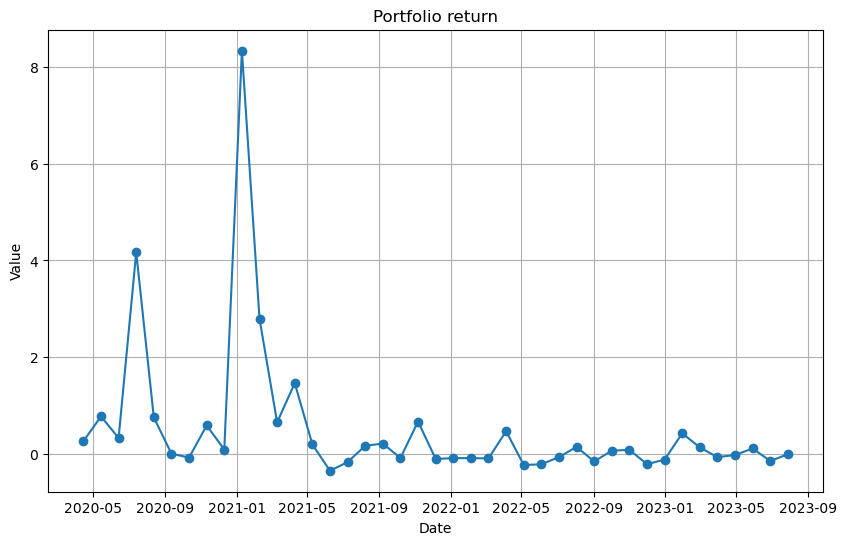

In [184]:
df= portfolio_return_by_date

# 绘制图形
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[0], marker='o', linestyle='-')
plt.title('Portfolio return')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True)

# 保存图像
plt.savefig('portfolio_return.png')

plt.show()

In [ ]:
df= portfolio_sharpe_ratio_df

# 绘制图形
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['sharpe_ratio'], marker='o')
plt.title('sharpe_ratio')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True)

# 保存图像
plt.savefig('sharpe_ratio.png')

plt.show()

In [ ]:
for i in range(3,4):
    
    predicted_values_df = results_oos[i]['pred'].dropna()
    selected_indices = predicted_values_df.index
    
    extracted_returns = top_50_currencies_df.loc[pd.IndexSlice[selected_indices],:]
    
    predicted_values = predicted_values_df['predicted_value'].values
    actual_values = extracted_returns['return'].values

    statistic, pvalue = ks_2samp(predicted_values, actual_values)
    
    results_oos[i]['ks_2samp_pvalue'] = pvalue
    

In [283]:
non_nan_ind = ~np.any(np.isnan(depend_variable_df), axis=1)
slice_top_50 = depend_variable_df[non_nan_ind]

# 按照 'Currency' 进行分组，并计算 'active_addresses' 的平均值
grouped_df = slice_top_50.groupby('Currency')['active_addresses'].mean()
top_50_active_addresses = grouped_df.sort_values(ascending=False).head(35)

# 按照 'Currency' 进行分组，并计算 'active_addresses' 的平均值
grouped_df = slice_top_50.groupby('Currency').size()
top_50_history = grouped_df.sort_values(ascending=False).head(25)

grouped_df = slice_top_50.groupby('Currency')['size'].mean()
top_50_size = grouped_df.sort_values(ascending=False).head(35)

# 将两个 unique_currencies Pandas Index 对象转换为 set
set_unique_currencies1 = set(top_50_size.index.get_level_values('Currency'))
set_unique_currencies2 = set(top_50_active_addresses.index.get_level_values('Currency'))
set_unique_currencies3 = set(top_50_history.index.get_level_values('Currency'))
        
# 找到两个集合中的共有元素
top_currencies = set_unique_currencies2.intersection(set_unique_currencies1)

In [284]:
len(top_currencies)

30

In [285]:
depend_variable_df_sliced = monthly_independ_variable_df[monthly_independ_variable_df.index.get_level_values('Currency').isin(top_currencies)]

top_50_currencies_df_sliced = all_monthly_returns[all_monthly_returns.index.get_level_values('Currency').isin(top_currencies)]

In [286]:
# 重置索引以便可以进行过滤操作
reset_df = depend_variable_df_sliced.reset_index()
sliced_df = reset_df.set_index(['Currency', 'Date'])

reset_df = top_50_currencies_df_sliced.reset_index()
sliced_returns= reset_df.set_index(['Currency', 'Date'])['excess_return']

In [287]:
# Step 1: Filter for rows corresponding to 'BTC' the longest coin
valid_df = sliced_df.loc['BTC'].copy()

# Step 2: Determine the first time a non-NaN value appears for each column
first_valid_indices = valid_df.apply(lambda col: col.first_valid_index())

idx = max(first_valid_indices)

first_valid_idx = idx

window_size = 18*30
step_size = 1*30
#valid_date = 60

results1_oos = {}

# Initialize the scaler
minmax_scaler = MinMaxScaler(feature_range=(-0.5, 0.5))

In [288]:
for i in [1,3,6]:  # for n_factors from 1 to 6
    sum_diff = 0
    sum_diff_pre = 0
    sum_r2 = 0
    
    
    start_date = first_valid_idx
    next_date = pd.Timedelta(days=window_size) + start_date
    end_date = monthly_independ_variable_df.index.get_level_values('Date').max()
    next_date1 = pd.Timedelta(days=30) + next_date
    
    predicted_values_df = pd.DataFrame(index=sliced_df.index, columns=['predicted_value'])
    portfolio_sharpe_ratio_df = pd.DataFrame(index=all_monthly_rf.index, columns=['sharpe_ratio'])

    while next_date <= end_date and (pd.Timedelta(days=30) + next_date) <= end_date:
        
        print("###################:", next_date)
        unique_currencies1 = (sliced_df.loc[pd.IndexSlice[:, next_date], :].dropna()).index.get_level_values('Currency').unique()
        next_date1 = pd.Timedelta(days=30) + next_date
        unique_currencies2 = (sliced_df.loc[pd.IndexSlice[:, next_date1], :].dropna()).index.get_level_values('Currency').unique()
        
        # 将两个 unique_currencies Pandas Index 对象转换为 set
        set_unique_currencies1 = set(unique_currencies1)
        set_unique_currencies2 = set(unique_currencies2)
        
        # 找到两个集合中的共有元素
        common_currencies = set_unique_currencies1.intersection(set_unique_currencies2)
        
        unique_currencies = pd.Index(list(common_currencies)).sort_values()
        
        
        # Slice and clean data
        
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date]].sort_index().copy()
        
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        sliced_df_scaled2[non_nan_ind] = minmax_scaler.fit_transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        regr = InstrumentedPCA(n_factors=i, intercept=False, max_iter=5000,n_jobs=-1,iter_tol=0.0005)
        regr = regr.fit(X=X, y=y)
        
        # data for prediction next day
        sliced_df_scaled2 = sliced_df.loc[pd.IndexSlice[unique_currencies, start_date:next_date1], :].sort_index().copy()
        return_series_oos = sliced_returns.loc[pd.IndexSlice[unique_currencies, start_date:next_date1]].sort_index().copy()

        # scale X
        non_nan_ind = ~np.any(np.isnan(sliced_df_scaled2), axis=1)
        sliced_df_scaled2[non_nan_ind] = minmax_scaler.transform(sliced_df_scaled2[non_nan_ind])
        
        X = sliced_df_scaled2
        y = return_series_oos
        y_returns = regr.predictOOS(X=X, y=y, mean_factor=False,n=5) # predict next periods
        y_pred = y_returns[-1] # last prediction
        
        X_t = sliced_df_scaled2.loc[pd.IndexSlice[unique_currencies, next_date],:].sort_index()
        y_predm, values = forecastFactor(regr, X_t, n=5)
        

        #non_nan_ind = ~np.any(np.isnan(X), axis=1)
        y = sliced_returns.loc[pd.IndexSlice[unique_currencies, next_date1]].sort_index().values
        
        #non_nan_count = np.sum(~np.isnan(y_returns), axis=0)
        #indices = np.where(non_nan_count > 20)[0]
        #portfolio_currencies = [unique_currencies[i] for i in indices]
        
        print('##################')
        print(len(unique_currencies))
        print(np.isnan(y_predm).all()==False)
        
        portfolio_return = np.nan
        
        if len(unique_currencies) < 20:
            # Handle the special case when portfolio_currencies is empty
            print("No suitable currencies found for portfolio for date:", next_date1)
        else:         
            cov_matrix = calculate_cov(regr, X_t, window_size=15)
            #expected_returns = [y_pred[i] for i in indices]
            expected_returns = y_predm
            
            optimal_weights, sharpe_ratio = optimize_portfolio_sharpe(expected_returns, cov_matrix, risk_budget=None, min_weight=0.01, max_weight=0.2)
            predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'] = optimal_weights
            portfolio_sharpe_ratio_df.loc[next_date1, 'sharpe_ratio'] = sharpe_ratio
            portfolio_return = np.sum(y*predicted_values_df.loc[(unique_currencies, next_date1), 'optimal_weights'])
            
        print(portfolio_return)
        
        predicted_values_df.loc[(unique_currencies, next_date1), 'predicted_value'] = y_pred
        predicted_values_df.loc[(unique_currencies, next_date1), 'predicted_mean_value'] = y_predm
        predicted_values_df.loc[(unique_currencies, next_date1), 'portfolio_return'] = portfolio_return
    
        
        sum_diff += np.sum((y - y_pred)**2)
        sum_diff_pre += np.sum((y - y_predm)**2)
        sum_r2 += np.sum(y ** 2)
        
        print(1 - (sum_diff/sum_r2))
        print(1 - (sum_diff_pre/sum_r2))
        print("###################")
        
        
        
        next_date += pd.Timedelta(days=step_size)
    
                           
    results1_oos[i] = {'model': regr}
    results1_oos[i]['r2_total'] = 1 - (sum_diff/sum_r2)
    results1_oos[i]['r2_pred'] = 1 - (sum_diff_pre/sum_r2)
    results1_oos[i]['pred'] = predicted_values_df
    results1_oos[i]['sharpe'] = portfolio_sharpe_ratio_df

[============================                                            ]  39%

###################: 2020-03-15 00:00:00
The panel dimensions are:
n_samples: 26 , L: 30 , T: 541


[========================================================================] 100%


Step 1 - Aggregate Update: 9.8852633136258
Step 2 - Aggregate Update: 7.291734399260415
Step 3 - Aggregate Update: 2.926653355869087
Step 4 - Aggregate Update: 0.7626336566439722
Step 5 - Aggregate Update: 0.49479511019184663
Step 6 - Aggregate Update: 0.2438823919372295
Step 7 - Aggregate Update: 0.11828041121960364
Step 8 - Aggregate Update: 0.07445962505623216
Step 9 - Aggregate Update: 0.05139193423216648
Step 10 - Aggregate Update: 0.03703492105413808
Step 11 - Aggregate Update: 0.027541757276552836
Step 12 - Aggregate Update: 0.020934195226212093
Step 13 - Aggregate Update: 0.016147934015859455
Step 14 - Aggregate Update: 0.012577967068787999
Step 15 - Aggregate Update: 0.009859779060727547
Step 16 - Aggregate Update: 0.007760827728382491
Step 17 - Aggregate Update: 0.006124763909359565
Step 18 - Aggregate Update: 0.004841636985025044
Step 19 - Aggregate Update: 0.003831301988960867
Step 20 - Aggregate Update: 0.0030337435286935666
Step 21 - Aggregate Update: 0.002403144521057942

[========================================================                ]  78%

The panel dimensions are:
n_samples: 27 , L: 30 , T: 571


[========================================================================] 100%


Step 1 - Aggregate Update: 8.92591568118587
Step 2 - Aggregate Update: 6.5824425495548375
Step 3 - Aggregate Update: 2.0378998995412942
Step 4 - Aggregate Update: 1.1478994471739243
Step 5 - Aggregate Update: 0.5921820987632191
Step 6 - Aggregate Update: 0.34754049717547186
Step 7 - Aggregate Update: 0.231566808842258
Step 8 - Aggregate Update: 0.1692016592413541
Step 9 - Aggregate Update: 0.13134402351893382
Step 10 - Aggregate Update: 0.10596380592770416
Step 11 - Aggregate Update: 0.08763748655880743
Step 12 - Aggregate Update: 0.07368704650759206
Step 13 - Aggregate Update: 0.06266745277997554
Step 14 - Aggregate Update: 0.05375537415926068
Step 15 - Aggregate Update: 0.04683513296787911
Step 16 - Aggregate Update: 0.04092966802367837
Step 17 - Aggregate Update: 0.03638225703061515
Step 18 - Aggregate Update: 0.032277341315153585
Step 19 - Aggregate Update: 0.028593678043460358
Step 20 - Aggregate Update: 0.02530276829028999
Step 21 - Aggregate Update: 0.022372601090973276
Step 22 

[==============                                                          ]  20%

 2:  3.5561e-02 -1.9707e-01  2e-01  8e-04  6e-16
 3:  2.0168e-02 -4.0504e-02  6e-02  3e-16  1e-16
 4:  1.5047e-02  3.5156e-03  1e-02  2e-16  1e-16
 5:  1.0687e-02  9.5880e-03  1e-03  2e-16  5e-17
 6:  1.0216e-02  1.0114e-02  1e-04  2e-16  6e-17
 7:  1.0172e-02  1.0169e-02  3e-06  1e-16  8e-17
 8:  1.0170e-02  1.0170e-02  3e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9829e-02 -5.5817e+00  7e+01  7e+00  5e-16
 1:  3.6863e-02 -4.3517e+00  5e+00  2e-02  1e-15
 2:  3.5700e-02 -1.9684e-01  2e-01  8e-04  8e-16
 3:  2.0259e-02 -4.0501e-02  6e-02  3e-16  1e-16
 4:  1.5133e-02  3.5804e-03  1e-02  2e-16  8e-17
 5:  1.0765e-02  9.6666e-03  1e-03  2e-16  7e-17
 6:  1.0295e-02  1.0192e-02  1e-04  2e-16  7e-17
 7:  1.0251e-02  1.0247e-02  3e-06  1e-16  5e-17
 8:  1.0249e-02  1.0249e-02  3e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9887e-02 -5.5822e+00  7e+01  7e+00  5e-16
 1:  3.6970e-02 -4.3522

[========================================================================] 100%


Step 1 - Aggregate Update: 10.33032331034458
Step 2 - Aggregate Update: 6.90887143252151
Step 3 - Aggregate Update: 1.6307917592507462
Step 4 - Aggregate Update: 0.886627984366944
Step 5 - Aggregate Update: 0.4085276601926585
Step 6 - Aggregate Update: 0.22899605569645087
Step 7 - Aggregate Update: 0.18838396284526837
Step 8 - Aggregate Update: 0.17764851076422072
Step 9 - Aggregate Update: 0.1656907489681565
Step 10 - Aggregate Update: 0.1529495718268281
Step 11 - Aggregate Update: 0.13992658133060498
Step 12 - Aggregate Update: 0.12707044473984652
Step 13 - Aggregate Update: 0.11471740753894855
Step 14 - Aggregate Update: 0.10308670303779754
Step 15 - Aggregate Update: 0.09230067797209118
Step 16 - Aggregate Update: 0.08241022774775919
Step 17 - Aggregate Update: 0.0734173523723256
Step 18 - Aggregate Update: 0.06529262965295102
Step 19 - Aggregate Update: 0.05798783686804132
Step 20 - Aggregate Update: 0.05144467891207638
Step 21 - Aggregate Update: 0.04560062706551804
Step 22 - Agg

[===============================================                         ]  65%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 631


[========================================================================] 100%


Step 1 - Aggregate Update: 9.99934507225047
Step 2 - Aggregate Update: 4.854932821025913
Step 3 - Aggregate Update: 1.7671977236562109
Step 4 - Aggregate Update: 0.6697747355138706
Step 5 - Aggregate Update: 0.2842078994614585
Step 6 - Aggregate Update: 0.13190791666775592
Step 7 - Aggregate Update: 0.07482329533992216
Step 8 - Aggregate Update: 0.04888544463514721
Step 9 - Aggregate Update: 0.039676746948332564
Step 10 - Aggregate Update: 0.03298782432906844
Step 11 - Aggregate Update: 0.026964795172541578
Step 12 - Aggregate Update: 0.021841731752029858
Step 13 - Aggregate Update: 0.01760184029483547
Step 14 - Aggregate Update: 0.014142945294082665
Step 15 - Aggregate Update: 0.011343615132309637
Step 16 - Aggregate Update: 0.00908849743239415
Step 17 - Aggregate Update: 0.007276768971394176
Step 18 - Aggregate Update: 0.005823685047560367
Step 19 - Aggregate Update: 0.004659462161397343
Step 20 - Aggregate Update: 0.003727293002310894
Step 21 - Aggregate Update: 0.002981242773966386

[====================================                                    ]  50%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 661


[========================================================================] 100%


Step 1 - Aggregate Update: 9.93642426415769
Step 2 - Aggregate Update: 4.713840627819908
Step 3 - Aggregate Update: 1.9138647641536122
Step 4 - Aggregate Update: 0.7442383709843279
Step 5 - Aggregate Update: 0.3447817735673926
Step 6 - Aggregate Update: 0.1762333259751312
Step 7 - Aggregate Update: 0.09861213187822315
Step 8 - Aggregate Update: 0.05919946275590249
Step 9 - Aggregate Update: 0.03757813617280714
Step 10 - Aggregate Update: 0.025173850890034544
Step 11 - Aggregate Update: 0.018794195009214754
Step 12 - Aggregate Update: 0.015087308087497142
Step 13 - Aggregate Update: 0.01203468224600357
Step 14 - Aggregate Update: 0.009564646001006594
Step 15 - Aggregate Update: 0.0075851286992136835
Step 16 - Aggregate Update: 0.006007405015242107
Step 17 - Aggregate Update: 0.004753987714631869
Step 18 - Aggregate Update: 0.0037601647941496452
Step 19 - Aggregate Update: 0.0029731257462630722
Step 20 - Aggregate Update: 0.002350319977759696
Step 21 - Aggregate Update: 0.001857716590423

[===========================================                             ]  60%

The panel dimensions are:
n_samples: 27 , L: 30 , T: 691


[========================================================================] 100%


Step 1 - Aggregate Update: 10.442144793825268
Step 2 - Aggregate Update: 6.950687651873518
Step 3 - Aggregate Update: 2.3439073317948376
Step 4 - Aggregate Update: 1.0225367940797128
Step 5 - Aggregate Update: 0.5386722859357977
Step 6 - Aggregate Update: 0.332261954829276
Step 7 - Aggregate Update: 0.22510744557849538
Step 8 - Aggregate Update: 0.1700728658854067
Step 9 - Aggregate Update: 0.13288383190642916
Step 10 - Aggregate Update: 0.10603563315196496
Step 11 - Aggregate Update: 0.08582869061870468
Step 12 - Aggregate Update: 0.07015023806196763
Step 13 - Aggregate Update: 0.05771836170523281
Step 14 - Aggregate Update: 0.04770823517708789
Step 15 - Aggregate Update: 0.03956014766947047
Step 16 - Aggregate Update: 0.032876513833395515
Step 17 - Aggregate Update: 0.02736404572987783
Step 18 - Aggregate Update: 0.022799756495045953
Step 19 - Aggregate Update: 0.019010051249046978
Step 20 - Aggregate Update: 0.015857298253390884
Step 21 - Aggregate Update: 0.013230847206779917
Step 

[                                                                        ]   0%

 7:  1.0964e-04  1.0834e-04  1e-06  2e-16  2e-18
 8:  1.0902e-04  1.0899e-04  3e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2371e-03 -5.2438e+00  5e+00  3e-16  4e-16
 1:  1.2324e-03 -6.3679e-02  6e-02  2e-16  1e-15
 2:  9.9013e-04 -8.4265e-03  9e-03  2e-16  1e-16
 3:  4.4958e-04 -2.2881e-03  3e-03  2e-16  5e-18
 4:  2.7793e-04 -1.7247e-04  5e-04  2e-16  3e-18
 5:  1.7888e-04  5.0113e-05  1e-04  2e-16  2e-18
 6:  1.2541e-04  1.1273e-04  1e-05  2e-16  2e-18
 7:  1.1929e-04  1.1802e-04  1e-06  2e-16  1e-18
 8:  1.1869e-04  1.1866e-04  3e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2591e-03 -5.2439e+00  5e+00  3e-16  6e-16
 1:  1.2543e-03 -6.3761e-02  7e-02  1e-16  1e-15
 2:  1.0087e-03 -8.4670e-03  9e-03  1e-16  2e-16
 3:  4.6208e-04 -2.2966e-03  3e-03  2e-16  4e-18
 4:  2.8772e-04 -1.6638e-04  5e-04  1e-16  4e-18
 5:  1.8693e-04  5.7785e-05  1e-04  2e-16  3e-18
 6:  1.3307e-04  1.2041

[========================================================================] 100%


Step 1 - Aggregate Update: 10.225926598477809
Step 2 - Aggregate Update: 6.933174358226891
Step 3 - Aggregate Update: 2.294697122288044
Step 4 - Aggregate Update: 0.9548012349184303
Step 5 - Aggregate Update: 0.4760666256802564
Step 6 - Aggregate Update: 0.2852481068109558
Step 7 - Aggregate Update: 0.20354101602011987
Step 8 - Aggregate Update: 0.15296955792447653
Step 9 - Aggregate Update: 0.11899450595184824
Step 10 - Aggregate Update: 0.09481906795561912
Step 11 - Aggregate Update: 0.07680706012026928
Step 12 - Aggregate Update: 0.06291853645923418
Step 13 - Aggregate Update: 0.05194032101832469
Step 14 - Aggregate Update: 0.04310720652373834
Step 15 - Aggregate Update: 0.03590952353568411
Step 16 - Aggregate Update: 0.02999119631022218
Step 17 - Aggregate Update: 0.02509322128053304
Step 18 - Aggregate Update: 0.021020862561587972
Step 19 - Aggregate Update: 0.017623752450832475
Step 20 - Aggregate Update: 0.01478330629654856
Step 21 - Aggregate Update: 0.012404447963058507
Step 2

[=========================================================               ]  79%

The panel dimensions are:
n_samples: 28 , L: 30 , T: 751


[========================================================================] 100%


Step 1 - Aggregate Update: 10.15634759307861
Step 2 - Aggregate Update: 6.891684917754014
Step 3 - Aggregate Update: 2.986013125437883
Step 4 - Aggregate Update: 1.2836765018828906
Step 5 - Aggregate Update: 0.8726037115395973
Step 6 - Aggregate Update: 0.7914676674136041
Step 7 - Aggregate Update: 0.7653240944474382
Step 8 - Aggregate Update: 0.8692182596052073
Step 9 - Aggregate Update: 1.289671691201194
Step 10 - Aggregate Update: 1.9104902981376886
Step 11 - Aggregate Update: 2.656662776926296
Step 12 - Aggregate Update: 2.9094976187221384
Step 13 - Aggregate Update: 2.522709651268698
Step 14 - Aggregate Update: 3.0400843279640055
Step 15 - Aggregate Update: 3.021988820096819
Step 16 - Aggregate Update: 3.550115778807856
Step 17 - Aggregate Update: 3.4475304189891007
Step 18 - Aggregate Update: 4.617283544838363
Step 19 - Aggregate Update: 7.366768919918371
Step 20 - Aggregate Update: 7.405080295315983
Step 21 - Aggregate Update: 2.077369420875056
Step 22 - Aggregate Update: 0.8805

[                                                                        ]   0%

 5: -1.2142e-03 -1.4993e-03  3e-04  1e-16  2e-18
 6: -1.2433e-03 -1.3080e-03  6e-05  2e-16  2e-18
 7: -1.2576e-03 -1.2745e-03  2e-05  2e-16  1e-18
 8: -1.2634e-03 -1.2659e-03  2e-06  1e-16  2e-18
 9: -1.2646e-03 -1.2646e-03  5e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1282e-04 -5.4305e+00  5e+00  9e-16  4e-16
 1:  2.0733e-04 -9.2961e-02  9e-02  2e-16  1e-15
 2: -1.3495e-04 -1.5380e-02  2e-02  1e-16  1e-16
 3: -6.6876e-04 -3.3328e-03  3e-03  2e-16  4e-18
 4: -7.6147e-04 -1.1429e-03  4e-04  1e-16  3e-18
 5: -7.9811e-04 -9.5146e-04  2e-04  2e-16  1e-18
 6: -8.0053e-04 -8.1545e-04  1e-05  2e-16  3e-18
 7: -8.0079e-04 -8.0153e-04  7e-07  2e-16  1e-18
 8: -8.0079e-04 -8.0080e-04  7e-09  2e-16  8e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8085e-04 -5.4286e+00  5e+00  2e-16  5e-16
 1:  1.7720e-04 -8.6319e-02  9e-02  2e-16  1e-15
 2: -4.7214e-05 -1.6055e-02  2e-02  1e-16  2e-16
 3: -4.3162e-04 -3.2588

[========================================================================] 100%


Step 1 - Aggregate Update: 11.076778990225385
Step 2 - Aggregate Update: 8.068287842993
Step 3 - Aggregate Update: 2.796642174918545
Step 4 - Aggregate Update: 1.258265504899601
Step 5 - Aggregate Update: 1.0155074534116766
Step 6 - Aggregate Update: 0.9322577474977893
Step 7 - Aggregate Update: 0.9018626565523518
Step 8 - Aggregate Update: 1.168439462134549
Step 9 - Aggregate Update: 1.6648305305396656
Step 10 - Aggregate Update: 2.3412487267883604
Step 11 - Aggregate Update: 2.9316085302735235
Step 12 - Aggregate Update: 3.3711716461025096
Step 13 - Aggregate Update: 5.221188258082474
Step 14 - Aggregate Update: 8.927181192821791
Step 15 - Aggregate Update: 7.398099062077953
Step 16 - Aggregate Update: 10.350820046485858
Step 17 - Aggregate Update: 3.8428069350723444
Step 18 - Aggregate Update: 1.716090958446605
Step 19 - Aggregate Update: 1.2894539110493612
Step 20 - Aggregate Update: 0.9058746758236165
Step 21 - Aggregate Update: 0.6385417673516791
Step 22 - Aggregate Update: 0.457

[                                                                        ]   0%

 6: -2.4368e-04 -2.4375e-04  7e-08  2e-16  5e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8873e-05 -5.0406e+00  5e+00  2e-16  4e-16
 1:  4.8495e-05 -5.5134e-02  6e-02  2e-16  1e-15
 2:  1.8703e-05 -4.6297e-03  5e-03  2e-16  9e-17
 3: -1.3340e-04 -1.0579e-03  9e-04  2e-16  1e-18
 4: -1.5167e-04 -2.2218e-04  7e-05  2e-16  6e-19
 5: -1.5375e-04 -1.5521e-04  1e-06  2e-16  7e-19
 6: -1.5375e-04 -1.5377e-04  1e-08  2e-16  6e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0152e-05 -5.0403e+00  5e+00  1e-16  5e-16
 1:  3.9896e-05 -5.4298e-02  5e-02  2e-16  1e-15
 2:  1.9330e-05 -3.9407e-03  4e-03  1e-16  8e-17
 3: -8.7252e-05 -7.7032e-04  7e-04  2e-16  1e-18
 4: -9.6505e-05 -1.3626e-04  4e-05  1e-16  7e-19
 5: -9.7011e-05 -9.7498e-05  5e-07  2e-16  4e-19
 6: -9.7011e-05 -9.7016e-05  5e-09  2e-16  4e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3027e-05 -5.0399e+00  5e+00  2e-16  5e-16


[========================================================================] 100%


Step 1 - Aggregate Update: 11.007571758644305
Step 2 - Aggregate Update: 8.171758638761439
Step 3 - Aggregate Update: 2.811888074822032
Step 4 - Aggregate Update: 1.293900882795616
Step 5 - Aggregate Update: 1.1789934287320656
Step 6 - Aggregate Update: 1.1158554448835263
Step 7 - Aggregate Update: 1.2053388059399035
Step 8 - Aggregate Update: 1.796329114282511
Step 9 - Aggregate Update: 2.5690204875831677
Step 10 - Aggregate Update: 3.1130409493228237
Step 11 - Aggregate Update: 3.5402401030827826
Step 12 - Aggregate Update: 5.58792229865173
Step 13 - Aggregate Update: 9.340001030114642
Step 14 - Aggregate Update: 7.869823696428467
Step 15 - Aggregate Update: 10.405297775565044
Step 16 - Aggregate Update: 4.136144814439912
Step 17 - Aggregate Update: 1.7820221623555423
Step 18 - Aggregate Update: 1.2357157289166727
Step 19 - Aggregate Update: 0.8633663474424642
Step 20 - Aggregate Update: 0.5977536570371509
Step 21 - Aggregate Update: 0.4192439780967603
Step 22 - Aggregate Update: 0.2

[                                                                        ]   0%

 6: -8.4069e-06 -8.5804e-06  2e-07  2e-16  6e-19
 7: -8.4070e-06 -8.4087e-06  2e-09  2e-16  9e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0363e-04 -5.0681e+00  5e+00  3e-16  5e-16
 1:  5.9634e-04 -6.0350e-02  6e-02  2e-16  1e-15
 2:  3.5890e-04 -6.4612e-03  7e-03  1e-16  1e-16
 3:  6.8911e-05 -1.3380e-03  1e-03  1e-16  1e-18
 4:  9.7992e-06 -1.3732e-04  1e-04  2e-16  2e-18
 5: -4.9528e-06 -1.7999e-05  1e-05  2e-16  5e-19
 6: -5.3042e-06 -5.5612e-06  3e-07  2e-16  9e-19
 7: -5.3045e-06 -5.3070e-06  3e-09  3e-16  5e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2737e-04 -5.0686e+00  5e+00  2e-16  4e-16
 1:  6.1985e-04 -6.0504e-02  6e-02  2e-16  1e-15
 2:  3.7607e-04 -6.5478e-03  7e-03  1e-16  1e-16
 3:  7.6507e-05 -1.3678e-03  1e-03  2e-16  4e-18
 4:  1.3836e-05 -1.4052e-04  2e-04  2e-16  2e-18
 5: -2.8543e-06 -1.7599e-05  1e-05  1e-16  6e-19
 6: -3.3464e-06 -3.7030e-06  4e-07  2e-16  5e-19
 7: -3.3469e-06 -3.3505

[========================================================================] 100%


Step 1 - Aggregate Update: 11.535369429081747
Step 2 - Aggregate Update: 8.472546138188813
Step 3 - Aggregate Update: 2.9845060690741096
Step 4 - Aggregate Update: 1.6259102698387529
Step 5 - Aggregate Update: 1.7342898838023586
Step 6 - Aggregate Update: 2.552618248936157
Step 7 - Aggregate Update: 3.1322261858461813
Step 8 - Aggregate Update: 2.7351506696296166
Step 9 - Aggregate Update: 2.868335355988755
Step 10 - Aggregate Update: 4.357280635319651
Step 11 - Aggregate Update: 6.217219954352436
Step 12 - Aggregate Update: 11.286481152178442
Step 13 - Aggregate Update: 10.670950933410055
Step 14 - Aggregate Update: 5.769179627979475
Step 15 - Aggregate Update: 4.17420885184773
Step 16 - Aggregate Update: 2.173475399298269
Step 17 - Aggregate Update: 1.4683772416858165
Step 18 - Aggregate Update: 1.3014774014241972
Step 19 - Aggregate Update: 1.1435837081933862
Step 20 - Aggregate Update: 1.026358933725219
Step 21 - Aggregate Update: 0.9537328792154365
Step 22 - Aggregate Update: 0.92

[===================================                                     ]  49%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 871


[========================================================================] 100%


Step 1 - Aggregate Update: 12.593045111928372
Step 2 - Aggregate Update: 8.409938931391238
Step 3 - Aggregate Update: 3.749667026134561
Step 4 - Aggregate Update: 2.727600889838846
Step 5 - Aggregate Update: 3.649513998283256
Step 6 - Aggregate Update: 3.2305371851226967
Step 7 - Aggregate Update: 2.2187517748616656
Step 8 - Aggregate Update: 3.6013688757597664
Step 9 - Aggregate Update: 5.29886341946062
Step 10 - Aggregate Update: 7.79682747875923
Step 11 - Aggregate Update: 13.792846257858418
Step 12 - Aggregate Update: 15.431871391026373
Step 13 - Aggregate Update: 6.461998454329446
Step 14 - Aggregate Update: 3.7559925554544478
Step 15 - Aggregate Update: 1.879957703453007
Step 16 - Aggregate Update: 1.2267309629922458
Step 17 - Aggregate Update: 1.1405362032422461
Step 18 - Aggregate Update: 1.112680428626545
Step 19 - Aggregate Update: 1.1028959238268445
Step 20 - Aggregate Update: 1.1145270171242458
Step 21 - Aggregate Update: 1.1510217163631236
Step 22 - Aggregate Update: 1.214

[                                                                        ]   0%

 2:  9.8602e-03 -1.4090e-01  2e-01  1e-03  9e-16
 3:  2.5759e-03 -3.2643e-02  4e-02  2e-16  8e-17
 4:  1.0454e-03 -5.7225e-03  7e-03  2e-16  6e-17
 5:  1.6669e-04 -1.4388e-03  2e-03  1e-16  4e-17
 6:  1.4644e-05 -1.4741e-04  2e-04  2e-16  1e-17
 7: -1.6728e-07 -1.1059e-05  1e-05  2e-16  2e-17
 8: -3.3616e-07 -4.6256e-07  1e-07  2e-16  2e-17
 9: -3.3619e-07 -3.3745e-07  1e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1863e-03 -5.2665e+00  6e+01  7e+00  4e-16
 1:  1.0017e-02 -4.1013e+00  4e+00  3e-02  1e-15
 2:  9.8813e-03 -1.4063e-01  2e-01  1e-03  8e-16
 3:  2.5801e-03 -3.2661e-02  4e-02  2e-16  7e-17
 4:  1.0503e-03 -5.7321e-03  7e-03  1e-16  6e-17
 5:  1.6848e-04 -1.4425e-03  2e-03  2e-16  2e-17
 6:  1.5032e-05 -1.4683e-04  2e-04  2e-16  3e-17
 7: -3.3966e-08 -1.1085e-05  1e-05  4e-16  2e-17
 8: -2.1209e-07 -3.4161e-07  1e-07  3e-16  3e-17
 9: -2.1212e-07 -2.1341e-07  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost

[========================================================================] 100%


Step 1 - Aggregate Update: 20.63880319417721
Step 2 - Aggregate Update: 10.25470932237528
Step 3 - Aggregate Update: 5.589787223983439
Step 4 - Aggregate Update: 5.979470633417902
Step 5 - Aggregate Update: 5.510923118394301
Step 6 - Aggregate Update: 3.5034170619141998
Step 7 - Aggregate Update: 2.643124059545677
Step 8 - Aggregate Update: 3.826678034166338
Step 9 - Aggregate Update: 6.229103396952755
Step 10 - Aggregate Update: 7.122086125493125
Step 11 - Aggregate Update: 8.038270441143496
Step 12 - Aggregate Update: 14.303631624446858
Step 13 - Aggregate Update: 14.914963473691863
Step 14 - Aggregate Update: 16.595782911428003
Step 15 - Aggregate Update: 7.669064532786207
Step 16 - Aggregate Update: 4.435963510427389
Step 17 - Aggregate Update: 2.473592264527293
Step 18 - Aggregate Update: 1.7975331114747046
Step 19 - Aggregate Update: 1.3222868659037985
Step 20 - Aggregate Update: 0.9653435570461548
Step 21 - Aggregate Update: 0.7047037491980204
Step 22 - Aggregate Update: 0.51647

[                                                                        ]   0%

 7: -7.1597e-07 -7.5123e-07  4e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9839e-03 -5.1190e+00  5e+00  2e-16  6e-16
 1:  3.8281e-03 -9.6392e-02  1e-01  2e-16  1e-15
 2:  1.6094e-03 -8.7593e-03  1e-02  2e-16  7e-17
 3:  3.1301e-04 -1.1942e-03  2e-03  3e-16  2e-17
 4:  5.4201e-05 -1.5979e-04  2e-04  2e-16  6e-18
 5:  4.1237e-06 -2.4605e-05  3e-05  2e-16  7e-18
 6: -3.5237e-07 -2.7640e-06  2e-06  1e-16  6e-18
 7: -4.5173e-07 -4.9187e-07  4e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9970e-03 -5.1191e+00  5e+00  2e-16  4e-16
 1:  3.8408e-03 -9.6435e-02  1e-01  1e-16  8e-16
 2:  1.6170e-03 -8.7457e-03  1e-02  2e-16  6e-17
 3:  3.1581e-04 -1.1920e-03  2e-03  2e-16  1e-17
 4:  5.5404e-05 -1.5945e-04  2e-04  2e-16  6e-18
 5:  4.5205e-06 -2.4467e-05  3e-05  2e-16  7e-18
 6: -1.6999e-07 -2.6802e-06  3e-06  2e-16  5e-18
 7: -2.8499e-07 -3.2964e-07  4e-08  1e-16  2e-18
Optimal solution found.

[========================================================================] 100%


Step 1 - Aggregate Update: 21.18509613657926
Step 2 - Aggregate Update: 13.054795870811171
Step 3 - Aggregate Update: 5.203009959952691
Step 4 - Aggregate Update: 4.197928411025387
Step 5 - Aggregate Update: 3.6520181475896125
Step 6 - Aggregate Update: 3.3703717964637496
Step 7 - Aggregate Update: 4.440962021192382
Step 8 - Aggregate Update: 8.129275559605457
Step 9 - Aggregate Update: 9.031591503617179
Step 10 - Aggregate Update: 16.601016032394234
Step 11 - Aggregate Update: 17.01537123575195
Step 12 - Aggregate Update: 9.258258649717561
Step 13 - Aggregate Update: 5.552645333924453
Step 14 - Aggregate Update: 3.2200934677539017
Step 15 - Aggregate Update: 1.7876575341002452
Step 16 - Aggregate Update: 1.0193434154491403
Step 17 - Aggregate Update: 0.6393429072173555
Step 18 - Aggregate Update: 0.40339084393788993
Step 19 - Aggregate Update: 0.2573729021511131
Step 20 - Aggregate Update: 0.17054047043938603
Step 21 - Aggregate Update: 0.11276256723970057
Step 22 - Aggregate Update: 

[                                                                        ]   0%

 2:  4.3393e-04 -1.1101e-02  1e-02  1e-16  1e-16
 3:  1.8620e-05 -1.1296e-03  1e-03  2e-16  1e-17
 4: -8.7423e-06 -5.3831e-05  5e-05  2e-16  4e-18
 5: -8.8834e-06 -9.3393e-06  5e-07  2e-16  2e-18
 6: -8.8834e-06 -8.8879e-06  5e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4290e-03 -5.1297e+00  5e+00  9e-16  4e-16
 1:  1.3566e-03 -9.3178e-02  9e-02  2e-16  1e-15
 2:  4.5162e-04 -1.1093e-02  1e-02  1e-16  9e-17
 3:  2.3775e-05 -1.1373e-03  1e-03  2e-16  1e-17
 4: -5.4406e-06 -5.2823e-05  5e-05  2e-16  7e-18
 5: -5.6050e-06 -6.0855e-06  5e-07  2e-16  3e-18
 6: -5.6050e-06 -5.6098e-06  5e-09  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4547e-03 -5.1304e+00  5e+00  4e-16  4e-16
 1:  1.3817e-03 -9.3442e-02  9e-02  2e-16  1e-15
 2:  4.6535e-04 -1.1084e-02  1e-02  2e-16  9e-17
 3:  2.7399e-05 -1.1434e-03  1e-03  2e-16  6e-18
 4: -3.3516e-06 -5.2540e-05  5e-05  2e-16  3e-18
 5: -3.5365e-06 -4.0366

[========================================================================] 100%


Step 1 - Aggregate Update: 24.709110470227344
Step 2 - Aggregate Update: 12.289301029321932
Step 3 - Aggregate Update: 4.5454346052491195
Step 4 - Aggregate Update: 4.487756215842998
Step 5 - Aggregate Update: 4.128735516239203
Step 6 - Aggregate Update: 11.883602777007855
Step 7 - Aggregate Update: 16.972957696269795
Step 8 - Aggregate Update: 19.806214187070136
Step 9 - Aggregate Update: 11.18881836035564
Step 10 - Aggregate Update: 4.708874022446559
Step 11 - Aggregate Update: 5.696736586009246
Step 12 - Aggregate Update: 8.415052250867737
Step 13 - Aggregate Update: 13.543673557847685
Step 14 - Aggregate Update: 36.19848288067984
Step 15 - Aggregate Update: 19.753363588497134
Step 16 - Aggregate Update: 2.595465590098833
Step 17 - Aggregate Update: 0.9968509635408385
Step 18 - Aggregate Update: 0.4326040798159845
Step 19 - Aggregate Update: 0.1994649896437437
Step 20 - Aggregate Update: 0.09350149034368016
Step 21 - Aggregate Update: 0.04382529061738083
Step 22 - Aggregate Update: 

[=================                                                       ]  24%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 991


[========================================================================] 100%


Step 1 - Aggregate Update: 25.547032135648568
Step 2 - Aggregate Update: 12.283568903989297
Step 3 - Aggregate Update: 4.338989814748844
Step 4 - Aggregate Update: 4.503660615204124
Step 5 - Aggregate Update: 6.296191905287442
Step 6 - Aggregate Update: 20.833119386115413
Step 7 - Aggregate Update: 20.215893612642546
Step 8 - Aggregate Update: 16.27303836935529
Step 9 - Aggregate Update: 10.330890820512861
Step 10 - Aggregate Update: 17.863645935718548
Step 11 - Aggregate Update: 42.57578304314926
Step 12 - Aggregate Update: 26.376232885546255
Step 13 - Aggregate Update: 3.0323034218487663
Step 14 - Aggregate Update: 1.1743473356627003
Step 15 - Aggregate Update: 0.5257944634882215
Step 16 - Aggregate Update: 0.2492337172934711
Step 17 - Aggregate Update: 0.11931300229676722
Step 18 - Aggregate Update: 0.05687599474642013
Step 19 - Aggregate Update: 0.02691731355041682
Step 20 - Aggregate Update: 0.01264751242229245
Step 21 - Aggregate Update: 0.00590316122007728
Step 22 - Aggregate Up

[================                                                        ]  22%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 1021


[========================================================================] 100%


Step 1 - Aggregate Update: 25.586596084083727
Step 2 - Aggregate Update: 13.465227360238107
Step 3 - Aggregate Update: 5.870395826274555
Step 4 - Aggregate Update: 6.375506554698319
Step 5 - Aggregate Update: 10.838256073362013
Step 6 - Aggregate Update: 13.11919289280797
Step 7 - Aggregate Update: 18.65527157792944
Step 8 - Aggregate Update: 40.39919761588899
Step 9 - Aggregate Update: 22.358428997216357
Step 10 - Aggregate Update: 42.1444594936882
Step 11 - Aggregate Update: 64.5552340586377
Step 12 - Aggregate Update: 8.777225097149433
Step 13 - Aggregate Update: 4.844731766242322
Step 14 - Aggregate Update: 2.320189496808105
Step 15 - Aggregate Update: 1.5245587758929133
Step 16 - Aggregate Update: 0.9342858243503152
Step 17 - Aggregate Update: 0.549389418778734
Step 18 - Aggregate Update: 0.3148812774662346
Step 19 - Aggregate Update: 0.17752318828143387
Step 20 - Aggregate Update: 0.09900741779189204
Step 21 - Aggregate Update: 0.05482500081278907
Step 22 - Aggregate Update: 0.03

[=================                                                       ]  24%

The panel dimensions are:
n_samples: 25 , L: 30 , T: 1051


[========================================================================] 100%


Step 1 - Aggregate Update: 28.016322929478083
Step 2 - Aggregate Update: 18.47741745862216
Step 3 - Aggregate Update: 8.013406660003376
Step 4 - Aggregate Update: 8.811654135260468
Step 5 - Aggregate Update: 12.1140187812899
Step 6 - Aggregate Update: 14.127374541474493
Step 7 - Aggregate Update: 23.25854482913499
Step 8 - Aggregate Update: 47.55461520543215
Step 9 - Aggregate Update: 45.71371148158336
Step 10 - Aggregate Update: 35.25439034719683
Step 11 - Aggregate Update: 93.70206988295502
Step 12 - Aggregate Update: 83.29922225029347
Step 13 - Aggregate Update: 13.569901948456252
Step 14 - Aggregate Update: 5.486784091864454
Step 15 - Aggregate Update: 2.9277383070893173
Step 16 - Aggregate Update: 1.8881966588866348
Step 17 - Aggregate Update: 1.1447700194995818
Step 18 - Aggregate Update: 0.6683261273054839
Step 19 - Aggregate Update: 0.38092264246623486
Step 20 - Aggregate Update: 0.21375852174798737
Step 21 - Aggregate Update: 0.11873730231634738
Step 22 - Aggregate Update: 0.0

[                                                                        ]   0%

 4: -5.8893e-08 -4.9159e-07  4e-07  1e-16  3e-17
 5: -5.8893e-08 -6.3220e-08  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1605e-03 -4.8665e+00  5e+00  2e-16  5e-16
 1:  9.0026e-04 -2.0014e-01  2e-01  1e-16  9e-16
 2:  1.0224e-05 -4.1162e-03  4e-03  2e-16  3e-17
 3: -3.5661e-08 -4.3348e-05  4e-05  2e-16  2e-17
 4: -3.7159e-08 -4.7026e-07  4e-07  1e-16  1e-17
 5: -3.7159e-08 -4.1490e-08  4e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1619e-03 -4.8665e+00  5e+00  2e-16  5e-16
 1:  9.0133e-04 -2.0020e-01  2e-01  2e-16  1e-15
 2:  1.0265e-05 -4.1184e-03  4e-03  2e-16  5e-17
 3: -2.1942e-08 -4.3366e-05  4e-05  2e-16  2e-17
 4: -2.3446e-08 -4.5687e-07  4e-07  1e-16  2e-17
 5: -2.3446e-08 -2.7780e-08  4e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1630e-03 -4.8666e+00  5e+00  4e-17  4e-16
 1:  9.0217e-04 -2.0025e-01  2e-01  1e-16  1e-15


[========================================================================] 100%


Step 1 - Aggregate Update: 31.743868561503113
Step 2 - Aggregate Update: 20.205562000880974
Step 3 - Aggregate Update: 10.437556141029678
Step 4 - Aggregate Update: 9.22066902333331
Step 5 - Aggregate Update: 13.125134492931084
Step 6 - Aggregate Update: 16.14807039023709
Step 7 - Aggregate Update: 24.034162505689014
Step 8 - Aggregate Update: 46.15352758628357
Step 9 - Aggregate Update: 28.374534477661072
Step 10 - Aggregate Update: 30.170464440260176
Step 11 - Aggregate Update: 106.48516194179038
Step 12 - Aggregate Update: 68.85645003729161
Step 13 - Aggregate Update: 10.804959264095654
Step 14 - Aggregate Update: 4.681258505373243
Step 15 - Aggregate Update: 2.7620232307479924
Step 16 - Aggregate Update: 1.6856503466141461
Step 17 - Aggregate Update: 0.975910157861648
Step 18 - Aggregate Update: 0.5479122588574903
Step 19 - Aggregate Update: 0.3018726080283116
Step 20 - Aggregate Update: 0.1643344625019303
Step 21 - Aggregate Update: 0.08876975710017021
Step 22 - Aggregate Update: 

[                                                                        ]   0%

     pcost       dcost       gap    pres   dres
 0:  7.5978e-03 -5.0242e+00  6e+01  7e+00  4e-16
 1:  1.3483e-02 -3.9153e+00  4e+00  1e-15  1e-15
 2:  1.2661e-02 -1.0582e-01  1e-01  2e-16  7e-16
 3:  6.2720e-03 -6.8137e-03  1e-02  2e-16  5e-17
 4:  3.6622e-03  7.9200e-04  3e-03  2e-16  2e-17
 5:  2.6214e-03  1.8645e-03  8e-04  2e-16  3e-17
 6:  2.3077e-03  2.0817e-03  2e-04  2e-16  2e-17
 7:  2.2390e-03  2.2350e-03  4e-06  2e-16  3e-17
 8:  2.2375e-03  2.2375e-03  4e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6187e-03 -5.0244e+00  6e+01  7e+00  4e-16
 1:  1.3520e-02 -3.9155e+00  4e+00  9e-16  1e-15
 2:  1.2696e-02 -1.0588e-01  1e-01  2e-16  9e-16
 3:  6.2957e-03 -6.8193e-03  1e-02  2e-16  7e-17
 4:  3.6827e-03  8.0466e-04  3e-03  2e-16  4e-17
 5:  2.6392e-03  1.8796e-03  8e-04  1e-16  7e-17
 6:  2.3242e-03  2.0978e-03  2e-04  2e-16  4e-17
 7:  2.2555e-03  2.2514e-03  4e-06  2e-16  1e-17
 8:  2.2540e-03  2.2540e-03  4e-08  2e-16  2e-1

[========================================================================] 100%


Step 1 - Aggregate Update: 34.43530346216917
Step 2 - Aggregate Update: 16.748448991357666
Step 3 - Aggregate Update: 9.08215399096402
Step 4 - Aggregate Update: 8.810957697630526
Step 5 - Aggregate Update: 14.24524094791602
Step 6 - Aggregate Update: 21.301807509016992
Step 7 - Aggregate Update: 29.756782208237276
Step 8 - Aggregate Update: 32.83332372040607
Step 9 - Aggregate Update: 39.66562875444335
Step 10 - Aggregate Update: 72.83981495835444
Step 11 - Aggregate Update: 65.26714897984598
Step 12 - Aggregate Update: 9.616541629250746
Step 13 - Aggregate Update: 5.051486852800199
Step 14 - Aggregate Update: 2.4078142731691017
Step 15 - Aggregate Update: 1.1622568216483664
Step 16 - Aggregate Update: 0.5733914147100911
Step 17 - Aggregate Update: 0.2870591697248166
Step 18 - Aggregate Update: 0.14515271645514005
Step 19 - Aggregate Update: 0.0739824836627676
Step 20 - Aggregate Update: 0.03797814582084058
Step 21 - Aggregate Update: 0.019628129913428438
Step 22 - Aggregate Update: 0

[========================================================================] 100%


Step 1 - Aggregate Update: 35.744294083478636
Step 2 - Aggregate Update: 17.635671270729272
Step 3 - Aggregate Update: 10.117105969072433
Step 4 - Aggregate Update: 9.72636532171813
Step 5 - Aggregate Update: 18.156667447562427
Step 6 - Aggregate Update: 20.698834470464814
Step 7 - Aggregate Update: 36.0226169690634
Step 8 - Aggregate Update: 32.27171414577491
Step 9 - Aggregate Update: 83.03247732582986
Step 10 - Aggregate Update: 113.89941309962667
Step 11 - Aggregate Update: 58.39525416756646
Step 12 - Aggregate Update: 9.531007893657568
Step 13 - Aggregate Update: 4.32537117777699
Step 14 - Aggregate Update: 1.8765352022787312
Step 15 - Aggregate Update: 0.8411410793367295
Step 16 - Aggregate Update: 0.38149258138470543
Step 17 - Aggregate Update: 0.17571153103707715
Step 18 - Aggregate Update: 0.08185722300460796
Step 19 - Aggregate Update: 0.03849885363041139
Step 20 - Aggregate Update: 0.018328490707212097
Step 21 - Aggregate Update: 0.008764540821822209
Step 22 - Aggregate Upda

[===================                                                     ]  26%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1171


[========================================================================] 100%


Step 1 - Aggregate Update: 36.96818529082678
Step 2 - Aggregate Update: 16.875786379829915
Step 3 - Aggregate Update: 10.779568241012525
Step 4 - Aggregate Update: 11.925913084713166
Step 5 - Aggregate Update: 19.46595248418916
Step 6 - Aggregate Update: 26.41211775253494
Step 7 - Aggregate Update: 45.671966949785016
Step 8 - Aggregate Update: 45.98055149163197
Step 9 - Aggregate Update: 77.24012353221826
Step 10 - Aggregate Update: 68.15435485705717
Step 11 - Aggregate Update: 12.159100822804211
Step 12 - Aggregate Update: 5.738186625816914
Step 13 - Aggregate Update: 2.4077952553131112
Step 14 - Aggregate Update: 1.0413288547094055
Step 15 - Aggregate Update: 0.46948428179076274
Step 16 - Aggregate Update: 0.216910137122575
Step 17 - Aggregate Update: 0.10156246374815936
Step 18 - Aggregate Update: 0.047956683670062006
Step 19 - Aggregate Update: 0.02279722018939978
Step 20 - Aggregate Update: 0.010906554737740493
Step 21 - Aggregate Update: 0.005572139645266816
Step 22 - Aggregate U

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1201


[========================================================================] 100%


Step 1 - Aggregate Update: 36.898109790013045
Step 2 - Aggregate Update: 16.787486747709973
Step 3 - Aggregate Update: 10.396308376689746
Step 4 - Aggregate Update: 9.858492503510554
Step 5 - Aggregate Update: 19.50385421453018
Step 6 - Aggregate Update: 25.11875388157742
Step 7 - Aggregate Update: 48.62732705550393
Step 8 - Aggregate Update: 45.702951483195505
Step 9 - Aggregate Update: 82.02208528898191
Step 10 - Aggregate Update: 68.71080413481526
Step 11 - Aggregate Update: 11.526489730003053
Step 12 - Aggregate Update: 5.28060548920045
Step 13 - Aggregate Update: 2.1852360979608214
Step 14 - Aggregate Update: 0.9449398655622723
Step 15 - Aggregate Update: 0.4265476941170867
Step 16 - Aggregate Update: 0.19715128263313275
Step 17 - Aggregate Update: 0.09226038207199139
Step 18 - Aggregate Update: 0.04350162235159516
Step 19 - Aggregate Update: 0.020631371916987717
Step 20 - Aggregate Update: 0.00983859925925401
Step 21 - Aggregate Update: 0.00526122988083344
Step 22 - Aggregate Upd

[============                                                            ]  17%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1231


[========================================================================] 100%


Step 1 - Aggregate Update: 36.008833911684505
Step 2 - Aggregate Update: 16.345341362832833
Step 3 - Aggregate Update: 9.936021471326015
Step 4 - Aggregate Update: 7.812211099274849
Step 5 - Aggregate Update: 10.707870355001907
Step 6 - Aggregate Update: 17.910184053995035
Step 7 - Aggregate Update: 24.934076478599525
Step 8 - Aggregate Update: 43.315025295464125
Step 9 - Aggregate Update: 47.32868409596602
Step 10 - Aggregate Update: 93.3853235706754
Step 11 - Aggregate Update: 86.14664546190201
Step 12 - Aggregate Update: 14.295152558762364
Step 13 - Aggregate Update: 5.837460636554628
Step 14 - Aggregate Update: 2.7613812453106092
Step 15 - Aggregate Update: 1.237982948839516
Step 16 - Aggregate Update: 0.5623939291968085
Step 17 - Aggregate Update: 0.26158231654383
Step 18 - Aggregate Update: 0.12396696966205312
Step 19 - Aggregate Update: 0.05955947174395959
Step 20 - Aggregate Update: 0.028912425339804315
Step 21 - Aggregate Update: 0.014152137637044149
Step 22 - Aggregate Update

[==========                                                              ]  15%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1261


[========================================================================] 100%


Step 1 - Aggregate Update: 35.978725602031936
Step 2 - Aggregate Update: 16.215247651309802
Step 3 - Aggregate Update: 9.98029522143807
Step 4 - Aggregate Update: 7.442638014454111
Step 5 - Aggregate Update: 8.093218756661816
Step 6 - Aggregate Update: 16.076606386536056
Step 7 - Aggregate Update: 20.270629623630526
Step 8 - Aggregate Update: 40.85690104273155
Step 9 - Aggregate Update: 31.57372883353304
Step 10 - Aggregate Update: 85.0171615599647
Step 11 - Aggregate Update: 106.91668772986175
Step 12 - Aggregate Update: 38.930503685871145
Step 13 - Aggregate Update: 7.286427678573048
Step 14 - Aggregate Update: 3.491887589014823
Step 15 - Aggregate Update: 1.5750115506970772
Step 16 - Aggregate Update: 0.7091630727445981
Step 17 - Aggregate Update: 0.3272457415054255
Step 18 - Aggregate Update: 0.15424649072913255
Step 19 - Aggregate Update: 0.07385143521680604
Step 20 - Aggregate Update: 0.03577601777272221
Step 21 - Aggregate Update: 0.017492940555868586
Step 22 - Aggregate Update:

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1291


[========================================================================] 100%


Step 1 - Aggregate Update: 37.413994088608035
Step 2 - Aggregate Update: 17.496628713767695
Step 3 - Aggregate Update: 10.059188136473004
Step 4 - Aggregate Update: 8.094111569402001
Step 5 - Aggregate Update: 12.078200490657796
Step 6 - Aggregate Update: 13.873565880950647
Step 7 - Aggregate Update: 17.380444165705036
Step 8 - Aggregate Update: 23.24829479340852
Step 9 - Aggregate Update: 43.49404820718655
Step 10 - Aggregate Update: 73.15322567756513
Step 11 - Aggregate Update: 126.51131484758079
Step 12 - Aggregate Update: 72.28278821020459
Step 13 - Aggregate Update: 11.68721315951251
Step 14 - Aggregate Update: 5.645371683105559
Step 15 - Aggregate Update: 2.503201646501374
Step 16 - Aggregate Update: 1.0918386514678886
Step 17 - Aggregate Update: 0.49109642605557013
Step 18 - Aggregate Update: 0.22619036513326662
Step 19 - Aggregate Update: 0.10574274782628024
Step 20 - Aggregate Update: 0.04989729074032212
Step 21 - Aggregate Update: 0.023692400674029557
Step 22 - Aggregate Upda

[                                                                        ]   0%

 7:  5.0397e-05  5.0382e-05  1e-08  2e-16  4e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0929e-04 -4.2742e+00  4e+00  2e-16  5e-16
 1:  4.0905e-04 -4.5160e-02  5e-02  2e-16  1e-15
 2:  3.8873e-04 -2.6670e-03  3e-03  2e-16  7e-17
 3:  1.7248e-04 -5.6574e-04  7e-04  3e-16  1e-18
 4:  1.0428e-04 -9.4735e-06  1e-04  2e-16  1e-18
 5:  5.7557e-05  4.6492e-05  1e-05  2e-16  7e-19
 6:  5.0801e-05  4.9950e-05  9e-07  2e-16  5e-19
 7:  5.0358e-05  5.0343e-05  1e-08  1e-16  4e-19
Optimal solution found.
-0.0011857115975434014
0.695560279571326
-0.5795939335526101
###################
###################: 2022-05-04 00:00:00
The panel dimensions are:
n_samples: 22 , L: 30 , T: 1321


[========================================================================] 100%


Step 1 - Aggregate Update: 36.90765980042457
Step 2 - Aggregate Update: 16.3102425001023
Step 3 - Aggregate Update: 9.018679753856876
Step 4 - Aggregate Update: 10.341940278858509
Step 5 - Aggregate Update: 10.829071294707763
Step 6 - Aggregate Update: 12.393376356718127
Step 7 - Aggregate Update: 11.509646949477913
Step 8 - Aggregate Update: 20.416343598925213
Step 9 - Aggregate Update: 26.445241200801508
Step 10 - Aggregate Update: 21.316043453156272
Step 11 - Aggregate Update: 28.034078697668456
Step 12 - Aggregate Update: 30.996400857635873
Step 13 - Aggregate Update: 50.52015476108477
Step 14 - Aggregate Update: 81.14450367051839
Step 15 - Aggregate Update: 76.31273283970236
Step 16 - Aggregate Update: 20.693393435961543
Step 17 - Aggregate Update: 9.858044931013758
Step 18 - Aggregate Update: 3.579430074611068
Step 19 - Aggregate Update: 1.5407327362648573
Step 20 - Aggregate Update: 0.6869029322462232
Step 21 - Aggregate Update: 0.31778218863610164
Step 22 - Aggregate Update: 0.

[==========                                                              ]  15%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1351


[========================================================================] 100%


Step 1 - Aggregate Update: 35.11202414146982
Step 2 - Aggregate Update: 16.471623156142446
Step 3 - Aggregate Update: 6.915435133160269
Step 4 - Aggregate Update: 5.573749001356941
Step 5 - Aggregate Update: 5.430880134652675
Step 6 - Aggregate Update: 5.0766245955428175
Step 7 - Aggregate Update: 4.459991236378315
Step 8 - Aggregate Update: 4.304188604049058
Step 9 - Aggregate Update: 4.048881706813025
Step 10 - Aggregate Update: 3.5575850750761893
Step 11 - Aggregate Update: 3.0296989811069572
Step 12 - Aggregate Update: 2.852876366485649
Step 13 - Aggregate Update: 3.3351931546051965
Step 14 - Aggregate Update: 3.6070133524523698
Step 15 - Aggregate Update: 3.7073239096257726
Step 16 - Aggregate Update: 3.658569627360052
Step 17 - Aggregate Update: 3.479725540249007
Step 18 - Aggregate Update: 3.1965229388601957
Step 19 - Aggregate Update: 2.844639922619122
Step 20 - Aggregate Update: 2.4643894857854676
Step 21 - Aggregate Update: 2.091368835951176
Step 22 - Aggregate Update: 1.7498

[========================================================================] 100%


Step 1 - Aggregate Update: 36.48120691360971
Step 2 - Aggregate Update: 19.496069518642003
Step 3 - Aggregate Update: 12.112748759182665
Step 4 - Aggregate Update: 7.1111603550004245
Step 5 - Aggregate Update: 5.021787047858469
Step 6 - Aggregate Update: 4.523369525283186
Step 7 - Aggregate Update: 5.518006747409174
Step 8 - Aggregate Update: 8.140022070187667
Step 9 - Aggregate Update: 8.72863181274349
Step 10 - Aggregate Update: 7.950792821440534
Step 11 - Aggregate Update: 6.073726298476121
Step 12 - Aggregate Update: 6.048999931720498
Step 13 - Aggregate Update: 5.96143896730421
Step 14 - Aggregate Update: 5.011210844542683
Step 15 - Aggregate Update: 3.7725161752903613
Step 16 - Aggregate Update: 2.6517015397325596
Step 17 - Aggregate Update: 1.803025861662264
Step 18 - Aggregate Update: 1.2160218032996957
Step 19 - Aggregate Update: 0.8244468203882613
Step 20 - Aggregate Update: 0.5646218993842531
Step 21 - Aggregate Update: 0.39068915599914433
Step 22 - Aggregate Update: 0.27271

[                                                                        ]   0%

     pcost       dcost       gap    pres   dres
 0:  4.0395e-03 -4.3114e+00  4e+00  2e-16  4e-16
 1:  3.9800e-03 -6.4431e-02  7e-02  1e-16  7e-16
 2:  2.5278e-03 -8.5191e-03  1e-02  1e-16  1e-16
 3:  1.0798e-03 -6.7624e-04  2e-03  2e-16  1e-17
 4:  6.4020e-04  3.2694e-04  3e-04  2e-16  5e-18
 5:  4.8860e-04  4.5379e-04  3e-05  2e-16  8e-18
 6:  4.7594e-04  4.6699e-04  9e-06  2e-16  4e-18
 7:  4.7096e-04  4.7086e-04  1e-07  2e-16  6e-18
 8:  4.7091e-04  4.7091e-04  1e-09  2e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0388e-03 -4.3114e+00  4e+00  2e-16  4e-16
 1:  3.9794e-03 -6.4429e-02  7e-02  1e-16  9e-16
 2:  2.5273e-03 -8.5192e-03  1e-02  1e-16  1e-16
 3:  1.0796e-03 -6.7647e-04  2e-03  2e-16  1e-17
 4:  6.3997e-04  3.2671e-04  3e-04  2e-16  5e-18
 5:  4.8837e-04  4.5356e-04  3e-05  2e-16  5e-18
 6:  4.7571e-04  4.6676e-04  9e-06  1e-16  9e-18
 7:  4.7073e-04  4.7063e-04  1e-07  2e-16  3e-18
 8:  4.7068e-04  4.7068e-04  1e-09  2e-16  5e-1

[========================================================================] 100%


Step 1 - Aggregate Update: 36.596296830670894
Step 2 - Aggregate Update: 19.58605859362915
Step 3 - Aggregate Update: 12.259213952181616
Step 4 - Aggregate Update: 7.149209674517759
Step 5 - Aggregate Update: 4.9740285575628675
Step 6 - Aggregate Update: 4.440836088399309
Step 7 - Aggregate Update: 5.0884442213209224
Step 8 - Aggregate Update: 7.704747996937704
Step 9 - Aggregate Update: 8.736495008687083
Step 10 - Aggregate Update: 7.7648560691664885
Step 11 - Aggregate Update: 5.882320780585641
Step 12 - Aggregate Update: 6.110924257848287
Step 13 - Aggregate Update: 5.910153741417356
Step 14 - Aggregate Update: 4.873686988004953
Step 15 - Aggregate Update: 3.606935891095965
Step 16 - Aggregate Update: 2.501632143678924
Step 17 - Aggregate Update: 1.6852395176379424
Step 18 - Aggregate Update: 1.1299044373047904
Step 19 - Aggregate Update: 0.7633248497102052
Step 20 - Aggregate Update: 0.5216021303653946
Step 21 - Aggregate Update: 0.36037459998906307
Step 22 - Aggregate Update: 0.25

[                                                                        ]   0%

 4:  2.8544e-04  1.7928e-05  3e-04  1e-16  3e-18
 5:  1.7035e-04  1.4012e-04  3e-05  1e-16  3e-18
 6:  1.5526e-04  1.5092e-04  4e-06  2e-16  1e-18
 7:  1.5284e-04  1.5276e-04  8e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7020e-03 -4.2822e+00  4e+00  4e-16  5e-16
 1:  1.6949e-03 -5.2764e-02  5e-02  4e-16  1e-15
 2:  1.3250e-03 -6.9478e-03  8e-03  1e-16  1e-16
 3:  5.2928e-04 -1.1290e-03  2e-03  2e-16  6e-18
 4:  2.8920e-04  2.1007e-05  3e-04  2e-16  3e-18
 5:  1.7357e-04  1.4338e-04  3e-05  2e-16  2e-18
 6:  1.5852e-04  1.5421e-04  4e-06  1e-16  2e-18
 7:  1.5612e-04  1.5604e-04  8e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7102e-03 -4.2822e+00  4e+00  4e-17  4e-16
 1:  1.7030e-03 -5.2783e-02  5e-02  1e-16  9e-16
 2:  1.3317e-03 -6.9551e-03  8e-03  2e-16  1e-16
 3:  5.3327e-04 -1.1281e-03  2e-03  2e-16  4e-18
 4:  2.9218e-04  2.3453e-05  3e-04  2e-16  3e-18
 5:  1.7613e-04  1.4597

[========================================================================] 100%


Step 1 - Aggregate Update: 37.45738851274774
Step 2 - Aggregate Update: 19.776246575204283
Step 3 - Aggregate Update: 11.956469173016087
Step 4 - Aggregate Update: 6.781799901737821
Step 5 - Aggregate Update: 4.806538279756932
Step 6 - Aggregate Update: 4.5666398160288315
Step 7 - Aggregate Update: 5.403396518555195
Step 8 - Aggregate Update: 8.021947319278604
Step 9 - Aggregate Update: 8.68241004741185
Step 10 - Aggregate Update: 7.464469696652064
Step 11 - Aggregate Update: 5.53323204377995
Step 12 - Aggregate Update: 5.898073710747775
Step 13 - Aggregate Update: 5.6410345429279705
Step 14 - Aggregate Update: 4.661304361904344
Step 15 - Aggregate Update: 3.484203055848302
Step 16 - Aggregate Update: 2.4468215872875243
Step 17 - Aggregate Update: 1.6668561287580106
Step 18 - Aggregate Update: 1.127031054737916
Step 19 - Aggregate Update: 0.765790967631669
Step 20 - Aggregate Update: 0.5252698921464312
Step 21 - Aggregate Update: 0.36379308779838126
Step 22 - Aggregate Update: 0.254036

[                                                                        ]   0%

 7:  5.5647e-04  5.5636e-04  1e-07  2e-16  5e-18
 8:  5.5642e-04  5.5641e-04  1e-09  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6450e-03 -4.3340e+00  4e+00  4e-16  4e-16
 1:  3.5989e-03 -6.6889e-02  7e-02  2e-16  1e-15
 2:  2.5964e-03 -1.0784e-02  1e-02  2e-16  2e-16
 3:  1.2762e-03 -1.0443e-03  2e-03  1e-16  5e-18
 4:  7.2393e-04  4.4153e-04  3e-04  2e-16  1e-17
 5:  5.7069e-04  5.2915e-04  4e-05  2e-16  8e-18
 6:  5.5691e-04  5.4619e-04  1e-05  2e-16  3e-18
 7:  5.5170e-04  5.5158e-04  1e-07  2e-16  7e-18
 8:  5.5164e-04  5.5164e-04  1e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6359e-03 -4.3339e+00  4e+00  4e-17  5e-16
 1:  3.5899e-03 -6.6868e-02  7e-02  1e-16  9e-16
 2:  2.5891e-03 -1.0785e-02  1e-02  2e-16  2e-16
 3:  1.2714e-03 -1.0491e-03  2e-03  2e-16  8e-18
 4:  7.2013e-04  4.3792e-04  3e-04  2e-16  5e-18
 5:  5.6686e-04  5.2539e-04  4e-05  3e-16  1e-17
 6:  5.5312e-04  5.4241

[========================================================================] 100%


Step 1 - Aggregate Update: 37.56734719319949
Step 2 - Aggregate Update: 19.818521089752593
Step 3 - Aggregate Update: 11.70224501539912
Step 4 - Aggregate Update: 6.7885623337382235
Step 5 - Aggregate Update: 4.876545305677801
Step 6 - Aggregate Update: 3.9498335258673833
Step 7 - Aggregate Update: 4.302124820367563
Step 8 - Aggregate Update: 6.379056458402905
Step 9 - Aggregate Update: 7.786710303993612
Step 10 - Aggregate Update: 6.899320240176771
Step 11 - Aggregate Update: 6.248119455072237
Step 12 - Aggregate Update: 5.044739189755871
Step 13 - Aggregate Update: 4.037988355024922
Step 14 - Aggregate Update: 4.214907792386482
Step 15 - Aggregate Update: 3.918247627642927
Step 16 - Aggregate Update: 3.328276030110591
Step 17 - Aggregate Update: 2.6410376994307163
Step 18 - Aggregate Update: 2.000066600962178
Step 19 - Aggregate Update: 1.4729456358871327
Step 20 - Aggregate Update: 1.0696305516843017
Step 21 - Aggregate Update: 0.7725811886800904
Step 22 - Aggregate Update: 0.557595

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1501


[========================================================================] 100%


Step 1 - Aggregate Update: 37.65821245109015
Step 2 - Aggregate Update: 19.866875394040555
Step 3 - Aggregate Update: 11.62755389872984
Step 4 - Aggregate Update: 6.807166902409776
Step 5 - Aggregate Update: 4.875789309102899
Step 6 - Aggregate Update: 3.82675332420739
Step 7 - Aggregate Update: 4.225134199144291
Step 8 - Aggregate Update: 6.157963234908227
Step 9 - Aggregate Update: 7.488800858907197
Step 10 - Aggregate Update: 6.84389443487048
Step 11 - Aggregate Update: 5.959313283888552
Step 12 - Aggregate Update: 5.199662338802602
Step 13 - Aggregate Update: 3.998222681446066
Step 14 - Aggregate Update: 3.614021729972327
Step 15 - Aggregate Update: 3.598635269649643
Step 16 - Aggregate Update: 3.278371932507815
Step 17 - Aggregate Update: 2.781938937068035
Step 18 - Aggregate Update: 2.236786944088272
Step 19 - Aggregate Update: 1.732466304321385
Step 20 - Aggregate Update: 1.311015695135961
Step 21 - Aggregate Update: 0.9794273364461631
Step 22 - Aggregate Update: 0.7272151992891

[========================================================================] 100%


Step 1 - Aggregate Update: 37.58927726946388
Step 2 - Aggregate Update: 19.925104908378987
Step 3 - Aggregate Update: 11.602798867113744
Step 4 - Aggregate Update: 6.802305248540475
Step 5 - Aggregate Update: 4.874222644142586
Step 6 - Aggregate Update: 3.6289457666796694
Step 7 - Aggregate Update: 3.899390907812045
Step 8 - Aggregate Update: 5.450406717690433
Step 9 - Aggregate Update: 6.937996845820295
Step 10 - Aggregate Update: 7.00433747002873
Step 11 - Aggregate Update: 5.783216601437355
Step 12 - Aggregate Update: 5.359396296199885
Step 13 - Aggregate Update: 4.3169948124008775
Step 14 - Aggregate Update: 3.4366522472308674
Step 15 - Aggregate Update: 3.571694958441192
Step 16 - Aggregate Update: 3.384638433271137
Step 17 - Aggregate Update: 2.9756514927250732
Step 18 - Aggregate Update: 2.465366659581276
Step 19 - Aggregate Update: 1.9555098161579427
Step 20 - Aggregate Update: 1.5068049986636038
Step 21 - Aggregate Update: 1.1411379348504425
Step 22 - Aggregate Update: 0.85628

[========                                                                ]  11%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1561


[========================================================================] 100%


Step 1 - Aggregate Update: 37.73499083060787
Step 2 - Aggregate Update: 19.51190208529401
Step 3 - Aggregate Update: 11.622788851313814
Step 4 - Aggregate Update: 6.856411695069981
Step 5 - Aggregate Update: 4.966559351202234
Step 6 - Aggregate Update: 3.02835347406058
Step 7 - Aggregate Update: 3.046504119641276
Step 8 - Aggregate Update: 3.3196341276391554
Step 9 - Aggregate Update: 4.521821862709935
Step 10 - Aggregate Update: 5.77212021689975
Step 11 - Aggregate Update: 6.364589402574317
Step 12 - Aggregate Update: 5.583410542598193
Step 13 - Aggregate Update: 4.877543556861315
Step 14 - Aggregate Update: 4.352627978963421
Step 15 - Aggregate Update: 3.5507655996178826
Step 16 - Aggregate Update: 3.20297841791486
Step 17 - Aggregate Update: 3.363918392025374
Step 18 - Aggregate Update: 3.302162805778531
Step 19 - Aggregate Update: 3.0538135747643205
Step 20 - Aggregate Update: 2.678637611407197
Step 21 - Aggregate Update: 2.2464936561171513
Step 22 - Aggregate Update: 1.81877879109

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1591


[========================================================================] 100%


Step 1 - Aggregate Update: 37.85389248452924
Step 2 - Aggregate Update: 19.370411169023644
Step 3 - Aggregate Update: 11.622931354884074
Step 4 - Aggregate Update: 6.747252559285942
Step 5 - Aggregate Update: 5.066636598840313
Step 6 - Aggregate Update: 3.1450134820082347
Step 7 - Aggregate Update: 2.821613250885904
Step 8 - Aggregate Update: 2.941460766435364
Step 9 - Aggregate Update: 3.799572538711237
Step 10 - Aggregate Update: 5.017732952263637
Step 11 - Aggregate Update: 6.010009540389559
Step 12 - Aggregate Update: 6.0694491094771
Step 13 - Aggregate Update: 4.845783354462807
Step 14 - Aggregate Update: 4.309516073674015
Step 15 - Aggregate Update: 3.765560274989955
Step 16 - Aggregate Update: 3.0807391857066033
Step 17 - Aggregate Update: 2.8374774793549236
Step 18 - Aggregate Update: 2.9425826028295994
Step 19 - Aggregate Update: 2.887453233707072
Step 20 - Aggregate Update: 2.69524730392102
Step 21 - Aggregate Update: 2.404486526732807
Step 22 - Aggregate Update: 2.0622508500

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1621


[========================================================================] 100%


Step 1 - Aggregate Update: 37.550708156461376
Step 2 - Aggregate Update: 19.321225008436528
Step 3 - Aggregate Update: 12.265359526193176
Step 4 - Aggregate Update: 6.912834685692502
Step 5 - Aggregate Update: 5.191432885082234
Step 6 - Aggregate Update: 3.3931246605249896
Step 7 - Aggregate Update: 2.5449777386004673
Step 8 - Aggregate Update: 2.618340245162862
Step 9 - Aggregate Update: 2.7021690297676595
Step 10 - Aggregate Update: 3.675874706043711
Step 11 - Aggregate Update: 4.836023823674298
Step 12 - Aggregate Update: 5.9069154704841225
Step 13 - Aggregate Update: 6.183453595205774
Step 14 - Aggregate Update: 5.116969623736827
Step 15 - Aggregate Update: 4.6389963800565495
Step 16 - Aggregate Update: 4.0881310102542745
Step 17 - Aggregate Update: 3.323834643265931
Step 18 - Aggregate Update: 3.4475172052313408
Step 19 - Aggregate Update: 3.47628590450085
Step 20 - Aggregate Update: 3.289960974532516
Step 21 - Aggregate Update: 2.944591153139193
Step 22 - Aggregate Update: 2.5139

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1651


[========================================================================] 100%


Step 1 - Aggregate Update: 37.55694368642309
Step 2 - Aggregate Update: 19.292186304938433
Step 3 - Aggregate Update: 12.264505164101255
Step 4 - Aggregate Update: 6.914132141117468
Step 5 - Aggregate Update: 5.231811339327461
Step 6 - Aggregate Update: 3.38505378395768
Step 7 - Aggregate Update: 2.54564082990613
Step 8 - Aggregate Update: 2.5927306643804555
Step 9 - Aggregate Update: 2.6448876094865033
Step 10 - Aggregate Update: 3.503372593161899
Step 11 - Aggregate Update: 4.581764758592165
Step 12 - Aggregate Update: 5.625133623646061
Step 13 - Aggregate Update: 6.03430180192751
Step 14 - Aggregate Update: 5.227299033341821
Step 15 - Aggregate Update: 4.497225582217086
Step 16 - Aggregate Update: 4.0836322923445945
Step 17 - Aggregate Update: 3.4209060771524626
Step 18 - Aggregate Update: 3.1588779257038198
Step 19 - Aggregate Update: 3.2635826744908023
Step 20 - Aggregate Update: 3.1730947133324445
Step 21 - Aggregate Update: 2.9224500299973624
Step 22 - Aggregate Update: 2.567399

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1681


[========================================================================] 100%


Step 1 - Aggregate Update: 37.52227630996241
Step 2 - Aggregate Update: 19.10888394508795
Step 3 - Aggregate Update: 12.392828206543001
Step 4 - Aggregate Update: 6.918750205557195
Step 5 - Aggregate Update: 5.353559644578226
Step 6 - Aggregate Update: 3.3891531227185325
Step 7 - Aggregate Update: 2.4972015041268163
Step 8 - Aggregate Update: 2.5191811734356997
Step 9 - Aggregate Update: 2.5452076939661827
Step 10 - Aggregate Update: 3.365053909386898
Step 11 - Aggregate Update: 4.383757126503127
Step 12 - Aggregate Update: 5.419856590145549
Step 13 - Aggregate Update: 5.97167773198195
Step 14 - Aggregate Update: 5.427304750177433
Step 15 - Aggregate Update: 4.275465765613293
Step 16 - Aggregate Update: 4.034663984974386
Step 17 - Aggregate Update: 3.5135036264672275
Step 18 - Aggregate Update: 2.8906201071480524
Step 19 - Aggregate Update: 3.0094108150202086
Step 20 - Aggregate Update: 2.997190320516685
Step 21 - Aggregate Update: 2.8246036722025227
Step 22 - Aggregate Update: 2.53423

[=====                                                                   ]   7%

The panel dimensions are:
n_samples: 21 , L: 30 , T: 1711


[========================================================================] 100%


Step 1 - Aggregate Update: 26.536028696675316
Step 2 - Aggregate Update: 18.685526660189648
Step 3 - Aggregate Update: 5.258317563149877
Step 4 - Aggregate Update: 6.65720179341257
Step 5 - Aggregate Update: 7.629990427022468
Step 6 - Aggregate Update: 6.922319160002896
Step 7 - Aggregate Update: 3.883870454081457
Step 8 - Aggregate Update: 3.216099863841915
Step 9 - Aggregate Update: 3.3667433378517453
Step 10 - Aggregate Update: 3.058109636066856
Step 11 - Aggregate Update: 2.584659191785965
Step 12 - Aggregate Update: 2.8713909322395086
Step 13 - Aggregate Update: 3.5640466355312217
Step 14 - Aggregate Update: 4.481522432057435
Step 15 - Aggregate Update: 5.504315306284797
Step 16 - Aggregate Update: 6.126152924945517
Step 17 - Aggregate Update: 5.603003506829905
Step 18 - Aggregate Update: 4.017342148258674
Step 19 - Aggregate Update: 2.553495206766875
Step 20 - Aggregate Update: 2.3402609182825
Step 21 - Aggregate Update: 2.096176473357339
Step 22 - Aggregate Update: 1.85277593293

[=====                                                                   ]   7%

The panel dimensions are:
n_samples: 21 , L: 30 , T: 1741


[========================================================================] 100%


Step 1 - Aggregate Update: 26.650663437944072
Step 2 - Aggregate Update: 19.064948387903883
Step 3 - Aggregate Update: 5.554387692592261
Step 4 - Aggregate Update: 6.868857079856527
Step 5 - Aggregate Update: 7.373749985932239
Step 6 - Aggregate Update: 7.027799707074614
Step 7 - Aggregate Update: 4.318870242071203
Step 8 - Aggregate Update: 3.2940116137861555
Step 9 - Aggregate Update: 3.4418191812137273
Step 10 - Aggregate Update: 3.109891396082703
Step 11 - Aggregate Update: 2.608399436928045
Step 12 - Aggregate Update: 2.1127648380144586
Step 13 - Aggregate Update: 2.127258258470386
Step 14 - Aggregate Update: 2.5102673668853352
Step 15 - Aggregate Update: 3.0139070119227025
Step 16 - Aggregate Update: 3.6505120926684764
Step 17 - Aggregate Update: 4.365357875849718
Step 18 - Aggregate Update: 4.947078824799521
Step 19 - Aggregate Update: 5.013045698457282
Step 20 - Aggregate Update: 4.321641947856396
Step 21 - Aggregate Update: 3.1659030541695437
Step 22 - Aggregate Update: 2.0922

[=====================                                                   ]  30%

 1:  1.8972e-03 -4.7038e-02  5e-02  2e-16  9e-16
 2:  1.5647e-03 -4.5288e-03  6e-03  2e-16  1e-16
 3:  6.8801e-04 -3.2432e-04  1e-03  1e-16  3e-18
 4:  4.8087e-04  3.6929e-04  1e-04  2e-16  3e-18
 5:  4.3648e-04  4.0516e-04  3e-05  1e-16  3e-18
 6:  4.2163e-04  4.1793e-04  4e-06  1e-16  3e-18
 7:  4.1966e-04  4.1948e-04  2e-07  2e-16  3e-18
 8:  4.1958e-04  4.1957e-04  2e-09  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8888e-03 -4.0917e+00  4e+00  1e-16  3e-16
 1:  1.8831e-03 -4.7023e-02  5e-02  1e-16  9e-16
 2:  1.5527e-03 -4.5240e-03  6e-03  1e-16  1e-16
 3:  6.8052e-04 -3.2881e-04  1e-03  3e-16  5e-18
 4:  4.7417e-04  3.6286e-04  1e-04  1e-16  2e-18
 5:  4.2984e-04  3.9858e-04  3e-05  2e-16  2e-18
 6:  4.1500e-04  4.1132e-04  4e-06  2e-16  3e-18
 7:  4.1304e-04  4.1286e-04  2e-07  2e-16  2e-18
 8:  4.1295e-04  4.1295e-04  2e-09  2e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8775e-03 -4.0917

[========================================================================] 100%


Step 1 - Aggregate Update: 9.018599025265303
Step 2 - Aggregate Update: 5.710232751311928
Step 3 - Aggregate Update: 21.291860930479626
Step 4 - Aggregate Update: 2.502432279177974
Step 5 - Aggregate Update: 3.4872284977625227
Step 6 - Aggregate Update: 2.72682149740506
Step 7 - Aggregate Update: 1.9830944547556872
Step 8 - Aggregate Update: 1.80010447243584
Step 9 - Aggregate Update: 1.6246681376923569
Step 10 - Aggregate Update: 1.3230671709413988
Step 11 - Aggregate Update: 1.1464775537110587
Step 12 - Aggregate Update: 0.8907482011639831
Step 13 - Aggregate Update: 0.7089518063714895
Step 14 - Aggregate Update: 0.6401793728572978
Step 15 - Aggregate Update: 0.5481272518427347
Step 16 - Aggregate Update: 0.4509919101762394
Step 17 - Aggregate Update: 0.3601258774476932
Step 18 - Aggregate Update: 0.2811691003759771
Step 19 - Aggregate Update: 0.21579109539299068
Step 20 - Aggregate Update: 0.18753645346885994
Step 21 - Aggregate Update: 0.17088796735932
Step 22 - Aggregate Update: 0

[========================================================================] 100%


The panel dimensions are:
n_samples: 27 , L: 30 , T: 571
Step 1 - Aggregate Update: 9.03241315088481
Step 2 - Aggregate Update: 6.4808208795399045
Step 3 - Aggregate Update: 21.34155153072147
Step 4 - Aggregate Update: 3.7692748829604934
Step 5 - Aggregate Update: 2.755725032844369
Step 6 - Aggregate Update: 2.3053323282695626
Step 7 - Aggregate Update: 2.805817140293712
Step 8 - Aggregate Update: 3.046162525937703
Step 9 - Aggregate Update: 1.610667182153085
Step 10 - Aggregate Update: 1.3878393495643677
Step 11 - Aggregate Update: 0.9497014867682374
Step 12 - Aggregate Update: 0.7562974127096709
Step 13 - Aggregate Update: 0.5968101271501212
Step 14 - Aggregate Update: 0.5563317111505992
Step 15 - Aggregate Update: 0.4948962483452757
Step 16 - Aggregate Update: 0.4793859582162683
Step 17 - Aggregate Update: 0.5014373176772662
Step 18 - Aggregate Update: 0.5369882344036198
Step 19 - Aggregate Update: 0.5574179014234253
Step 20 - Aggregate Update: 0.5575175963818934
Step 21 - Aggregate

[                                                                        ]   0%

 8:  2.5710e-02  2.5710e-02  4e-07  2e-16  5e-17
 9:  2.5710e-02  2.5710e-02  5e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2204e-02 -5.3620e+00  7e+01  7e+00  5e-16
 1:  3.4740e-02 -4.1411e+00  4e+00  1e-15  1e-15
 2:  3.4504e-02 -6.0027e-02  9e-02  2e-16  8e-16
 3:  3.0219e-02  2.0917e-02  9e-03  2e-16  9e-17
 4:  2.6963e-02  2.3730e-02  3e-03  2e-16  4e-17
 5:  2.6310e-02  2.5194e-02  1e-03  1e-16  6e-17
 6:  2.5978e-02  2.5875e-02  1e-04  2e-16  4e-17
 7:  2.5949e-02  2.5937e-02  1e-05  2e-16  5e-17
 8:  2.5944e-02  2.5943e-02  3e-07  2e-16  4e-17
 9:  2.5944e-02  2.5944e-02  3e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2393e-02 -5.3640e+00  7e+01  7e+00  5e-16
 1:  3.4989e-02 -4.1429e+00  4e+00  1e-15  1e-15
 2:  3.4747e-02 -5.9697e-02  9e-02  2e-16  7e-16
 3:  3.0398e-02  2.1203e-02  9e-03  2e-16  6e-17
 4:  2.7140e-02  2.3909e-02  3e-03  2e-16  4e-17
 5:  2.6482e-02  2.5405

[========================================================================] 100%


Step 1 - Aggregate Update: 7.326218340459572
Step 2 - Aggregate Update: 6.537335382721752
Step 3 - Aggregate Update: 16.342728240761183
Step 4 - Aggregate Update: 5.145236202736379
Step 5 - Aggregate Update: 3.173074798491431
Step 6 - Aggregate Update: 2.130952971257667
Step 7 - Aggregate Update: 1.7852869297812406
Step 8 - Aggregate Update: 1.6557249780684513
Step 9 - Aggregate Update: 1.6060853695911166
Step 10 - Aggregate Update: 1.431097034783022
Step 11 - Aggregate Update: 1.2240830035075714
Step 12 - Aggregate Update: 1.620216201365638
Step 13 - Aggregate Update: 2.2506701791851267
Step 14 - Aggregate Update: 2.738745915960017
Step 15 - Aggregate Update: 3.0603912038828573
Step 16 - Aggregate Update: 3.133643550646427
Step 17 - Aggregate Update: 2.8391350425349833
Step 18 - Aggregate Update: 2.216134606134398
Step 19 - Aggregate Update: 1.5037403944201895
Step 20 - Aggregate Update: 0.9204049792138633
Step 21 - Aggregate Update: 0.7583331670632312
Step 22 - Aggregate Update: 0.61

[=================                                                       ]  24%

 6:  3.1735e-03  3.1647e-03  9e-06  2e-16  6e-18
 7:  3.1692e-03  3.1686e-03  6e-07  2e-16  6e-18
 8:  3.1689e-03  3.1689e-03  8e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4078e-03 -4.9514e+00  5e+00  5e-17  4e-16
 1:  5.3711e-03 -6.5667e-02  7e-02  2e-16  1e-15
 2:  4.7158e-03 -7.6581e-03  1e-02  2e-16  2e-16
 3:  3.8246e-03  9.4147e-04  3e-03  2e-16  9e-18
 4:  3.4802e-03  2.8904e-03  6e-04  2e-16  8e-18
 5:  3.2966e-03  3.1993e-03  1e-04  2e-16  8e-18
 6:  3.2495e-03  3.2406e-03  9e-06  2e-16  7e-18
 7:  3.2453e-03  3.2444e-03  8e-07  1e-16  6e-18
 8:  3.2449e-03  3.2448e-03  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5028e-03 -4.9522e+00  5e+00  2e-16  4e-16
 1:  5.4662e-03 -6.5665e-02  7e-02  1e-16  1e-15
 2:  4.8050e-03 -7.6159e-03  1e-02  1e-16  2e-16
 3:  3.8924e-03  1.0107e-03  3e-03  1e-16  1e-17
 4:  3.5371e-03  2.9638e-03  6e-04  1e-16  1e-17
 5:  3.3537e-03  3.2637

[========================================================================] 100%


Step 1 - Aggregate Update: 9.389839139651214
Step 2 - Aggregate Update: 4.449966016236906
Step 3 - Aggregate Update: 5.02620288688567
Step 4 - Aggregate Update: 22.144782803804084
Step 5 - Aggregate Update: 2.6335432745505045
Step 6 - Aggregate Update: 2.444670611107629
Step 7 - Aggregate Update: 2.345631723580552
Step 8 - Aggregate Update: 3.4163137329849693
Step 9 - Aggregate Update: 3.215881959596448
Step 10 - Aggregate Update: 1.9294453728084449
Step 11 - Aggregate Update: 1.4619229058665577
Step 12 - Aggregate Update: 1.215673430499967
Step 13 - Aggregate Update: 0.8916813647945254
Step 14 - Aggregate Update: 0.6607974906482212
Step 15 - Aggregate Update: 0.5716440471373119
Step 16 - Aggregate Update: 0.49145824015109696
Step 17 - Aggregate Update: 0.4220081790078538
Step 18 - Aggregate Update: 0.36293961033257816
Step 19 - Aggregate Update: 0.3131155268350785
Step 20 - Aggregate Update: 0.2712099975574329
Step 21 - Aggregate Update: 0.23595608530223444
Step 22 - Aggregate Update:

[====================                                                    ]  27%

 7:  3.7386e-03  3.7351e-03  4e-06  2e-16  1e-17
 8:  3.7373e-03  3.7372e-03  1e-07  2e-16  9e-18
 9:  3.7373e-03  3.7373e-03  2e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8316e-03 -4.4787e+00  4e+00  1e-16  5e-16
 1:  6.8178e-03 -7.1355e-02  8e-02  2e-16  9e-16
 2:  6.0971e-03 -1.0157e-02  2e-02  2e-16  1e-16
 3:  4.6996e-03  1.7152e-03  3e-03  2e-16  1e-17
 4:  4.0612e-03  2.9022e-03  1e-03  2e-16  1e-17
 5:  3.9188e-03  3.5124e-03  4e-04  2e-16  5e-18
 6:  3.7913e-03  3.7319e-03  6e-05  2e-16  8e-18
 7:  3.7714e-03  3.7675e-03  4e-06  2e-16  8e-18
 8:  3.7700e-03  3.7698e-03  1e-07  2e-16  9e-18
 9:  3.7699e-03  3.7699e-03  3e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8554e-03 -4.4786e+00  4e+00  2e-16  3e-16
 1:  6.8415e-03 -7.1302e-02  8e-02  1e-16  9e-16
 2:  6.1193e-03 -1.0131e-02  2e-02  1e-16  1e-16
 3:  4.7209e-03  1.7356e-03  3e-03  2e-16  1e-17
 4:  4.0944e-03  2.9248

[========================================================================] 100%


Step 1 - Aggregate Update: 8.82832410019852
Step 2 - Aggregate Update: 5.159272194067559
Step 3 - Aggregate Update: 20.910510545689505
Step 4 - Aggregate Update: 5.198834941881545
Step 5 - Aggregate Update: 3.1008811238825746
Step 6 - Aggregate Update: 2.715869077550842
Step 7 - Aggregate Update: 4.289054787741216
Step 8 - Aggregate Update: 3.1867986954950465
Step 9 - Aggregate Update: 5.463194927648807
Step 10 - Aggregate Update: 4.410944510662869
Step 11 - Aggregate Update: 1.3576702339234716
Step 12 - Aggregate Update: 1.3792038251031429
Step 13 - Aggregate Update: 1.2742807530612175
Step 14 - Aggregate Update: 1.3727983175387157
Step 15 - Aggregate Update: 1.3842422318689218
Step 16 - Aggregate Update: 1.2896966999851553
Step 17 - Aggregate Update: 1.1361733936377196
Step 18 - Aggregate Update: 0.9612648791798095
Step 19 - Aggregate Update: 0.79043754538765
Step 20 - Aggregate Update: 0.6379527576122721
Step 21 - Aggregate Update: 0.5094721346417588
Step 22 - Aggregate Update: 0.40

[============================                                            ]  39%

0.8049340832239447
-0.17058077692025342
###################
###################: 2020-08-12 00:00:00
The panel dimensions are:
n_samples: 27 , L: 30 , T: 691


[========================================================================] 100%


Step 1 - Aggregate Update: 9.096233141723946
Step 2 - Aggregate Update: 8.587620230207422
Step 3 - Aggregate Update: 20.04934885697563
Step 4 - Aggregate Update: 4.274185078194067
Step 5 - Aggregate Update: 2.4059784597566276
Step 6 - Aggregate Update: 4.919093143991725
Step 7 - Aggregate Update: 2.720842570348018
Step 8 - Aggregate Update: 2.1785638116747164
Step 9 - Aggregate Update: 1.5090294886999769
Step 10 - Aggregate Update: 1.444357191730413
Step 11 - Aggregate Update: 1.2732556665556913
Step 12 - Aggregate Update: 1.5076113338276311
Step 13 - Aggregate Update: 1.5205380212967299
Step 14 - Aggregate Update: 1.2700375751141535
Step 15 - Aggregate Update: 1.3880070191350506
Step 16 - Aggregate Update: 1.5761566467543906
Step 17 - Aggregate Update: 1.416776002077059
Step 18 - Aggregate Update: 1.2084313715682742
Step 19 - Aggregate Update: 0.9155900708217666
Step 20 - Aggregate Update: 0.9084306626301415
Step 21 - Aggregate Update: 0.8864038477614355
Step 22 - Aggregate Update: 0.

[                                                                        ]   0%

 6:  3.5679e-03  3.5494e-03  2e-05  1e-16  8e-18
 7:  3.5612e-03  3.5601e-03  1e-06  2e-16  9e-18
 8:  3.5608e-03  3.5607e-03  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9007e-03 -5.2337e+00  5e+00  1e-16  4e-16
 1:  4.8985e-03 -5.6714e-02  6e-02  2e-16  9e-16
 2:  4.7427e-03 -3.3694e-03  8e-03  1e-16  1e-16
 3:  3.9422e-03  1.3259e-03  3e-03  2e-16  8e-18
 4:  3.7568e-03  3.3661e-03  4e-04  2e-16  8e-18
 5:  3.6552e-03  3.5454e-03  1e-04  1e-16  6e-18
 6:  3.6260e-03  3.6097e-03  2e-05  1e-16  7e-18
 7:  3.6199e-03  3.6195e-03  4e-07  2e-16  7e-18
 8:  3.6197e-03  3.6197e-03  4e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9528e-03 -5.2338e+00  5e+00  2e-16  5e-16
 1:  4.9505e-03 -5.6711e-02  6e-02  2e-16  1e-15
 2:  4.7912e-03 -3.3241e-03  8e-03  1e-16  1e-16
 3:  3.9847e-03  1.3895e-03  3e-03  2e-16  1e-17
 4:  3.8013e-03  3.4030e-03  4e-04  2e-16  8e-18
 5:  3.7000e-03  3.5903

[========================================================================] 100%


Step 1 - Aggregate Update: 8.488406687320625
Step 2 - Aggregate Update: 8.479164222400708
Step 3 - Aggregate Update: 20.617941093611144
Step 4 - Aggregate Update: 6.272489815484602
Step 5 - Aggregate Update: 2.12817230656907
Step 6 - Aggregate Update: 2.0573101452316394
Step 7 - Aggregate Update: 1.7886872395371594
Step 8 - Aggregate Update: 1.533434098320006
Step 9 - Aggregate Update: 1.6261788812667533
Step 10 - Aggregate Update: 1.4817984708233114
Step 11 - Aggregate Update: 1.3615923432144585
Step 12 - Aggregate Update: 1.240842556025426
Step 13 - Aggregate Update: 1.3493507168654935
Step 14 - Aggregate Update: 1.656596606775971
Step 15 - Aggregate Update: 1.5626262583138804
Step 16 - Aggregate Update: 1.1070802691966732
Step 17 - Aggregate Update: 0.63123847754244
Step 18 - Aggregate Update: 0.5289994325104894
Step 19 - Aggregate Update: 0.5299482282744425
Step 20 - Aggregate Update: 0.5318562882242177
Step 21 - Aggregate Update: 0.5354808392934247
Step 22 - Aggregate Update: 0.53

[                                                                        ]   0%

 7:  4.9577e-03  4.9544e-03  3e-06  2e-16  2e-17
 8:  4.9563e-03  4.9563e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0232e-03 -5.4290e+00  5e+00  5e-17  6e-16
 1:  8.0024e-03 -1.1092e-01  1e-01  2e-16  9e-16
 2:  7.3791e-03  9.2209e-04  6e-03  2e-16  2e-17
 3:  6.1358e-03  1.1782e-03  5e-03  2e-16  2e-17
 4:  5.4580e-03  3.9245e-03  2e-03  1e-16  1e-17
 5:  5.0288e-03  4.6990e-03  3e-04  2e-16  9e-18
 6:  4.9986e-03  4.8635e-03  1e-04  1e-16  2e-17
 7:  4.9602e-03  4.9523e-03  8e-06  2e-16  3e-17
 8:  4.9568e-03  4.9567e-03  8e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0234e-03 -5.4293e+00  5e+00  7e-16  6e-16
 1:  8.0026e-03 -1.1094e-01  1e-01  1e-16  8e-16
 2:  7.3812e-03  1.1117e-03  6e-03  1e-16  3e-17
 3:  6.1303e-03  1.3020e-03  5e-03  2e-16  1e-17
 4:  5.4581e-03  3.9434e-03  2e-03  1e-16  2e-17
 5:  5.0332e-03  4.6983e-03  3e-04  2e-16  1e-17
 6:  5.0107e-03  4.8457

[========================================================================] 100%


Step 1 - Aggregate Update: 8.280042037714429
Step 2 - Aggregate Update: 8.655452816251342
Step 3 - Aggregate Update: 20.159999200320414
Step 4 - Aggregate Update: 6.039903290623564
Step 5 - Aggregate Update: 2.433308161730734
Step 6 - Aggregate Update: 1.9468487952663978
Step 7 - Aggregate Update: 1.6606364538035008
Step 8 - Aggregate Update: 1.6107360049285113
Step 9 - Aggregate Update: 1.8330735943010934
Step 10 - Aggregate Update: 1.699280019097106
Step 11 - Aggregate Update: 1.3759652703515455
Step 12 - Aggregate Update: 1.233856624449944
Step 13 - Aggregate Update: 1.3881823861414064
Step 14 - Aggregate Update: 1.710537145764544
Step 15 - Aggregate Update: 1.6281490274865824
Step 16 - Aggregate Update: 1.1502394196400685
Step 17 - Aggregate Update: 0.6450565505540133
Step 18 - Aggregate Update: 0.5796564722861763
Step 19 - Aggregate Update: 0.5778839021180611
Step 20 - Aggregate Update: 0.5771827913487488
Step 21 - Aggregate Update: 0.5769736271951704
Step 22 - Aggregate Update: 0

[=========================                                               ]  35%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 781


[========================================================================] 100%


Step 1 - Aggregate Update: 9.254848089642696
Step 2 - Aggregate Update: 8.377444088452153
Step 3 - Aggregate Update: 18.95911848591658
Step 4 - Aggregate Update: 5.796759128407649
Step 5 - Aggregate Update: 4.403161885090299
Step 6 - Aggregate Update: 2.495301944804895
Step 7 - Aggregate Update: 2.313620939864599
Step 8 - Aggregate Update: 2.214894723779212
Step 9 - Aggregate Update: 1.5250191715514685
Step 10 - Aggregate Update: 1.3454441241290187
Step 11 - Aggregate Update: 1.2193510403102046
Step 12 - Aggregate Update: 1.1024110948106944
Step 13 - Aggregate Update: 1.0765549623799533
Step 14 - Aggregate Update: 0.9646252950570688
Step 15 - Aggregate Update: 0.8126496358444202
Step 16 - Aggregate Update: 0.9514031331708082
Step 17 - Aggregate Update: 1.0008761636000711
Step 18 - Aggregate Update: 0.9772995317292568
Step 19 - Aggregate Update: 0.9046550643839368
Step 20 - Aggregate Update: 0.8039673042803416
Step 21 - Aggregate Update: 0.691410289074239
Step 22 - Aggregate Update: 0.7

[=========================================                               ]  56%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 811


[========================================================================] 100%


Step 1 - Aggregate Update: 9.56613470160104
Step 2 - Aggregate Update: 3.708329393497548
Step 3 - Aggregate Update: 3.8104210207589855
Step 4 - Aggregate Update: 19.07552972698452
Step 5 - Aggregate Update: 3.9765666261330694
Step 6 - Aggregate Update: 3.0739180322097086
Step 7 - Aggregate Update: 2.1995533245043024
Step 8 - Aggregate Update: 2.239427415204669
Step 9 - Aggregate Update: 1.6239296732892972
Step 10 - Aggregate Update: 1.3976046094345391
Step 11 - Aggregate Update: 1.145572249457416
Step 12 - Aggregate Update: 1.2077609327937044
Step 13 - Aggregate Update: 1.1984019394558718
Step 14 - Aggregate Update: 1.0838005424033557
Step 15 - Aggregate Update: 0.8955478866942861
Step 16 - Aggregate Update: 1.0138276602238037
Step 17 - Aggregate Update: 1.0745075698122668
Step 18 - Aggregate Update: 1.0546351154572533
Step 19 - Aggregate Update: 0.9799622214411514
Step 20 - Aggregate Update: 0.872934123699918
Step 21 - Aggregate Update: 0.7510245299267558
Step 22 - Aggregate Update: 0

[                                                                        ]   0%

 7:  5.6282e-03  5.6276e-03  6e-07  2e-16  1e-17
 8:  5.6280e-03  5.6280e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1630e-03 -5.0525e+00  5e+00  2e-16  5e-16
 1:  9.1497e-03 -6.7464e-02  8e-02  2e-16  1e-15
 2:  8.4549e-03 -7.5320e-03  2e-02  2e-16  2e-16
 3:  6.5824e-03  2.3107e-03  4e-03  2e-16  2e-17
 4:  5.9899e-03  5.1557e-03  8e-04  2e-16  1e-17
 5:  5.6899e-03  5.6260e-03  6e-05  2e-16  1e-17
 6:  5.6660e-03  5.6613e-03  5e-06  2e-16  1e-17
 7:  5.6647e-03  5.6638e-03  9e-07  2e-16  1e-17
 8:  5.6644e-03  5.6643e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2155e-03 -5.0538e+00  5e+00  3e-16  5e-16
 1:  9.2018e-03 -6.7058e-02  8e-02  2e-16  1e-15
 2:  8.4919e-03 -7.3059e-03  2e-02  1e-16  2e-16
 3:  6.6048e-03  2.4307e-03  4e-03  2e-16  2e-17
 4:  6.0036e-03  5.2211e-03  8e-04  2e-16  1e-17
 5:  5.7158e-03  5.6588e-03  6e-05  2e-16  1e-17
 6:  5.6944e-03  5.6914

[========================================================================] 100%


Step 1 - Aggregate Update: 8.253035513652986
Step 2 - Aggregate Update: 7.609009091331879
Step 3 - Aggregate Update: 2.955680499425704
Step 4 - Aggregate Update: 21.0290911729682
Step 5 - Aggregate Update: 5.9555920685247745
Step 6 - Aggregate Update: 4.0672564772323305
Step 7 - Aggregate Update: 4.723870205419779
Step 8 - Aggregate Update: 2.625762828511159
Step 9 - Aggregate Update: 1.5037423766625237
Step 10 - Aggregate Update: 1.3808987813114069
Step 11 - Aggregate Update: 1.258494668888762
Step 12 - Aggregate Update: 1.1070314197782383
Step 13 - Aggregate Update: 0.858408202661369
Step 14 - Aggregate Update: 0.665160378863024
Step 15 - Aggregate Update: 0.5826162770623166
Step 16 - Aggregate Update: 0.4969289828206891
Step 17 - Aggregate Update: 0.4382396610045789
Step 18 - Aggregate Update: 0.3790172011301598
Step 19 - Aggregate Update: 0.3215852253952949
Step 20 - Aggregate Update: 0.2772764509433472
Step 21 - Aggregate Update: 0.25003948770251316
Step 22 - Aggregate Update: 0.2

[                                                                        ]   0%

 1:  7.6323e-03 -8.1483e-02  9e-02  2e-16  9e-16
 2:  5.9361e-03 -7.6105e-03  1e-02  2e-16  1e-16
 3:  4.0193e-03  1.4383e-03  3e-03  2e-16  2e-17
 4:  3.5077e-03  2.9787e-03  5e-04  2e-16  2e-17
 5:  3.3445e-03  3.1760e-03  2e-04  1e-16  1e-17
 6:  3.2797e-03  3.2739e-03  6e-06  2e-16  1e-17
 7:  3.2773e-03  3.2772e-03  9e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8076e-03 -5.1644e+00  5e+00  4e-16  5e-16
 1:  7.7381e-03 -8.1741e-02  9e-02  2e-16  8e-16
 2:  6.0190e-03 -7.4635e-03  1e-02  2e-16  1e-16
 3:  4.0653e-03  1.4995e-03  3e-03  2e-16  1e-17
 4:  3.5607e-03  2.9969e-03  6e-04  1e-16  1e-17
 5:  3.3846e-03  3.2161e-03  2e-04  2e-16  8e-18
 6:  3.3200e-03  3.3131e-03  7e-06  2e-16  1e-17
 7:  3.3174e-03  3.3173e-03  8e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8920e-03 -5.1643e+00  5e+00  4e-16  5e-16
 1:  7.8219e-03 -8.1945e-02  9e-02  2e-16  1e-15
 2:  6.0851e-03 -7.3877

[========================================================================] 100%


Step 1 - Aggregate Update: 13.951322232508208
Step 2 - Aggregate Update: 6.555661564436666
Step 3 - Aggregate Update: 14.339978784578083
Step 4 - Aggregate Update: 4.31605827050285
Step 5 - Aggregate Update: 3.0255311856241436
Step 6 - Aggregate Update: 4.0153031335999945
Step 7 - Aggregate Update: 4.26037306552524
Step 8 - Aggregate Update: 3.6783243348715846
Step 9 - Aggregate Update: 2.6144269237861524
Step 10 - Aggregate Update: 1.626811592506245
Step 11 - Aggregate Update: 1.3116575160986856
Step 12 - Aggregate Update: 1.113722644658193
Step 13 - Aggregate Update: 0.9620736806124298
Step 14 - Aggregate Update: 0.7675581466157125
Step 15 - Aggregate Update: 0.6899492091391877
Step 16 - Aggregate Update: 0.6346327155316631
Step 17 - Aggregate Update: 0.592426426648686
Step 18 - Aggregate Update: 0.9649554844383492
Step 19 - Aggregate Update: 2.0254644438931377
Step 20 - Aggregate Update: 4.858707411531319
Step 21 - Aggregate Update: 4.692948324466079
Step 22 - Aggregate Update: 2.28

[======================                                                  ]  31%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 901


[========================================================================] 100%


Step 1 - Aggregate Update: 14.61252041166744
Step 2 - Aggregate Update: 9.972031764362063
Step 3 - Aggregate Update: 5.394323928073847
Step 4 - Aggregate Update: 3.982522194340141
Step 5 - Aggregate Update: 6.736138026808579
Step 6 - Aggregate Update: 7.550272312458722
Step 7 - Aggregate Update: 65.61955626327642
Step 8 - Aggregate Update: 11.91429778757566
Step 9 - Aggregate Update: 7.436129048188199
Step 10 - Aggregate Update: 3.7215533009116655
Step 11 - Aggregate Update: 2.476279956757253
Step 12 - Aggregate Update: 2.5767932154476068
Step 13 - Aggregate Update: 2.5246244242441547
Step 14 - Aggregate Update: 2.1663400146849847
Step 15 - Aggregate Update: 1.8152206327037312
Step 16 - Aggregate Update: 1.5971701984430258
Step 17 - Aggregate Update: 1.3825277266559803
Step 18 - Aggregate Update: 1.3276491864576556
Step 19 - Aggregate Update: 1.270729893908456
Step 20 - Aggregate Update: 1.2056109728775128
Step 21 - Aggregate Update: 1.139356552814398
Step 22 - Aggregate Update: 1.0743

[======================                                                  ]  31%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 931


[========================================================================] 100%


Step 1 - Aggregate Update: 13.42512849643445
Step 2 - Aggregate Update: 9.89494899972188
Step 3 - Aggregate Update: 6.775383030166715
Step 4 - Aggregate Update: 13.887257327412602
Step 5 - Aggregate Update: 6.4817765347747525
Step 6 - Aggregate Update: 6.120950221502674
Step 7 - Aggregate Update: 42.89819801642054
Step 8 - Aggregate Update: 5.280747596042753
Step 9 - Aggregate Update: 6.787811920487567
Step 10 - Aggregate Update: 6.4596487909999585
Step 11 - Aggregate Update: 57.84323335294262
Step 12 - Aggregate Update: 6.525115444172172
Step 13 - Aggregate Update: 4.660038793762828
Step 14 - Aggregate Update: 3.7993589611774325
Step 15 - Aggregate Update: 2.9954241010843536
Step 16 - Aggregate Update: 2.8109580599388884
Step 17 - Aggregate Update: 2.6463765610881165
Step 18 - Aggregate Update: 2.5284716067363977
Step 19 - Aggregate Update: 2.4530880305510907
Step 20 - Aggregate Update: 2.3991089037482745
Step 21 - Aggregate Update: 2.338634527609484
Step 22 - Aggregate Update: 2.2466

[                                                                        ]   0%

 3:  8.6908e-03 -4.4215e-03  1e-02  2e-16  9e-17
 4:  6.7511e-03  3.0346e-03  4e-03  3e-16  3e-17
 5:  6.1724e-03  5.5183e-03  7e-04  2e-16  1e-17
 6:  5.9464e-03  5.8451e-03  1e-04  2e-16  2e-17
 7:  5.9096e-03  5.9072e-03  2e-06  2e-16  3e-17
 8:  5.9088e-03  5.9088e-03  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2901e-03 -5.1706e+00  6e+01  7e+00  4e-16
 1:  1.2219e-02 -4.0072e+00  4e+00  1e-15  1e-15
 2:  1.1823e-02 -7.0094e-02  8e-02  2e-16  9e-16
 3:  8.7400e-03 -4.3387e-03  1e-02  2e-16  1e-16
 4:  6.7868e-03  3.0836e-03  4e-03  3e-16  4e-17
 5:  6.2119e-03  5.5422e-03  7e-04  2e-16  2e-17
 6:  5.9808e-03  5.8882e-03  9e-05  2e-16  3e-17
 7:  5.9472e-03  5.9447e-03  2e-06  2e-16  3e-17
 8:  5.9463e-03  5.9463e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3227e-03 -5.1712e+00  6e+01  7e+00  4e-16
 1:  1.2291e-02 -4.0078e+00  4e+00  1e-15  1e-15
 2:  1.1891e-02 -7.0210

[========================================================================] 100%


Step 1 - Aggregate Update: 14.241678073562747
Step 2 - Aggregate Update: 13.423515723182614
Step 3 - Aggregate Update: 9.826560555429118
Step 4 - Aggregate Update: 11.165738181628434
Step 5 - Aggregate Update: 4.852315511454883
Step 6 - Aggregate Update: 3.78579133371837
Step 7 - Aggregate Update: 4.16316445816835
Step 8 - Aggregate Update: 4.042338532565664
Step 9 - Aggregate Update: 75.92205148567666
Step 10 - Aggregate Update: 2.334608590706617
Step 11 - Aggregate Update: 2.1614456267709556
Step 12 - Aggregate Update: 1.957302323141743
Step 13 - Aggregate Update: 1.7592652628721481
Step 14 - Aggregate Update: 1.5791871552477836
Step 15 - Aggregate Update: 1.4171437391628885
Step 16 - Aggregate Update: 1.2704219521585998
Step 17 - Aggregate Update: 1.1366494980998247
Step 18 - Aggregate Update: 1.0142653265456083
Step 19 - Aggregate Update: 0.9257959114465217
Step 20 - Aggregate Update: 0.8661645490603194
Step 21 - Aggregate Update: 0.801995444428754
Step 22 - Aggregate Update: 0.733

[================                                                        ]  22%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 991


[========================================================================] 100%


Step 1 - Aggregate Update: 13.708957354831574
Step 2 - Aggregate Update: 11.347058547071665
Step 3 - Aggregate Update: 10.184692190620526
Step 4 - Aggregate Update: 10.486399501429627
Step 5 - Aggregate Update: 8.853086196777786
Step 6 - Aggregate Update: 44.23482506408948
Step 7 - Aggregate Update: 5.00944461710661
Step 8 - Aggregate Update: 3.9450586071887344
Step 9 - Aggregate Update: 3.9255493231686116
Step 10 - Aggregate Update: 3.2146514489679197
Step 11 - Aggregate Update: 2.3589549576875783
Step 12 - Aggregate Update: 1.6092723410306888
Step 13 - Aggregate Update: 1.2918046120243591
Step 14 - Aggregate Update: 1.2468299412587314
Step 15 - Aggregate Update: 1.1509028391142682
Step 16 - Aggregate Update: 1.0244496058080692
Step 17 - Aggregate Update: 0.886495561532799
Step 18 - Aggregate Update: 0.8827061177429125
Step 19 - Aggregate Update: 0.8936490115271614
Step 20 - Aggregate Update: 0.9130955965777077
Step 21 - Aggregate Update: 0.940994176655137
Step 22 - Aggregate Update: 

[================                                                        ]  22%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 1021


[========================================================================] 100%


Step 1 - Aggregate Update: 16.701180242416047
Step 2 - Aggregate Update: 13.03208747060184
Step 3 - Aggregate Update: 6.957306278441525
Step 4 - Aggregate Update: 5.796969153434194
Step 5 - Aggregate Update: 5.468322888845586
Step 6 - Aggregate Update: 6.092915547767362
Step 7 - Aggregate Update: 5.434091996908069
Step 8 - Aggregate Update: 4.621147560348046
Step 9 - Aggregate Update: 3.9659965523514273
Step 10 - Aggregate Update: 3.58876943765107
Step 11 - Aggregate Update: 3.8473359195493178
Step 12 - Aggregate Update: 4.073009293385621
Step 13 - Aggregate Update: 4.131779103582634
Step 14 - Aggregate Update: 3.999379572036176
Step 15 - Aggregate Update: 3.7230138373040305
Step 16 - Aggregate Update: 3.3755936764632644
Step 17 - Aggregate Update: 3.0182036895596163
Step 18 - Aggregate Update: 2.826837120508589
Step 19 - Aggregate Update: 2.7213245031868567
Step 20 - Aggregate Update: 2.5889657906288477
Step 21 - Aggregate Update: 2.4418240584687467
Step 22 - Aggregate Update: 2.28810

[==================                                                      ]  25%

The panel dimensions are:
n_samples: 25 , L: 30 , T: 1051


[========================================================================] 100%


Step 1 - Aggregate Update: 23.556146765207284
Step 2 - Aggregate Update: 19.254460488908574
Step 3 - Aggregate Update: 9.615314098623898
Step 4 - Aggregate Update: 20.831576308259685
Step 5 - Aggregate Update: 5.8637002138338525
Step 6 - Aggregate Update: 2.5626638032919247
Step 7 - Aggregate Update: 4.1940992996589
Step 8 - Aggregate Update: 3.932948106487007
Step 9 - Aggregate Update: 3.037621093445167
Step 10 - Aggregate Update: 2.0992105153544216
Step 11 - Aggregate Update: 1.3458406890533503
Step 12 - Aggregate Update: 1.1521163692515888
Step 13 - Aggregate Update: 1.048633363109512
Step 14 - Aggregate Update: 0.9410042309738778
Step 15 - Aggregate Update: 0.8383350752399963
Step 16 - Aggregate Update: 0.7447966699196806
Step 17 - Aggregate Update: 0.6617823845211603
Step 18 - Aggregate Update: 0.6226260663087615
Step 19 - Aggregate Update: 0.6170549360896667
Step 20 - Aggregate Update: 0.6590606005114275
Step 21 - Aggregate Update: 0.6859114556205244
Step 22 - Aggregate Update: 0

[===============                                                         ]  21%

The panel dimensions are:
n_samples: 25 , L: 30 , T: 1081


[========================================================================] 100%


Step 1 - Aggregate Update: 26.291694364942
Step 2 - Aggregate Update: 23.28283666503859
Step 3 - Aggregate Update: 10.910089662257702
Step 4 - Aggregate Update: 17.08777232386676
Step 5 - Aggregate Update: 5.0810354347928595
Step 6 - Aggregate Update: 4.810246141413785
Step 7 - Aggregate Update: 5.372890910260799
Step 8 - Aggregate Update: 4.981952519810484
Step 9 - Aggregate Update: 4.1514649117729885
Step 10 - Aggregate Update: 3.2516130212893355
Step 11 - Aggregate Update: 2.4879455296442377
Step 12 - Aggregate Update: 1.9089440124324142
Step 13 - Aggregate Update: 1.4858602761820343
Step 14 - Aggregate Update: 1.1757988736643945
Step 15 - Aggregate Update: 0.9446091255881903
Step 16 - Aggregate Update: 0.7734612158714249
Step 17 - Aggregate Update: 0.6725673561845582
Step 18 - Aggregate Update: 0.6064145182905802
Step 19 - Aggregate Update: 0.5720102573832015
Step 20 - Aggregate Update: 0.5735008109047284
Step 21 - Aggregate Update: 0.5708406699973185
Step 22 - Aggregate Update: 0.

[====================                                                    ]  27%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1111


[========================================================================] 100%


Step 1 - Aggregate Update: 24.246736330547098
Step 2 - Aggregate Update: 20.823274253707158
Step 3 - Aggregate Update: 7.615220195111834
Step 4 - Aggregate Update: 8.08529148675813
Step 5 - Aggregate Update: 20.35661677439086
Step 6 - Aggregate Update: 14.437923132691546
Step 7 - Aggregate Update: 4.925745478854431
Step 8 - Aggregate Update: 4.0554306865003475
Step 9 - Aggregate Update: 4.529949694455343
Step 10 - Aggregate Update: 4.549085762279017
Step 11 - Aggregate Update: 4.119664695949876
Step 12 - Aggregate Update: 3.4292099456775773
Step 13 - Aggregate Update: 2.6963507308582066
Step 14 - Aggregate Update: 2.050769438458552
Step 15 - Aggregate Update: 1.6641538858630227
Step 16 - Aggregate Update: 1.6788733715017372
Step 17 - Aggregate Update: 1.6540311125096565
Step 18 - Aggregate Update: 1.6096827368206181
Step 19 - Aggregate Update: 1.5575887691039565
Step 20 - Aggregate Update: 1.5036784244821435
Step 21 - Aggregate Update: 1.5225077299766454
Step 22 - Aggregate Update: 48.

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1141


[========================================================================] 100%


Step 1 - Aggregate Update: 19.348295718886803
Step 2 - Aggregate Update: 22.75362303376556
Step 3 - Aggregate Update: 15.823299888892446
Step 4 - Aggregate Update: 15.076287821214514
Step 5 - Aggregate Update: 6.873307916470026
Step 6 - Aggregate Update: 9.299556560757214
Step 7 - Aggregate Update: 7.939420682765853
Step 8 - Aggregate Update: 4.809345318824505
Step 9 - Aggregate Update: 3.570033474610458
Step 10 - Aggregate Update: 3.083583452426538
Step 11 - Aggregate Update: 2.5949710480888513
Step 12 - Aggregate Update: 2.139167491727477
Step 13 - Aggregate Update: 1.8577298538355933
Step 14 - Aggregate Update: 1.630868470825746
Step 15 - Aggregate Update: 1.4267168115538595
Step 16 - Aggregate Update: 1.2405793119442308
Step 17 - Aggregate Update: 1.0718291239333269
Step 18 - Aggregate Update: 0.9210374375497565
Step 19 - Aggregate Update: 0.7885018905958745
Step 20 - Aggregate Update: 0.6737327950624703
Step 21 - Aggregate Update: 0.5755169221666634
Step 22 - Aggregate Update: 0.4

[                                                                        ]   0%

 8:  1.1709e-04  1.1709e-04  2e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6345e-03 -4.5513e+00  5e+00  1e-16  5e-16
 1:  1.5754e-03 -6.5712e-02  7e-02  2e-16  1e-15
 2:  9.7353e-04 -8.0991e-03  9e-03  2e-16  1e-16
 3:  5.3814e-04 -1.9523e-03  2e-03  2e-16  2e-17
 4:  2.5665e-04 -1.0588e-05  3e-04  2e-16  4e-18
 5:  1.5035e-04  1.0527e-04  5e-05  1e-16  1e-17
 6:  1.3315e-04  1.3084e-04  2e-06  1e-16  5e-18
 7:  1.3216e-04  1.3202e-04  1e-07  2e-16  7e-18
 8:  1.3210e-04  1.3210e-04  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6732e-03 -4.5511e+00  5e+00  2e-16  4e-16
 1:  1.6134e-03 -6.5779e-02  7e-02  2e-16  7e-16
 2:  1.0011e-03 -8.0935e-03  9e-03  2e-16  9e-17
 3:  5.5576e-04 -1.9503e-03  3e-03  1e-16  2e-17
 4:  2.6773e-04  2.7799e-06  3e-04  2e-16  9e-18
 5:  1.6157e-04  1.1548e-04  5e-05  4e-16  5e-18
 6:  1.4401e-04  1.4208e-04  2e-06  2e-16  1e-17
 7:  1.4317e-04  1.4309

[========================================================================] 100%


Step 1 - Aggregate Update: 19.584231414874505
Step 2 - Aggregate Update: 22.73684831945832
Step 3 - Aggregate Update: 17.56171588005091
Step 4 - Aggregate Update: 12.430986032336797
Step 5 - Aggregate Update: 6.643529088946114
Step 6 - Aggregate Update: 6.811824058042125
Step 7 - Aggregate Update: 5.567838113237727
Step 8 - Aggregate Update: 3.8388951137591754
Step 9 - Aggregate Update: 3.325798030769622
Step 10 - Aggregate Update: 3.0502094185451085
Step 11 - Aggregate Update: 2.680282382710427
Step 12 - Aggregate Update: 2.2630552475329537
Step 13 - Aggregate Update: 1.840466448712931
Step 14 - Aggregate Update: 1.5851007917387108
Step 15 - Aggregate Update: 1.351054384864625
Step 16 - Aggregate Update: 1.2376511113158912
Step 17 - Aggregate Update: 1.131290853492068
Step 18 - Aggregate Update: 1.020401086178639
Step 19 - Aggregate Update: 0.9131280181336159
Step 20 - Aggregate Update: 0.8141435567927218
Step 21 - Aggregate Update: 0.7256558614122532
Step 22 - Aggregate Update: 0.679

[                                                                        ]   0%

 1:  9.0112e-04 -6.0409e-02  6e-02  1e-16  9e-16
 2:  6.9168e-04 -8.0903e-03  9e-03  1e-16  1e-16
 3:  3.1699e-04 -1.0704e-03  1e-03  2e-16  2e-18
 4:  1.4571e-04 -1.4615e-04  3e-04  1e-16  2e-18
 5:  5.8502e-05  1.6038e-05  4e-05  1e-16  1e-18
 6:  4.0316e-05  3.2973e-05  7e-06  2e-16  6e-18
 7:  3.8189e-05  3.7385e-05  8e-07  2e-16  3e-18
 8:  3.7896e-05  3.7879e-05  2e-08  2e-16  3e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9521e-04 -4.4873e+00  4e+00  4e-16  5e-16
 1:  8.8638e-04 -6.0273e-02  6e-02  3e-16  9e-16
 2:  6.7984e-04 -8.0308e-03  9e-03  2e-16  1e-16
 3:  3.1014e-04 -1.0611e-03  1e-03  2e-16  7e-18
 4:  1.4198e-04 -1.4743e-04  3e-04  2e-16  2e-18
 5:  5.6162e-05  1.4827e-05  4e-05  1e-16  2e-18
 6:  3.8260e-05  3.0393e-05  8e-06  2e-16  3e-18
 7:  3.5740e-05  3.5396e-05  3e-07  2e-16  5e-18
 8:  3.5600e-05  3.5590e-05  1e-08  2e-16  2e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8341e-04 -4.4872

[========================================================================] 100%


Step 1 - Aggregate Update: 19.32337853933961
Step 2 - Aggregate Update: 22.15315888043845
Step 3 - Aggregate Update: 16.032312403499038
Step 4 - Aggregate Update: 12.324210205632134
Step 5 - Aggregate Update: 5.6822095568142
Step 6 - Aggregate Update: 4.463319474456156
Step 7 - Aggregate Update: 5.327065965141594
Step 8 - Aggregate Update: 6.493045845842544
Step 9 - Aggregate Update: 7.126928676713025
Step 10 - Aggregate Update: 6.026643827301029
Step 11 - Aggregate Update: 4.988389219338224
Step 12 - Aggregate Update: 4.676479259744713
Step 13 - Aggregate Update: 4.005393954033327
Step 14 - Aggregate Update: 3.2418052184197137
Step 15 - Aggregate Update: 2.530675516157906
Step 16 - Aggregate Update: 1.9312054706760193
Step 17 - Aggregate Update: 1.460949404606609
Step 18 - Aggregate Update: 1.3047252110708598
Step 19 - Aggregate Update: 1.1642688723499006
Step 20 - Aggregate Update: 1.0398181338110675
Step 21 - Aggregate Update: 0.9307650268346919
Step 22 - Aggregate Update: 0.8669024

[===============                                                         ]  21%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1231


[========================================================================] 100%


Step 1 - Aggregate Update: 17.580494332691156
Step 2 - Aggregate Update: 22.557321437395526
Step 3 - Aggregate Update: 15.03634104392096
Step 4 - Aggregate Update: 16.0516124170257
Step 5 - Aggregate Update: 5.747649645939866
Step 6 - Aggregate Update: 4.423193181527935
Step 7 - Aggregate Update: 3.615051131481131
Step 8 - Aggregate Update: 3.625143015068316
Step 9 - Aggregate Update: 3.7661553784588904
Step 10 - Aggregate Update: 3.447629072552978
Step 11 - Aggregate Update: 2.8779194096763767
Step 12 - Aggregate Update: 2.5685201978940135
Step 13 - Aggregate Update: 2.7932387803290624
Step 14 - Aggregate Update: 2.8881477956532926
Step 15 - Aggregate Update: 2.8657600278895288
Step 16 - Aggregate Update: 2.741982724078145
Step 17 - Aggregate Update: 2.79336036111048
Step 18 - Aggregate Update: 3.205721851031427
Step 19 - Aggregate Update: 3.5430003836617914
Step 20 - Aggregate Update: 3.802866029609677
Step 21 - Aggregate Update: 3.9851366569224416
Step 22 - Aggregate Update: 3.82345

[================                                                        ]  22%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1261


[========================================================================] 100%


Step 1 - Aggregate Update: 17.25481544360045
Step 2 - Aggregate Update: 22.392615857933436
Step 3 - Aggregate Update: 14.402180393871927
Step 4 - Aggregate Update: 15.794898421479907
Step 5 - Aggregate Update: 5.733765323107569
Step 6 - Aggregate Update: 4.402951444468968
Step 7 - Aggregate Update: 3.574463734792566
Step 8 - Aggregate Update: 2.99783097179499
Step 9 - Aggregate Update: 2.5981935381637697
Step 10 - Aggregate Update: 2.952777638807797
Step 11 - Aggregate Update: 3.164421561994054
Step 12 - Aggregate Update: 3.1436598502424005
Step 13 - Aggregate Update: 2.937272474498311
Step 14 - Aggregate Update: 2.61430289200808
Step 15 - Aggregate Update: 2.2466348796391173
Step 16 - Aggregate Update: 1.889138799336564
Step 17 - Aggregate Update: 1.6224188546327127
Step 18 - Aggregate Update: 1.739919730587605
Step 19 - Aggregate Update: 2.0287349580188776
Step 20 - Aggregate Update: 2.3069139604452893
Step 21 - Aggregate Update: 2.5704100196283637
Step 22 - Aggregate Update: 2.80867

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1291


[========================================================================] 100%


Step 1 - Aggregate Update: 20.207962070515887
Step 2 - Aggregate Update: 25.668058526486575
Step 3 - Aggregate Update: 14.394175107517505
Step 4 - Aggregate Update: 4.964609266322174
Step 5 - Aggregate Update: 5.022588492568818
Step 6 - Aggregate Update: 4.560932013048008
Step 7 - Aggregate Update: 2.12254534236819
Step 8 - Aggregate Update: 2.150360235074247
Step 9 - Aggregate Update: 2.2918316753852057
Step 10 - Aggregate Update: 2.2356989763928814
Step 11 - Aggregate Update: 2.0375471612171125
Step 12 - Aggregate Update: 1.7592514333117926
Step 13 - Aggregate Update: 1.4585162060562702
Step 14 - Aggregate Update: 1.1765509024674845
Step 15 - Aggregate Update: 0.9342431380587612
Step 16 - Aggregate Update: 0.736748472844706
Step 17 - Aggregate Update: 0.6257555930172778
Step 18 - Aggregate Update: 0.5459403612339351
Step 19 - Aggregate Update: 0.49895869645422053
Step 20 - Aggregate Update: 0.4572474775050015
Step 21 - Aggregate Update: 0.4169546132037798
Step 22 - Aggregate Update: 

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1321


[========================================================================] 100%


Step 1 - Aggregate Update: 22.637199998854452
Step 2 - Aggregate Update: 24.718296035380185
Step 3 - Aggregate Update: 10.659835675003308
Step 4 - Aggregate Update: 7.895523108494267
Step 5 - Aggregate Update: 6.123316259511565
Step 6 - Aggregate Update: 3.9499223004411093
Step 7 - Aggregate Update: 3.37269002937475
Step 8 - Aggregate Update: 2.3031544423032595
Step 9 - Aggregate Update: 3.418674231518178
Step 10 - Aggregate Update: 3.2293347038782407
Step 11 - Aggregate Update: 3.2950145384538185
Step 12 - Aggregate Update: 3.0059158709910454
Step 13 - Aggregate Update: 2.3057794505110527
Step 14 - Aggregate Update: 1.6269762836741517
Step 15 - Aggregate Update: 1.1114605975694403
Step 16 - Aggregate Update: 0.7535737919520695
Step 17 - Aggregate Update: 0.5630777957863202
Step 18 - Aggregate Update: 0.49405468993069235
Step 19 - Aggregate Update: 0.43179729321383675
Step 20 - Aggregate Update: 0.3767655011321338
Step 21 - Aggregate Update: 0.3287346310623711
Step 22 - Aggregate Updat

[==============                                                          ]  20%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1351


[========================================================================] 100%


Step 1 - Aggregate Update: 23.53736898203876
Step 2 - Aggregate Update: 22.19235566516039
Step 3 - Aggregate Update: 10.50979727767684
Step 4 - Aggregate Update: 8.796865678723982
Step 5 - Aggregate Update: 4.786579395810982
Step 6 - Aggregate Update: 3.7641658562775735
Step 7 - Aggregate Update: 2.7088956316538297
Step 8 - Aggregate Update: 1.5476545793026304
Step 9 - Aggregate Update: 1.1704280044974986
Step 10 - Aggregate Update: 1.041895261979974
Step 11 - Aggregate Update: 1.0317348163994176
Step 12 - Aggregate Update: 1.0076756970803125
Step 13 - Aggregate Update: 0.9629560659508485
Step 14 - Aggregate Update: 0.8978624621165707
Step 15 - Aggregate Update: 0.8181831072316754
Step 16 - Aggregate Update: 0.7317922042709064
Step 17 - Aggregate Update: 0.6696469243330618
Step 18 - Aggregate Update: 0.6128096490503232
Step 19 - Aggregate Update: 0.5536088221830369
Step 20 - Aggregate Update: 0.4954627493959016
Step 21 - Aggregate Update: 0.4405714319717582
Step 22 - Aggregate Update: 

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1381


[========================================================================] 100%


Step 1 - Aggregate Update: 20.05953256637602
Step 2 - Aggregate Update: 17.03742287017566
Step 3 - Aggregate Update: 12.529410957850875
Step 4 - Aggregate Update: 27.76176977758519
Step 5 - Aggregate Update: 17.022203168587833
Step 6 - Aggregate Update: 6.947294096057284
Step 7 - Aggregate Update: 5.08177094002688
Step 8 - Aggregate Update: 4.694326774461861
Step 9 - Aggregate Update: 81.83145438261562
Step 10 - Aggregate Update: 3.062493661132285
Step 11 - Aggregate Update: 2.352702379620128
Step 12 - Aggregate Update: 1.99693400665997
Step 13 - Aggregate Update: 1.7662351403107284
Step 14 - Aggregate Update: 1.513865890349301
Step 15 - Aggregate Update: 1.2948247138215319
Step 16 - Aggregate Update: 1.1555600707547296
Step 17 - Aggregate Update: 1.022150210884659
Step 18 - Aggregate Update: 0.9020692281105678
Step 19 - Aggregate Update: 0.7978181827824073
Step 20 - Aggregate Update: 0.7091015465648685
Step 21 - Aggregate Update: 0.7356103732374315
Step 22 - Aggregate Update: 0.781043

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1411


[========================================================================] 100%


Step 1 - Aggregate Update: 20.250836808780747
Step 2 - Aggregate Update: 16.03123394844412
Step 3 - Aggregate Update: 10.547161634927644
Step 4 - Aggregate Update: 26.416404355814194
Step 5 - Aggregate Update: 18.609953126484005
Step 6 - Aggregate Update: 7.267796014486507
Step 7 - Aggregate Update: 5.143543642426069
Step 8 - Aggregate Update: 4.7594467986233076
Step 9 - Aggregate Update: 82.47383265730922
Step 10 - Aggregate Update: 3.0845910093158118
Step 11 - Aggregate Update: 2.3667653049510378
Step 12 - Aggregate Update: 1.9570603136858873
Step 13 - Aggregate Update: 1.6844250453638452
Step 14 - Aggregate Update: 1.4271137166672947
Step 15 - Aggregate Update: 1.2851188654228007
Step 16 - Aggregate Update: 1.1414539417076206
Step 17 - Aggregate Update: 1.0072725823631963
Step 18 - Aggregate Update: 0.8870471642220306
Step 19 - Aggregate Update: 0.8520306633443306
Step 20 - Aggregate Update: 0.9115909858684104
Step 21 - Aggregate Update: 0.9776524362840568
Step 22 - Aggregate Update

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1441


[========================================================================] 100%


Step 1 - Aggregate Update: 20.77712088188761
Step 2 - Aggregate Update: 16.173877781497282
Step 3 - Aggregate Update: 10.451646718383762
Step 4 - Aggregate Update: 26.88801028326636
Step 5 - Aggregate Update: 20.223203573749885
Step 6 - Aggregate Update: 7.2743810314992245
Step 7 - Aggregate Update: 5.166838273623679
Step 8 - Aggregate Update: 4.860985738876311
Step 9 - Aggregate Update: 82.03207831446224
Step 10 - Aggregate Update: 3.2014560430228824
Step 11 - Aggregate Update: 2.467792814214926
Step 12 - Aggregate Update: 1.9054261791880478
Step 13 - Aggregate Update: 1.664549060956821
Step 14 - Aggregate Update: 1.4334614942343542
Step 15 - Aggregate Update: 1.2687382192285241
Step 16 - Aggregate Update: 1.141253412828645
Step 17 - Aggregate Update: 1.01784838198253
Step 18 - Aggregate Update: 0.9051067768750336
Step 19 - Aggregate Update: 0.8053244104550004
Step 20 - Aggregate Update: 0.7182675231370865
Step 21 - Aggregate Update: 0.7437559382633072
Step 22 - Aggregate Update: 0.81

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1471


[========================================================================] 100%


Step 1 - Aggregate Update: 20.569312402446073
Step 2 - Aggregate Update: 15.819803877522485
Step 3 - Aggregate Update: 11.172357168943945
Step 4 - Aggregate Update: 17.227383179578723
Step 5 - Aggregate Update: 31.8463444243802
Step 6 - Aggregate Update: 8.412595090882164
Step 7 - Aggregate Update: 5.665296533739459
Step 8 - Aggregate Update: 79.04133040800636
Step 9 - Aggregate Update: 4.903228512331367
Step 10 - Aggregate Update: 4.093596625324744
Step 11 - Aggregate Update: 3.277363281029463
Step 12 - Aggregate Update: 2.5755641218572
Step 13 - Aggregate Update: 2.0219103279304065
Step 14 - Aggregate Update: 1.5956762125237827
Step 15 - Aggregate Update: 1.3624175651627048
Step 16 - Aggregate Update: 1.2147754912122206
Step 17 - Aggregate Update: 1.0710138791323942
Step 18 - Aggregate Update: 0.9404915481657525
Step 19 - Aggregate Update: 0.8338605455323056
Step 20 - Aggregate Update: 0.8778840484505928
Step 21 - Aggregate Update: 0.9397102235277099
Step 22 - Aggregate Update: 1.013

[==============                                                          ]  20%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1501


[========================================================================] 100%


Step 1 - Aggregate Update: 20.63954130666149
Step 2 - Aggregate Update: 15.769416353216393
Step 3 - Aggregate Update: 11.088812476837639
Step 4 - Aggregate Update: 19.95888528465174
Step 5 - Aggregate Update: 29.56956533439702
Step 6 - Aggregate Update: 7.584306894453174
Step 7 - Aggregate Update: 5.637633945567768
Step 8 - Aggregate Update: 78.31559597887366
Step 9 - Aggregate Update: 4.761608379914017
Step 10 - Aggregate Update: 3.9039345250162993
Step 11 - Aggregate Update: 3.0789776254750754
Step 12 - Aggregate Update: 2.3986481739152214
Step 13 - Aggregate Update: 1.8747310850013896
Step 14 - Aggregate Update: 1.5862249775913035
Step 15 - Aggregate Update: 1.36360862678597
Step 16 - Aggregate Update: 1.22026728216572
Step 17 - Aggregate Update: 1.0792912719393648
Step 18 - Aggregate Update: 0.9499899088969634
Step 19 - Aggregate Update: 0.9411386816888498
Step 20 - Aggregate Update: 1.0026906999514846
Step 21 - Aggregate Update: 1.0770415703991336
Step 22 - Aggregate Update: 1.151

[===========                                                             ]  16%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1531


[========================================================================] 100%


Step 1 - Aggregate Update: 20.509372922912767
Step 2 - Aggregate Update: 15.767050821910289
Step 3 - Aggregate Update: 11.094592083859226
Step 4 - Aggregate Update: 18.09874990861374
Step 5 - Aggregate Update: 31.45959891950307
Step 6 - Aggregate Update: 7.788417132293517
Step 7 - Aggregate Update: 5.709440735771994
Step 8 - Aggregate Update: 79.31517633182642
Step 9 - Aggregate Update: 4.870655977427136
Step 10 - Aggregate Update: 4.031999245976536
Step 11 - Aggregate Update: 3.20178656567119
Step 12 - Aggregate Update: 2.50166915486135
Step 13 - Aggregate Update: 1.9569033038128918
Step 14 - Aggregate Update: 1.5915077528563177
Step 15 - Aggregate Update: 1.3688231377974205
Step 16 - Aggregate Update: 1.2256331949733035
Step 17 - Aggregate Update: 1.0838320311601581
Step 18 - Aggregate Update: 0.9533948328113215
Step 19 - Aggregate Update: 0.9110753781682508
Step 20 - Aggregate Update: 0.9674748304594054
Step 21 - Aggregate Update: 1.0392357041923708
Step 22 - Aggregate Update: 1.115

[========                                                                ]  11%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1561


[========================================================================] 100%


Step 1 - Aggregate Update: 19.69610204716118
Step 2 - Aggregate Update: 16.55895800271973
Step 3 - Aggregate Update: 12.975709750886235
Step 4 - Aggregate Update: 23.8850428647561
Step 5 - Aggregate Update: 8.141295506810225
Step 6 - Aggregate Update: 6.080079534802287
Step 7 - Aggregate Update: 4.391286842862087
Step 8 - Aggregate Update: 3.9369600337071917
Step 9 - Aggregate Update: 3.7671252812619564
Step 10 - Aggregate Update: 3.205208488035275
Step 11 - Aggregate Update: 86.09902236969626
Step 12 - Aggregate Update: 2.3051026836195345
Step 13 - Aggregate Update: 2.2278167054200226
Step 14 - Aggregate Update: 2.080209705328655
Step 15 - Aggregate Update: 1.8885579716132979
Step 16 - Aggregate Update: 1.674926790706051
Step 17 - Aggregate Update: 1.4578120118927753
Step 18 - Aggregate Update: 1.2509701533363469
Step 19 - Aggregate Update: 1.1042991456551814
Step 20 - Aggregate Update: 1.0000856937243405
Step 21 - Aggregate Update: 0.9009897312801378
Step 22 - Aggregate Update: 0.808

[===========                                                             ]  16%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1591


[========================================================================] 100%


Step 1 - Aggregate Update: 19.59186139568724
Step 2 - Aggregate Update: 16.629088789883518
Step 3 - Aggregate Update: 13.542075888773837
Step 4 - Aggregate Update: 22.513264729051787
Step 5 - Aggregate Update: 8.41452554973782
Step 6 - Aggregate Update: 6.027981483140849
Step 7 - Aggregate Update: 4.501721847446383
Step 8 - Aggregate Update: 4.085270450227359
Step 9 - Aggregate Update: 3.768194946609359
Step 10 - Aggregate Update: 3.2783755211554517
Step 11 - Aggregate Update: 86.3052383142867
Step 12 - Aggregate Update: 2.3820996327733335
Step 13 - Aggregate Update: 2.310055460122721
Step 14 - Aggregate Update: 2.1634967008885395
Step 15 - Aggregate Update: 1.9699393613129712
Step 16 - Aggregate Update: 1.7519589208661364
Step 17 - Aggregate Update: 1.5285250925090246
Step 18 - Aggregate Update: 1.3139774588016788
Step 19 - Aggregate Update: 1.131013092149006
Step 20 - Aggregate Update: 1.0262950756532856
Step 21 - Aggregate Update: 0.924860932337614
Step 22 - Aggregate Update: 0.8289

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1621


[========================================================================] 100%


Step 1 - Aggregate Update: 19.340138076730796
Step 2 - Aggregate Update: 16.781721753902904
Step 3 - Aggregate Update: 14.478944633805948
Step 4 - Aggregate Update: 19.119013474914233
Step 5 - Aggregate Update: 7.285250746318411
Step 6 - Aggregate Update: 6.189642808391415
Step 7 - Aggregate Update: 4.085854265965665
Step 8 - Aggregate Update: 3.8921099281096474
Step 9 - Aggregate Update: 4.020446501779292
Step 10 - Aggregate Update: 3.1141281718635057
Step 11 - Aggregate Update: 90.35961188507571
Step 12 - Aggregate Update: 2.088328191717917
Step 13 - Aggregate Update: 1.8948466024186001
Step 14 - Aggregate Update: 1.9466695162781686
Step 15 - Aggregate Update: 2.094330848330552
Step 16 - Aggregate Update: 2.266612150686189
Step 17 - Aggregate Update: 2.2891983996102265
Step 18 - Aggregate Update: 2.1728427622663666
Step 19 - Aggregate Update: 1.9518607061474071
Step 20 - Aggregate Update: 1.6728448782719276
Step 21 - Aggregate Update: 1.378867584111461
Step 22 - Aggregate Update: 1.0

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1651


[========================================================================] 100%


Step 1 - Aggregate Update: 19.360163792694912
Step 2 - Aggregate Update: 16.810917129040476
Step 3 - Aggregate Update: 14.981739728872967
Step 4 - Aggregate Update: 18.193223656774997
Step 5 - Aggregate Update: 7.307014605383639
Step 6 - Aggregate Update: 6.239363215275521
Step 7 - Aggregate Update: 4.194480679320108
Step 8 - Aggregate Update: 3.871661172906819
Step 9 - Aggregate Update: 4.182838558932583
Step 10 - Aggregate Update: 3.138069104291411
Step 11 - Aggregate Update: 90.54884790619712
Step 12 - Aggregate Update: 2.112045684985336
Step 13 - Aggregate Update: 1.8361830633987566
Step 14 - Aggregate Update: 1.9014932634944888
Step 15 - Aggregate Update: 2.061055980270221
Step 16 - Aggregate Update: 2.281670340708695
Step 17 - Aggregate Update: 2.357590199120242
Step 18 - Aggregate Update: 2.2876863680439197
Step 19 - Aggregate Update: 2.0962870428920883
Step 20 - Aggregate Update: 1.8268808780821644
Step 21 - Aggregate Update: 1.526226259291093
Step 22 - Aggregate Update: 1.2307

[==========                                                              ]  13%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1681


[========================================================================] 100%


Step 1 - Aggregate Update: 19.273869334772947
Step 2 - Aggregate Update: 16.88359233700279
Step 3 - Aggregate Update: 16.256667607047632
Step 4 - Aggregate Update: 16.353715781422466
Step 5 - Aggregate Update: 7.340619062543652
Step 6 - Aggregate Update: 6.367897599887785
Step 7 - Aggregate Update: 4.47394279999121
Step 8 - Aggregate Update: 3.9254647955195168
Step 9 - Aggregate Update: 4.123867598658552
Step 10 - Aggregate Update: 3.1843852587415924
Step 11 - Aggregate Update: 90.76257875965473
Step 12 - Aggregate Update: 2.1532464269435785
Step 13 - Aggregate Update: 1.8391937045130997
Step 14 - Aggregate Update: 1.901197003945643
Step 15 - Aggregate Update: 2.056601657030863
Step 16 - Aggregate Update: 2.218827910498023
Step 17 - Aggregate Update: 2.233197065732856
Step 18 - Aggregate Update: 2.1126579215942005
Step 19 - Aggregate Update: 1.8919855630866138
Step 20 - Aggregate Update: 1.6164679135741693
Step 21 - Aggregate Update: 1.3271882345623958
Step 22 - Aggregate Update: 1.052

[=========                                                               ]  12%

The panel dimensions are:
n_samples: 21 , L: 30 , T: 1711


[========================================================================] 100%


Step 1 - Aggregate Update: 19.959997540952127
Step 2 - Aggregate Update: 20.97852080459487
Step 3 - Aggregate Update: 19.171673641412482
Step 4 - Aggregate Update: 20.43651109475838
Step 5 - Aggregate Update: 9.106595710784518
Step 6 - Aggregate Update: 7.045046959767346
Step 7 - Aggregate Update: 6.679830995277984
Step 8 - Aggregate Update: 5.773460822687449
Step 9 - Aggregate Update: 4.726815094129989
Step 10 - Aggregate Update: 103.15204993706308
Step 11 - Aggregate Update: 2.737099996375676
Step 12 - Aggregate Update: 2.0892629465964596
Step 13 - Aggregate Update: 2.5197615979788424
Step 14 - Aggregate Update: 2.9925337515057553
Step 15 - Aggregate Update: 3.488086446960833
Step 16 - Aggregate Update: 3.9355515672112316
Step 17 - Aggregate Update: 4.113940779642368
Step 18 - Aggregate Update: 3.765451222903737
Step 19 - Aggregate Update: 2.9232161183272396
Step 20 - Aggregate Update: 2.787288023214458
Step 21 - Aggregate Update: 2.5751189086085304
Step 22 - Aggregate Update: 2.5179

[========================================================================] 100%


Step 1 - Aggregate Update: 20.444783443671835
Step 2 - Aggregate Update: 30.96203413674843
Step 3 - Aggregate Update: 18.47973540193075
Step 4 - Aggregate Update: 20.414484255082478
Step 5 - Aggregate Update: 9.376721820008068
Step 6 - Aggregate Update: 7.819530007003009
Step 7 - Aggregate Update: 7.4269351690983125
Step 8 - Aggregate Update: 6.23839928515808
Step 9 - Aggregate Update: 4.810711965905966
Step 10 - Aggregate Update: 105.16267364903379
Step 11 - Aggregate Update: 2.7891749156483314
Step 12 - Aggregate Update: 2.5763639779708623
Step 13 - Aggregate Update: 2.56086479700652
Step 14 - Aggregate Update: 2.857805752924518
Step 15 - Aggregate Update: 3.1721000467608786
Step 16 - Aggregate Update: 3.448314720580362
Step 17 - Aggregate Update: 3.5574514196646296
Step 18 - Aggregate Update: 3.3609062590969927
Step 19 - Aggregate Update: 2.8513006056661734
Step 20 - Aggregate Update: 2.7284284700147126
Step 21 - Aggregate Update: 2.9521617075347315
Step 22 - Aggregate Update: 3.038

[================                                                        ]  22%

 6:  2.8659e-03  2.8645e-03  1e-06  1e-16  3e-18
 7:  2.8654e-03  2.8652e-03  1e-07  2e-16  6e-18
 8:  2.8653e-03  2.8653e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6683e-03 -4.0843e+00  4e+00  2e-16  4e-16
 1:  3.6664e-03 -4.1431e-02  5e-02  1e-16  8e-16
 2:  3.5315e-03 -4.3737e-04  4e-03  2e-16  7e-17
 3:  3.0126e-03  2.1535e-03  9e-04  2e-16  5e-18
 4:  2.9206e-03  2.7905e-03  1e-04  2e-16  4e-18
 5:  2.8662e-03  2.8443e-03  2e-05  2e-16  4e-18
 6:  2.8592e-03  2.8578e-03  1e-06  1e-16  5e-18
 7:  2.8587e-03  2.8586e-03  6e-08  2e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6571e-03 -4.0843e+00  4e+00  3e-16  5e-16
 1:  3.6552e-03 -4.1392e-02  5e-02  1e-16  9e-16
 2:  3.5210e-03 -4.0517e-04  4e-03  2e-16  8e-17
 3:  3.0042e-03  2.1625e-03  8e-04  2e-16  4e-18
 4:  2.9128e-03  2.7879e-03  1e-04  1e-16  5e-18
 5:  2.8605e-03  2.8384e-03  2e-05  2e-16  5e-18
 6:  2.8535e-03  2.8520

[========================================================================] 100%


Step 1 - Aggregate Update: 12.455647468683924
Step 2 - Aggregate Update: 25.56997394579446
Step 3 - Aggregate Update: 3.6133161222629147
Step 4 - Aggregate Update: 12.005643374419105
Step 5 - Aggregate Update: 4.379394953849187
Step 6 - Aggregate Update: 8.23813681306359
Step 7 - Aggregate Update: 3.530694533789633
Step 8 - Aggregate Update: 2.816098303539969
Step 9 - Aggregate Update: 2.0486402471827105
Step 10 - Aggregate Update: 11.227494942849876
Step 11 - Aggregate Update: 2.6080979236247295
Step 12 - Aggregate Update: 3.1757152438557865
Step 13 - Aggregate Update: 23.255662250597396
Step 14 - Aggregate Update: 8.300614476878211
Step 15 - Aggregate Update: 2.642813371395466
Step 16 - Aggregate Update: 2.604327144653823
Step 17 - Aggregate Update: 2.1395198229879027
Step 18 - Aggregate Update: 1.6715870490193288
Step 19 - Aggregate Update: 1.514281627165011
Step 20 - Aggregate Update: 1.2566167346589667
Step 21 - Aggregate Update: 1.2368326786377821
Step 22 - Aggregate Update: 1.24

[                                                                        ]   0%

 2:  1.1181e-02 -3.9801e-03  2e-02  1e-16  1e-16
 3:  9.2408e-03  6.1888e-03  3e-03  2e-16  2e-17
 4:  8.7575e-03  8.0199e-03  7e-04  1e-16  2e-17
 5:  8.5379e-03  8.4335e-03  1e-04  2e-16  2e-17
 6:  8.4980e-03  8.4935e-03  4e-06  2e-16  2e-17
 7:  8.4962e-03  8.4960e-03  2e-07  2e-16  2e-17
 8:  8.4961e-03  8.4961e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2270e-02 -5.0559e+00  5e+00  4e-17  5e-16
 1:  1.2248e-02 -7.7210e-02  9e-02  1e-16  1e-15
 2:  1.1181e-02 -4.0101e-03  2e-02  1e-16  1e-16
 3:  9.2659e-03  6.1993e-03  3e-03  2e-16  2e-17
 4:  8.7850e-03  8.0559e-03  7e-04  2e-16  2e-17
 5:  8.5576e-03  8.4710e-03  9e-05  2e-16  2e-17
 6:  8.5244e-03  8.5211e-03  3e-06  2e-16  1e-17
 7:  8.5231e-03  8.5230e-03  1e-07  1e-16  2e-17
 8:  8.5231e-03  8.5231e-03  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2260e-02 -5.0556e+00  5e+00  2e-16  5e-16
 1:  1.2238e-02 -7.7197

[========================================================================] 100%


Step 1 - Aggregate Update: 13.154211334141797
Step 2 - Aggregate Update: 27.413956452903705
Step 3 - Aggregate Update: 5.475070503167025
Step 4 - Aggregate Update: 4.399529401915482
Step 5 - Aggregate Update: 7.641275362780753
Step 6 - Aggregate Update: 14.929829916331922
Step 7 - Aggregate Update: 3.548342898168719
Step 8 - Aggregate Update: 3.1555820209623486
Step 9 - Aggregate Update: 11.203546871957961
Step 10 - Aggregate Update: 1.4808329550567838
Step 11 - Aggregate Update: 1.3639302128783335
Step 12 - Aggregate Update: 1.3992863322164681
Step 13 - Aggregate Update: 1.7791816340837145
Step 14 - Aggregate Update: 1.9120407099990353
Step 15 - Aggregate Update: 1.8633123106336698
Step 16 - Aggregate Update: 1.7118878590335402
Step 17 - Aggregate Update: 1.5322061970743084
Step 18 - Aggregate Update: 1.7218754505020946
Step 19 - Aggregate Update: 1.8052959230863168
Step 20 - Aggregate Update: 1.3670175645023237
Step 21 - Aggregate Update: 3.1916906280123833
Step 22 - Aggregate Update

[==============                                                          ]  20%

 6:  2.4070e-02  2.4069e-02  2e-06  2e-16  4e-17
 7:  2.4069e-02  2.4069e-02  6e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1967e-02 -5.2824e+00  5e+00  4e-17  4e-16
 1:  3.1859e-02 -9.0763e-02  1e-01  2e-16  1e-15
 2:  2.8517e-02  1.8853e-02  1e-02  2e-16  5e-17
 3:  2.5168e-02  2.2839e-02  2e-03  2e-16  6e-17
 4:  2.4453e-02  2.4055e-02  4e-04  2e-16  5e-17
 5:  2.4330e-02  2.4294e-02  4e-05  2e-16  5e-17
 6:  2.4313e-02  2.4312e-02  1e-06  1e-16  3e-17
 7:  2.4313e-02  2.4313e-02  1e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2163e-02 -5.2840e+00  5e+00  5e-17  5e-16
 1:  3.2055e-02 -9.0198e-02  1e-01  2e-16  1e-15
 2:  2.8700e-02  1.9183e-02  1e-02  2e-16  6e-17
 3:  2.5369e-02  2.2981e-02  2e-03  2e-16  5e-17
 4:  2.4633e-02  2.4259e-02  4e-04  2e-16  4e-17
 5:  2.4518e-02  2.4491e-02  3e-05  2e-16  4e-17
 6:  2.4506e-02  2.4505e-02  4e-07  2e-16  5e-17
 7:  2.4505e-02  2.4505

[========================================================================] 100%


Step 1 - Aggregate Update: 12.274589063637869
Step 2 - Aggregate Update: 11.790247152539749
Step 3 - Aggregate Update: 23.886081823936074
Step 4 - Aggregate Update: 15.14420907530046
Step 5 - Aggregate Update: 3.8888147770892423
Step 6 - Aggregate Update: 3.758241900078266
Step 7 - Aggregate Update: 16.184536904937715
Step 8 - Aggregate Update: 2.562019686142388
Step 9 - Aggregate Update: 1.9920656220220625
Step 10 - Aggregate Update: 2.0195587818851406
Step 11 - Aggregate Update: 2.2664255974991683
Step 12 - Aggregate Update: 2.488817315722864
Step 13 - Aggregate Update: 2.1363838442577157
Step 14 - Aggregate Update: 1.655411697468688
Step 15 - Aggregate Update: 1.7530882347745291
Step 16 - Aggregate Update: 2.09605970710603
Step 17 - Aggregate Update: 36.603511147847314
Step 18 - Aggregate Update: 3.5273182343182246
Step 19 - Aggregate Update: 5.02740600065348
Step 20 - Aggregate Update: 7.218872276420662
Step 21 - Aggregate Update: 8.950472557295427
Step 22 - Aggregate Update: 7.713

[===================                                                     ]  26%

 5:  5.3637e-03  5.2740e-03  9e-05  2e-16  1e-17
 6:  5.3432e-03  5.3141e-03  3e-05  2e-16  9e-18
 7:  5.3314e-03  5.3302e-03  1e-06  1e-16  2e-17
 8:  5.3309e-03  5.3309e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0221e-03 -4.9757e+00  5e+00  2e-16  4e-16
 1:  7.0094e-03 -5.7792e-02  6e-02  2e-16  9e-16
 2:  6.6606e-03 -4.2642e-03  1e-02  2e-16  1e-16
 3:  5.8852e-03  2.7898e-03  3e-03  2e-16  5e-17
 4:  5.6082e-03  5.0238e-03  6e-04  2e-16  3e-17
 5:  5.4535e-03  5.3258e-03  1e-04  1e-16  2e-17
 6:  5.4171e-03  5.3841e-03  3e-05  2e-16  1e-17
 7:  5.4038e-03  5.4022e-03  2e-06  2e-16  1e-17
 8:  5.4032e-03  5.4032e-03  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0909e-03 -4.9761e+00  5e+00  2e-16  5e-16
 1:  7.0787e-03 -5.7802e-02  6e-02  2e-16  9e-16
 2:  6.7281e-03 -4.2410e-03  1e-02  1e-16  2e-16
 3:  5.9441e-03  2.8479e-03  3e-03  2e-16  6e-17
 4:  5.6642e-03  5.0761

[========================================================================] 100%


Step 1 - Aggregate Update: 8.102854650887842
Step 2 - Aggregate Update: 13.765544566428957
Step 3 - Aggregate Update: 4.811260218016516
Step 4 - Aggregate Update: 5.15204206904777
Step 5 - Aggregate Update: 12.839127736456486
Step 6 - Aggregate Update: 1.974045958675756
Step 7 - Aggregate Update: 10.415231123315987
Step 8 - Aggregate Update: 2.115347922366304
Step 9 - Aggregate Update: 1.7906414138505404
Step 10 - Aggregate Update: 1.6567050145093436
Step 11 - Aggregate Update: 1.627348059613968
Step 12 - Aggregate Update: 1.3180753373605163
Step 13 - Aggregate Update: 1.8223431687999283
Step 14 - Aggregate Update: 2.0512660797927884
Step 15 - Aggregate Update: 1.7841053636015367
Step 16 - Aggregate Update: 4.397422640646779
Step 17 - Aggregate Update: 2.485077782570336
Step 18 - Aggregate Update: 16.77890567504251
Step 19 - Aggregate Update: 0.960150676836447
Step 20 - Aggregate Update: 0.9045901771458045
Step 21 - Aggregate Update: 0.8554492373022686
Step 22 - Aggregate Update: 0.901

[=====================                                                   ]  29%

 5:  4.9012e-03  4.7090e-03  2e-04  2e-16  7e-18
 6:  4.8514e-03  4.7773e-03  7e-05  2e-16  9e-18
 7:  4.8296e-03  4.8245e-03  5e-06  2e-16  6e-18
 8:  4.8279e-03  4.8277e-03  2e-07  2e-16  1e-17
 9:  4.8278e-03  4.8278e-03  4e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5570e-03 -4.4667e+00  4e+00  4e-17  4e-16
 1:  7.5388e-03 -7.8171e-02  9e-02  2e-16  9e-16
 2:  6.6728e-03 -3.9227e-03  1e-02  1e-16  7e-17
 3:  5.3969e-03  2.7273e-03  3e-03  2e-16  1e-17
 4:  5.0412e-03  4.2992e-03  7e-04  1e-16  9e-18
 5:  4.9370e-03  4.7011e-03  2e-04  1e-16  7e-18
 6:  4.8794e-03  4.7740e-03  1e-04  2e-16  1e-17
 7:  4.8456e-03  4.8370e-03  9e-06  2e-16  9e-18
 8:  4.8424e-03  4.8422e-03  2e-07  2e-16  1e-17
 9:  4.8423e-03  4.8423e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5781e-03 -4.4669e+00  4e+00  2e-16  5e-16
 1:  7.5598e-03 -7.8132e-02  9e-02  2e-16  7e-16
 2:  6.6903e-03 -3.9022

[========================================================================] 100%


Step 1 - Aggregate Update: 9.267235466751895
Step 2 - Aggregate Update: 12.315487398593707
Step 3 - Aggregate Update: 4.415245993050046
Step 4 - Aggregate Update: 11.998776380987657
Step 5 - Aggregate Update: 7.076795351035345
Step 6 - Aggregate Update: 2.1022746025227335
Step 7 - Aggregate Update: 1.7460795887480316
Step 8 - Aggregate Update: 2.9762991356804855
Step 9 - Aggregate Update: 2.638443175589096
Step 10 - Aggregate Update: 2.1392395162102398
Step 11 - Aggregate Update: 2.0861424920711085
Step 12 - Aggregate Update: 1.5778307349721157
Step 13 - Aggregate Update: 1.1528440849991002
Step 14 - Aggregate Update: 1.113894396230842
Step 15 - Aggregate Update: 1.0813487382197993
Step 16 - Aggregate Update: 1.180151676639957
Step 17 - Aggregate Update: 1.3195590741340806
Step 18 - Aggregate Update: 1.3677891364949764
Step 19 - Aggregate Update: 1.6248810412653976
Step 20 - Aggregate Update: 1.6421263336854355
Step 21 - Aggregate Update: 1.4141766247050571
Step 22 - Aggregate Update: 

[==========                                                              ]  14%

 1:  6.0705e-03 -6.6407e-02  7e-02  1e-16  1e-15
 2:  5.4336e-03 -5.6246e-03  1e-02  1e-16  1e-16
 3:  4.5165e-03  2.4176e-03  2e-03  2e-16  8e-18
 4:  4.1434e-03  3.5949e-03  5e-04  2e-16  8e-18
 5:  4.0413e-03  3.8475e-03  2e-04  1e-16  5e-18
 6:  3.9849e-03  3.9452e-03  4e-05  2e-16  1e-17
 7:  3.9703e-03  3.9696e-03  7e-07  1e-16  8e-18
 8:  3.9700e-03  3.9700e-03  8e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1223e-03 -4.6824e+00  5e+00  3e-16  3e-16
 1:  6.1007e-03 -6.6157e-02  7e-02  1e-16  8e-16
 2:  5.4610e-03 -5.4784e-03  1e-02  2e-16  1e-16
 3:  4.5327e-03  2.3936e-03  2e-03  2e-16  1e-17
 4:  4.1571e-03  3.6301e-03  5e-04  2e-16  6e-18
 5:  4.0641e-03  3.8769e-03  2e-04  1e-16  7e-18
 6:  4.0077e-03  3.9681e-03  4e-05  2e-16  6e-18
 7:  3.9933e-03  3.9924e-03  9e-07  2e-16  6e-18
 8:  3.9930e-03  3.9930e-03  9e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1463e-03 -4.6825

[========================================================================] 100%


Step 1 - Aggregate Update: 7.182427379650943
Step 2 - Aggregate Update: 14.990639488773798
Step 3 - Aggregate Update: 5.80970986115547
Step 4 - Aggregate Update: 16.353788928405272
Step 5 - Aggregate Update: 2.739853223740809
Step 6 - Aggregate Update: 2.6826516426972136
Step 7 - Aggregate Update: 15.729610320765381
Step 8 - Aggregate Update: 1.2711616811075401
Step 9 - Aggregate Update: 1.3684477978507763
Step 10 - Aggregate Update: 1.64558196743981
Step 11 - Aggregate Update: 1.919098978696157
Step 12 - Aggregate Update: 2.139576325922057
Step 13 - Aggregate Update: 25.567513281437048
Step 14 - Aggregate Update: 2.135619037152155
Step 15 - Aggregate Update: 2.306786964171737
Step 16 - Aggregate Update: 3.090158017711749
Step 17 - Aggregate Update: 3.716968197546003
Step 18 - Aggregate Update: 3.7839492480912806
Step 19 - Aggregate Update: 3.075400112144738
Step 20 - Aggregate Update: 2.2611149909230353
Step 21 - Aggregate Update: 1.5459964243016444
Step 22 - Aggregate Update: 1.54761

[                                                                        ]   0%

 6:  3.3655e-03  3.3596e-03  6e-06  2e-16  1e-17
 7:  3.3632e-03  3.3629e-03  3e-07  2e-16  1e-17
 8:  3.3631e-03  3.3631e-03  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3842e-03 -5.2796e+00  5e+00  4e-16  4e-16
 1:  6.3440e-03 -8.7642e-02  9e-02  1e-16  1e-15
 2:  5.3268e-03 -8.0109e-03  1e-02  2e-16  1e-16
 3:  4.1084e-03  2.0244e-03  2e-03  2e-16  1e-17
 4:  3.7812e-03  3.1878e-03  6e-04  2e-16  8e-18
 5:  3.5956e-03  3.4577e-03  1e-04  2e-16  8e-18
 6:  3.5622e-03  3.5245e-03  4e-05  2e-16  1e-17
 7:  3.5523e-03  3.5455e-03  7e-06  1e-16  8e-18
 8:  3.5498e-03  3.5497e-03  9e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4880e-03 -5.2799e+00  5e+00  3e-16  5e-16
 1:  6.4478e-03 -8.7322e-02  9e-02  2e-16  1e-15
 2:  5.4442e-03 -7.9889e-03  1e-02  1e-16  1e-16
 3:  4.2565e-03  2.1208e-03  2e-03  2e-16  1e-17
 4:  3.9385e-03  3.2912e-03  6e-04  2e-16  9e-18
 5:  3.7387e-03  3.5975

[========================================================================] 100%


Step 1 - Aggregate Update: 7.2428219831240614
Step 2 - Aggregate Update: 17.301257764501514
Step 3 - Aggregate Update: 4.628873257841307
Step 4 - Aggregate Update: 2.754502942753425
Step 5 - Aggregate Update: 3.762203260513458
Step 6 - Aggregate Update: 15.373451943393963
Step 7 - Aggregate Update: 2.7197118917361713
Step 8 - Aggregate Update: 2.743571041181159
Step 9 - Aggregate Update: 2.9188158225977796
Step 10 - Aggregate Update: 2.5860822637676986
Step 11 - Aggregate Update: 2.6380484133138604
Step 12 - Aggregate Update: 2.4321825766277976
Step 13 - Aggregate Update: 2.631463142893822
Step 14 - Aggregate Update: 2.658167451101767
Step 15 - Aggregate Update: 2.2157599632704086
Step 16 - Aggregate Update: 1.5529883380510867
Step 17 - Aggregate Update: 1.391601162819013
Step 18 - Aggregate Update: 1.5110179495526594
Step 19 - Aggregate Update: 1.9758635044808521
Step 20 - Aggregate Update: 2.5598581728055443
Step 21 - Aggregate Update: 3.3595320071415316
Step 22 - Aggregate Update: 4

[                                                                        ]   0%

 6:  4.3246e-03  4.0767e-03  2e-04  2e-16  5e-17
 7:  4.2477e-03  4.2299e-03  2e-05  2e-16  5e-17
 8:  4.2377e-03  4.2341e-03  4e-06  1e-16  9e-17
 9:  4.2366e-03  4.2363e-03  2e-07  2e-16  7e-17
10:  4.2365e-03  4.2365e-03  4e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1893e-02 -5.4561e+00  5e+00  4e-16  6e-16
 1:  1.1510e-02 -2.3877e-01  3e-01  3e-16  9e-16
 2:  9.5096e-03 -3.7491e-02  5e-02  1e-16  2e-16
 3:  6.3920e-03 -1.5226e-02  2e-02  2e-16  4e-17
 4:  5.4623e-03  9.1507e-04  5e-03  2e-16  5e-17
 5:  4.6346e-03  3.1833e-03  1e-03  2e-16  6e-17
 6:  4.4111e-03  4.1411e-03  3e-04  2e-16  6e-17
 7:  4.3368e-03  4.3028e-03  3e-05  1e-16  5e-17
 8:  4.3291e-03  4.3035e-03  3e-05  2e-16  6e-17
 9:  4.3188e-03  4.3175e-03  1e-06  2e-16  9e-17
10:  4.3182e-03  4.3182e-03  1e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1884e-02 -5.4565e+00  5e+00  2e-16  6e-16
 1:  1.1502e-02 -2.3867

[========================================================================] 100%


Step 1 - Aggregate Update: 6.079667799410947
Step 2 - Aggregate Update: 14.536211302323855
Step 3 - Aggregate Update: 3.943773561587336
Step 4 - Aggregate Update: 3.0337628155085152
Step 5 - Aggregate Update: 16.394436069930848
Step 6 - Aggregate Update: 3.6660654320169055
Step 7 - Aggregate Update: 5.17188763124509
Step 8 - Aggregate Update: 3.770416005356231
Step 9 - Aggregate Update: 3.3745694620996805
Step 10 - Aggregate Update: 2.763854171193845
Step 11 - Aggregate Update: 3.2841850607565997
Step 12 - Aggregate Update: 4.10926340829041
Step 13 - Aggregate Update: 3.6469483414898094
Step 14 - Aggregate Update: 2.2775566489554535
Step 15 - Aggregate Update: 1.112317238998937
Step 16 - Aggregate Update: 1.1851582540458345
Step 17 - Aggregate Update: 1.2690028899563028
Step 18 - Aggregate Update: 1.3345598123736686
Step 19 - Aggregate Update: 1.379136184147917
Step 20 - Aggregate Update: 1.4027691449095676
Step 21 - Aggregate Update: 1.6089191033362518
Step 22 - Aggregate Update: 2.12

[================================                                        ]  45%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 781


[========================================================================] 100%


Step 1 - Aggregate Update: 6.749159986092198
Step 2 - Aggregate Update: 13.469010130880093
Step 3 - Aggregate Update: 4.0020715031991285
Step 4 - Aggregate Update: 3.5969209229282466
Step 5 - Aggregate Update: 14.354848448041494
Step 6 - Aggregate Update: 4.349910851831341
Step 7 - Aggregate Update: 2.1663157003561313
Step 8 - Aggregate Update: 1.5554302825927429
Step 9 - Aggregate Update: 1.954414788033871
Step 10 - Aggregate Update: 2.098165359765404
Step 11 - Aggregate Update: 1.9387411241808392
Step 12 - Aggregate Update: 1.6137867439274984
Step 13 - Aggregate Update: 1.5651735686187322
Step 14 - Aggregate Update: 1.469110287170186
Step 15 - Aggregate Update: 1.3639061274368842
Step 16 - Aggregate Update: 1.270215977286087
Step 17 - Aggregate Update: 1.212511184895888
Step 18 - Aggregate Update: 1.1814783222192276
Step 19 - Aggregate Update: 1.1400365998724098
Step 20 - Aggregate Update: 1.0870233027870881
Step 21 - Aggregate Update: 1.0227197467167173
Step 22 - Aggregate Update: 0

[                                                                        ]   0%

 2:  6.6272e-03 -6.9597e-03  1e-02  1e-16  2e-16
 3:  5.3628e-03  1.1860e-03  4e-03  2e-16  1e-17
 4:  4.8866e-03  4.3281e-03  6e-04  1e-16  1e-17
 5:  4.7767e-03  4.5690e-03  2e-04  2e-16  8e-18
 6:  4.6894e-03  4.6637e-03  3e-05  2e-16  1e-17
 7:  4.6794e-03  4.6791e-03  3e-07  2e-16  8e-18
 8:  4.6793e-03  4.6793e-03  3e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9378e-03 -5.0460e+00  5e+00  7e-16  6e-16
 1:  6.9314e-03 -6.1951e-02  7e-02  2e-16  1e-15
 2:  6.5702e-03 -6.9332e-03  1e-02  1e-16  2e-16
 3:  5.2928e-03  1.1654e-03  4e-03  2e-16  8e-18
 4:  4.8172e-03  4.2829e-03  5e-04  1e-16  1e-17
 5:  4.7018e-03  4.5140e-03  2e-04  1e-16  7e-18
 6:  4.6186e-03  4.6046e-03  1e-05  2e-16  9e-18
 7:  4.6131e-03  4.6129e-03  2e-07  2e-16  9e-18
 8:  4.6130e-03  4.6130e-03  2e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8974e-03 -5.0460e+00  5e+00  1e-15  5e-16
 1:  6.8909e-03 -6.1905

[========================================================================] 100%


Step 1 - Aggregate Update: 7.434676780402326
Step 2 - Aggregate Update: 13.773982129369696
Step 3 - Aggregate Update: 3.8158086898099244
Step 4 - Aggregate Update: 15.090174555399262
Step 5 - Aggregate Update: 2.7773078276742904
Step 6 - Aggregate Update: 4.088597172670438
Step 7 - Aggregate Update: 2.885685242208636
Step 8 - Aggregate Update: 1.7415855327073562
Step 9 - Aggregate Update: 1.6860909360960825
Step 10 - Aggregate Update: 1.670899545480113
Step 11 - Aggregate Update: 1.7547512247238828
Step 12 - Aggregate Update: 1.7491554573098105
Step 13 - Aggregate Update: 1.6045658126585964
Step 14 - Aggregate Update: 1.427534994359375
Step 15 - Aggregate Update: 1.2809393408623668
Step 16 - Aggregate Update: 1.1765577996170578
Step 17 - Aggregate Update: 1.2024750590052307
Step 18 - Aggregate Update: 1.2169441202617222
Step 19 - Aggregate Update: 1.2163707071112064
Step 20 - Aggregate Update: 1.1979502256569639
Step 21 - Aggregate Update: 1.1605843202508623
Step 22 - Aggregate Update:

[                                                                        ]   0%

 8:  5.6223e-03  5.6223e-03  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3736e-03 -5.0476e+00  5e+00  4e-16  5e-16
 1:  7.3676e-03 -5.9828e-02  7e-02  2e-16  1e-15
 2:  7.0627e-03 -5.7909e-03  1e-02  1e-16  2e-16
 3:  6.1976e-03  1.8879e-03  4e-03  2e-16  2e-17
 4:  5.9246e-03  5.0771e-03  8e-04  1e-16  8e-18
 5:  5.7285e-03  5.5066e-03  2e-04  1e-16  8e-18
 6:  5.6648e-03  5.6232e-03  4e-05  1e-16  8e-18
 7:  5.6517e-03  5.6502e-03  2e-06  2e-16  9e-18
 8:  5.6513e-03  5.6512e-03  5e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4430e-03 -5.0488e+00  5e+00  2e-16  4e-16
 1:  7.4366e-03 -6.0128e-02  7e-02  2e-16  9e-16
 2:  7.1164e-03 -5.8989e-03  1e-02  2e-16  2e-16
 3:  6.2362e-03  1.8945e-03  4e-03  2e-16  1e-17
 4:  5.9546e-03  5.0927e-03  9e-04  2e-16  1e-17
 5:  5.7510e-03  5.5329e-03  2e-04  2e-16  1e-17
 6:  5.6856e-03  5.6465e-03  4e-05  2e-16  8e-18
 7:  5.6725e-03  5.6711

[========================================================================] 100%


Step 1 - Aggregate Update: 6.653894501156855
Step 2 - Aggregate Update: 15.242675393867255
Step 3 - Aggregate Update: 3.349931118095526
Step 4 - Aggregate Update: 4.416786154411489
Step 5 - Aggregate Update: 2.326615906847632
Step 6 - Aggregate Update: 2.229959924056292
Step 7 - Aggregate Update: 2.0492441271762942
Step 8 - Aggregate Update: 13.183669080465478
Step 9 - Aggregate Update: 2.665500717395407
Step 10 - Aggregate Update: 1.871820929389628
Step 11 - Aggregate Update: 1.0468550215638892
Step 12 - Aggregate Update: 1.03034980038003
Step 13 - Aggregate Update: 0.9938990158017109
Step 14 - Aggregate Update: 0.9445875031275932
Step 15 - Aggregate Update: 0.8899203321860689
Step 16 - Aggregate Update: 0.879308073964415
Step 17 - Aggregate Update: 0.8957071695941048
Step 18 - Aggregate Update: 0.9414866509149107
Step 19 - Aggregate Update: 0.9811415033223532
Step 20 - Aggregate Update: 1.0148562994785624
Step 21 - Aggregate Update: 1.042812304527444
Step 22 - Aggregate Update: 1.065

[==============================                                          ]  43%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 871


[========================================================================] 100%


Step 1 - Aggregate Update: 8.903475194232687
Step 2 - Aggregate Update: 4.49550660362126
Step 3 - Aggregate Update: 3.900183438009116
Step 4 - Aggregate Update: 3.361483858881405
Step 5 - Aggregate Update: 12.006898464200486
Step 6 - Aggregate Update: 2.615097151128409
Step 7 - Aggregate Update: 2.6294860113655405
Step 8 - Aggregate Update: 14.273463103876473
Step 9 - Aggregate Update: 2.3433438741651322
Step 10 - Aggregate Update: 1.993327024719239
Step 11 - Aggregate Update: 1.9654776691830929
Step 12 - Aggregate Update: 1.9283591343598072
Step 13 - Aggregate Update: 1.8884550502904478
Step 14 - Aggregate Update: 1.836054931420513
Step 15 - Aggregate Update: 1.7568436211853466
Step 16 - Aggregate Update: 1.7476586570027806
Step 17 - Aggregate Update: 1.7057837059947936
Step 18 - Aggregate Update: 1.6073871954194878
Step 19 - Aggregate Update: 1.4548956628443044
Step 20 - Aggregate Update: 1.2594901307339867
Step 21 - Aggregate Update: 1.0382873707878986
Step 22 - Aggregate Update: 0.

[                                                                        ]   0%

 5:  4.7443e-03  4.1397e-03  6e-04  2e-16  2e-17
 6:  4.4856e-03  4.4248e-03  6e-05  2e-16  4e-17
 7:  4.4585e-03  4.4574e-03  1e-06  1e-16  3e-17
 8:  4.4578e-03  4.4578e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1704e-02 -5.2083e+00  6e+01  7e+00  5e-16
 1:  1.7081e-02 -4.0422e+00  4e+00  1e-15  1e-15
 2:  1.6203e-02 -1.2820e-01  1e-01  2e-16  8e-16
 3:  9.5269e-03 -9.9234e-03  2e-02  2e-16  8e-17
 4:  6.4294e-03  2.2461e-03  4e-03  1e-16  4e-17
 5:  4.7853e-03  4.1748e-03  6e-04  2e-16  3e-17
 6:  4.5271e-03  4.4625e-03  6e-05  2e-16  3e-17
 7:  4.4982e-03  4.4970e-03  1e-06  2e-16  3e-17
 8:  4.4975e-03  4.4975e-03  2e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1763e-02 -5.2093e+00  6e+01  7e+00  5e-16
 1:  1.7187e-02 -4.0431e+00  4e+00  1e-15  2e-15
 2:  1.6304e-02 -1.2850e-01  1e-01  2e-16  7e-16
 3:  9.5873e-03 -1.0021e-02  2e-02  2e-16  4e-17
 4:  6.4785e-03  2.2510

[========================================================================] 100%


Step 1 - Aggregate Update: 13.169255242643226
Step 2 - Aggregate Update: 15.794541280411227
Step 3 - Aggregate Update: 6.263613663085882
Step 4 - Aggregate Update: 4.158548814119633
Step 5 - Aggregate Update: 4.158636293197813
Step 6 - Aggregate Update: 2.6321232663644345
Step 7 - Aggregate Update: 2.2017442422121576
Step 8 - Aggregate Update: 2.0132654743013823
Step 9 - Aggregate Update: 1.986954075350322
Step 10 - Aggregate Update: 1.689180636986256
Step 11 - Aggregate Update: 1.5354144961919882
Step 12 - Aggregate Update: 1.3564141204519427
Step 13 - Aggregate Update: 1.4408585361712358
Step 14 - Aggregate Update: 1.562548457573353
Step 15 - Aggregate Update: 1.7485875987100155
Step 16 - Aggregate Update: 2.5379503732310678
Step 17 - Aggregate Update: 2.8646018413419503
Step 18 - Aggregate Update: 3.7410822067055878
Step 19 - Aggregate Update: 4.526040115802623
Step 20 - Aggregate Update: 3.8736746532894113
Step 21 - Aggregate Update: 2.350947190728254
Step 22 - Aggregate Update: 1.

[                                                                        ]   0%

 2:  6.7383e-03 -1.1416e-03  8e-03  2e-16  3e-17
 3:  4.7250e-03  2.8938e-03  2e-03  2e-16  2e-17
 4:  4.0977e-03  3.5784e-03  5e-04  2e-16  2e-17
 5:  3.9078e-03  3.8666e-03  4e-05  2e-16  1e-17
 6:  3.8872e-03  3.8851e-03  2e-06  2e-16  1e-17
 7:  3.8862e-03  3.8861e-03  6e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9411e-03 -5.1142e+00  5e+00  2e-16  5e-16
 1:  9.7840e-03 -1.0709e-01  1e-01  2e-16  9e-16
 2:  6.8410e-03 -1.0732e-03  8e-03  2e-16  3e-17
 3:  4.7758e-03  2.9657e-03  2e-03  2e-16  3e-17
 4:  4.1597e-03  3.6518e-03  5e-04  2e-16  2e-17
 5:  3.9734e-03  3.9315e-03  4e-05  2e-16  1e-17
 6:  3.9533e-03  3.9516e-03  2e-06  2e-16  9e-18
 7:  3.9525e-03  3.9524e-03  8e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0052e-02 -5.1156e+00  5e+00  3e-16  4e-16
 1:  9.8929e-03 -1.0710e-01  1e-01  2e-16  1e-15
 2:  6.9196e-03 -1.0214e-03  8e-03  2e-16  4e-17
 3:  4.8155e-03  3.0223

[========================================================================] 100%


Step 1 - Aggregate Update: 16.676754811186072
Step 2 - Aggregate Update: 13.059875556754998
Step 3 - Aggregate Update: 8.22422448065159
Step 4 - Aggregate Update: 4.603925983992449
Step 5 - Aggregate Update: 5.275110825743783
Step 6 - Aggregate Update: 15.177606435073848
Step 7 - Aggregate Update: 2.612474818481373
Step 8 - Aggregate Update: 20.372538794515183
Step 9 - Aggregate Update: 2.7886169250744324
Step 10 - Aggregate Update: 2.7185928203853233
Step 11 - Aggregate Update: 3.4342345987295584
Step 12 - Aggregate Update: 4.771234304968221
Step 13 - Aggregate Update: 4.893240336811835
Step 14 - Aggregate Update: 3.901895058629519
Step 15 - Aggregate Update: 32.53723176485343
Step 16 - Aggregate Update: 1.8221234029036113
Step 17 - Aggregate Update: 1.6535517471292485
Step 18 - Aggregate Update: 1.5724200562320148
Step 19 - Aggregate Update: 1.6529270698554264
Step 20 - Aggregate Update: 1.7414735150250915
Step 21 - Aggregate Update: 1.8084467036518987
Step 22 - Aggregate Update: 85.

[                                                                        ]   0%

 4:  2.2847e-02  2.0071e-02  3e-03  1e-16  8e-17
 5:  2.1978e-02  2.1572e-02  4e-04  2e-16  8e-17
 6:  2.1807e-02  2.1794e-02  1e-05  2e-16  5e-17
 7:  2.1801e-02  2.1801e-02  2e-07  2e-16  6e-17
 8:  2.1801e-02  2.1801e-02  2e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7996e-02 -5.1997e+00  6e+01  7e+00  5e-16
 1:  3.3327e-02 -4.0329e+00  4e+00  1e-15  1e-15
 2:  3.2570e-02 -7.3423e-02  1e-01  2e-16  4e-16
 3:  2.6434e-02  1.5332e-02  1e-02  1e-16  1e-16
 4:  2.2860e-02  2.0103e-02  3e-03  1e-16  8e-17
 5:  2.1993e-02  2.1588e-02  4e-04  2e-16  4e-17
 6:  2.1823e-02  2.1809e-02  1e-05  2e-16  8e-17
 7:  2.1817e-02  2.1817e-02  2e-07  2e-16  8e-17
 8:  2.1817e-02  2.1817e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8013e-02 -5.2003e+00  6e+01  7e+00  5e-16
 1:  3.3401e-02 -4.0334e+00  4e+00  1e-15  1e-15
 2:  3.2639e-02 -7.3561e-02  1e-01  2e-16  8e-16
 3:  2.6459e-02  1.5329

[========================================================================] 100%


Step 1 - Aggregate Update: 21.955864007466147
Step 2 - Aggregate Update: 8.799665679809499
Step 3 - Aggregate Update: 18.580210005366837
Step 4 - Aggregate Update: 10.330796317461031
Step 5 - Aggregate Update: 4.189787044481499
Step 6 - Aggregate Update: 6.435101857073696
Step 7 - Aggregate Update: 9.227363012759827
Step 8 - Aggregate Update: 3.4580038264992936
Step 9 - Aggregate Update: 34.30889359901961
Step 10 - Aggregate Update: 5.5716161614796835
Step 11 - Aggregate Update: 23.307279455343952
Step 12 - Aggregate Update: 2.221895684754624
Step 13 - Aggregate Update: 2.0937332985542194
Step 14 - Aggregate Update: 1.9428642303742834
Step 15 - Aggregate Update: 2.1485040563428903
Step 16 - Aggregate Update: 2.1077459959485765
Step 17 - Aggregate Update: 1.8018703790583999
Step 18 - Aggregate Update: 1.4210820585380617
Step 19 - Aggregate Update: 1.290916383360873
Step 20 - Aggregate Update: 1.145569296188313
Step 21 - Aggregate Update: 0.9958840667112305
Step 22 - Aggregate Update: 0.

[                                                                        ]   0%

 5:  2.4738e-03  2.4182e-03  6e-05  2e-16  2e-17
 6:  2.4505e-03  2.4447e-03  6e-06  2e-16  3e-17
 7:  2.4475e-03  2.4475e-03  9e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0875e-03 -5.1431e+00  5e+00  7e-16  4e-16
 1:  6.0097e-03 -7.5894e-02  8e-02  1e-16  8e-16
 2:  4.8153e-03 -9.1377e-03  1e-02  1e-16  1e-16
 3:  3.3321e-03  5.2972e-04  3e-03  2e-16  1e-17
 4:  2.7850e-03  2.4377e-03  3e-04  2e-16  2e-17
 5:  2.6122e-03  2.5811e-03  3e-05  2e-16  3e-17
 6:  2.5975e-03  2.5968e-03  8e-07  2e-16  3e-17
 7:  2.5972e-03  2.5972e-03  8e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2103e-03 -5.1422e+00  5e+00  4e-16  4e-16
 1:  6.1321e-03 -7.6040e-02  8e-02  2e-16  8e-16
 2:  4.9231e-03 -9.0843e-03  1e-02  1e-16  1e-16
 3:  3.4472e-03  6.3212e-04  3e-03  2e-16  2e-17
 4:  2.8985e-03  2.5462e-03  4e-04  2e-16  2e-17
 5:  2.7336e-03  2.6928e-03  4e-05  2e-16  1e-17
 6:  2.7159e-03  2.7139

[========================================================================] 100%


Step 1 - Aggregate Update: 16.297389509937435
Step 2 - Aggregate Update: 31.899849223054147
Step 3 - Aggregate Update: 5.350053610450382
Step 4 - Aggregate Update: 18.33669999613631
Step 5 - Aggregate Update: 4.738443095414972
Step 6 - Aggregate Update: 7.116562544141707
Step 7 - Aggregate Update: 4.85295837334159
Step 8 - Aggregate Update: 7.134974998143628
Step 9 - Aggregate Update: 4.172983217707721
Step 10 - Aggregate Update: 3.8108457218939433
Step 11 - Aggregate Update: 2.724351129724498
Step 12 - Aggregate Update: 2.4079568339437074
Step 13 - Aggregate Update: 2.2088270327016404
Step 14 - Aggregate Update: 1.928213046747453
Step 15 - Aggregate Update: 1.7546200231361961
Step 16 - Aggregate Update: 1.7329516091211659
Step 17 - Aggregate Update: 51.833806347187775
Step 18 - Aggregate Update: 1.5066485210704554
Step 19 - Aggregate Update: 1.3344286919263517
Step 20 - Aggregate Update: 1.1900708512919962
Step 21 - Aggregate Update: 1.2756633729458133
Step 22 - Aggregate Update: 1.33

[==========================                                              ]  36%

The panel dimensions are:
n_samples: 26 , L: 30 , T: 1021


[========================================================================] 100%


Step 1 - Aggregate Update: 21.5925947577853
Step 2 - Aggregate Update: 50.43244995401378
Step 3 - Aggregate Update: 13.270694525959568
Step 4 - Aggregate Update: 8.481630517457823
Step 5 - Aggregate Update: 25.28959815938867
Step 6 - Aggregate Update: 5.84452450616385
Step 7 - Aggregate Update: 5.681278859191288
Step 8 - Aggregate Update: 127.37672184148957
Step 9 - Aggregate Update: 11.98552832558381
Step 10 - Aggregate Update: 31.215138705272185
Step 11 - Aggregate Update: 23.86963379936369
Step 12 - Aggregate Update: 10.081354391175658
Step 13 - Aggregate Update: 6.591558293698739
Step 14 - Aggregate Update: 5.754742231539964
Step 15 - Aggregate Update: 5.5803729119372605
Step 16 - Aggregate Update: 5.838152899340685
Step 17 - Aggregate Update: 6.011653256671906
Step 18 - Aggregate Update: 6.059923488038194
Step 19 - Aggregate Update: 5.968964766033793
Step 20 - Aggregate Update: 5.748287865407889
Step 21 - Aggregate Update: 5.426086223506914
Step 22 - Aggregate Update: 5.1666070421

[===============                                                         ]  21%

The panel dimensions are:
n_samples: 25 , L: 30 , T: 1051


[========================================================================] 100%


Step 1 - Aggregate Update: 15.31521207173744
Step 2 - Aggregate Update: 18.736397275990345
Step 3 - Aggregate Update: 23.685872359735363
Step 4 - Aggregate Update: 21.455836837871463
Step 5 - Aggregate Update: 44.819296627655476
Step 6 - Aggregate Update: 4.369650430984649
Step 7 - Aggregate Update: 4.059966602368764
Step 8 - Aggregate Update: 3.981174331811939
Step 9 - Aggregate Update: 4.014261663454349
Step 10 - Aggregate Update: 43.591862394741796
Step 11 - Aggregate Update: 4.43938237572376
Step 12 - Aggregate Update: 4.590309829966827
Step 13 - Aggregate Update: 18.49941817697993
Step 14 - Aggregate Update: 6.200067885909533
Step 15 - Aggregate Update: 6.955939679866233
Step 16 - Aggregate Update: 7.583882649744023
Step 17 - Aggregate Update: 18.526954769364686
Step 18 - Aggregate Update: 8.319485073055553
Step 19 - Aggregate Update: 8.408648202828388
Step 20 - Aggregate Update: 8.324356919437847
Step 21 - Aggregate Update: 8.095027696609534
Step 22 - Aggregate Update: 7.75994919

[======================                                                  ]  31%

The panel dimensions are:
n_samples: 25 , L: 30 , T: 1081


[========================================================================] 100%


Step 1 - Aggregate Update: 28.805258141398177
Step 2 - Aggregate Update: 25.80738457548832
Step 3 - Aggregate Update: 8.436288929207208
Step 4 - Aggregate Update: 5.421649053156868
Step 5 - Aggregate Update: 48.014696393584416
Step 6 - Aggregate Update: 3.92202232336337
Step 7 - Aggregate Update: 3.268334313645102
Step 8 - Aggregate Update: 54.334070291134985
Step 9 - Aggregate Update: 24.160041412783556
Step 10 - Aggregate Update: 10.084010092582202
Step 11 - Aggregate Update: 30.660992740742834
Step 12 - Aggregate Update: 2.8593184293426708
Step 13 - Aggregate Update: 2.4378482610444543
Step 14 - Aggregate Update: 2.085824346694047
Step 15 - Aggregate Update: 2.045548952986863
Step 16 - Aggregate Update: 1.972035777204922
Step 17 - Aggregate Update: 2.88291262313847
Step 18 - Aggregate Update: 4.295448388250328
Step 19 - Aggregate Update: 5.003391742182398
Step 20 - Aggregate Update: 4.821553757713938
Step 21 - Aggregate Update: 3.9686007873099127
Step 22 - Aggregate Update: 2.876289

[====================                                                    ]  27%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1111


[========================================================================] 100%


Step 1 - Aggregate Update: 25.36492447933378
Step 2 - Aggregate Update: 29.027469513049695
Step 3 - Aggregate Update: 37.30586692213568
Step 4 - Aggregate Update: 6.997988085288611
Step 5 - Aggregate Update: 6.616979017524953
Step 6 - Aggregate Update: 3.875118832925308
Step 7 - Aggregate Update: 3.339347087571068
Step 8 - Aggregate Update: 3.2166649584405835
Step 9 - Aggregate Update: 3.438077350046425
Step 10 - Aggregate Update: 55.0488170297503
Step 11 - Aggregate Update: 3.533438860535937
Step 12 - Aggregate Update: 3.1907476206375627
Step 13 - Aggregate Update: 24.24338165733589
Step 14 - Aggregate Update: 3.1056534285231017
Step 15 - Aggregate Update: 3.0270626961667766
Step 16 - Aggregate Update: 2.9364667201452583
Step 17 - Aggregate Update: 2.8436117990934875
Step 18 - Aggregate Update: 3.2039360566966377
Step 19 - Aggregate Update: 4.149957322805157
Step 20 - Aggregate Update: 5.2381294702597785
Step 21 - Aggregate Update: 5.91842741026192
Step 22 - Aggregate Update: 6.020727

[======================                                                  ]  31%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1141


[========================================================================] 100%


Step 1 - Aggregate Update: 27.346908138757232
Step 2 - Aggregate Update: 25.417731273548096
Step 3 - Aggregate Update: 41.995606238002395
Step 4 - Aggregate Update: 7.293558021804772
Step 5 - Aggregate Update: 6.9778779001693145
Step 6 - Aggregate Update: 4.008092221163935
Step 7 - Aggregate Update: 49.22910959944225
Step 8 - Aggregate Update: 3.4477904145760103
Step 9 - Aggregate Update: 3.7148158215336444
Step 10 - Aggregate Update: 3.5913791134472497
Step 11 - Aggregate Update: 2.8871921224878836
Step 12 - Aggregate Update: 2.522356372017187
Step 13 - Aggregate Update: 2.5456763519147225
Step 14 - Aggregate Update: 3.5696056755021566
Step 15 - Aggregate Update: 5.780635881520794
Step 16 - Aggregate Update: 7.252896260194229
Step 17 - Aggregate Update: 7.5068306234782245
Step 18 - Aggregate Update: 6.500040296584812
Step 19 - Aggregate Update: 4.829474583490702
Step 20 - Aggregate Update: 3.2249403156314376
Step 21 - Aggregate Update: 2.0270099400051365
Step 22 - Aggregate Update: 1.

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1171


[========================================================================] 100%


Step 1 - Aggregate Update: 26.486101698211474
Step 2 - Aggregate Update: 27.60712450153572
Step 3 - Aggregate Update: 38.75289806486139
Step 4 - Aggregate Update: 6.746856920748067
Step 5 - Aggregate Update: 47.6913199496295
Step 6 - Aggregate Update: 4.266423067611061
Step 7 - Aggregate Update: 3.812427199561661
Step 8 - Aggregate Update: 4.390371396579949
Step 9 - Aggregate Update: 4.130997489840398
Step 10 - Aggregate Update: 3.5959131659915027
Step 11 - Aggregate Update: 3.3844396129265757
Step 12 - Aggregate Update: 4.220123889325496
Step 13 - Aggregate Update: 7.110460711561721
Step 14 - Aggregate Update: 8.63273459668438
Step 15 - Aggregate Update: 7.854469339142648
Step 16 - Aggregate Update: 5.402505596693028
Step 17 - Aggregate Update: 2.9549685258033307
Step 18 - Aggregate Update: 2.28109024215352
Step 19 - Aggregate Update: 39.65391082493539
Step 20 - Aggregate Update: 1.8578280209642148
Step 21 - Aggregate Update: 1.745803508739364
Step 22 - Aggregate Update: 1.90506288647

[                                                                        ]   0%

 5:  1.2817e-03  1.1294e-03  2e-04  2e-16  5e-18
 6:  1.2482e-03  1.2221e-03  3e-05  2e-16  3e-18
 7:  1.2404e-03  1.2393e-03  1e-06  1e-16  8e-18
 8:  1.2399e-03  1.2399e-03  4e-08  1e-16  3e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9664e-03 -4.5269e+00  5e+00  4e-17  5e-16
 1:  2.9280e-03 -8.2517e-02  9e-02  1e-16  1e-15
 2:  2.1917e-03 -8.8423e-03  1e-02  2e-16  9e-17
 3:  1.6403e-03  1.2286e-04  2e-03  2e-16  1e-17
 4:  1.4130e-03  8.9467e-04  5e-04  2e-16  5e-18
 5:  1.2878e-03  1.1361e-03  2e-04  2e-16  5e-18
 6:  1.2551e-03  1.2272e-03  3e-05  2e-16  3e-18
 7:  1.2467e-03  1.2455e-03  1e-06  2e-16  5e-18
 8:  1.2462e-03  1.2462e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9595e-03 -4.5269e+00  5e+00  4e-17  4e-16
 1:  2.9213e-03 -8.2406e-02  9e-02  2e-16  7e-16
 2:  2.1885e-03 -8.8764e-03  1e-02  1e-16  6e-17
 3:  1.6395e-03  1.5453e-04  1e-03  2e-16  5e-18
 4:  1.4133e-03  9.0808

[========================================================================] 100%


Step 1 - Aggregate Update: 26.557319399030494
Step 2 - Aggregate Update: 26.726541421909292
Step 3 - Aggregate Update: 39.55920646031243
Step 4 - Aggregate Update: 6.403808683858845
Step 5 - Aggregate Update: 47.71613608813915
Step 6 - Aggregate Update: 4.404070870983343
Step 7 - Aggregate Update: 3.9841147040994294
Step 8 - Aggregate Update: 4.150335376907293
Step 9 - Aggregate Update: 4.2459116610906396
Step 10 - Aggregate Update: 3.741672047077577
Step 11 - Aggregate Update: 3.5925043593342245
Step 12 - Aggregate Update: 5.444679766921752
Step 13 - Aggregate Update: 8.050622701627187
Step 14 - Aggregate Update: 8.628426387698864
Step 15 - Aggregate Update: 6.703350075386217
Step 16 - Aggregate Update: 3.8165776447241626
Step 17 - Aggregate Update: 2.954633017121587
Step 18 - Aggregate Update: 36.16927550904421
Step 19 - Aggregate Update: 2.1821663852408646
Step 20 - Aggregate Update: 1.7465277480798578
Step 21 - Aggregate Update: 1.623672900460022
Step 22 - Aggregate Update: 1.78506

[===========                                                             ]  16%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1231


[========================================================================] 100%


Step 1 - Aggregate Update: 24.953296050195046
Step 2 - Aggregate Update: 41.72143811236657
Step 3 - Aggregate Update: 8.490315583117205
Step 4 - Aggregate Update: 6.807991718429906
Step 5 - Aggregate Update: 6.646161314056752
Step 6 - Aggregate Update: 4.574601711284079
Step 7 - Aggregate Update: 4.491567390010062
Step 8 - Aggregate Update: 3.532659821987327
Step 9 - Aggregate Update: 53.85867028642548
Step 10 - Aggregate Update: 3.8231577092598643
Step 11 - Aggregate Update: 3.4540360740427216
Step 12 - Aggregate Update: 2.8040401746527155
Step 13 - Aggregate Update: 2.4277907044718816
Step 14 - Aggregate Update: 4.245352903043106
Step 15 - Aggregate Update: 6.4464973277499915
Step 16 - Aggregate Update: 7.573416050846538
Step 17 - Aggregate Update: 7.091876569206448
Step 18 - Aggregate Update: 5.376874066623481
Step 19 - Aggregate Update: 5.590807814114948
Step 20 - Aggregate Update: 4.373852846896657
Step 21 - Aggregate Update: 2.438186988327086
Step 22 - Aggregate Update: 1.8853539

[===================                                                     ]  26%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1261


[========================================================================] 100%


Step 1 - Aggregate Update: 25.142729311601855
Step 2 - Aggregate Update: 41.519249289117866
Step 3 - Aggregate Update: 8.357171016416332
Step 4 - Aggregate Update: 6.2815198863754
Step 5 - Aggregate Update: 6.509940437391851
Step 6 - Aggregate Update: 4.22197525722429
Step 7 - Aggregate Update: 4.348542939872629
Step 8 - Aggregate Update: 3.3180845426203134
Step 9 - Aggregate Update: 53.483648427890905
Step 10 - Aggregate Update: 4.4269140423549675
Step 11 - Aggregate Update: 3.535204609345442
Step 12 - Aggregate Update: 2.239078238855466
Step 13 - Aggregate Update: 3.6162036025076034
Step 14 - Aggregate Update: 6.339850112813304
Step 15 - Aggregate Update: 8.129879387302978
Step 16 - Aggregate Update: 8.067982186422492
Step 17 - Aggregate Update: 6.258693843273686
Step 18 - Aggregate Update: 4.7701809010003995
Step 19 - Aggregate Update: 6.942089577879559
Step 20 - Aggregate Update: 34.363055288744285
Step 21 - Aggregate Update: 3.552749475796176
Step 22 - Aggregate Update: 2.54294426

[===============                                                         ]  21%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1291


[========================================================================] 100%


Step 1 - Aggregate Update: 26.02187781107415
Step 2 - Aggregate Update: 36.22442285183077
Step 3 - Aggregate Update: 6.949691223390121
Step 4 - Aggregate Update: 20.20528388862032
Step 5 - Aggregate Update: 6.285876403338613
Step 6 - Aggregate Update: 4.022769904172245
Step 7 - Aggregate Update: 3.1730981989291713
Step 8 - Aggregate Update: 4.486844370305713
Step 9 - Aggregate Update: 24.805733097188465
Step 10 - Aggregate Update: 3.5036582368398523
Step 11 - Aggregate Update: 3.48581933320792
Step 12 - Aggregate Update: 3.342526237885064
Step 13 - Aggregate Update: 65.39131709336476
Step 14 - Aggregate Update: 2.970987708097738
Step 15 - Aggregate Update: 2.799530832845466
Step 16 - Aggregate Update: 2.6392779233780637
Step 17 - Aggregate Update: 2.934352727438526
Step 18 - Aggregate Update: 3.282429730387963
Step 19 - Aggregate Update: 3.4875464534611345
Step 20 - Aggregate Update: 3.5117193209778295
Step 21 - Aggregate Update: 3.329531854274091
Step 22 - Aggregate Update: 2.96341207

[                                                                        ]   0%

 1:  1.1051e-02 -3.5271e+00  4e+00  1e-02  1e-15
 2:  1.0783e-02 -4.8471e-02  6e-02  2e-04  6e-16
 3:  8.7047e-03 -3.5331e-03  1e-02  4e-05  1e-16
 4:  6.3464e-03  4.1035e-03  2e-03  1e-16  1e-16
 5:  5.7820e-03  5.3051e-03  5e-04  2e-16  3e-17
 6:  5.5972e-03  5.5207e-03  8e-05  2e-16  6e-17
 7:  5.5794e-03  5.5549e-03  2e-05  1e-16  3e-17
 8:  5.5682e-03  5.5669e-03  1e-06  2e-16  2e-17
 9:  5.5676e-03  5.5676e-03  3e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5427e-03 -4.4684e+00  5e+01  7e+00  5e-16
 1:  1.1038e-02 -3.5272e+00  4e+00  1e-02  1e-15
 2:  1.0771e-02 -4.8503e-02  6e-02  2e-04  6e-16
 3:  8.6916e-03 -3.5513e-03  1e-02  4e-05  1e-16
 4:  6.3284e-03  4.0709e-03  2e-03  1e-16  4e-17
 5:  5.7640e-03  5.2815e-03  5e-04  1e-16  3e-17
 6:  5.5773e-03  5.5004e-03  8e-05  2e-16  6e-17
 7:  5.5593e-03  5.5353e-03  2e-05  2e-16  1e-16
 8:  5.5481e-03  5.5472e-03  9e-07  2e-16  2e-17
 9:  5.5477e-03  5.5477e-03  4e-08  2e-16  1e-

[========================================================================] 100%


Step 1 - Aggregate Update: 24.142797423393176
Step 2 - Aggregate Update: 33.55653074175552
Step 3 - Aggregate Update: 18.329851545888147
Step 4 - Aggregate Update: 7.934572346351212
Step 5 - Aggregate Update: 6.060165186134114
Step 6 - Aggregate Update: 6.963419303511882
Step 7 - Aggregate Update: 3.170314617260049
Step 8 - Aggregate Update: 4.319762404074373
Step 9 - Aggregate Update: 4.944450516375902
Step 10 - Aggregate Update: 4.128972322849973
Step 11 - Aggregate Update: 3.382466039780894
Step 12 - Aggregate Update: 3.407481281761541
Step 13 - Aggregate Update: 66.52599144433594
Step 14 - Aggregate Update: 3.2849792016858643
Step 15 - Aggregate Update: 3.1933436853980126
Step 16 - Aggregate Update: 3.085415553195567
Step 17 - Aggregate Update: 2.951625884531005
Step 18 - Aggregate Update: 2.784185552410051
Step 19 - Aggregate Update: 2.582673502256597
Step 20 - Aggregate Update: 2.4039729474591205
Step 21 - Aggregate Update: 2.3913943512411073
Step 22 - Aggregate Update: 2.3713431

[==========                                                              ]  15%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1351


[========================================================================] 100%


Step 1 - Aggregate Update: 26.001291595785474
Step 2 - Aggregate Update: 30.35321663925548
Step 3 - Aggregate Update: 6.930082187245105
Step 4 - Aggregate Update: 16.142195465418197
Step 5 - Aggregate Update: 16.923876170952397
Step 6 - Aggregate Update: 4.850037730220666
Step 7 - Aggregate Update: 4.274660743239447
Step 8 - Aggregate Update: 2.6724297055274673
Step 9 - Aggregate Update: 3.229669859609764
Step 10 - Aggregate Update: 4.4852593852263185
Step 11 - Aggregate Update: 4.853965237510429
Step 12 - Aggregate Update: 3.9133349651045677
Step 13 - Aggregate Update: 3.206318846188701
Step 14 - Aggregate Update: 59.18654383616496
Step 15 - Aggregate Update: 3.5233526534640074
Step 16 - Aggregate Update: 3.7473977680291224
Step 17 - Aggregate Update: 3.254727979271715
Step 18 - Aggregate Update: 2.8696616817748914
Step 19 - Aggregate Update: 27.102265514930792
Step 20 - Aggregate Update: 2.522151443052328
Step 21 - Aggregate Update: 2.5295325973867215
Step 22 - Aggregate Update: 2.23

[========================================================================] 100%


Step 1 - Aggregate Update: 20.568902503264287
Step 2 - Aggregate Update: 36.08852620990275
Step 3 - Aggregate Update: 8.2060437458811
Step 4 - Aggregate Update: 6.4711065409514354
Step 5 - Aggregate Update: 5.537898162668524
Step 6 - Aggregate Update: 3.8202482841087324
Step 7 - Aggregate Update: 3.897075457389712
Step 8 - Aggregate Update: 25.161422188754404
Step 9 - Aggregate Update: 3.3194827423925375
Step 10 - Aggregate Update: 4.905747370708314
Step 11 - Aggregate Update: 5.968589716891804
Step 12 - Aggregate Update: 3.8522520378847345
Step 13 - Aggregate Update: 4.607276155222603
Step 14 - Aggregate Update: 12.751829778590194
Step 15 - Aggregate Update: 5.877426341612395
Step 16 - Aggregate Update: 6.202588179386375
Step 17 - Aggregate Update: 5.800024873989312
Step 18 - Aggregate Update: 9.342009606298591
Step 19 - Aggregate Update: 63.364453727210524
Step 20 - Aggregate Update: 8.266869793330685
Step 21 - Aggregate Update: 2.960788063670484
Step 22 - Aggregate Update: 2.3043802

[                                                                        ]   0%

 1:  6.1525e-03 -5.1346e-02  6e-02  2e-16  9e-16
 2:  5.3075e-03 -2.7854e-03  8e-03  2e-16  1e-16
 3:  4.3343e-03  2.8052e-03  2e-03  1e-16  9e-18
 4:  4.0451e-03  3.8707e-03  2e-04  2e-16  6e-18
 5:  3.9677e-03  3.9449e-03  2e-05  1e-16  1e-17
 6:  3.9582e-03  3.9550e-03  3e-06  2e-16  8e-18
 7:  3.9565e-03  3.9564e-03  8e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1685e-03 -4.2998e+00  4e+00  2e-16  5e-16
 1:  6.1404e-03 -5.1390e-02  6e-02  1e-16  1e-15
 2:  5.2933e-03 -2.8144e-03  8e-03  8e-17  1e-16
 3:  4.3194e-03  2.7857e-03  2e-03  2e-16  8e-18
 4:  4.0303e-03  3.8540e-03  2e-04  1e-16  8e-18
 5:  3.9514e-03  3.9295e-03  2e-05  2e-16  8e-18
 6:  3.9416e-03  3.9392e-03  2e-06  1e-16  5e-18
 7:  3.9403e-03  3.9403e-03  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1591e-03 -4.2999e+00  4e+00  4e-16  5e-16
 1:  6.1308e-03 -5.1425e-02  6e-02  2e-16  9e-16
 2:  5.2820e-03 -2.8374

[========================================================================] 100%


Step 1 - Aggregate Update: 20.585479658527667
Step 2 - Aggregate Update: 34.967406224404485
Step 3 - Aggregate Update: 8.752408519153805
Step 4 - Aggregate Update: 7.124100206005385
Step 5 - Aggregate Update: 5.796720694288805
Step 6 - Aggregate Update: 4.737318880353095
Step 7 - Aggregate Update: 4.887942100072969
Step 8 - Aggregate Update: 3.398777917991607
Step 9 - Aggregate Update: 4.086323691742093
Step 10 - Aggregate Update: 24.45465433413913
Step 11 - Aggregate Update: 4.043664957590213
Step 12 - Aggregate Update: 4.580036047295069
Step 13 - Aggregate Update: 5.882345551119254
Step 14 - Aggregate Update: 14.6977889871319
Step 15 - Aggregate Update: 3.2263547934220185
Step 16 - Aggregate Update: 3.4301610784698138
Step 17 - Aggregate Update: 3.6902043216285687
Step 18 - Aggregate Update: 3.9929732883364686
Step 19 - Aggregate Update: 5.607539309584155
Step 20 - Aggregate Update: 45.10190406011372
Step 21 - Aggregate Update: 3.478188210576266
Step 22 - Aggregate Update: 3.36986566

[================                                                        ]  22%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1441


[========================================================================] 100%


Step 1 - Aggregate Update: 20.258418477456814
Step 2 - Aggregate Update: 34.60332307651036
Step 3 - Aggregate Update: 8.879925792031742
Step 4 - Aggregate Update: 7.054134006940692
Step 5 - Aggregate Update: 6.1917814937815905
Step 6 - Aggregate Update: 4.920391290867083
Step 7 - Aggregate Update: 5.7468546708107215
Step 8 - Aggregate Update: 4.023358169971713
Step 9 - Aggregate Update: 4.077046962053151
Step 10 - Aggregate Update: 21.678585609892174
Step 11 - Aggregate Update: 4.824341178765685
Step 12 - Aggregate Update: 2.8874577242627204
Step 13 - Aggregate Update: 3.317545950208919
Step 14 - Aggregate Update: 4.476170059387924
Step 15 - Aggregate Update: 14.205652556251035
Step 16 - Aggregate Update: 4.0013163927873645
Step 17 - Aggregate Update: 4.17477902418786
Step 18 - Aggregate Update: 4.0527140220608935
Step 19 - Aggregate Update: 3.667301675106369
Step 20 - Aggregate Update: 48.559369291351146
Step 21 - Aggregate Update: 3.0413655990290085
Step 22 - Aggregate Update: 2.3349

[=============                                                           ]  19%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1471


[========================================================================] 100%


Step 1 - Aggregate Update: 20.27836578699642
Step 2 - Aggregate Update: 35.33719310887913
Step 3 - Aggregate Update: 45.2714876063203
Step 4 - Aggregate Update: 6.701804576922309
Step 5 - Aggregate Update: 6.735446315509888
Step 6 - Aggregate Update: 5.374346362662296
Step 7 - Aggregate Update: 5.87975875677483
Step 8 - Aggregate Update: 3.854759834931331
Step 9 - Aggregate Update: 23.955958514458782
Step 10 - Aggregate Update: 5.6267194042319675
Step 11 - Aggregate Update: 5.601827070634833
Step 12 - Aggregate Update: 3.500957669746043
Step 13 - Aggregate Update: 4.102074351530936
Step 14 - Aggregate Update: 4.384199720013039
Step 15 - Aggregate Update: 14.068729832592656
Step 16 - Aggregate Update: 4.401288932785141
Step 17 - Aggregate Update: 3.9322342443777494
Step 18 - Aggregate Update: 3.6700090455285768
Step 19 - Aggregate Update: 8.119864654760162
Step 20 - Aggregate Update: 62.712949246552604
Step 21 - Aggregate Update: 10.201479293465194
Step 22 - Aggregate Update: 3.30973850

[==============                                                          ]  20%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1501


[========================================================================] 100%


Step 1 - Aggregate Update: 20.20336281841255
Step 2 - Aggregate Update: 35.22273959907714
Step 3 - Aggregate Update: 45.137190548628965
Step 4 - Aggregate Update: 6.614268037204889
Step 5 - Aggregate Update: 6.962005772468853
Step 6 - Aggregate Update: 5.586504483576001
Step 7 - Aggregate Update: 5.962659952609495
Step 8 - Aggregate Update: 3.7876772693999574
Step 9 - Aggregate Update: 24.586970549371866
Step 10 - Aggregate Update: 5.589875762464193
Step 11 - Aggregate Update: 5.669528485221749
Step 12 - Aggregate Update: 3.6411006761347444
Step 13 - Aggregate Update: 4.415243719583429
Step 14 - Aggregate Update: 14.625130851081048
Step 15 - Aggregate Update: 4.784541045234809
Step 16 - Aggregate Update: 4.522279616936805
Step 17 - Aggregate Update: 3.7400784583723663
Step 18 - Aggregate Update: 4.31546950779649
Step 19 - Aggregate Update: 11.381211368329478
Step 20 - Aggregate Update: 66.34520075274826
Step 21 - Aggregate Update: 8.816965258143703
Step 22 - Aggregate Update: 3.4171906

[============                                                            ]  17%

The panel dimensions are:
n_samples: 22 , L: 30 , T: 1531


[========================================================================] 100%


Step 1 - Aggregate Update: 20.305202104131244
Step 2 - Aggregate Update: 35.65745487849637
Step 3 - Aggregate Update: 44.351834258957666
Step 4 - Aggregate Update: 6.514544023157155
Step 5 - Aggregate Update: 7.268339532778128
Step 6 - Aggregate Update: 4.876662063840566
Step 7 - Aggregate Update: 6.00472316921803
Step 8 - Aggregate Update: 4.194812307069705
Step 9 - Aggregate Update: 27.794301125131632
Step 10 - Aggregate Update: 5.086571435151861
Step 11 - Aggregate Update: 5.478748076471311
Step 12 - Aggregate Update: 3.988822288371484
Step 13 - Aggregate Update: 4.874460338639264
Step 14 - Aggregate Update: 5.470280190294018
Step 15 - Aggregate Update: 5.438812796906948
Step 16 - Aggregate Update: 13.88556473966628
Step 17 - Aggregate Update: 3.6577160044190684
Step 18 - Aggregate Update: 4.469604212510575
Step 19 - Aggregate Update: 7.5035517429029355
Step 20 - Aggregate Update: 66.10704627196111
Step 21 - Aggregate Update: 15.973267996892115
Step 22 - Aggregate Update: 8.51147804

[========                                                                ]  11%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1561


[========================================================================] 100%


Step 1 - Aggregate Update: 22.316506910351215
Step 2 - Aggregate Update: 37.14350394904436
Step 3 - Aggregate Update: 8.42278753251431
Step 4 - Aggregate Update: 15.364923619379688
Step 5 - Aggregate Update: 8.423083444472379
Step 6 - Aggregate Update: 5.757724885262391
Step 7 - Aggregate Update: 3.8796761713713437
Step 8 - Aggregate Update: 3.1298122275398748
Step 9 - Aggregate Update: 3.665475807745983
Step 10 - Aggregate Update: 3.7293127684775325
Step 11 - Aggregate Update: 3.087118777280123
Step 12 - Aggregate Update: 3.39886442951566
Step 13 - Aggregate Update: 3.256800197646628
Step 14 - Aggregate Update: 3.0895601351831408
Step 15 - Aggregate Update: 3.536668489688532
Step 16 - Aggregate Update: 4.54209694172122
Step 17 - Aggregate Update: 5.207406181134483
Step 18 - Aggregate Update: 5.977419931589136
Step 19 - Aggregate Update: 5.709305025236645
Step 20 - Aggregate Update: 4.164140742197976
Step 21 - Aggregate Update: 4.248292567859253
Step 22 - Aggregate Update: 25.922604439

[===========                                                             ]  16%

The panel dimensions are:
n_samples: 23 , L: 30 , T: 1591


[========================================================================] 100%


Step 1 - Aggregate Update: 22.35719222912197
Step 2 - Aggregate Update: 37.536173626751236
Step 3 - Aggregate Update: 8.437145868820418
Step 4 - Aggregate Update: 5.995654352641177
Step 5 - Aggregate Update: 8.52259030149392
Step 6 - Aggregate Update: 18.793906226345232
Step 7 - Aggregate Update: 3.818906627024173
Step 8 - Aggregate Update: 3.1629250381529843
Step 9 - Aggregate Update: 3.174573285760683
Step 10 - Aggregate Update: 3.5376807425246914
Step 11 - Aggregate Update: 3.0576613948408156
Step 12 - Aggregate Update: 3.3228417109606005
Step 13 - Aggregate Update: 3.3670050638170075
Step 14 - Aggregate Update: 3.031899596231165
Step 15 - Aggregate Update: 2.679828290094953
Step 16 - Aggregate Update: 2.6199046690826933
Step 17 - Aggregate Update: 2.5427898662476736
Step 18 - Aggregate Update: 2.569289471249908
Step 19 - Aggregate Update: 2.858441024455186
Step 20 - Aggregate Update: 3.4708069589108965
Step 21 - Aggregate Update: 4.103614062482401
Step 22 - Aggregate Update: 5.2717

[=======                                                                 ]  10%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1621


[========================================================================] 100%


Step 1 - Aggregate Update: 23.237918387994657
Step 2 - Aggregate Update: 33.778310919532395
Step 3 - Aggregate Update: 46.94511291983311
Step 4 - Aggregate Update: 50.42371661902132
Step 5 - Aggregate Update: 5.67527374766904
Step 6 - Aggregate Update: 4.114143642909976
Step 7 - Aggregate Update: 5.49832742397367
Step 8 - Aggregate Update: 5.661955050459054
Step 9 - Aggregate Update: 3.494227740545259
Step 10 - Aggregate Update: 2.961805583520851
Step 11 - Aggregate Update: 3.1293562433446462
Step 12 - Aggregate Update: 3.0865723022024714
Step 13 - Aggregate Update: 2.9426292464234898
Step 14 - Aggregate Update: 2.898161109480485
Step 15 - Aggregate Update: 2.638556118884729
Step 16 - Aggregate Update: 2.95442004463877
Step 17 - Aggregate Update: 3.2233545883676413
Step 18 - Aggregate Update: 60.489444213310335
Step 19 - Aggregate Update: 3.5332987199939723
Step 20 - Aggregate Update: 3.5498029041046024
Step 21 - Aggregate Update: 3.4866599119105786
Step 22 - Aggregate Update: 3.369763

[==========                                                              ]  13%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1651


[========================================================================] 100%


Step 1 - Aggregate Update: 23.19353379004758
Step 2 - Aggregate Update: 33.472749441128
Step 3 - Aggregate Update: 46.98308660598991
Step 4 - Aggregate Update: 50.47646655001577
Step 5 - Aggregate Update: 5.6558048064176205
Step 6 - Aggregate Update: 4.067110787136627
Step 7 - Aggregate Update: 5.3476389947288245
Step 8 - Aggregate Update: 5.288570387185402
Step 9 - Aggregate Update: 3.484468740330327
Step 10 - Aggregate Update: 2.8489788149328668
Step 11 - Aggregate Update: 3.024284722792956
Step 12 - Aggregate Update: 3.015308482556136
Step 13 - Aggregate Update: 2.814345404485228
Step 14 - Aggregate Update: 2.680212878265664
Step 15 - Aggregate Update: 2.6980114735919827
Step 16 - Aggregate Update: 3.0700013850704195
Step 17 - Aggregate Update: 3.380504360486846
Step 18 - Aggregate Update: 61.70938902852302
Step 19 - Aggregate Update: 3.6800806791329705
Step 20 - Aggregate Update: 3.652871251044232
Step 21 - Aggregate Update: 3.542749677741
Step 22 - Aggregate Update: 3.389796276058

[=======                                                                 ]  10%

The panel dimensions are:
n_samples: 24 , L: 30 , T: 1681


[========================================================================] 100%


Step 1 - Aggregate Update: 23.262940355871127
Step 2 - Aggregate Update: 33.44315342078935
Step 3 - Aggregate Update: 47.210924261764035
Step 4 - Aggregate Update: 50.880933093040426
Step 5 - Aggregate Update: 5.684053253230482
Step 6 - Aggregate Update: 4.057212900597879
Step 7 - Aggregate Update: 5.516528660831271
Step 8 - Aggregate Update: 5.156956446085061
Step 9 - Aggregate Update: 3.453800923573346
Step 10 - Aggregate Update: 2.798444970828811
Step 11 - Aggregate Update: 2.963759024769387
Step 12 - Aggregate Update: 2.9878280221475357
Step 13 - Aggregate Update: 2.82490024449194
Step 14 - Aggregate Update: 2.72492708766153
Step 15 - Aggregate Update: 2.6774362361678006
Step 16 - Aggregate Update: 2.9620286144845203
Step 17 - Aggregate Update: 3.2597889715272537
Step 18 - Aggregate Update: 61.19525243432794
Step 19 - Aggregate Update: 3.5927154919434443
Step 20 - Aggregate Update: 3.6052459924893725
Step 21 - Aggregate Update: 3.537568843753128
Step 22 - Aggregate Update: 3.422256

[===========                                                             ]  16%

The panel dimensions are:
n_samples: 21 , L: 30 , T: 1711


[========================================================================] 100%


Step 1 - Aggregate Update: 25.440809480689296
Step 2 - Aggregate Update: 23.29603112562857
Step 3 - Aggregate Update: 24.49616470975494
Step 4 - Aggregate Update: 7.151120026613382
Step 5 - Aggregate Update: 11.278520952864802
Step 6 - Aggregate Update: 56.619841720040185
Step 7 - Aggregate Update: 4.73814236240084
Step 8 - Aggregate Update: 4.6342698204008475
Step 9 - Aggregate Update: 5.5503797956811205
Step 10 - Aggregate Update: 4.520029031207887
Step 11 - Aggregate Update: 9.361287155989924
Step 12 - Aggregate Update: 37.746002472192096
Step 13 - Aggregate Update: 3.873592469822217
Step 14 - Aggregate Update: 2.8576781334102126
Step 15 - Aggregate Update: 2.825087022556625
Step 16 - Aggregate Update: 3.4063056032405736
Step 17 - Aggregate Update: 3.9661449479695694
Step 18 - Aggregate Update: 4.452444885302734
Step 19 - Aggregate Update: 5.095131144306744
Step 20 - Aggregate Update: 5.223067400624728
Step 21 - Aggregate Update: 6.283191122955587
Step 22 - Aggregate Update: 5.73520

[==========                                                              ]  15%

The panel dimensions are:
n_samples: 21 , L: 30 , T: 1741


[========================================================================] 100%


Step 1 - Aggregate Update: 25.594515151302453
Step 2 - Aggregate Update: 23.27402909733375
Step 3 - Aggregate Update: 24.135809073994512
Step 4 - Aggregate Update: 8.291089093634309
Step 5 - Aggregate Update: 11.639233279582667
Step 6 - Aggregate Update: 56.43038162120045
Step 7 - Aggregate Update: 5.1175775854992525
Step 8 - Aggregate Update: 4.921815440513845
Step 9 - Aggregate Update: 5.74802942151414
Step 10 - Aggregate Update: 4.216321847716255
Step 11 - Aggregate Update: 13.349907863241889
Step 12 - Aggregate Update: 45.46349012604323
Step 13 - Aggregate Update: 3.715616532468255
Step 14 - Aggregate Update: 3.156143379364398
Step 15 - Aggregate Update: 2.780702270898594
Step 16 - Aggregate Update: 2.706503241574339
Step 17 - Aggregate Update: 3.243280529841231
Step 18 - Aggregate Update: 3.754468419865617
Step 19 - Aggregate Update: 5.3926920204435635
Step 20 - Aggregate Update: 6.7450599683827335
Step 21 - Aggregate Update: 5.9680499824927375
Step 22 - Aggregate Update: 5.403930

#### show output

In [ ]:
# 初始化 LaTeX 表格字符串
latex_table = r"\begin{table}"
latex_table += r"\centering"
latex_table += r"\caption{Sample from October 2017 to March 2020}"
latex_table += r"\begin{tabular}{lccccc}"
latex_table += r"\hline"
latex_table += r"\multicolumn{7}{c}{IPCA \(\left(\Gamma_\alpha=0\right)\)} \\"
latex_table += r"\hline"
latex_table += r"& IPCA1 & IPCA2 & IPCA3 & IPCA4 & IPCA5 \\"
latex_table += r"\cline{2-7}"

# 添加具体数据
r2_total = r"\(R_{\text{tot}}^2(\%)\) & " + " & ".join([f"{results_oos[i]['r2_total']:.3f}" for i in range(1, 6)])
r2_pred = r"\(R_{\text{pred}}^2(\%)\) & " + " & ".join([f"{results_oos[i]['r2_pred']:.3f}" for i in range(1, 6)])
RPE = r"\(RPE\) & " + " & ".join([f"{results_oos[i]['RPE']:.3f}" for i in range(1, 6)])

latex_table += f"{r2_total} \\\\"
latex_table += f"{r2_pred} \\\\"
latex_table += f"{RPE} \\\\"

latex_table += r"\hline"
latex_table += r"\end{tabular}"
latex_table += r"\end{table}"

# 打印 LaTeX 表格
print(latex_table)

In [219]:
# 创建一个目录来保存图像，如果它还不存在的话
output_directory = "monthly_excess_return_currency_plots_oos"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    
# 找到r2_total最大值的索引i
max_i = max(results_oos.keys(), key=lambda k: results_oos[k]['r2_total'])

print(max_i)
# 使用找到的i来获取'pred'
predicted_values_df = results_oos[max_i]['pred'].dropna()

unique_currencies = predicted_values_df.index.get_level_values('Currency').unique()

for currency in unique_currencies:
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot predicted values for the current currency
    #predicted_values_df.loc[pd.IndexSlice[currency, 'predicted_mean_value']].plot(ax=ax, label='Predicted mean returns', color='blue')

    # Plot extracted returns for the current currency
    #all_monthly_returns.loc[pd.IndexSlice[currency, 'monthly Return']].plot(ax=ax, label='monthly Return', color='red')
    sliced_returns.loc[pd.IndexSlice[currency, 'monthly Return']].plot(ax=ax, label='Excess returns', color='red')
    
    # Plot extracted returns for the current currency
    predicted_values_df.loc[pd.IndexSlice[currency, 'predicted_value']].plot(ax=ax, label='Predicted returns', color='green')

    ax.set_title(f"Time Series for {currency}")
    ax.legend()

    # Save the figure to the desired directory
    file_name = os.path.join(output_directory, f"{currency}_plot.png")
    plt.savefig(file_name)

    # Optionally, you can show the plot as well if you want to inspect them
    # plt.show()

    # Close the plot to free up memory
    plt.close(fig)

4
